# Projeto Machine Learning I

---------------------------------------------------------------------------
GRUPO: PL1_G3

Adriana Oliveira - up202307136

Carolina Leite - up202307856

Lara Gonçalves - up202307857

---------------------------------------------------------------------------


## **Objetivo do Trabalho**

Este trabalho tem como objetivo desenvolver e avaliar uma adaptação de um algoritmo de classificação. A análise foi realizada utilizando conjuntos de dados fornecidos pelos docentes.

Sabe-se que o desempenho de algoritmos de Machine Learning (ML) pode ser significativamente impactado por diversos desafios característicos dos dados do mundo real, tais como: atributos categóricos com muitos valores distintos, presença de ruído e outliers, desbalanceamento entre classes, múltiplas classes e sobreposição entre elas.

Com base na seleção de um algoritmo de classificação, será realizada uma análise teórica e prática do seu funcionamento, identificando uma característica dos dados que prejudica o seu desempenho. A partir dessa análise, será proposta e implementada uma modificação no algoritmo original com o intuito de melhorar a sua performance. Por fim, o algoritmo modificado será reavaliado e os resultados obtidos serão comparados com os da versão original.

Este estudo visa aprofundar a compreensão sobre os desafios impostos pelos dados reais aos algoritmos de ML e investigar como adaptações nesses algoritmos podem resultar em modelos mais precisos e eficazes.

Para realizar este trabalho foram utilizadas as seguintes bibliotecas:

In [3]:
import random
import numpy as np 
from scipy import stats 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

from collections import Counter
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve, average_precision_score, ConfusionMatrixDisplay, confusion_matrix
from IPython.display import display
from joblib import Parallel, delayed # ajuda na otimicacao
from scipy.stats import wilcoxon


# Tratamento de Dados


O primeiro passo foi normalizar os dados do conjunto de datasets:

1. percorre todos os ficheiros .csv na pasta com os datasets e realiza os seguintes passos para cada dataset
2. remove colunas 100% nulas e preenche os restantes valores em falta (com a média ou a moda, conforme o tipo de dados)
3. converte variáveis categóricas para valores numéricos usando a biblioteca LabelEncoder
4. elimina colunas altamente correlacionadas (correlação > 0.85) para evitar redundância. 

In [4]:
# Caminho para a pasta de datasets
pasta_datasets = 'class_imbalance/'


# Função para tratar os valores nulos
def tratar_valores_nulos(df):
    df_tratado = df.copy()

    colunas_todas_nulas = df_tratado.columns[df_tratado.isnull().all()]
    if len(colunas_todas_nulas) > 0:
        print(f"⚠️ Colunas removidas (100% NaN): {list(colunas_todas_nulas)}")
        df_tratado.drop(columns=colunas_todas_nulas, inplace=True)
    
    for coluna in df_tratado.columns:
        if df_tratado[coluna].isnull().any():
            if df_tratado[coluna].dtype in [np.float64, np.int64, 'float32', 'int32']:
                media = df_tratado[coluna].mean()
                df_tratado[coluna].fillna(media, inplace=True)
            else:
                moda = df_tratado[coluna].mode()[0]
                df_tratado[coluna].fillna(moda, inplace=True)
    
    return df_tratado

# Função para normalizar variáveis categóricas
def normalizar_variaveis_categoricas(X):
    X_tratado = X.copy()
    label_encoders = {}

    for coluna in X_tratado.columns:
        if X_tratado[coluna].dtype == 'object' or X_tratado[coluna].dtype.name == 'category':
            le = LabelEncoder()
            X_tratado[coluna] = le.fit_transform(X_tratado[coluna].astype(str))
            label_encoders[coluna] = le

    return X_tratado

# Função para remover colunas altamente correlacionadas
def remover_colunas_correlacionadas(X, threshold=0.85):
    matriz_correlacao = X.corr().abs()
    upper_triangle = matriz_correlacao.where(np.triu(np.ones(matriz_correlacao.shape), k=1).astype(bool))

    colunas_eliminadas = [col for col in upper_triangle.columns if any(upper_triangle[col] > threshold)]
    X_sem_correlacao = X.drop(columns=colunas_eliminadas)
    colunas_restantes = list(X_sem_correlacao.columns)

    return X_sem_correlacao, colunas_eliminadas, colunas_restantes


def preparar_datasets(pasta_datasets, salvar_csv=False, pasta_saida='datasets_tratados', mostrar_mapa_correlacao=False):
    datasets_corrigidos = {}

    if salvar_csv and not os.path.exists(pasta_saida):
        os.makedirs(pasta_saida)

    for ficheiro in os.listdir(pasta_datasets):
        if ficheiro.endswith('.csv'):
            caminho = os.path.join(pasta_datasets, ficheiro)
            try:
                print(f"\n🔹 Processando: {ficheiro}")
                df = pd.read_csv(caminho)

                # Etapa 1: Tratar nulos
                df_tratado = tratar_valores_nulos(df)

                # Separar X e y
                target_column = df_tratado.columns[-1]
                X = df_tratado.drop(columns=[target_column])
                y = df_tratado[target_column]

                # Etapa 2: Normalizar variáveis categóricas
                X_normalizado = normalizar_variaveis_categoricas(X)

                # Etapa 3: Remover colunas altamente correlacionadas
                # Substitui a linha com erro por esta:
                X_final, colunas_removidas, colunas_restantes = remover_colunas_correlacionadas(X_normalizado, threshold=0.85)


                # Combinar X_final com y
                df_final = pd.concat([X_final, y], axis=1)

                # Mostrar resultados
                print(f"Total de valores nulos após tratamento: {df_final.isnull().sum().sum()}")
                print(f"Atributos eliminados por correlação ({len(colunas_removidas)}): {colunas_removidas}")
                display(df_final.head(10))

                # Salvar se necessário
                if salvar_csv:
                    caminho_saida = os.path.join(pasta_saida, ficheiro)
                    df_final.to_csv(caminho_saida, index=False)
                    print(f"✔️ Dataset salvo em: {caminho_saida}")

                # Guardar na memória
                datasets_corrigidos[ficheiro] = (X_final, y)

            except Exception as e:
                print(f"⚠️ Erro ao processar {ficheiro}: {e}")

    return datasets_corrigidos

# preparar_datasets(pasta_datasets)

tratados = preparar_datasets(pasta_datasets)




🔹 Processando: dataset_978_mfeat-factors.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (115): ['att7', 'att16', 'att19', 'att30', 'att38', 'att39', 'att40', 'att50', 'att51', 'att52', 'att53', 'att54', 'att55', 'att57', 'att58', 'att59', 'att63', 'att65', 'att66', 'att67', 'att68', 'att70', 'att75', 'att76', 'att78', 'att81', 'att83', 'att87', 'att88', 'att89', 'att90', 'att91', 'att93', 'att98', 'att100', 'att102', 'att104', 'att105', 'att111', 'att113', 'att114', 'att115', 'att117', 'att118', 'att120', 'att123', 'att124', 'att125', 'att127', 'att129', 'att132', 'att134', 'att135', 'att136', 'att137', 'att138', 'att140', 'att141', 'att142', 'att143', 'att144', 'att147', 'att148', 'att149', 'att150', 'att151', 'att152', 'att153', 'att154', 'att155', 'att156', 'att157', 'att159', 'att160', 'att161', 'att162', 'att165', 'att166', 'att167', 'att170', 'att171', 'att173', 'att174', 'att175', 'att176', 'att177', 'att179', 'att180', 'att181', 'att183', 'at

,att1,att2,att3,att4,att5,att6,att8,att9,att10,att11,...,att182,att204,att205,att206,att209,att211,att213,att214,att215,binaryClass
0,98.0,236.0,531.0,673.0,607.0,647.0,9,3,6,8,...,328.0,5,251.0,421.0,628.0,18,8,15,12,P
1,121.0,193.0,607.0,611.0,585.0,665.0,9,2,4,3,...,249.0,3,224.0,354.0,570.0,15,11,13,15,P
2,115.0,141.0,590.0,605.0,557.0,627.0,6,3,3,5,...,323.0,2,196.0,348.0,572.0,20,16,14,13,P
3,90.0,122.0,627.0,692.0,607.0,642.0,6,4,5,3,...,354.0,5,263.0,419.0,628.0,16,7,12,15,P
4,157.0,167.0,681.0,666.0,587.0,666.0,6,1,4,5,...,303.0,5,276.0,342.0,568.0,16,10,15,13,P
5,128.0,224.0,799.0,690.0,653.0,620.0,22,8,9,2,...,334.0,6,209.0,257.0,562.0,24,7,10,14,P
6,185.0,259.0,575.0,615.0,609.0,673.0,8,5,7,4,...,339.0,6,358.0,408.0,632.0,18,16,14,14,P
7,133.0,173.0,591.0,665.0,594.0,651.0,7,3,5,9,...,363.0,5,278.0,296.0,567.0,15,8,16,11,P
8,206.0,332.0,561.0,588.0,635.0,693.0,9,8,7,7,...,306.0,9,371.0,429.0,624.0,19,19,14,11,P
9,183.0,177.0,583.0,606.0,627.0,676.0,8,1,4,3,...,273.0,4,310.0,428.0,648.0,15,14,13,15,P



🔹 Processando: dataset_947_arsenic-male-bladder.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (1): ['conc']


,group,age,at.risk,binaryClass
0,1,22.5,2956638.0,N
1,1,27.5,2175046.0,N
2,1,32.5,1580019.0,N
3,1,37.5,1320637.0,N
4,1,42.5,1327866.0,N
5,1,47.5,1334769.0,N
6,1,52.5,1214443.0,N
7,1,57.5,977820.0,N
8,1,62.5,739460.0,N
9,1,67.5,520965.0,N



🔹 Processando: dataset_1004_synthetic_control.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (29): ['col_31', 'col_33', 'col_34', 'col_35', 'col_36', 'col_37', 'col_38', 'col_39', 'col_40', 'col_41', 'col_42', 'col_43', 'col_44', 'col_45', 'col_46', 'col_47', 'col_48', 'col_49', 'col_50', 'col_51', 'col_52', 'col_53', 'col_54', 'col_55', 'col_56', 'col_57', 'col_58', 'col_59', 'col_60']


,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,...,col_23,col_24,col_25,col_26,col_27,col_28,col_29,col_30,col_32,binaryClass
0,28.7812,34.4632,31.3381,31.2834,28.9207,33.7596,25.3969,27.7849,35.2479,27.1159,...,30.7326,29.5054,33.0292,25.0400,28.9167,24.3437,26.1203,34.9424,26.6311,N
1,24.8923,25.7410,27.5532,32.8217,27.8789,31.5926,31.4861,35.5469,27.9516,31.6595,...,35.1422,30.4719,31.9874,33.6615,25.5511,30.4686,33.6472,25.0701,32.5981,N
2,31.3987,30.6316,26.3983,24.2905,27.8613,28.5491,24.9717,32.4358,25.2239,27.3068,...,35.0173,32.3851,24.3323,30.2001,31.2452,26.6814,31.5137,28.8778,24.2460,N
3,25.7740,30.5262,35.4209,25.6033,27.9700,25.2702,28.1320,29.4268,31.4549,27.3200,...,35.3155,31.6264,29.2806,34.2021,26.5077,32.2279,25.5265,24.8240,28.3714,N
4,27.1798,29.2498,33.6928,25.6264,24.6555,28.9446,35.7980,34.9446,24.5596,34.2366,...,35.9497,33.0321,24.6081,33.2025,27.4335,32.6355,35.8773,28.0295,33.4129,N
5,25.5067,29.7929,28.0765,34.4812,33.8000,27.6671,30.6122,25.6393,30.1171,26.5188,...,32.6645,27.7188,35.7385,32.8309,30.1509,30.5593,27.3321,27.4559,34.7268,N
6,28.6989,29.2101,30.9291,34.6229,31.4138,28.4636,35.9115,32.9058,28.7669,24.2868,...,26.9565,27.9928,29.5057,31.0723,26.3605,27.7434,34.0438,25.1053,35.4191,N
7,30.9493,34.3170,35.5674,34.8829,30.6691,35.2667,35.8950,25.9022,28.8917,32.2092,...,31.1336,32.6260,28.8616,27.6223,33.9381,33.9836,34.8895,29.4617,32.4431,N
8,35.2538,34.6402,35.7584,28.5510,25.6518,29.6442,31.9400,35.9086,28.9622,24.6224,...,24.5097,30.4135,28.4948,28.8433,32.4284,24.5071,31.7032,29.8722,35.7172,N
9,29.1734,31.5089,33.1944,35.6177,31.5890,35.1223,28.6222,34.3145,33.1096,35.6842,...,27.3248,35.6258,31.3697,26.8933,24.1528,25.8813,30.6996,32.7152,29.6383,N



🔹 Processando: dataset_1056_mc1.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (19): ['CONDITION_COUNT', 'CYCLOMATIC_COMPLEXITY', 'DECISION_COUNT', 'DESIGN_COMPLEXITY', 'EDGE_COUNT', 'LOC_EXECUTABLE', 'HALSTEAD_DIFFICULTY', 'HALSTEAD_ERROR_EST', 'HALSTEAD_LENGTH', 'HALSTEAD_PROG_TIME', 'HALSTEAD_VOLUME', 'MODIFIED_CONDITION_COUNT', 'MULTIPLE_CONDITION_COUNT', 'NODE_COUNT', 'NUM_OPERANDS', 'NUM_OPERATORS', 'NUM_UNIQUE_OPERANDS', 'NUMBER_OF_LINES', 'LOC_TOTAL']


,LOC_BLANK,BRANCH_COUNT,CALL_PAIRS,LOC_CODE_AND_COMMENT,LOC_COMMENTS,CYCLOMATIC_DENSITY,DESIGN_DENSITY,ESSENTIAL_COMPLEXITY,ESSENTIAL_DENSITY,PARAMETER_COUNT,GLOBAL_DATA_COMPLEXITY,GLOBAL_DATA_DENSITY,HALSTEAD_CONTENT,HALSTEAD_EFFORT,HALSTEAD_LEVEL,MAINTENANCE_SEVERITY,NORMALIZED_CYLOMATIC_COMPLEXITY,NUM_UNIQUE_OPERATORS,PERCENT_COMMENTS,c
0,0,1.0,0,0,0,1.00,1,1,0,0,1,1,7.74,17.41,0.67,1,0.50,3,0.00,False
1,0,1.0,0,0,0,1.00,1,1,0,0,0,0,7.74,17.41,0.67,1,1.00,3,0.00,False
2,0,1.0,1,0,0,1.00,1,1,0,0,0,0,9.51,85.59,0.33,1,0.50,6,0.00,False
3,8,17.0,11,32,3,0.16,0,4,0,0,10,0,49.82,31983.69,0.04,0,0.14,25,42.17,False
4,4,7.0,1,1,8,0.17,0,1,0,0,4,1,25.56,10223.25,0.05,0,0.11,10,28.13,False
5,12,1.0,2,13,9,0.05,1,1,0,1,0,0,69.36,4439.07,0.13,1,0.02,8,78.57,False
6,2,3.0,1,5,0,0.20,1,1,0,0,0,0,13.96,502.57,0.17,0,0.14,8,50.00,False
7,0,1.0,0,0,0,1.00,1,1,0,0,1,1,7.75,31.02,0.50,1,1.00,4,0.00,False
8,0,1.0,2,0,0,0.17,1,1,0,0,1,1,17.51,437.85,0.20,1,0.13,7,0.00,False
9,0,1.0,0,0,0,1.00,1,1,0,0,0,0,5.33,12.00,0.67,1,1.00,3,0.00,False



🔹 Processando: dataset_940_water-treatment.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (8): ['PH-P', 'SS-P', 'SSV-P', 'COND-P', 'PH-D', 'COND-D', 'COND-S', 'RD-SS-G']


/var/folders/3m/zr5rzzks013dxbsppmvcmcdw0000gp/T/ipykernel_5529/2874507670.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_tratado[coluna].fillna(media, inplace=True)


,ZN-E,PH-E,DBO-E,DQO-E,SS-E,SSV-E,SED-E,COND-E,DBO-P,SED-P,...,SSV-S,SED-S,RD-DBO-P,RD-SS-P,RD-SED-P,RD-DBO-S,RD-DQO-S,RD-DBO-G,RD-DQO-G,binaryClass
0,1.5,7.8,188.714286,407.0,166.0,66.3,4.5,2110,206.207392,5.5,...,81.0,0.02,39.085806,58.8,95.5,83.448049,70.0,89.013646,79.4,N
1,3.0,7.7,188.714286,443.0,214.0,69.2,6.5,2660,206.207392,7.7,...,94.1,0.00,39.085806,60.7,94.8,83.448049,80.8,89.013646,79.5,N
2,5.0,7.6,188.714286,528.0,186.0,69.9,3.4,1666,206.207392,4.5,...,81.0,0.05,39.085806,58.2,95.6,83.448049,52.9,89.013646,75.8,P
3,3.5,7.9,205.000000,588.0,192.0,65.6,4.5,2430,236.000000,8.5,...,96.7,0.00,33.100000,64.2,95.3,87.300000,72.3,90.200000,82.3,N
4,1.5,8.0,242.000000,496.0,176.0,64.8,4.0,2110,206.207392,4.5,...,65.9,0.02,39.085806,62.7,95.6,83.448049,71.0,92.100000,78.2,N
5,3.0,7.8,202.000000,372.0,186.0,68.8,4.5,1644,206.207392,8.5,...,82.1,0.00,39.085806,59.7,96.5,86.700000,78.3,90.100000,73.1,N
6,6.0,7.8,188.714286,552.0,262.0,64.1,5.0,1603,206.207392,6.5,...,84.6,0.05,39.085806,61.9,93.8,89.100000,79.8,89.013646,86.2,P
7,5.0,7.7,215.000000,489.0,334.0,40.7,6.0,1613,206.207392,8.0,...,66.7,0.00,39.085806,70.4,95.6,90.600000,53.7,92.100000,66.9,N
8,2.5,7.7,206.000000,451.0,194.0,69.1,4.5,1249,206.000000,4.0,...,84.2,0.03,46.100000,43.6,92.5,85.600000,58.2,92.200000,73.8,N
9,2.0,7.8,172.000000,506.0,200.0,69.0,5.0,1865,208.000000,6.5,...,87.0,0.02,21.200000,59.7,90.8,88.400000,66.1,89.000000,69.0,N



🔹 Processando: dataset_950_arsenic-female-lung.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (1): ['conc']


,group,age,at.risk,binaryClass
0,1,22.5,2595529.0,N
1,1,27.5,1846189.0,N
2,1,32.5,1402764.0,N
3,1,37.5,1215899.0,N
4,1,42.5,1191615.0,N
5,1,47.5,1111810.0,N
6,1,52.5,957985.0,N
7,1,57.5,774836.0,N
8,1,62.5,634758.0,N
9,1,67.5,492203.0,N



🔹 Processando: dataset_1014_analcatdata_dmft.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


,DMFT.Begin,DMFT.End,Gender,Ethnic,binaryClass
0,6,3,1,0,N
1,2,1,0,0,N
2,1,0,1,0,N
3,7,2,1,2,N
4,3,3,0,2,N
5,0,0,0,0,N
6,4,3,1,2,N
7,2,1,1,2,N
8,8,2,0,1,N
9,3,3,1,2,N



🔹 Processando: dataset_1039_hiva_agnostic.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (655): ['attr23', 'attr45', 'attr58', 'attr111', 'attr112', 'attr115', 'attr118', 'attr124', 'attr141', 'attr143', 'attr155', 'attr160', 'attr167', 'attr174', 'attr181', 'attr196', 'attr197', 'attr219', 'attr223', 'attr227', 'attr232', 'attr234', 'attr243', 'attr249', 'attr251', 'attr255', 'attr256', 'attr258', 'attr263', 'attr265', 'attr274', 'attr286', 'attr287', 'attr289', 'attr297', 'attr304', 'attr306', 'attr310', 'attr311', 'attr312', 'attr316', 'attr319', 'attr320', 'attr321', 'attr326', 'attr330', 'attr331', 'attr355', 'attr357', 'attr358', 'attr360', 'attr361', 'attr362', 'attr373', 'attr374', 'attr375', 'attr376', 'attr377', 'attr381', 'attr386', 'attr387', 'attr391', 'attr397', 'attr398', 'attr401', 'attr406', 'attr409', 'attr410', 'attr412', 'attr414', 'attr415', 'attr416', 'attr419', 'attr420', 'attr421', 'attr427', 'attr428', 'attr434', 'attr437', '

,attr0,attr1,attr2,attr3,attr4,attr5,attr6,attr7,attr8,attr9,...,attr1591,attr1592,attr1595,attr1599,attr1600,attr1605,attr1609,attr1612,attr1613,label
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-1
3,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,-1
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,-1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-1
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-1
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
9,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,1,0,-1



🔹 Processando: dataset_1018_ipums_la_99-small.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (11): ['value', 'rent', 'ftotinc', 'yngch', 'schltype', 'sei', 'incbus', 'incfarm', 'incss', 'incwelfr', 'incother']


/var/folders/3m/zr5rzzks013dxbsppmvcmcdw0000gp/T/ipykernel_5529/2874507670.py:21: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_tratado[coluna].fillna(moda, inplace=True)


,year,gq,gqtypeg,farm,ownershg,nfams,ncouples,nmothers,nfathers,momloc,...,hrswork2,yrlastwk,workedyr,inctot,incwage,poverty,migrat5g,movedin,vetstat,binaryClass
0,99,0,1,1,1,2,0,1,1,0,...,4,0,1,0.0,999999.0,116.0,1,0,0,P
1,99,0,1,1,0,2,0,0,0,0,...,4,0,1,38008.0,38000.0,501.0,0,2,0,P
2,99,0,1,1,1,1,0,1,0,1,...,4,0,1,0.0,999999.0,1.0,0,0,0,P
3,99,0,1,1,1,2,1,1,1,1,...,4,0,1,0.0,999999.0,155.0,0,0,0,P
4,99,0,1,1,0,1,1,1,1,2,...,4,0,1,0.0,999999.0,501.0,1,0,0,P
5,99,0,1,1,0,1,1,0,0,0,...,4,0,0,7000.0,0.0,227.0,1,0,0,P
6,99,0,1,1,1,1,1,1,1,0,...,4,0,0,0.0,0.0,144.0,1,0,0,P
7,99,2,2,1,1,1,0,0,0,0,...,4,4,0,0.0,0.0,0.0,0,0,0,P
8,99,0,1,1,1,1,1,0,0,0,...,4,1,0,0.0,0.0,120.0,0,0,1,P
9,99,0,1,1,1,1,1,1,1,2,...,4,0,1,0.0,999999.0,205.0,0,0,0,P



🔹 Processando: dataset_1002_ipums_la_98-small.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (12): ['rent', 'ftotinc', 'poprule', 'sprule', 'yngch', 'sei', 'incwage', 'incbus', 'incfarm', 'incss', 'incwelfr', 'incother']


/var/folders/3m/zr5rzzks013dxbsppmvcmcdw0000gp/T/ipykernel_5529/2874507670.py:21: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_tratado[coluna].fillna(moda, inplace=True)


,year,gq,gqtypeg,farm,ownershg,value,nfams,ncouples,nmothers,nfathers,...,classwkg,wkswork2,hrswork2,workedyr,inctot,poverty,migrat5g,movedin,vetstat,binaryClass
0,98,0,4,1,1,999999.0,1,1,1,1,...,1,5,4,0,0.0,128.0,3,0,0,P
1,98,0,4,1,1,999999.0,1,0,0,0,...,1,3,4,1,8005.0,211.0,2,1,0,P
2,98,0,4,1,0,85000.0,1,1,1,1,...,1,5,4,1,999999.0,304.0,2,0,0,P
3,98,0,4,1,0,999999.0,1,1,1,1,...,1,5,4,0,0.0,501.0,2,0,0,P
4,98,0,4,1,1,999999.0,2,0,0,0,...,1,3,1,1,4520.0,119.0,2,0,0,P
5,98,0,4,1,1,999999.0,1,1,0,0,...,1,1,4,1,57240.0,501.0,2,2,1,P
6,98,0,4,1,1,999999.0,1,0,1,0,...,1,5,4,1,999999.0,105.0,2,0,0,P
7,98,0,4,1,0,57500.0,1,0,1,0,...,1,5,4,0,1655.0,173.0,2,0,0,P
8,98,0,4,1,0,85000.0,1,1,0,0,...,1,5,4,0,14510.0,329.0,2,5,0,P
9,98,0,4,1,0,112500.0,1,0,0,0,...,0,5,6,1,2700.0,71.0,3,2,0,P



🔹 Processando: dataset_765_analcatdata_apnea2.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


,Automatic,Scorer_1,Subject,binaryClass
0,3,3,1,N
1,1,3,1,P
2,4,3,1,P
3,2,3,1,P
4,0,3,1,N
5,3,1,1,P
6,1,1,1,P
7,4,1,1,P
8,2,1,1,P
9,0,1,1,P



🔹 Processando: dataset_1016_vowel.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


,Speaker Number,Sex,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,binaryClass
0,0,1,-3.639,0.418,-0.670,1.779,-0.168,1.627,-0.388,0.529,-0.874,-0.814,P
1,0,1,-3.327,0.496,-0.694,1.365,-0.265,1.933,-0.363,0.510,-0.621,-0.488,N
2,0,1,-2.120,0.894,-1.576,0.147,-0.707,1.559,-0.579,0.676,-0.809,-0.049,N
3,0,1,-2.287,1.809,-1.498,1.012,-1.053,1.060,-0.567,0.235,-0.091,-0.795,N
4,0,1,-2.598,1.938,-0.846,1.062,-1.633,0.764,0.394,-0.150,0.277,-0.396,N
5,0,1,-2.852,1.914,-0.755,0.825,-1.588,0.855,0.217,-0.246,0.238,-0.365,N
6,0,1,-3.482,2.524,-0.433,1.048,-1.995,0.902,0.322,0.450,0.377,-0.366,N
7,0,1,-3.941,2.305,0.124,1.771,-1.815,0.593,-0.435,0.992,0.575,-0.301,N
8,0,1,-3.860,2.116,-0.939,0.688,-0.675,1.679,-0.512,0.928,-0.167,-0.434,N
9,0,1,-3.648,1.812,-1.378,1.578,0.065,1.577,-0.466,0.702,0.060,-0.836,N



🔹 Processando: dataset_1045_kc1-top5.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (58): ['minHALSTEAD_DIFFICULTY', 'minHALSTEAD_ERROR_EST', 'minHALSTEAD_LENGTH', 'minHALSTEAD_PROG_TIME', 'minHALSTEAD_VOLUME', 'minNUM_OPERANDS', 'minNUM_OPERATORS', 'minNUM_UNIQUE_OPERANDS', 'minNUM_UNIQUE_OPERATORS', 'maxCYCLOMATIC_COMPLEXITY', 'maxDESIGN_COMPLEXITY', 'maxESSENTIAL_COMPLEXITY', 'maxLOC_EXECUTABLE', 'maxHALSTEAD_DIFFICULTY', 'maxHALSTEAD_EFFORT', 'maxHALSTEAD_ERROR_EST', 'maxHALSTEAD_LENGTH', 'maxHALSTEAD_PROG_TIME', 'maxHALSTEAD_VOLUME', 'maxNUM_OPERANDS', 'maxNUM_OPERATORS', 'maxNUM_UNIQUE_OPERANDS', 'maxNUM_UNIQUE_OPERATORS', 'maxLOC_TOTAL', 'avgLOC_CODE_AND_COMMENT', 'avgCYCLOMATIC_COMPLEXITY', 'avgDESIGN_COMPLEXITY', 'avgESSENTIAL_COMPLEXITY', 'avgLOC_EXECUTABLE', 'avgHALSTEAD_CONTENT', 'avgHALSTEAD_DIFFICULTY', 'avgHALSTEAD_EFFORT', 'avgHALSTEAD_ERROR_EST', 'avgHALSTEAD_LENGTH', 'avgHALSTEAD_PROG_TIME', 'avgHALSTEAD_VOLUME', 'avgNUM_OPERANDS', 

,PERCENT_PUB_DATA,ACCESS_TO_PUB_DATA,COUPLING_BETWEEN_OBJECTS,DEPTH,LACK_OF_COHESION_OF_METHODS,NUM_OF_CHILDREN,DEP_ON_CHILD,FAN_IN,RESPONSE_FOR_CLASS,WEIGHTED_METHODS_PER_CLASS,...,maxHALSTEAD_LEVEL,avgLOC_BLANK,avgBRANCH_COUNT,avgLOC_COMMENTS,avgHALSTEAD_LEVEL,sumLOC_BLANK,sumLOC_CODE_AND_COMMENT,sumLOC_COMMENTS,sumHALSTEAD_LEVEL,DL
0,0,0,24,4,100,0,0,2,110,73,...,0.67,2.797101,10.072464,2.028986,0.121594,193.0,0,140,8.39,DEF
1,0,0,19,4,100,0,0,3,78,30,...,0.67,2.700000,11.466667,1.700000,0.146667,81.0,0,51,4.40,NODEF
2,100,0,13,1,88,0,0,0,99,99,...,0.67,1.463158,2.189474,0.294737,0.342211,139.0,0,28,32.51,NODEF
3,0,0,21,4,100,0,0,2,68,30,...,0.67,3.571429,10.464286,3.392857,0.141071,100.0,0,95,3.95,NODEF
4,5,0,17,2,90,0,0,1,69,36,...,0.67,1.111111,3.555556,0.250000,0.418333,40.0,1,9,15.06,NODEF
5,0,0,10,1,88,0,0,0,22,22,...,2.00,0.571429,3.761905,0.333333,0.220952,12.0,0,7,4.64,NODEF
6,0,0,19,3,94,0,0,3,53,17,...,0.67,1.384615,6.076923,0.538462,0.263846,18.0,0,7,3.43,NODEF
7,0,0,14,2,90,0,0,1,37,25,...,0.67,1.565217,3.000000,0.000000,0.244348,36.0,1,0,5.62,NODEF
8,0,0,18,2,100,1,1,1,38,13,...,1.00,1.666667,5.166667,0.000000,0.407500,20.0,1,0,4.89,NODEF
9,0,0,18,2,100,1,1,1,38,13,...,1.00,1.750000,5.000000,0.000000,0.395000,21.0,0,0,4.74,NODEF



🔹 Processando: dataset_1013_analcatdata_challenger.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


,Temperature,Pressure,Damaged
0,66,50,0
1,66,50,0
2,66,50,0
3,66,50,0
4,66,50,0
5,66,50,0
6,70,50,1
7,70,50,0
8,70,50,0
9,70,50,0



🔹 Processando: dataset_450_analcatdata_lawsuit.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


,Length.of.service,CAP,PA.normalized,Minority,Laid.off
0,3.17,7,3.33,1,1
1,4.47,8,3.33,1,1
2,0.69,11,4.44,1,1
3,1.52,16,1.11,1,1
4,7.43,6,13.32,1,1
5,10.95,7,14.44,1,1
6,9.53,7,16.68,1,1
7,6.41,16,9.99,1,1
8,7.41,15,13.32,0,1
9,7.00,13,15.56,1,1



🔹 Processando: dataset_312_scene.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (107): ['attr2', 'attr3', 'attr4', 'attr5', 'attr6', 'attr7', 'attr9', 'attr10', 'attr37', 'attr38', 'attr39', 'attr41', 'attr42', 'attr44', 'attr45', 'attr46', 'attr47', 'attr48', 'attr49', 'attr100', 'attr101', 'attr102', 'attr103', 'attr104', 'attr105', 'attr106', 'attr107', 'attr108', 'attr109', 'attr110', 'attr111', 'attr112', 'attr113', 'attr114', 'attr115', 'attr116', 'attr117', 'attr118', 'attr119', 'attr121', 'attr122', 'attr123', 'attr124', 'attr125', 'attr126', 'attr128', 'attr129', 'attr130', 'attr131', 'attr132', 'attr133', 'attr135', 'attr136', 'attr137', 'attr138', 'attr139', 'attr140', 'attr142', 'attr143', 'attr144', 'attr145', 'attr146', 'attr147', 'attr198', 'attr199', 'attr200', 'attr201', 'attr202', 'attr203', 'attr204', 'attr205', 'attr206', 'attr207', 'attr208', 'attr209', 'attr210', 'attr211', 'attr212', 'attr213', 'attr214', 'attr215', 'attr216', 

,attr1,attr8,attr11,attr12,attr13,attr14,attr15,attr16,attr17,attr18,...,attr291,attr292,attr293,attr294,Beach,Sunset,FallFoliage,Field,Mountain,Urban
0,0.646467,0.535193,0.577094,0.390455,0.242458,0.170217,0.421797,0.428206,0.428277,0.490017,...,0.157332,0.247298,0.014025,0.029709,1,0,0,0,1,0
1,0.770156,0.757351,0.513377,0.600421,0.542340,0.439594,0.604272,0.624697,0.642823,0.424883,...,0.251454,0.137833,0.082672,0.036320,1,0,0,0,0,1
2,0.793984,0.849128,0.785767,0.760288,0.751835,0.754508,0.853808,0.857499,0.858505,0.864827,...,0.017166,0.051125,0.112506,0.083924,1,0,0,0,0,0
3,0.938563,0.953460,0.972766,0.916497,0.622508,0.530428,0.963539,0.972303,0.972980,0.945388,...,0.019267,0.031290,0.049780,0.090959,1,0,0,0,0,0
4,0.512130,0.562266,0.570074,0.551043,0.503925,0.447526,0.500117,0.539517,0.588721,0.600226,...,0.198151,0.238796,0.164270,0.184290,1,0,0,0,0,0
5,0.824623,0.867018,0.975217,0.920302,0.811056,0.986031,0.586569,0.669714,0.757955,0.836195,...,0.039862,0.075010,0.071401,0.090164,1,0,0,0,0,0
6,0.971724,0.975738,0.960848,0.924870,0.862783,0.794935,0.969370,0.980565,0.928420,0.909029,...,0.005127,0.007633,0.029780,0.038599,1,0,0,0,0,0
7,0.879924,0.776896,0.951699,0.955718,0.953897,0.949370,0.768842,0.792891,0.827930,0.932820,...,0.107653,0.054291,0.083478,0.052316,1,0,0,0,1,0
8,0.693053,0.756848,0.733805,0.724714,0.685148,0.495086,0.815476,0.814144,0.843417,0.773938,...,0.004409,0.001383,0.001531,0.001602,1,0,0,0,0,0
9,0.563258,0.706657,0.813352,0.780306,0.793005,0.733002,0.600655,0.735057,0.784878,0.789391,...,0.007960,0.007409,0.002724,0.002013,1,0,0,0,0,0



🔹 Processando: dataset_995_mfeat-zernike.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (21): ['att14', 'att15', 'att16', 'att20', 'att21', 'att22', 'att25', 'att26', 'att27', 'att30', 'att31', 'att32', 'att34', 'att35', 'att38', 'att39', 'att41', 'att42', 'att44', 'att45', 'att46']


,att1,att2,att3,att4,att5,att6,att7,att8,att9,att10,...,att24,att28,att29,att33,att36,att37,att40,att43,att47,binaryClass
0,0.011033,0.831466,15.351804,75.806559,171.554214,490.156556,206.416027,0.122135,2.601646,11.472709,...,109.820532,6.972559,484.784871,67.583218,170.265764,158.818410,9.858915,326.239452,539.208457,P
1,0.038271,1.166746,10.526913,42.369276,85.187116,420.360566,253.569575,0.033657,0.390566,11.700830,...,85.145611,91.367313,371.994407,82.063449,211.200298,34.597257,70.681899,377.832675,518.496567,P
2,0.042698,1.225007,8.273804,31.744786,54.448177,404.103204,389.980746,0.041733,0.937399,11.629045,...,11.774172,94.039942,402.482819,14.869455,207.147093,10.924662,30.093590,419.565747,549.912691,P
3,0.032418,1.638247,19.205283,51.196682,57.181760,429.052011,256.174645,0.073624,1.973268,13.057108,...,80.054547,112.688600,324.849754,65.148691,239.672998,21.054749,30.564085,441.350376,574.887814,P
4,0.015866,0.611562,8.627839,37.325052,48.509025,459.909634,238.572767,0.046477,1.117292,10.012169,...,66.377015,86.050213,399.975218,50.192029,222.227638,83.421886,30.242473,332.479997,492.227513,P
5,0.229780,5.042077,40.442847,142.718378,120.586600,238.713474,193.363034,0.031558,0.754167,6.689360,...,41.942019,192.069988,129.513851,90.172508,309.835456,120.751623,97.581195,451.432607,555.304332,P
6,0.068383,0.929085,29.995907,120.285912,149.906770,556.821636,66.873006,0.049044,2.232918,14.963066,...,29.305051,27.757010,448.400796,5.603168,194.891213,197.237818,6.637128,273.186742,511.194536,P
7,0.029408,0.608213,3.954453,15.007775,107.223791,471.335713,247.380454,0.044699,1.318604,5.490533,...,24.550581,70.581004,532.067846,12.386746,227.071648,186.391625,11.409401,301.078023,512.603587,P
8,0.049459,2.799800,39.063424,120.850583,191.239560,563.061573,70.507455,0.055096,0.539381,4.846986,...,24.314907,59.644695,494.558917,16.986693,179.931634,260.583171,11.609861,234.956563,509.291575,P
9,0.029015,1.414690,27.854160,107.554523,151.137123,466.419164,115.831168,0.060311,1.259536,0.835792,...,12.891301,92.757184,361.441593,28.169734,226.818862,82.956994,31.418570,328.087890,496.225484,P



🔹 Processando: dataset_764_analcatdata_apnea3.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


,Automatic,Scorer_2,Subject,binaryClass
0,3,3,1,N
1,1,3,1,P
2,4,3,1,P
3,2,3,1,P
4,0,3,1,N
5,3,1,1,N
6,1,1,1,N
7,4,1,1,N
8,2,1,1,P
9,0,1,1,P



🔹 Processando: dataset_311_oil_spill.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (19): ['attr6', 'attr9', 'attr13', 'attr16', 'attr18', 'attr20', 'attr21', 'attr24', 'attr25', 'attr30', 'attr32', 'attr34', 'attr35', 'attr36', 'attr40', 'attr43', 'attr44', 'attr48', 'attr49']


,attr1,attr2,attr3,attr4,attr5,attr7,attr8,attr10,attr11,attr12,...,attr33,attr37,attr38,attr39,attr41,attr42,attr45,attr46,attr47,class
0,1.0,2558.0,1506.09,456.63,90,40.88,7.89,0.19,214.7,0.21,...,0.0,0.00,138.68,89,2850.00,1000.00,3.73,0,33243.19,1
1,2.0,22325.0,79.11,841.03,180,51.11,1.21,0.02,901.7,0.02,...,0.0,0.00,68.65,89,5750.00,11500.00,0.60,0,51572.04,-1
2,3.0,115.0,1449.85,608.43,88,40.42,7.34,0.18,86.1,0.21,...,0.0,0.01,38.80,89,1400.00,250.00,9.33,1,31692.84,1
3,4.0,1201.0,1562.53,295.65,66,42.40,7.97,0.19,166.5,0.21,...,0.0,0.00,108.27,89,6041.52,761.58,13.33,1,37696.21,1
4,5.0,312.0,950.27,440.86,37,41.43,7.03,0.17,232.8,0.15,...,0.0,0.00,14.39,89,1320.04,710.63,2.58,0,29038.17,-1
5,6.0,54.0,1438.13,544.91,82,44.67,6.92,0.15,86.0,0.18,...,0.0,0.01,18.26,89,608.28,200.00,4.06,0,30967.25,1
6,7.0,116.0,1446.29,580.94,97,41.53,6.24,0.15,79.2,0.21,...,0.0,0.01,46.19,89,1060.66,403.11,6.44,0,31258.37,1
7,8.0,57.0,28.68,715.39,141,51.67,0.83,0.02,78.7,0.02,...,0.0,0.01,22.99,89,500.00,360.56,3.02,0,51985.06,-1
8,9.0,188.0,964.23,456.23,22,38.90,5.89,0.15,126.3,0.19,...,0.0,0.01,29.44,89,1569.24,492.44,6.11,0,28871.82,1
9,10.0,64.0,903.02,274.88,33,41.22,7.90,0.19,86.5,0.19,...,0.0,0.01,21.39,89,471.70,223.61,2.58,0,32053.95,1



🔹 Processando: dataset_980_optdigits.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (1): ['input59']


,input1,input2,input3,input4,input5,input6,input7,input8,input9,input10,...,input55,input56,input57,input58,input60,input61,input62,input63,input64,binaryClass
0,0,1,6,15,12,1,0,0,0,7,...,0,0,0,0,14,7,1,0,0,N
1,0,0,10,16,6,0,0,0,0,7,...,3,0,0,0,16,15,3,0,0,N
2,0,0,8,15,16,13,0,0,0,1,...,0,0,0,0,14,0,0,0,0,N
3,0,0,0,3,11,16,0,0,0,0,...,0,0,0,0,1,15,2,0,0,N
4,0,0,5,14,4,0,0,0,0,0,...,12,0,0,0,12,14,7,0,0,N
5,0,0,11,16,10,1,0,0,0,4,...,8,3,0,0,16,16,16,16,6,N
6,0,0,1,11,13,11,7,0,0,0,...,0,0,0,0,13,5,0,0,0,N
7,0,0,8,10,8,7,2,0,0,1,...,0,0,0,0,13,8,0,0,0,N
8,0,0,15,2,14,13,2,0,0,0,...,0,0,0,0,12,5,0,0,0,N
9,0,0,3,13,13,2,0,0,0,6,...,12,0,0,0,15,11,6,0,0,N



🔹 Processando: dataset_968_analcatdata_birthday.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


/var/folders/3m/zr5rzzks013dxbsppmvcmcdw0000gp/T/ipykernel_5529/2874507670.py:21: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_tratado[coluna].fillna(moda, inplace=True)


,Month,Day,Births,binaryClass
0,0,1,7701.0,P
1,0,2,7527.0,N
2,0,3,8825.0,N
3,0,4,8859.0,N
4,0,5,9043.0,N
5,0,6,9208.0,N
6,0,7,8084.0,N
7,0,8,7611.0,P
8,0,9,9172.0,N
9,0,10,9089.0,N



🔹 Processando: dataset_987_collins.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (1): ['Counter']


,FirstPerson,InnerThinking,ThinkPositive,ThinkNegative,ThinkAhead,ThinkBack,Reasoning,Share_SocTies,Direct_Activity,Interacting,...,WordPicture,SpaceInterval,Motion,PastEvents,TimeInterval,ShiftingEvents,Text_Coverage,Genre,Corpus,binaryClass
0,0.09,1.72,0.62,0.70,2.15,0.66,1.23,2.24,0.48,0.00,...,5.01,0.75,0.35,2.55,1.63,0.79,28.31,1,1,N
1,0.13,1.48,0.38,0.63,1.85,0.93,1.48,2.28,0.21,0.17,...,4.34,0.59,0.25,1.77,1.39,0.80,23.91,1,1,N
2,0.04,1.72,0.34,1.12,1.55,0.90,1.68,2.84,0.17,0.17,...,5.85,0.65,0.17,2.32,1.94,0.82,30.15,1,1,N
3,0.00,2.74,0.90,2.43,1.21,1.03,3.46,3.06,0.22,0.31,...,3.28,0.67,0.09,1.89,1.71,0.81,29.43,1,1,N
4,0.26,2.15,0.39,0.61,2.28,0.75,1.93,1.84,0.44,0.35,...,3.16,0.75,0.35,1.54,1.80,0.96,27.89,1,1,N
5,0.26,1.26,0.70,0.91,1.83,0.52,1.74,2.13,0.30,0.48,...,5.83,0.83,0.26,1.61,1.35,0.83,29.58,1,1,N
6,0.17,1.31,0.59,0.97,1.74,0.72,1.61,2.67,0.21,0.38,...,4.07,0.85,0.34,1.40,1.23,0.89,25.97,1,1,N
7,0.00,3.40,0.59,1.40,2.94,0.63,2.17,1.99,0.14,0.14,...,5.16,1.18,0.45,0.91,1.31,0.81,28.97,1,1,N
8,0.13,1.10,0.30,0.93,1.19,0.89,0.98,1.57,0.08,0.04,...,4.59,1.27,0.30,2.12,2.17,0.38,23.82,1,1,N
9,0.04,1.98,0.25,0.93,2.19,0.80,1.86,2.32,0.51,0.08,...,4.01,0.63,0.25,1.98,1.77,0.55,27.44,1,1,N



🔹 Processando: dataset_767_analcatdata_apnea1.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


,Scorer_1,Scorer_2,Subject,binaryClass
0,3,3,1,N
1,1,3,1,P
2,4,3,1,P
3,2,3,1,P
4,0,3,1,N
5,3,1,1,P
6,1,1,1,N
7,4,1,1,P
8,2,1,1,P
9,0,1,1,P



🔹 Processando: dataset_875_analcatdata_chlamydia.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


,Age,Gender,Race,binaryClass
0,0,1,4,P
1,1,1,4,N
2,2,1,4,N
3,3,1,4,P
4,4,1,4,P
5,5,1,4,P
6,6,1,4,P
7,7,1,4,P
8,8,1,4,P
9,9,1,4,P



🔹 Processando: dataset_1061_ar4.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (17): ['blank_loc', 'executable_loc', 'total_operands', 'total_operators', 'halstead_vocabulary', 'halstead_length', 'halstead_volume', 'halstead_difficulty', 'halstead_effort', 'halstead_error', 'halstead_time', 'branch_count', 'decision_count', 'condition_count', 'multiple_condition_count', 'cyclomatic_complexity', 'design_complexity']


,total_loc,comment_loc,code_and_comment_loc,unique_operands,unique_operators,halstead_level,call_pairs,cyclomatic_density,decision_density,design_density,normalized_cyclomatic_complexity,formal_parameters,defects
0,103.0,3,0,26,19,0.033788,2,0.205130,1.1429,0.25,0.077670,0,False
1,53.0,5,0,18,16,0.059211,0,0.192310,1.2000,0.00,0.094340,1,False
2,25.0,1,0,12,14,0.040816,0,0.142860,1.0000,0.00,0.080000,2,False
3,73.0,8,1,25,12,0.062189,0,0.209300,1.0000,0.00,0.123290,0,False
4,69.0,17,0,16,9,0.126980,0,0.258060,1.0000,0.00,0.115940,0,False
5,42.0,1,0,12,10,0.104350,0,0.304350,1.0000,0.00,0.166670,0,False
6,69.0,10,0,17,12,0.072650,0,0.272730,1.0000,0.00,0.130430,0,False
7,58.0,0,0,17,14,0.050595,0,0.156250,1.0000,0.00,0.086207,1,False
8,45.0,2,0,27,12,0.073770,0,0.130430,1.0000,0.00,0.066667,0,False
9,102.0,6,0,23,13,0.031878,2,0.097561,1.0000,0.50,0.039216,0,False



🔹 Processando: dataset_962_mfeat-morphological.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (3): ['att2', 'att5', 'att6']


,att1,att3,att4,binaryClass
0,1,0,133.150861,P
1,1,0,126.724861,P
2,1,0,131.173861,P
3,1,0,129.478861,P
4,1,0,127.262861,P
5,1,0,131.058861,P
6,1,0,138.442861,P
7,1,0,129.346861,P
8,1,0,139.542861,P
9,1,0,132.628861,P



🔹 Processando: dataset_757_meta.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (2): ['N', 'kurtosis']


/var/folders/3m/zr5rzzks013dxbsppmvcmcdw0000gp/T/ipykernel_5529/2874507670.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_tratado[coluna].fillna(media, inplace=True)


,DS_Name,T,p,k,Bin,Cost,SDratio,correl,cancor1,cancor2,fract1,fract2,skewness,Hc,Hx,MCx,EnAtr,NSRatio,Alg_Name,binaryClass
0,0,690.0,14,2,4,0,1.2623,0.1024,0.7713,0.741058,1.0,0.700042,1.9701,0.9912,2.3012,0.113,8.77168,19.3646,0,P
1,0,690.0,14,2,4,0,1.2623,0.1024,0.7713,0.741058,1.0,0.700042,1.9701,0.9912,2.3012,0.113,8.77168,19.3646,1,P
2,0,690.0,14,2,4,0,1.2623,0.1024,0.7713,0.741058,1.0,0.700042,1.9701,0.9912,2.3012,0.113,8.77168,19.3646,2,P
3,0,690.0,14,2,4,0,1.2623,0.1024,0.7713,0.741058,1.0,0.700042,1.9701,0.9912,2.3012,0.113,8.77168,19.3646,3,P
4,0,690.0,14,2,4,0,1.2623,0.1024,0.7713,0.741058,1.0,0.700042,1.9701,0.9912,2.3012,0.113,8.77168,19.3646,4,P
5,0,690.0,14,2,4,0,1.2623,0.1024,0.7713,0.741058,1.0,0.700042,1.9701,0.9912,2.3012,0.113,8.77168,19.3646,5,P
6,0,690.0,14,2,4,0,1.2623,0.1024,0.7713,0.741058,1.0,0.700042,1.9701,0.9912,2.3012,0.113,8.77168,19.3646,6,P
7,0,690.0,14,2,4,0,1.2623,0.1024,0.7713,0.741058,1.0,0.700042,1.9701,0.9912,2.3012,0.113,8.77168,19.3646,7,P
8,0,690.0,14,2,4,0,1.2623,0.1024,0.7713,0.741058,1.0,0.700042,1.9701,0.9912,2.3012,0.113,8.77168,19.3646,8,P
9,0,690.0,14,2,4,0,1.2623,0.1024,0.7713,0.741058,1.0,0.700042,1.9701,0.9912,2.3012,0.113,8.77168,19.3646,9,P



🔹 Processando: dataset_951_arsenic-male-lung.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (1): ['conc']


,group,age,at.risk,binaryClass
0,1,22.5,2956638.0,N
1,1,27.5,2175046.0,N
2,1,32.5,1580019.0,N
3,1,37.5,1320637.0,N
4,1,42.5,1327866.0,N
5,1,47.5,1334769.0,N
6,1,52.5,1214443.0,N
7,1,57.5,977820.0,N
8,1,62.5,739460.0,N
9,1,67.5,520965.0,N



🔹 Processando: dataset_958_segment.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (5): ['rawred-mean', 'rawblue-mean', 'rawgreen-mean', 'exred-mean', 'value-mean']


,region-centroid-col,region-centroid-row,region-pixel-count,short-line-density-5,short-line-density-2,vedge-mean,vegde-sd,hedge-mean,hedge-sd,intensity-mean,exblue-mean,exgreen-mean,saturation-mean,hue-mean,binaryClass
0,218,178,9,0.111111,0.0,0.833333,0.547722,1.111110,0.544331,59.629600,46.777800,-25.22220,0.318996,-2.040550,N
1,113,130,9,0.000000,0.0,0.277778,0.250924,0.333333,0.365148,0.888889,5.000000,-2.33333,1.000000,-2.123250,N
2,202,41,9,0.000000,0.0,0.944448,0.772202,1.111110,1.025600,123.037000,50.222200,-16.77780,0.199347,-2.299920,N
3,32,173,9,0.000000,0.0,1.722220,1.781590,9.000000,6.749490,43.592600,27.888900,-15.77780,0.266914,-1.998860,N
4,61,197,9,0.000000,0.0,1.444440,1.515350,2.611110,1.925460,49.592600,35.888900,-19.77780,0.302925,-2.022270,N
5,149,185,9,0.000000,0.0,1.555560,1.068050,3.055560,1.925460,49.333300,30.666700,-18.66670,0.275889,-1.952770,N
6,197,229,9,0.000000,0.0,1.388890,1.574070,1.166670,0.566666,17.740700,0.444444,10.44440,0.335717,2.651600,N
7,29,111,9,0.000000,0.0,0.388889,0.240741,0.611111,0.151852,5.407410,2.777780,-7.22222,0.564153,-0.897859,P
8,1,81,9,0.000000,0.0,12.166700,267.456000,9.222220,205.363000,21.333300,27.666700,-5.66667,0.595282,-2.438410,N
9,69,85,9,0.111111,0.0,3.111110,8.207410,3.944440,9.440740,21.444400,20.000000,-17.00000,0.437404,-1.659880,P



🔹 Processando: dataset_1064_ar6.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (18): ['code_and_comment_loc', 'executable_loc', 'total_operands', 'total_operators', 'halstead_vocabulary', 'halstead_length', 'halstead_volume', 'halstead_level', 'halstead_effort', 'halstead_error', 'halstead_time', 'branch_count', 'decision_count', 'condition_count', 'multiple_condition_count', 'cyclomatic_complexity', 'cyclomatic_density', 'design_complexity']


,total_loc,blank_loc,comment_loc,unique_operands,unique_operators,halstead_difficulty,call_pairs,decision_density,design_density,normalized_cyclomatic_complexity,formal_parameters,defects
0,8,0,4,8,6,3.70,0,0.00,0.00,0.13,0.0,False
1,13,0,1,10,8,8.33,0,0.00,0.00,0.15,0.0,False
2,20,0,12,14,12,9.09,0,1.00,0.00,0.20,0.0,False
3,40,0,17,20,18,33.33,1,1.09,0.09,0.28,0.0,False
4,8,0,3,7,13,12.50,0,2.00,0.00,0.38,1.0,False
5,10,0,2,4,5,3.13,1,1.00,0.50,0.20,0.0,False
6,9,0,1,4,5,2.50,2,0.00,1.00,0.22,0.0,False
7,24,0,5,14,9,12.50,0,1.00,0.00,0.21,0.0,False
8,25,1,8,21,11,10.00,3,1.50,1.00,0.12,0.0,True
9,6,0,1,3,3,1.49,2,0.00,2.00,0.17,0.0,False



🔹 Processando: dataset_1050_pc3.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (17): ['CONDITION_COUNT', 'CYCLOMATIC_COMPLEXITY', 'DECISION_COUNT', 'EDGE_COUNT', 'HALSTEAD_ERROR_EST', 'HALSTEAD_LENGTH', 'HALSTEAD_PROG_TIME', 'HALSTEAD_VOLUME', 'MODIFIED_CONDITION_COUNT', 'MULTIPLE_CONDITION_COUNT', 'NODE_COUNT', 'NORMALIZED_CYLOMATIC_COMPLEXITY', 'NUM_OPERANDS', 'NUM_OPERATORS', 'NUM_UNIQUE_OPERANDS', 'NUMBER_OF_LINES', 'LOC_TOTAL']


,LOC_BLANK,BRANCH_COUNT,CALL_PAIRS,LOC_CODE_AND_COMMENT,LOC_COMMENTS,CYCLOMATIC_DENSITY,DECISION_DENSITY,DESIGN_COMPLEXITY,DESIGN_DENSITY,ESSENTIAL_COMPLEXITY,...,LOC_EXECUTABLE,PARAMETER_COUNT,HALSTEAD_CONTENT,HALSTEAD_DIFFICULTY,HALSTEAD_EFFORT,HALSTEAD_LEVEL,MAINTENANCE_SEVERITY,NUM_UNIQUE_OPERATORS,PERCENT_COMMENTS,c
0,2,1.0,0,0,0,0.10,0.00,1,1.00,1,...,10.0,0,27.90,7.78,1687.93,0.13,1.00,5,0.00,False
1,1,1.0,4,0,0,0.07,0.00,1,1.00,1,...,14.0,2,40.67,14.00,7972.25,0.07,1.00,14,0.00,False
2,27,19.0,1,4,13,0.26,2.17,2,0.18,1,...,38.0,0,33.74,23.20,18157.82,0.04,0.09,24,30.91,False
3,2,17.0,2,0,0,0.47,3.00,4,0.44,6,...,19.0,2,26.33,31.74,26522.64,0.03,0.67,20,0.00,False
4,6,1.0,1,0,2,0.11,0.00,1,1.00,1,...,9.0,0,42.25,4.43,830.35,0.23,1.00,7,18.18,False
5,1,15.0,3,0,0,0.28,2.00,6,0.75,6,...,29.0,2,25.81,30.07,23331.58,0.03,0.75,21,0.00,False
6,0,1.0,0,0,1,0.33,0.00,1,1.00,1,...,3.0,1,8.00,3.00,72.00,0.33,1.00,6,25.00,False
7,26,5.0,4,0,4,0.07,2.00,3,1.00,1,...,41.0,1,46.77,30.69,44054.95,0.03,0.33,21,8.89,True
8,3,9.0,3,0,0,0.21,2.00,4,0.80,1,...,24.0,3,33.71,14.84,7426.60,0.07,0.20,12,0.00,False
9,6,37.0,2,5,4,0.23,2.50,2,0.11,18,...,77.0,1,60.94,26.48,42724.78,0.04,0.95,21,10.47,False



🔹 Processando: dataset_463_backache.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (1): ['col_7']


,col_2,col_3,col_4,col_5,col_6,col_8,col_9,col_10,col_11,col_12,...,col_24,col_25,col_26,col_27,col_28,col_29,col_30,col_31,col_32,col_33
0,1,0,26,1.52,54.5,3.35,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,3,0,23,1.60,59.1,2.22,1,2,1,0,...,1,0,0,0,0,0,0,0,0,0
2,2,6,24,1.57,73.2,4.15,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
3,1,8,22,1.52,41.4,2.81,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
4,1,0,27,1.60,55.5,3.75,1,2,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,7,32,1.75,70.5,4.01,2,4,0,0,...,1,0,0,0,0,0,0,0,1,0
6,1,0,24,1.73,76.4,3.41,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,8,25,1.63,70.0,4.01,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,2,6,20,1.55,52.3,3.69,1,4,0,0,...,0,0,0,0,0,0,1,0,0,0
9,2,8,18,1.63,83.2,3.30,0,1,1,0,...,1,0,0,0,0,0,0,0,1,0



🔹 Processando: dataset_1000_hypothyroid.csv
⚠️ Colunas removidas (100% NaN): ['TBG']
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (1): ['FTI measured']


/var/folders/3m/zr5rzzks013dxbsppmvcmcdw0000gp/T/ipykernel_5529/2874507670.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_tratado[coluna].fillna(media, inplace=True)
/var/folders/3m/zr5rzzks013dxbsppmvcmcdw0000gp/T/ipykernel_5529/2874507670.py:21: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always

,age,sex,on thyroxine,query on thyroxine,on antithyroid medication,sick,pregnant,thyroid surgery,I131 treatment,query hypothyroid,...,T3 measured,T3,TT4 measured,TT4,T4U measured,T4U,FTI,TBG measured,referral source,binaryClass
0,41.0,0,0,0,0,0,0,0,0,0,...,1,2.5000,1,125.0,1,1.140,109.000000,0,1,P
1,23.0,0,0,0,0,0,0,0,0,0,...,1,2.0000,1,102.0,0,0.995,110.469649,0,4,P
2,46.0,1,0,0,0,0,0,0,0,0,...,0,2.0135,1,109.0,1,0.910,120.000000,0,4,P
3,70.0,0,1,0,0,0,0,0,0,0,...,1,1.9000,1,175.0,0,0.995,110.469649,0,4,P
4,70.0,0,0,0,0,0,0,0,0,0,...,1,1.2000,1,61.0,1,0.870,70.000000,0,3,P
5,18.0,0,1,0,0,0,0,0,0,0,...,0,2.0135,1,183.0,1,1.300,141.000000,0,4,P
6,59.0,0,0,0,0,0,0,0,0,0,...,0,2.0135,1,72.0,1,0.920,78.000000,0,4,P
7,80.0,0,0,0,0,0,0,0,0,0,...,1,0.6000,1,80.0,1,0.700,115.000000,0,3,P
8,66.0,0,0,0,0,0,0,0,0,0,...,1,2.2000,1,123.0,1,0.930,132.000000,0,3,P
9,68.0,1,0,0,0,0,0,0,0,0,...,1,1.6000,1,83.0,1,0.890,93.000000,0,3,P



🔹 Processando: dataset_1049_pc4.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (13): ['CYCLOMATIC_COMPLEXITY', 'DECISION_COUNT', 'EDGE_COUNT', 'HALSTEAD_LENGTH', 'HALSTEAD_PROG_TIME', 'HALSTEAD_VOLUME', 'MODIFIED_CONDITION_COUNT', 'MULTIPLE_CONDITION_COUNT', 'NODE_COUNT', 'NUM_OPERANDS', 'NUM_OPERATORS', 'NUM_UNIQUE_OPERANDS', 'LOC_TOTAL']


,LOC_BLANK,BRANCH_COUNT,CALL_PAIRS,LOC_CODE_AND_COMMENT,LOC_COMMENTS,CONDITION_COUNT,CYCLOMATIC_DENSITY,DECISION_DENSITY,DESIGN_COMPLEXITY,DESIGN_DENSITY,...,HALSTEAD_DIFFICULTY,HALSTEAD_EFFORT,HALSTEAD_ERROR_EST,HALSTEAD_LEVEL,MAINTENANCE_SEVERITY,NORMALIZED_CYLOMATIC_COMPLEXITY,NUM_UNIQUE_OPERATORS,NUMBER_OF_LINES,PERCENT_COMMENTS,c
0,17,11,5,2,8,20.0,0.25,2,4,0.67,...,13.83,7233.63,0.17,0.07,0.17,0.11,12,57.0,31.25,False
1,2,9,3,0,1,16.0,0.56,2,3,0.60,...,13.00,2112.70,0.05,0.08,0.80,0.36,14,14.0,10.00,False
2,2,5,1,1,1,6.0,0.17,3,2,0.67,...,12.44,2476.90,0.07,0.08,1.00,0.13,14,23.0,10.53,False
3,4,5,1,0,0,8.0,0.30,2,2,0.67,...,5.85,720.66,0.04,0.17,0.33,0.19,9,16.0,0.00,False
4,7,5,1,3,0,0.0,0.15,0,1,0.33,...,13.00,3563.68,0.09,0.08,0.33,0.11,7,28.0,15.00,False
5,5,11,5,0,0,20.0,0.46,2,5,0.83,...,14.40,5715.21,0.13,0.07,0.17,0.25,12,24.0,0.00,False
6,2,1,0,0,0,0.0,0.33,0,1,1.00,...,2.50,56.15,0.01,0.40,1.00,0.14,5,7.0,0.00,False
7,2,5,0,0,0,0.0,0.33,0,1,0.33,...,10.31,1352.83,0.04,0.10,0.33,0.23,15,13.0,0.00,False
8,36,21,1,18,43,38.0,0.16,2,3,0.27,...,87.82,122506.36,0.47,0.01,0.09,0.07,21,150.0,54.46,True
9,1,9,3,0,0,0.0,0.28,0,5,1.00,...,17.05,9208.55,0.18,0.06,0.20,0.24,12,21.0,0.00,False



🔹 Processando: dataset_1023_soybean.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (2): ['leafspots-marg', 'leafspot-size']


/var/folders/3m/zr5rzzks013dxbsppmvcmcdw0000gp/T/ipykernel_5529/2874507670.py:21: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_tratado[coluna].fillna(moda, inplace=True)


,date,plant-stand,precip,temp,hail,crop-hist,area-damaged,severity,seed-tmt,germination,...,sclerotia,fruit-pods,fruit-spots,seed,mold-growth,seed-discolor,seed-size,shriveling,roots,binaryClass
0,5,1,0,2,1,3,0,1,1,1,...,0,3,3,1,0,0,1,0,1,N
1,1,1,0,2,1,2,1,2,0,0,...,0,3,3,1,0,0,1,0,1,N
2,2,1,0,2,1,3,1,2,0,2,...,0,3,3,1,0,0,1,0,1,N
3,2,1,0,2,1,3,1,2,1,0,...,0,3,3,1,0,0,1,0,1,N
4,5,1,0,2,1,2,1,1,1,2,...,0,3,3,1,0,0,1,0,1,N
5,6,1,0,2,1,1,1,1,1,0,...,0,3,3,1,0,0,1,0,1,N
6,6,1,0,2,1,2,1,1,0,1,...,0,3,3,1,0,0,1,0,1,N
7,1,1,0,2,0,3,1,1,1,2,...,0,3,3,1,0,0,1,0,1,N
8,5,1,0,2,1,1,1,1,0,0,...,0,3,3,1,0,0,1,0,1,N
9,1,1,0,2,1,2,1,2,1,2,...,0,3,3,1,0,0,1,0,1,N



🔹 Processando: dataset_316_yeast_ml8.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (3): ['attr52', 'attr53', 'class13']


,attr1,attr2,attr3,attr4,attr5,attr6,attr7,attr8,attr9,attr10,...,class4,class5,class6,class7,class8,class9,class10,class11,class12,class14
0,0.004168,-0.170975,-0.156748,-0.142151,0.058781,0.026851,0.197719,0.041850,0.066938,-0.056617,...,0,0,0,1,1,0,0,0,1,0
1,-0.103956,0.011879,-0.098986,-0.054501,-0.007970,0.049113,-0.030580,-0.077933,-0.080529,-0.016267,...,1,0,0,0,0,0,0,0,0,0
2,0.509949,0.401709,0.293799,0.087714,0.011686,-0.006411,-0.006255,0.013646,-0.040666,-0.024447,...,0,0,0,0,0,0,0,0,1,0
3,0.119092,0.004412,-0.002262,0.072254,0.044512,-0.051467,0.074686,-0.007670,0.079438,0.062184,...,1,0,0,0,0,0,0,0,0,0
4,0.042037,0.007054,-0.069483,0.081015,-0.048207,0.089446,-0.004947,0.064456,-0.133387,0.068878,...,1,1,1,0,0,0,0,0,0,0
5,0.003286,-0.023601,-0.023104,-0.064171,-0.017719,-0.113510,-0.035212,-0.077675,-0.024348,-0.012458,...,0,0,0,0,0,0,1,1,1,0
6,0.076606,-0.025478,0.072419,-0.065383,0.123539,0.120130,0.102248,0.008324,0.094147,-0.014666,...,0,0,0,0,0,0,0,0,1,0
7,-0.106801,-0.069277,-0.132254,-0.099246,-0.188413,-0.110359,-0.155120,-0.168094,-0.182473,0.023208,...,1,0,0,0,0,0,0,0,1,0
8,0.177650,0.136159,0.153211,0.190312,0.158541,0.219521,0.079914,0.232238,0.127932,0.089142,...,0,0,0,0,0,0,0,0,1,0
9,0.122075,-0.055828,-0.034775,-0.039235,0.075027,0.087308,0.088062,0.122385,0.091848,-0.099132,...,1,0,0,0,0,0,0,0,1,0



🔹 Processando: dataset_949_arsenic-female-bladder.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (1): ['conc']


,group,age,at.risk,binaryClass
0,1,22.5,2595529.0,P
1,1,27.5,1846189.0,N
2,1,32.5,1402764.0,P
3,1,37.5,1215899.0,N
4,1,42.5,1191615.0,N
5,1,47.5,1111810.0,N
6,1,52.5,957985.0,N
7,1,57.5,774836.0,N
8,1,62.5,634758.0,N
9,1,67.5,492203.0,N



🔹 Processando: dataset_1022_mfeat-pixel.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (57): ['att3', 'att4', 'att5', 'att6', 'att13', 'att14', 'att19', 'att20', 'att28', 'att34', 'att43', 'att49', 'att57', 'att58', 'att62', 'att63', 'att64', 'att72', 'att73', 'att74', 'att78', 'att89', 'att109', 'att124', 'att138', 'att139', 'att152', 'att153', 'att154', 'att162', 'att163', 'att164', 'att167', 'att168', 'att169', 'att177', 'att178', 'att179', 'att182', 'att183', 'att184', 'att192', 'att193', 'att194', 'att199', 'att200', 'att207', 'att208', 'att214', 'att215', 'att216', 'att217', 'att230', 'att231', 'att232', 'att237', 'att238']


,att1,att2,att7,att8,att9,att10,att11,att12,att15,att16,...,att227,att228,att229,att233,att234,att235,att236,att239,att240,binaryClass
0,0,3,6,6,6,5,3,1,0,1,...,0,3,4,4,4,4,3,0,0,P
1,0,0,1,3,4,4,4,4,0,0,...,0,1,3,4,4,4,2,0,0,P
2,0,0,4,4,4,3,0,0,0,0,...,0,0,0,4,4,4,4,1,0,P
3,0,0,4,5,6,6,6,3,0,0,...,0,0,3,4,4,2,0,0,0,P
4,0,0,3,4,6,6,4,3,0,0,...,0,3,4,4,4,3,1,0,0,P
5,0,0,0,0,0,5,6,6,5,0,...,4,4,4,2,0,0,0,0,0,P
6,0,3,6,5,4,5,6,4,0,4,...,3,4,4,4,4,4,4,0,0,P
7,0,0,6,6,6,6,5,1,0,0,...,0,1,3,4,4,3,0,0,0,P
8,0,0,6,6,6,6,6,6,0,0,...,3,4,4,4,4,4,4,1,0,P
9,0,1,4,4,4,4,4,4,0,0,...,0,0,1,3,3,2,2,1,0,P



🔹 Processando: dataset_954_spectrometer.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (94): ['Blue_base_2', 'Red_base_1', 'Red_base_2', 'blue-band-flux_2', 'blue-band-flux_3', 'blue-band-flux_4', 'blue-band-flux_5', 'blue-band-flux_6', 'blue-band-flux_7', 'blue-band-flux_8', 'blue-band-flux_9', 'blue-band-flux_10', 'blue-band-flux_11', 'blue-band-flux_12', 'blue-band-flux_13', 'blue-band-flux_14', 'blue-band-flux_15', 'blue-band-flux_16', 'blue-band-flux_17', 'blue-band-flux_18', 'blue-band-flux_19', 'blue-band-flux_20', 'blue-band-flux_21', 'blue-band-flux_22', 'blue-band-flux_23', 'blue-band-flux_24', 'blue-band-flux_25', 'blue-band-flux_26', 'blue-band-flux_27', 'blue-band-flux_28', 'blue-band-flux_29', 'blue-band-flux_30', 'blue-band-flux_31', 'blue-band-flux_33', 'blue-band-flux_34', 'blue-band-flux_35', 'blue-band-flux_36', 'blue-band-flux_37', 'blue-band-flux_38', 'blue-band-flux_39', 'blue-band-flux_40', 'blue-band-flux_41', 'blue-band-flux_

,ID-type,Right-Ascension,Declination,Scale_Factor,Blue_base_1,blue-band-flux_1,blue-band-flux_32,binaryClass
0,2,12.073,-62.428,0,2498.0,4119.1675,6220.2944,N
1,3,12.106,-62.987,0,1086.0,7660.9990,3813.5017,N
2,3,12.123,-62.554,0,481.0,3196.4287,4428.6740,N
3,4,12.247,-67.683,0,191.0,26028.4510,4459.7610,N
4,0,12.360,-62.303,0,1401.0,15835.3850,5667.2780,N
5,4,12.378,1.046,0,515.0,15979.9120,4442.9460,N
6,4,12.384,-59.725,0,497.0,13409.6920,5517.4683,N
7,2,12.389,-59.346,0,747.0,4723.8423,5887.9140,P
8,2,12.412,-58.716,0,557.0,24852.1560,4566.6960,N
9,0,12.457,-76.788,0,535.0,7437.9920,5024.6280,N



🔹 Processando: dataset_966_analcatdata_halloffame.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (5): ['At_bats', 'Runs', 'Hits', 'Doubles', 'RBIs']


/var/folders/3m/zr5rzzks013dxbsppmvcmcdw0000gp/T/ipykernel_5529/2874507670.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_tratado[coluna].fillna(media, inplace=True)


,Number_seasons,Games_played,Triples,Home_runs,Walks,Strikeouts,Batting_average,On_base_pct,Slugging_pct,Fielding_ave,Position,binaryClass
0,23,3298.0,98.0,755.0,1402.0,1383.0,0.305,0.377,0.555,0.980,3,N
1,13,1165.0,19.0,57.0,208.0,499.0,0.254,0.294,0.347,0.985,4,P
2,13,1424.0,48.0,9.0,453.0,223.0,0.286,0.343,0.353,0.974,4,P
3,14,1281.0,49.0,37.0,414.0,447.0,0.269,0.340,0.368,0.955,6,P
4,17,1959.0,35.0,336.0,594.0,1059.0,0.277,0.339,0.485,0.994,2,P
5,12,1129.0,27.0,130.0,342.0,918.0,0.255,0.321,0.412,0.975,3,P
6,10,568.0,10.0,37.0,94.0,220.0,0.236,0.307,0.393,0.960,5,P
7,15,1078.0,54.0,22.0,263.0,315.0,0.232,0.296,0.324,0.966,0,P
8,12,1139.0,21.0,73.0,370.0,424.0,0.239,0.315,0.357,0.980,4,P
9,13,1281.0,45.0,47.0,223.0,310.0,0.300,0.336,0.410,0.981,3,P



🔹 Processando: dataset_971_mfeat-fourier.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


,att1,att2,att3,att4,att5,att6,att7,att8,att9,att10,...,att68,att69,att70,att71,att72,att73,att74,att75,att76,binaryClass
0,0.065882,0.197312,0.103826,0.270362,0.616078,0.035856,0.424572,0.089701,0.367773,0.037065,...,0.113374,0.074343,0.281666,0.067795,0.344182,0.038963,0.394366,0.049971,0.344871,P
1,0.049142,0.175971,0.105515,0.227095,0.599280,0.041217,0.431078,0.096801,0.326739,0.059661,...,0.069337,0.045386,0.254264,0.045447,0.335659,0.021719,0.445277,0.083978,0.354092,P
2,0.034172,0.227649,0.108766,0.127697,0.612494,0.056554,0.470639,0.041903,0.324267,0.044569,...,0.218842,0.041087,0.360464,0.047154,0.377408,0.052099,0.445029,0.071234,0.261465,P
3,0.062336,0.217979,0.080243,0.289592,0.546316,0.045779,0.425545,0.022841,0.331454,0.119052,...,0.085479,0.087658,0.151880,0.075950,0.293462,0.022675,0.408291,0.063010,0.401376,P
4,0.061970,0.198358,0.111239,0.253460,0.608455,0.023631,0.415246,0.091866,0.309310,0.049142,...,0.106960,0.032283,0.248565,0.015674,0.386276,0.039481,0.434701,0.069218,0.405403,P
5,0.068159,0.351293,0.128993,0.057838,0.515568,0.036970,0.501015,0.088189,0.333595,0.177476,...,0.042722,0.043923,0.182893,0.028059,0.278417,0.027575,0.456644,0.059726,0.353545,P
6,0.088707,0.103094,0.110791,0.396809,0.593649,0.059416,0.371464,0.109341,0.401269,0.083669,...,0.076617,0.092156,0.242574,0.053327,0.332779,0.033402,0.378157,0.073510,0.404439,P
7,0.074973,0.150335,0.107932,0.194786,0.647993,0.071831,0.431212,0.100970,0.317316,0.028298,...,0.245769,0.102665,0.347745,0.026833,0.401374,0.035107,0.416101,0.127681,0.301571,P
8,0.059108,0.100892,0.074581,0.385581,0.579327,0.032159,0.389402,0.082911,0.359484,0.096414,...,0.071713,0.002424,0.197919,0.012997,0.324273,0.021159,0.384304,0.081067,0.445685,P
9,0.012237,0.090516,0.084213,0.350193,0.481188,0.023898,0.408722,0.062080,0.436825,0.182301,...,0.103715,0.031894,0.123222,0.051203,0.245201,0.008755,0.421690,0.017067,0.370099,P



🔹 Processando: dataset_1065_kc3.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (25): ['CALL_PAIRS', 'CONDITION_COUNT', 'CYCLOMATIC_COMPLEXITY', 'DECISION_COUNT', 'DESIGN_COMPLEXITY', 'EDGE_COUNT', 'LOC_EXECUTABLE', 'GLOBAL_DATA_COMPLEXITY', 'HALSTEAD_CONTENT', 'HALSTEAD_DIFFICULTY', 'HALSTEAD_EFFORT', 'HALSTEAD_ERROR_EST', 'HALSTEAD_LENGTH', 'HALSTEAD_PROG_TIME', 'HALSTEAD_VOLUME', 'MODIFIED_CONDITION_COUNT', 'MULTIPLE_CONDITION_COUNT', 'NODE_COUNT', 'NORMALIZED_CYLOMATIC_COMPLEXITY', 'NUM_OPERANDS', 'NUM_OPERATORS', 'NUM_UNIQUE_OPERANDS', 'NUM_UNIQUE_OPERATORS', 'NUMBER_OF_LINES', 'LOC_TOTAL']


,LOC_BLANK,BRANCH_COUNT,LOC_CODE_AND_COMMENT,LOC_COMMENTS,CYCLOMATIC_DENSITY,DECISION_DENSITY,DESIGN_DENSITY,ESSENTIAL_COMPLEXITY,ESSENTIAL_DENSITY,PARAMETER_COUNT,GLOBAL_DATA_DENSITY,HALSTEAD_LEVEL,MAINTENANCE_SEVERITY,PERCENT_COMMENTS,c
0,0,1,0,0,0.33,0.0,1.00,1,0.00,1,1.0,0.33,1.00,0.00,False
1,1,5,0,0,0.27,2.0,1.00,1,0.00,1,1.0,0.09,0.33,0.00,False
2,0,1,0,0,0.33,0.0,1.00,1,0.00,1,1.0,0.20,1.00,0.00,False
3,0,1,0,0,0.33,0.0,1.00,1,0.00,0,1.0,0.40,1.00,0.00,False
4,5,18,0,2,0.17,2.0,0.80,5,0.44,0,0.9,0.04,0.50,3.33,False
5,0,1,0,0,0.17,0.0,1.00,1,0.00,0,1.0,0.16,1.00,0.00,False
6,1,1,0,0,0.17,0.0,1.00,1,0.00,3,1.0,0.13,1.00,0.00,False
7,0,3,0,0,0.22,2.0,0.50,1,0.00,1,0.5,0.12,0.50,0.00,False
8,0,1,0,0,0.33,0.0,1.00,1,0.00,1,1.0,0.33,1.00,0.00,False
9,1,7,0,0,0.50,4.0,0.75,1,0.00,2,1.0,0.07,0.25,0.00,False



🔹 Processando: dataset_1021_page-blocks.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (1): ['blackand']


,height,lenght,area,eccen,p_black,p_and,mean_tr,blackpix,wb_trans,binaryClass
0,5.0,7.0,35.0,1.400,0.400,0.657,2.33,14.0,6.0,P
1,6.0,7.0,42.0,1.167,0.429,0.881,3.60,18.0,5.0,P
2,6.0,18.0,108.0,3.000,0.287,0.741,4.43,31.0,7.0,P
3,5.0,7.0,35.0,1.400,0.371,0.743,4.33,13.0,3.0,P
4,6.0,3.0,18.0,0.500,0.500,0.944,2.25,9.0,4.0,P
5,5.0,8.0,40.0,1.600,0.550,1.000,2.44,22.0,9.0,P
6,6.0,4.0,24.0,0.667,0.417,0.708,2.50,10.0,4.0,P
7,5.0,6.0,30.0,1.200,0.333,0.333,10.00,10.0,1.0,P
8,5.0,5.0,25.0,1.000,0.400,0.520,10.00,10.0,1.0,P
9,5.0,7.0,35.0,1.400,0.486,0.914,8.50,17.0,2.0,P



🔹 Processando: dataset_1020_mfeat-karhunen.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


,att1,att2,att3,att4,att5,att6,att7,att8,att9,att10,...,att56,att57,att58,att59,att60,att61,att62,att63,att64,binaryClass
0,-10.297008,-11.666789,11.560669,-2.081316,4.044656,4.086815,-2.558072,-8.476935,2.138135,3.503082,...,0.921927,0.496387,-0.643667,0.284104,0.286555,0.348625,1.814691,-1.351353,-0.473910,P
1,-5.036009,-12.885333,0.161155,0.592460,3.123534,4.220469,-6.411771,-6.335328,-0.244622,1.346073,...,2.938791,1.429883,-2.336344,1.281628,-0.098321,0.582357,0.485792,0.642451,0.613107,P
2,-9.639157,-6.655898,0.388687,-1.717650,0.300346,3.400769,-7.240785,-1.659405,-0.874005,4.153403,...,-0.023028,-0.025265,1.259838,-0.441360,-0.960094,1.995843,1.097748,0.827182,-1.767840,P
3,-6.650375,-7.043851,4.104350,-2.342780,3.494658,3.924822,-9.874812,-6.556576,-1.364269,1.153308,...,-1.043815,-0.204508,-1.981150,0.982438,-0.144233,-1.449328,-0.913552,-0.771735,0.304992,P
4,-10.664524,-10.974133,0.194391,0.453885,2.193088,-3.304663,-8.376592,-4.241146,2.964818,-0.949622,...,1.448160,-1.254907,-3.481295,-0.563889,1.529335,0.510399,0.298318,-0.943213,1.149847,P
5,3.437618,-3.914502,-1.126803,4.037337,-2.513498,1.733343,-8.812785,-4.181726,8.662117,-2.783926,...,0.895975,0.520910,-2.052927,-0.572874,0.179898,-1.105315,-0.758766,1.420641,1.649785,P
6,-13.986871,-9.610897,9.996927,-3.326522,3.600040,-1.118082,-5.246668,-3.259963,2.397346,-1.800137,...,-1.601396,-1.015069,-1.257553,-0.289895,-0.094534,1.076284,-0.398156,1.522532,0.921088,P
7,-10.951489,-11.327592,4.453519,-2.693600,1.141457,-0.066174,-9.374738,-6.926078,0.115435,1.788652,...,-0.650402,-0.216118,1.071904,0.805002,0.927228,0.315061,-0.062183,0.984969,0.253087,P
8,-13.141173,-13.002304,12.334438,-3.001888,2.884243,-0.151152,0.353718,-1.105504,3.598557,0.553618,...,-0.094570,0.708782,-0.091800,-0.276942,-0.634866,0.294718,1.020319,-0.566205,0.479066,P
9,-10.334850,-5.193978,8.168016,-0.392417,2.706182,3.762498,-4.164942,-0.976768,0.544748,0.950181,...,-0.830145,-1.152461,1.622025,0.384430,-1.025907,-0.322276,0.541871,0.813516,0.045286,P



🔹 Processando: dataset_1059_ar1.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (17): ['executable_loc', 'unique_operands', 'total_operands', 'total_operators', 'halstead_vocabulary', 'halstead_length', 'halstead_volume', 'halstead_difficulty', 'halstead_effort', 'halstead_error', 'halstead_time', 'branch_count', 'decision_count', 'condition_count', 'multiple_condition_count', 'cyclomatic_complexity', 'design_complexity']


,total_loc,blank_loc,comment_loc,code_and_comment_loc,unique_operators,halstead_level,call_pairs,cyclomatic_density,decision_density,design_density,normalized_cyclomatic_complexity,formal_parameters,defects
0,7,0,4,0,6,0.27,0,0.33,0.00,0.00,0.14,0,False
1,9,0,1,0,8,0.12,0,0.25,0.00,0.00,0.22,0,False
2,21,0,14,1,12,0.12,1,0.57,1.00,0.25,0.19,0,False
3,30,0,11,0,18,0.04,1,0.47,1.11,0.11,0.30,0,True
4,8,0,2,0,5,0.32,1,0.33,1.00,0.50,0.25,0,False
5,7,0,1,0,5,0.40,2,0.33,0.00,1.00,0.29,0,False
6,22,0,5,0,9,0.09,0,0.29,1.00,0.00,0.23,0,False
7,32,0,10,0,9,0.16,3,0.32,1.00,0.43,0.22,0,False
8,14,0,5,0,8,0.15,3,0.22,1.00,1.50,0.14,0,False
9,9,0,1,0,8,0.20,0,0.38,1.00,0.00,0.33,0,False



🔹 Processando: dataset_867_visualizing_livestock.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


,livestocktype,country,binaryClass
0,0,0,P
1,0,1,P
2,0,2,P
3,0,3,P
4,0,4,P
5,0,5,P
6,0,24,P
7,0,7,P
8,0,8,N
9,0,6,P



🔹 Processando: dataset_38_sick.csv
⚠️ Colunas removidas (100% NaN): ['TBG']
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (1): ['FTI_measured']


/var/folders/3m/zr5rzzks013dxbsppmvcmcdw0000gp/T/ipykernel_5529/2874507670.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_tratado[coluna].fillna(media, inplace=True)
/var/folders/3m/zr5rzzks013dxbsppmvcmcdw0000gp/T/ipykernel_5529/2874507670.py:21: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,...,T3_measured,T3,TT4_measured,TT4,T4U_measured,T4U,FTI,TBG_measured,referral_source,Class
0,41.0,0,0,0,0,0,0,0,0,0,...,1,2.5000,1,125.0,1,1.140,109.000000,0,1,negative
1,23.0,0,0,0,0,0,0,0,0,0,...,1,2.0000,1,102.0,0,0.995,110.469649,0,4,negative
2,46.0,1,0,0,0,0,0,0,0,0,...,0,2.0135,1,109.0,1,0.910,120.000000,0,4,negative
3,70.0,0,1,0,0,0,0,0,0,0,...,1,1.9000,1,175.0,0,0.995,110.469649,0,4,negative
4,70.0,0,0,0,0,0,0,0,0,0,...,1,1.2000,1,61.0,1,0.870,70.000000,0,3,negative
5,18.0,0,1,0,0,0,0,0,0,0,...,0,2.0135,1,183.0,1,1.300,141.000000,0,4,negative
6,59.0,0,0,0,0,0,0,0,0,0,...,0,2.0135,1,72.0,1,0.920,78.000000,0,4,negative
7,80.0,0,0,0,0,0,0,0,0,0,...,1,0.6000,1,80.0,1,0.700,115.000000,0,3,sick
8,66.0,0,0,0,0,0,0,0,0,0,...,1,2.2000,1,123.0,1,0.930,132.000000,0,3,negative
9,68.0,1,0,0,0,0,0,0,0,0,...,1,1.6000,1,83.0,1,0.890,93.000000,0,3,negative



🔹 Processando: dataset_984_analcatdata_draft.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


/var/folders/3m/zr5rzzks013dxbsppmvcmcdw0000gp/T/ipykernel_5529/2874507670.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_tratado[coluna].fillna(media, inplace=True)


,Lottery.pick.1970,Lottery.pick.1971,Month,Month.ordered.picks.1970,binaryClass
0,305.0,133.0,1,9,N
1,159.0,195.0,1,4,N
2,251.0,336.0,1,12,N
3,215.0,99.0,1,2,N
4,101.0,33.0,1,10,N
5,224.0,285.0,1,9,N
6,306.0,159.0,1,10,N
7,199.0,116.0,1,9,N
8,194.0,53.0,1,11,N
9,325.0,101.0,1,12,N



🔹 Processando: dataset_865_analcatdata_neavote.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (1): ['Favorable']


,Party,binaryClass
0,2,N
1,2,N
2,2,N
3,2,N
4,2,P
5,2,N
6,2,P
7,0,N
8,0,N
9,0,N



🔹 Processando: dataset_976_JapaneseVowels.csv
Total de valores nulos após tratamento: 0
Atributos eliminados por correlação (0): []


,utterance,frame,coefficient1,coefficient2,coefficient3,coefficient4,coefficient5,coefficient6,coefficient7,coefficient8,coefficient9,coefficient10,coefficient11,coefficient12,binaryClass
0,1,1,1.860936,-0.207383,0.261557,-0.214562,-0.171253,-0.118167,-0.277557,0.025668,0.126701,-0.306756,-0.213076,0.088728,N
1,1,2,1.891651,-0.193249,0.235363,-0.249118,-0.112890,-0.112238,-0.311997,-0.027122,0.171457,-0.289431,-0.247722,0.093011,N
2,1,3,1.939205,-0.239664,0.258561,-0.291458,-0.041053,-0.102034,-0.383300,0.019013,0.169510,-0.314894,-0.227908,0.074638,N
3,1,4,1.717517,-0.218572,0.217119,-0.228186,-0.018608,-0.137624,-0.403318,-0.009643,0.164607,-0.323267,-0.210105,0.098098,N
4,1,5,1.741191,-0.279891,0.196583,-0.236377,-0.032012,-0.090612,-0.363134,-0.012571,0.124298,-0.351171,-0.216545,0.113899,N
5,1,6,1.684695,-0.311977,0.195453,-0.231970,-0.068670,-0.003822,-0.341940,-0.008826,0.085097,-0.364329,-0.204794,0.101838,N
6,1,7,1.637373,-0.336227,0.152766,-0.223842,-0.026278,-0.009157,-0.363866,-0.003117,0.055479,-0.358107,-0.181643,0.082056,N
7,1,8,1.643283,-0.349773,0.131553,-0.154519,-0.035292,0.023719,-0.381399,-0.021189,0.020397,-0.340491,-0.156417,0.080884,N
8,1,9,1.607030,-0.382745,0.179038,-0.115949,-0.060406,0.057800,-0.364642,-0.069230,-0.019788,-0.355996,-0.115129,0.131928,N
9,1,10,1.617907,-0.527367,0.179878,-0.083292,0.031747,0.081424,-0.418227,-0.081175,-0.022385,-0.337660,-0.103184,0.102266,N


# Random Forest 

O Random Forest é um algoritmo de aprendizagem supervisionada usado tanto para classificação como regressão. Ele funciona como um "conjunto" (ou ensemble) de várias árvores de decisão. Cada árvore é treinada em subconjuntos aleatórios dos dados, e o resultado final é decidido por uma votação (no caso de classificação) ou média (no caso de regressão).

### Vantagens

Alta performance e precisão:
- Por combinar várias árvores, geralmente tem melhor performance do que uma única árvore de decisão.

Menor risco de overfitting:
- Embora árvores individuais possam sobreajustar aos dados, o conjunto tende a generalizar melhor.

Robustez a dados ruidosos ou incompletos:
- Pequenas variações nos dados não afetam tanto o desempenho do modelo.

Trabalha bem com dados de alta dimensão:
- É eficaz mesmo quando há muitas variáveis (features).



### Desvantagens

Menos interpretável:
- Comparado com uma árvore de decisão simples, o Random Forest é como uma “caixa preta”.

Mais lento e pesado:
- Requer mais memória e tempo de computação, especialmente com muitos dados e árvores.

Pode ser enviesado em dados desbalanceados:
- Em problemas com classes muito desiguais, pode favorecer a classe maior.

### Porque é que escolhemos o Random Forest?

Escolhemos o **Random Forest** por ser um algoritmo robusto e versátil, que lida bem com dados de alta dimensão e é amplamente utilizado em problemas de classificação. No entanto, um dos seus principais desafios é o desempenho em contextos de dados desbalanceados, onde tende a favorecer a classe maioritária. Isso motivou-nos a escolhê-lo, pois queríamos explorar formas de melhorar essa limitação. 

Além disso, o seu uso frequente em aplicações reais despertou o nosso interesse em aprofundar o seu funcionamento e propor melhorias.

# Implementação Padrão do RF

Para a implementação Padrão do Random Forest utilizamos o código disponível pelos docentes (https://github.com/rushter/MLAlgorithms). 

As funções auxiliares, implementadas a baixo, são usadas principalmente para ajudar no processo de divisão dos dados e cálculo do critério de divisão (como entropia ou ganho de informação).

In [5]:
# ensemble.base
def f_entropy(p):
    # Convert values to probability
    p = np.bincount(p) / float(p.shape[0])

    ep = stats.entropy(p)
    if ep == -float("inf"):
        return 0.0
    return ep


def information_gain(y, splits):
    splits_entropy = sum([f_entropy(split) * (float(split.shape[0]) / y.shape[0]) for split in splits])
    return f_entropy(y) - splits_entropy



def get_split_mask(X, column, value):
    left_mask = X[:, column] < value
    right_mask = X[:, column] >= value
    return left_mask, right_mask
    
def xgb_criterion(y, left, right, loss):
    left = loss.gain(left["actual"], left["y_pred"])
    right = loss.gain(right["actual"], right["y_pred"])
    initial = loss.gain(y["actual"], y["y_pred"])
    gain = left + right - initial
    return gain

def split(X, y, value):
    left_mask = X < value
    right_mask = X >= value
    return y[left_mask], y[right_mask]


def split_dataset(X, target, column, value, return_X=True):
    left_mask, right_mask = get_split_mask(X, column, value)

    left, right = {}, {}
    for key in target.keys():
        left[key] = target[key][left_mask]
        right[key] = target[key][right_mask]

    if return_X:
        left_X, right_X = X[left_mask], X[right_mask]
        return left_X, right_X, left, right
    else:
        return left, right

Classe BaseEstimator:
- Validação e preparação dos dados de entrada (X e y).

Classe Tree: 
 - Implementa uma árvore de decisão recursiva para classificação ou regressão, com busca gulosa pelo melhor split.

Classe RandomForest:
-  Implementa uma floresta de árvores de decisão, onde várias árvores são treinadas em paralelo com subconjuntos dos dados.

Classe RandomForestClassifier: 
- Implementa a versão de classificação do RandomForest, com voto majoritário (média de probabilidades) entre árvores.


Fizemos algumas **alterações** que melhoram a eficiência do algoritmo:
 - _find_splits: Fizemos uma amostragem determinística => Calcula pontos médios entre pares de valores distantes para representar bem a distribuição.
 - _find_best_split: Obtivemos pontos médios entre pares de valores distantes para representar bem a distribuição. => Se o ganho do split for superior a 0.90 interrompemos a busca pelo melhor split
 - _train: Garante que há amostras suficientes, que não ultrapassa uma profundidade máxima e que o ganho do split é significativo.

In [6]:
class BaseEstimator:
    y_required = True
    fit_required = True

    def _setup_input(self, X, y=None):
        """Ensure inputs to an estimator are in the expected format.

        Ensures X and y are stored as numpy ndarrays by converting from an
        array-like object if necessary. Enables estimators to define whether
        they require a set of y target values or not with y_required, e.g.
        kmeans clustering requires no target labels and is fit against only X.

        Parameters
        ----------
        X : array-like
            Feature dataset.
        y : array-like
            Target values. By default is required, but if y_required = false
            then may be omitted.
        """
        if not isinstance(X, np.ndarray):
            X = np.array(X)

        if X.size == 0:
            raise ValueError("Got an empty matrix.")

        if X.ndim == 1:
            self.n_samples, self.n_features = 1, X.shape
        else:
            self.n_samples, self.n_features = X.shape[0], np.prod(X.shape[1:])

        self.X = X

        if self.y_required:
            if y is None:
                raise ValueError("Missed required argument y")

            if not isinstance(y, np.ndarray):
                y = np.array(y)

            if y.size == 0:
                raise ValueError("The targets array must be no-empty.")

        self.y = y

    def fit(self, X, y=None):
        self._setup_input(X, y)

    def predict(self, X=None):
        if not isinstance(X, np.ndarray):
            X = np.array(X)

        if self.X is not None or not self.fit_required:
            return self._predict(X)
        else:
            raise ValueError("You must call `fit` before `predict`")

    def _predict(self, X=None):
        raise NotImplementedError()


# Tree
random.seed(111)


class Tree(object):
    """Recursive implementation of decision tree."""

    def __init__(self, regression=False, criterion=None, n_classes=None):
        self.regression = regression
        self.impurity = None
        self.threshold = None
        self.column_index = None
        self.outcome = None
        self.criterion = criterion
        self.loss = None
        self.n_classes = n_classes  # Only for classification

        self.left_child = None
        self.right_child = None

    @property
    def is_terminal(self):
        return not bool(self.left_child and self.right_child)

# [ALTERAÇÃO] Limita o número de splits para aceleração; abordagem deterministica
    def _find_splits(self, X):
        max_splits = min(30, max(5, int(len(X) ** 0.5)))

        # Obtém os valores únicos da feature X
        x_unique = np.unique(X)

        # Caso o número de valores únicos seja pequeno (<= max_splits),
        # retorna os pontos médios entre os valores consecutivos
        if len(x_unique) <= max_splits:
            # Média entre cada par de valores únicos consecutivos
            return list((x_unique[:-1] + x_unique[1:]) / 2.0)

        else:
            # Caso contrário, fazemos uma amostragem determinística dos splits:
            # Define o passo para pegar divisores mais ou menos uniformemente distribuídos
            step = len(x_unique) // (max_splits + 1)

            # Calcula os pontos médios entre os valores únicos com espaçamento fixo
            # Isso evita custo alto de ordenação e garante divisões representativas
            thresholds = [
                (x_unique[i] + x_unique[i + 1]) / 2.0
                for i in range(step, len(x_unique) - step, step)
            ]

            return thresholds

# [ALTERAÇÃO] para ter melhor desempenho
    def _find_best_split(self, X, target, n_features):
        """Find best feature and value for a split. Greedy algorithm."""

        # Sample random subset of features
        subset = random.sample(list(range(0, X.shape[1])), n_features)
        max_gain, max_col, max_val = None, None, None

        for column in subset:
            split_values = self._find_splits(X[:, column])

            for value in split_values:
                # Calcula o ganho com base no tipo de treino
                if self.loss is None:
                    # Random forest
                    splits = split(X[:, column], target["y"], value)
                    gain = self.criterion(target["y"], splits)
                else:
                    # Gradient boosting
                    left, right = split_dataset(X, target, column, value, return_X=False)
                    gain = xgb_criterion(target, left, right, self.loss)

                # Se o ganho for o melhor até agora
                if (max_gain is None) or (gain > max_gain):
                    max_col, max_val, max_gain = column, value, gain

                    #Early stopping: se o ganho for muito alto, interrompe cedo
                    if gain > 0.90:  # valor pode ser ajustado
                        return max_col, max_val, max_gain

        return max_col, max_val, max_gain

    def train(self, X, target, max_features=None, min_samples_split=10, max_depth=None, minimum_gain=0.01, loss=None):
        """
        Este é um método público usado para iniciar o treino da árvore

        Parameters
        ----------

        X : array-like
            Feature dataset.
        target : dictionary or array-like
            Target values.
        max_features : int or None
            The number of features to consider when looking for the best split.
        min_samples_split : int
            The minimum number of samples required to split an internal node.
        max_depth : int
            Maximum depth of the tree.
        minimum_gain : float, default 0.01
            Minimum gain required for splitting.
        loss : function, default None
            Loss function for gradient boosting.
        """

        if not isinstance(target, dict):
            target = {"y": target}

        # Loss for gradient boosting
        if loss is not None:
            self.loss = loss

        if not self.regression:
            self.n_classes = len(np.unique(target['y']))

        self._train(X, target, max_features=max_features, min_samples_split=min_samples_split,
                    max_depth=max_depth, minimum_gain=minimum_gain)


# [ALTERAÇÃO] para ter melhor desempenho
    def _train(self, X, target, max_features=None, min_samples_split=10, max_depth=None, minimum_gain=0.01):
        """
        Método privado, chamado recursivamente para construir a arvore
        """
        try:
            # Parar se não há amostras suficientes ou se atingiu profundidade máxima
            assert X.shape[0] > min_samples_split
            assert max_depth > 0

            if max_features is None:
                max_features = X.shape[1]

            column, value, gain = self._find_best_split(X, target, max_features)

            assert gain is not None and gain > minimum_gain

            self.column_index = column
            self.threshold = value
            self.impurity = gain

            # Split dataset
            left_X, right_X, left_target, right_target = split_dataset(X, target, column, value)

            # Criar e treinar filhos
            self.left_child = Tree(self.regression, self.criterion, self.n_classes)
            self.left_child._train(left_X, left_target, max_features, min_samples_split, max_depth - 1, minimum_gain)

            self.right_child = Tree(self.regression, self.criterion, self.n_classes)
            self.right_child._train(right_X, right_target, max_features, min_samples_split, max_depth - 1, minimum_gain)

        except AssertionError:
            self._calculate_leaf_value(target)


    def _calculate_leaf_value(self, targets):
        """Find optimal value for leaf."""
        if self.loss is not None:
            # Gradient boosting
            self.outcome = self.loss.approximate(targets["actual"], targets["y_pred"])
        else:
            # Random Forest
            if self.regression:
                # Mean value for regression task
                self.outcome = np.mean(targets["y"])
            else:
                # Probability for classification task
                self.outcome = np.bincount(targets["y"], minlength=self.n_classes) / targets["y"].shape[0]

    def predict_row(self, row):
        """Predict single row."""
        if not self.is_terminal:
            if row[self.column_index] < self.threshold:
                return self.left_child.predict_row(row)
            else:
                return self.right_child.predict_row(row)
        return self.outcome

    def predict(self, X):
        return np.array(
        Parallel(n_jobs=-1)(delayed(self.predict_row)(X[i, :]) for i in range(X.shape[0])))



# Random Forest
class RandomForest(BaseEstimator):
    def __init__(self, n_estimators=10, max_features=None, min_samples_split=2, max_depth=None, criterion=None, n_jobs=1):
        """Base class for RandomForest.

        Parameters
        ----------
        n_estimators : int
            The number of decision tree.
        max_features : int
            The number of features to consider when looking for the best split.
        min_samples_split : int
            The minimum number of samples required to split an internal node.
        max_depth : int
            Maximum depth of the tree.
        criterion : str
            The function to measure the quality of a split.
        """
        self.max_depth = max_depth
        self.min_samples_split = min_samples_split
        self.max_features = max_features
        self.n_estimators = n_estimators
        self.n_jobs = n_jobs
        self.trees = []

    def fit(self, X, y):
        self._setup_input(X, y)
        if self.max_features is None:
            self.max_features = int(np.sqrt(X.shape[1]))
        else:
            assert self.max_features <= X.shape[1]

        if self.max_depth is None:
            self.max_depth = 10

        # Inicializa as árvores aqui, para depois treiná-las em paralelo
        self.trees = [Tree(criterion=self.criterion) for _ in range(self.n_estimators)]

        self._train()



    def _train(self):
        def train_tree(tree):
            tree.train(
                self.X,
                self.y,
                max_features=self.max_features,
                min_samples_split=self.min_samples_split,
                max_depth=self.max_depth
            )
            return tree

        self.trees = Parallel(n_jobs=self.n_jobs)(
            delayed(train_tree)(tree) for tree in self.trees
        )

    def _predict(self, X=None):
        raise NotImplementedError()


class RandomForestClassifier(RandomForest):
    def __init__(self, n_estimators=10, max_features=None, min_samples_split=10,
                 max_depth=None, criterion="entropy", n_jobs=1):
        super(RandomForestClassifier, self).__init__(
            n_estimators=n_estimators,
            max_features=max_features,
            min_samples_split=min_samples_split,
            max_depth=max_depth,
            criterion=criterion,
            n_jobs=n_jobs
        )

        if criterion == "entropy":
            self.criterion = information_gain
        else:
            raise ValueError()

        self.n_jobs = n_jobs

        # Inicializar as árvores (em RandomForest já é feito)
        self.trees = [Tree(criterion=self.criterion) for _ in range(self.n_estimators)]

    def _predict_row_vote(self, row, y_shape):
        row_pred = np.zeros(y_shape)
        for tree in self.trees:
            row_pred += tree.predict_row(row)
        return row_pred / self.n_estimators

    def _predict(self, X=None):
        y_shape = np.unique(self.y).shape[0]

        # Paralelizar a predição das amostras
        results = Parallel(n_jobs=self.n_jobs)(
            delayed(self._predict_row_vote)(X[i, :], y_shape) for i in range(X.shape[0])
        )

        return np.array(results)


# Problema escolhido - Class imbalance in Binary Classification

Decidimos abordar o problema da **class imbalance**, porque é muito comum em aplicações reais de Machine Learning, como deteção de doenças raras ou fraude. Este tipo de desequilíbrio, onde algumas classes têm muito mais exemplos do que outras, pode afetar significativamente o desempenho dos modelos, especialmente na identificação das classes minoritárias. Por isso, este problema interessou-nos particularmente por exigir estratégias específicas para garantir que todas as classes fossem tratadas de forma justa pelo modelo.


Embora o **Random Forest** seja um algoritmo robusto, ele pode ter dificuldades em conjuntos de dados desbalanceados:

- Tendência para a classe maioritária: o modelo aprende mais facilmente a prever a classe com mais exemplos, ignorando as minoritárias.

- Baixa atenção/sensibilidade às classes raras: o recall para as classes com menos amostras tende a ser baixo, ou seja, o modelo falha em identificá-las corretamente.

- Importância falsa nas features: como a maioria dos dados pertence à classe dominante, o cálculo da importância das variáveis pode ficar enviesado.

Por isso, é fundamental aplicar técnicas como o ajuste de pesos ou métricas mais específicas da classe minoritária, para avaliar melhor o desempenho.

# Desempenho do Algoritmo Padrão

Depois avaliamos o algoritmo padrão:
- Recall, Precision, F1-score (globais e minoritária) => a acurácia não foi utilizada, uma vez que ignora o desequilíbrio das classes
- AUC => não é enganado pelo tamanho das classes
- Matriz de confusão => deixa claro se o modelo está simplesmente a ignorar a classe minoritária.
- Curva Precision-recall para classe minoritária => sensível a muitos negativos e poucos positivos e conseguir focar na classe positiva, que neste caso é a minoritária

In [7]:
def avaliar(X_train, X_test, y_train, y_test, random_state=None):
    modelo = RandomForestClassifier(max_depth=None, min_samples_split=10)  
    modelo.fit(X_train, y_train)  
    y_prob= modelo.predict(X_test)
    y_pred = np.argmax(y_prob, axis=1)
    
    # Métricas gerais
    prec = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)

    # Recall da classe minoritária
    classes, counts = np.unique(y_test, return_counts=True)
    minor_class = classes[np.argmin(counts)]

    recall_minority = recall_score(y_test, y_pred, pos_label=minor_class, zero_division=0)
    precision_minority = precision_score(y_test, y_pred, pos_label=minor_class, zero_division=0)
    f1_minority = f1_score(y_test, y_pred, pos_label=minor_class, zero_division=0)

    return prec, recall, f1, recall_minority, precision_minority, f1_minority


# Função principal usando StratifiedKFold
def processar_datasets_tratados_com_StratifiedKFold(datasets_tratados, n_splits=3):
    for nome_ficheiro, (X, y) in datasets_tratados.items():
        try:
            print(f"\nProcessando dataset: {nome_ficheiro}")
            print(f"Tamanho do X: {X.shape}, Tamanho de y: {y.shape}")

            le = LabelEncoder()
            y_encoded = le.fit_transform(y)

            X = np.array(X)
            y_encoded = np.array(y_encoded)

            kf = StratifiedKFold(n_splits=n_splits, shuffle=True)

            precisao_media = []
            recall_media = []
            f1_media = []
            recall_minor_media = [] 
            precision_minor_media = []
            f1_minor_media = []

            for fold_num, (train_index, test_index) in enumerate(kf.split(X, y_encoded), 1):
                X_train, X_test = X[train_index], X[test_index]
                y_train, y_test = y_encoded[train_index], y_encoded[test_index]

                prec, recall, f1, recall_minority, precision_minority, f1_minority = avaliar(X_train, X_test, y_train, y_test)

                precisao_media.append(prec)
                recall_media.append(recall)
                f1_media.append(f1)
                recall_minor_media.append(recall_minority)
                precision_minor_media.append(precision_minority)
                f1_minor_media.append(f1_minority)

            print(f"\n - Resumo para o dataset: {nome_ficheiro}")
            print(f"Precisão média: {np.mean(precisao_media):.4f}")
            print(f"Recall médio: {np.mean(recall_media):.4f}")
            print(f"F1-Score médio: {np.mean(f1_media):.4f}")
            print(f"Recall da classe minoritária (média): {np.mean(recall_minor_media):.4f}") 
            print(f"Precisão da classe minoritária (média): {np.mean(precision_minor_media):.4f}")
            print(f"F1-Score da classe minoritária (média): {np.mean(f1_minor_media):.4f}")
 

        except Exception as e:
            print(f"\nErro ao processar o dataset {nome_ficheiro}: {e}")

# Agora podes chamar:
processar_datasets_tratados_com_StratifiedKFold(tratados)




Processando dataset: dataset_978_mfeat-factors.csv
Tamanho do X: (2000, 101), Tamanho de y: (2000,)

 - Resumo para o dataset: dataset_978_mfeat-factors.csv
Precisão média: 0.9910
Recall médio: 0.9910
F1-Score médio: 0.9908
Recall da classe minoritária (média): 0.9147
Precisão da classe minoritária (média): 0.9942
F1-Score da classe minoritária (média): 0.9522

Processando dataset: dataset_947_arsenic-male-bladder.csv
Tamanho do X: (559, 3), Tamanho de y: (559,)

 - Resumo para o dataset: dataset_947_arsenic-male-bladder.csv
Precisão média: 0.9739
Recall médio: 0.9732
F1-Score médio: 0.9669
Recall da classe minoritária (média): 0.3750
Precisão da classe minoritária (média): 1.0000
F1-Score da classe minoritária (média): 0.5374

Processando dataset: dataset_1004_synthetic_control.csv
Tamanho do X: (600, 31), Tamanho de y: (600,)

 - Resumo para o dataset: dataset_1004_synthetic_control.csv
Precisão média: 1.0000
Recall médio: 1.0000
F1-Score médio: 1.0000
Recall da classe minoritária (


 -  Dataset: dataset_978_mfeat-factors.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9916 ± 0.0060


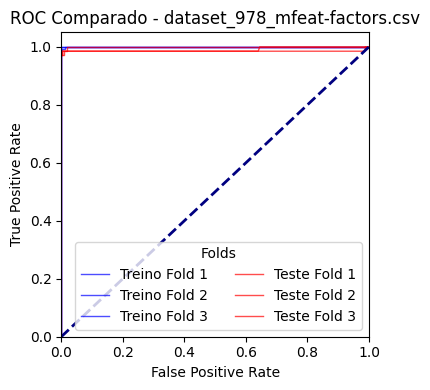


 -  Dataset: dataset_947_arsenic-male-bladder.csv
AUC médio (treino): 0.8910 ± 0.0354
AUC médio (teste):  0.8052 ± 0.1441


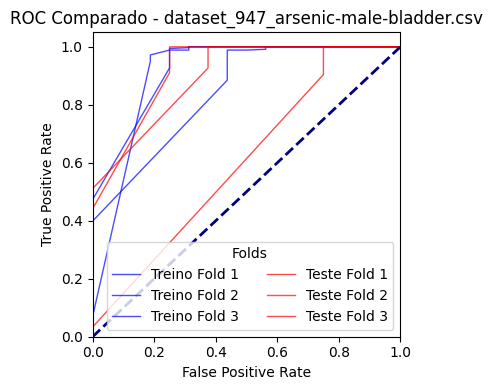


 -  Dataset: dataset_1004_synthetic_control.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  1.0000 ± 0.0000


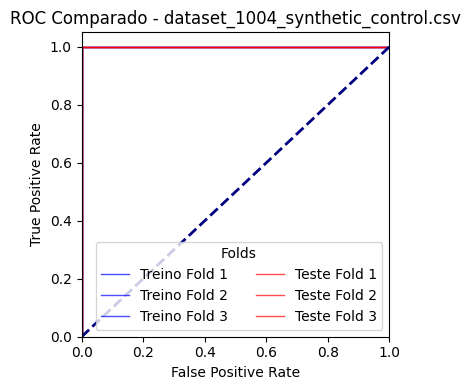


 -  Dataset: dataset_1056_mc1.csv
AUC médio (treino): 0.7945 ± 0.2104
AUC médio (teste):  0.7217 ± 0.1611


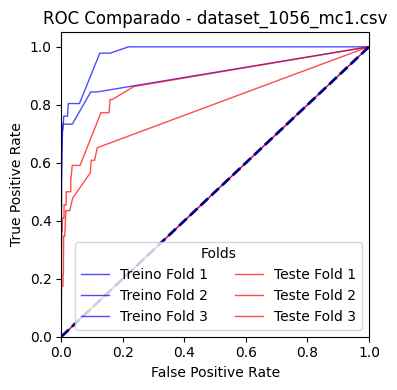


 -  Dataset: dataset_940_water-treatment.csv
AUC médio (treino): 0.9999 ± 0.0002
AUC médio (teste):  0.9689 ± 0.0281


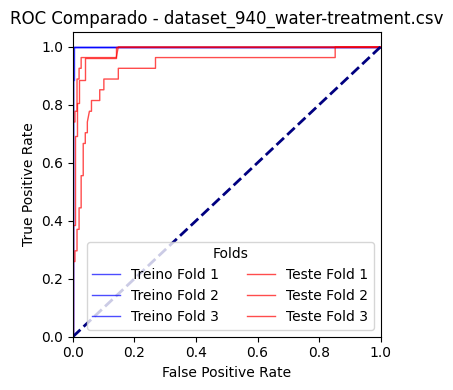


 -  Dataset: dataset_950_arsenic-female-lung.csv
AUC médio (treino): 0.9317 ± 0.0448
AUC médio (teste):  0.8122 ± 0.0519


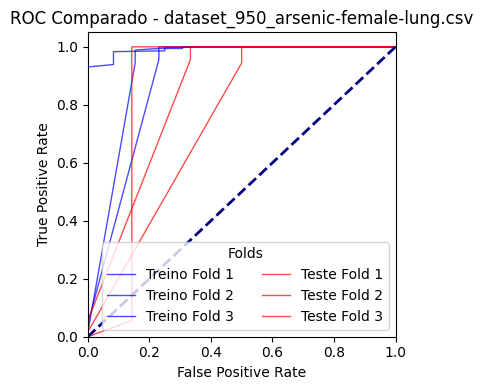


 -  Dataset: dataset_1014_analcatdata_dmft.csv
AUC médio (treino): 0.5000 ± 0.0000
AUC médio (teste):  0.5000 ± 0.0000


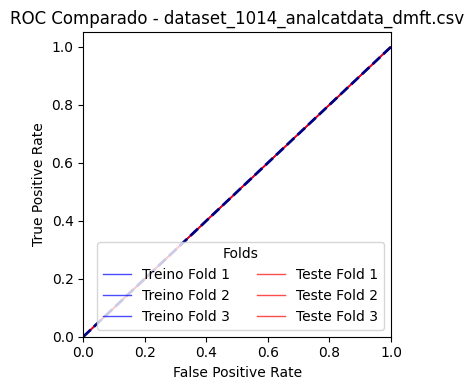


 -  Dataset: dataset_1039_hiva_agnostic.csv
AUC médio (treino): 0.5237 ± 0.0335
AUC médio (teste):  0.5103 ± 0.0146


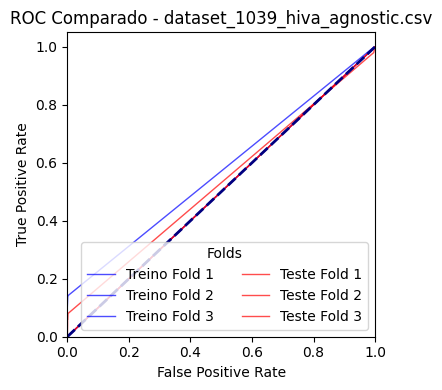


 -  Dataset: dataset_1018_ipums_la_99-small.csv
AUC médio (treino): 0.8802 ± 0.0204
AUC médio (teste):  0.8637 ± 0.0127


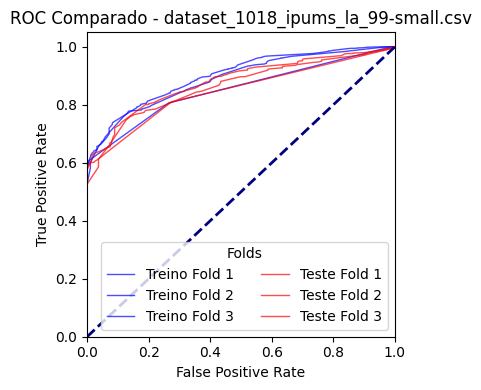


 -  Dataset: dataset_1002_ipums_la_98-small.csv
AUC médio (treino): 0.8271 ± 0.0073
AUC médio (teste):  0.8098 ± 0.0037


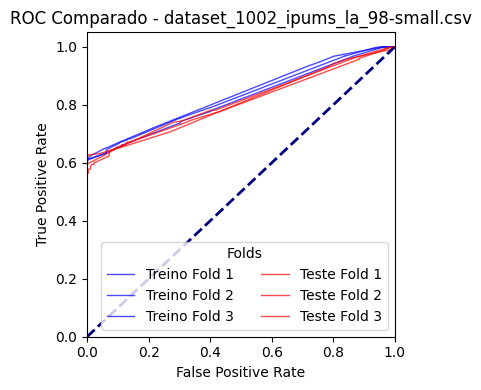


 -  Dataset: dataset_765_analcatdata_apnea2.csv
AUC médio (treino): 0.9363 ± 0.0134
AUC médio (teste):  0.8923 ± 0.0202


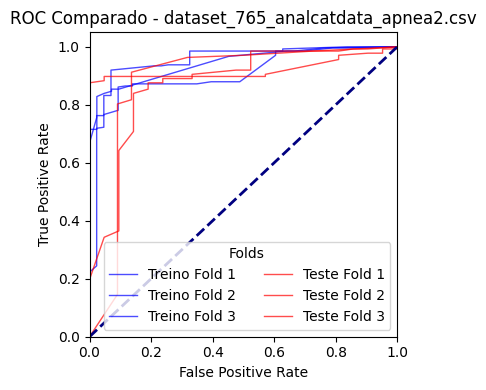


 -  Dataset: dataset_1016_vowel.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9999 ± 0.0001


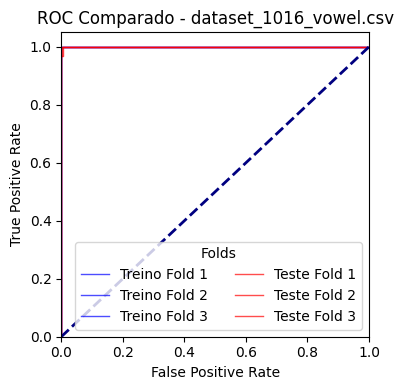


 -  Dataset: dataset_1045_kc1-top5.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.8183 ± 0.1585


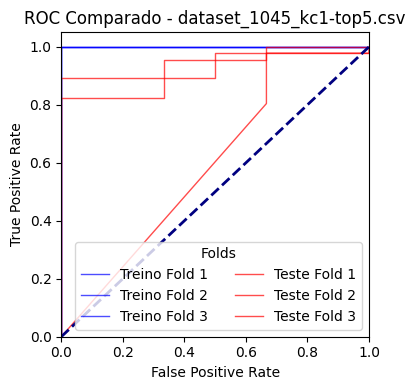


 -  Dataset: dataset_1013_analcatdata_challenger.csv
AUC médio (treino): 0.8521 ± 0.0258
AUC médio (teste):  0.6305 ± 0.0702


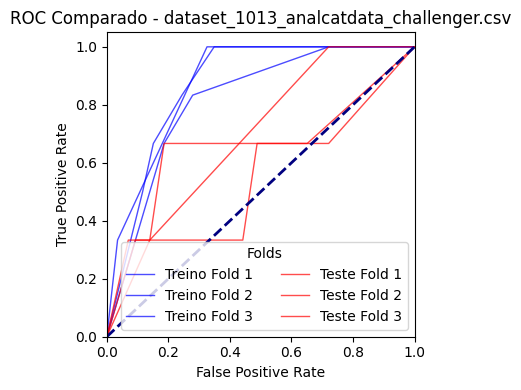


 -  Dataset: dataset_450_analcatdata_lawsuit.csv
AUC médio (treino): 0.9987 ± 0.0004
AUC médio (teste):  0.9710 ± 0.0375


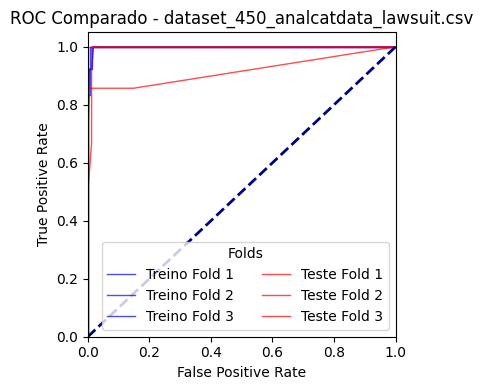


 -  Dataset: dataset_312_scene.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9434 ± 0.0126


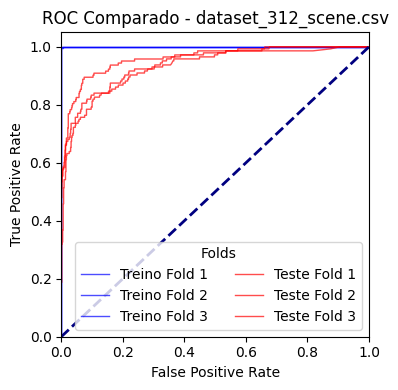


 -  Dataset: dataset_995_mfeat-zernike.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9918 ± 0.0102


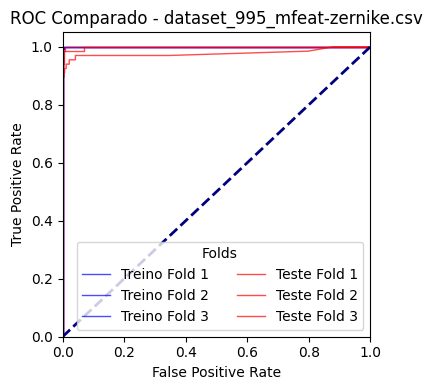


 -  Dataset: dataset_764_analcatdata_apnea3.csv
AUC médio (treino): 0.9233 ± 0.0131
AUC médio (teste):  0.8406 ± 0.0320


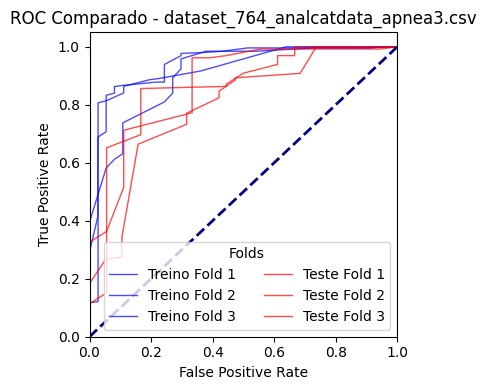


 -  Dataset: dataset_311_oil_spill.csv
AUC médio (treino): 0.9979 ± 0.0011
AUC médio (teste):  0.8296 ± 0.0520


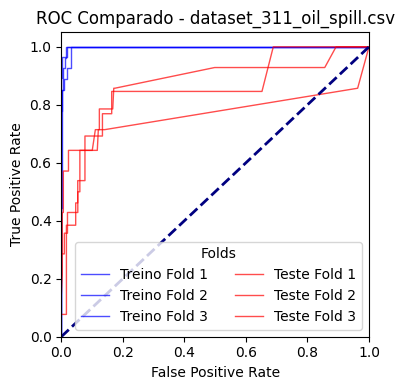


 -  Dataset: dataset_980_optdigits.csv
AUC médio (treino): 0.9999 ± 0.0000
AUC médio (teste):  0.9945 ± 0.0041


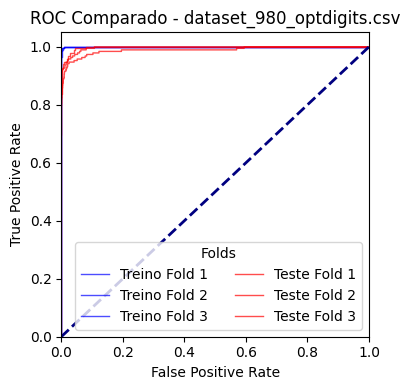


 -  Dataset: dataset_968_analcatdata_birthday.csv
AUC médio (treino): 0.9754 ± 0.0027
AUC médio (teste):  0.9340 ± 0.0034


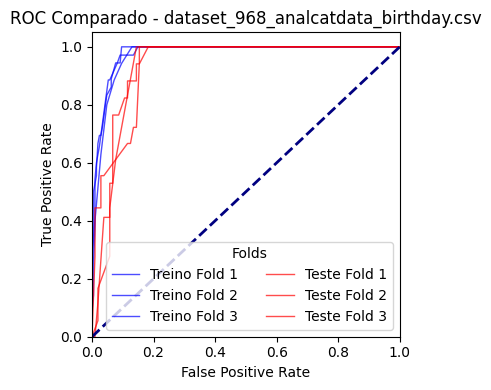


 -  Dataset: dataset_987_collins.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9970 ± 0.0042


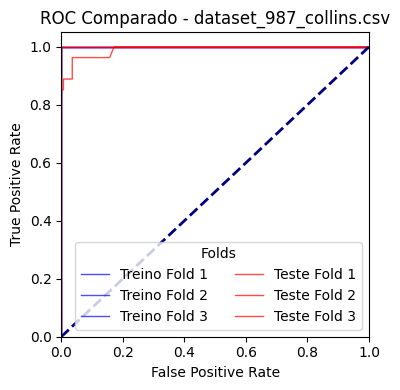


 -  Dataset: dataset_767_analcatdata_apnea1.csv
AUC médio (treino): 0.9341 ± 0.0199
AUC médio (teste):  0.8883 ± 0.0229


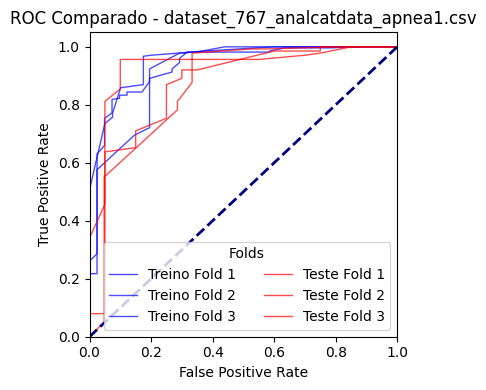


 -  Dataset: dataset_875_analcatdata_chlamydia.csv
AUC médio (treino): 0.9964 ± 0.0032
AUC médio (teste):  0.9953 ± 0.0034


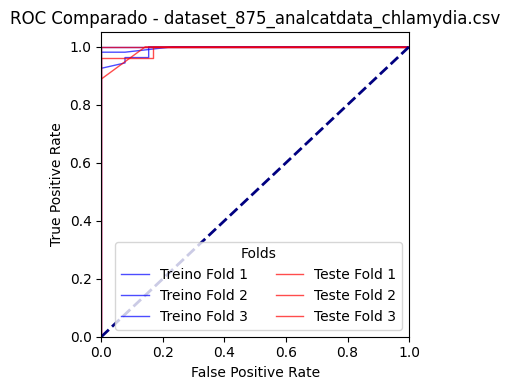


 -  Dataset: dataset_1061_ar4.csv
AUC médio (treino): 0.9893 ± 0.0050
AUC médio (teste):  0.8666 ± 0.1193


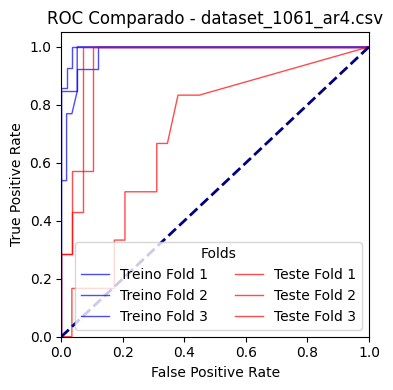


 -  Dataset: dataset_962_mfeat-morphological.csv
AUC médio (treino): 0.9952 ± 0.0022
AUC médio (teste):  0.9947 ± 0.0023


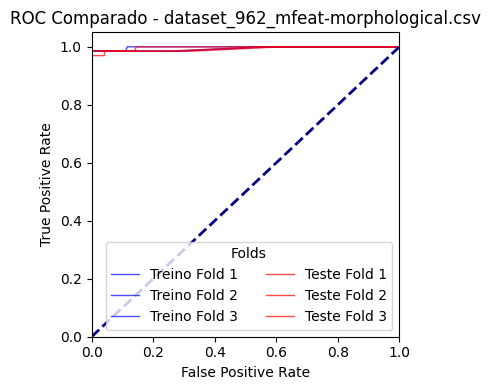


 -  Dataset: dataset_757_meta.csv
AUC médio (treino): 0.9098 ± 0.0175
AUC médio (teste):  0.7831 ± 0.0752


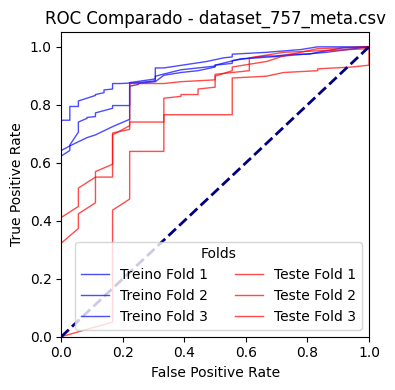


 -  Dataset: dataset_951_arsenic-male-lung.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  1.0000 ± 0.0000


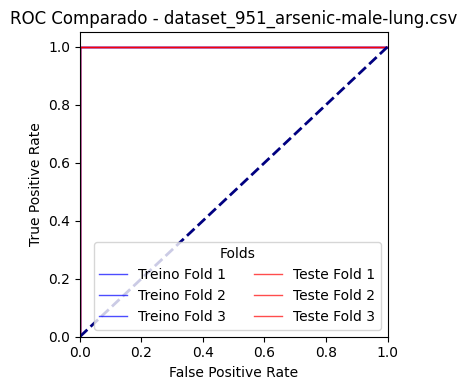


 -  Dataset: dataset_958_segment.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9998 ± 0.0003


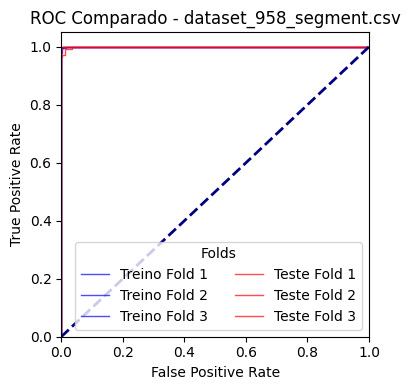


 -  Dataset: dataset_1064_ar6.csv
AUC médio (treino): 0.9942 ± 0.0030
AUC médio (teste):  0.6460 ± 0.0701


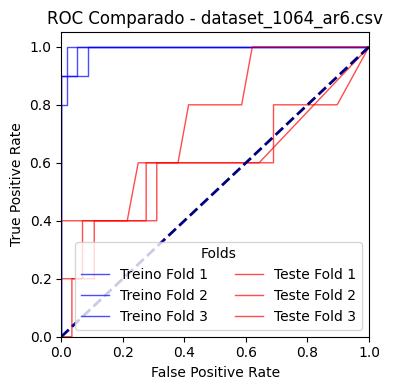


 -  Dataset: dataset_1050_pc3.csv
AUC médio (treino): 0.9709 ± 0.0029
AUC médio (teste):  0.8135 ± 0.0329


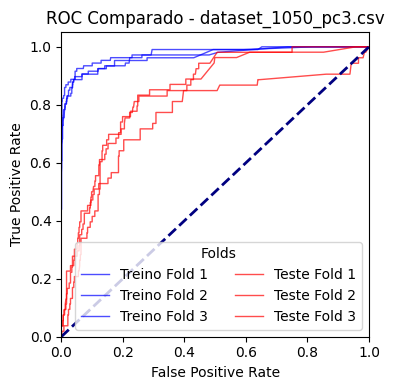


 -  Dataset: dataset_463_backache.csv
AUC médio (treino): 0.9929 ± 0.0069
AUC médio (teste):  0.6883 ± 0.0589


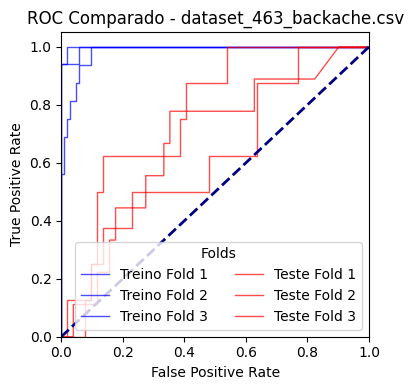


 -  Dataset: dataset_1000_hypothyroid.csv
AUC médio (treino): 0.9961 ± 0.0019
AUC médio (teste):  0.9926 ± 0.0041


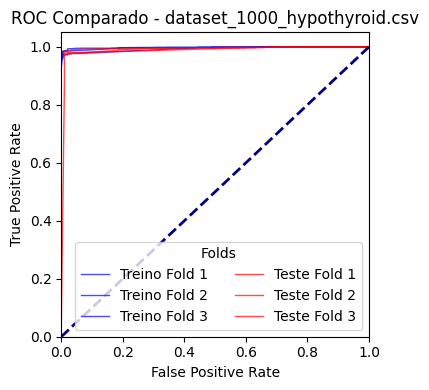


 -  Dataset: dataset_1049_pc4.csv
AUC médio (treino): 0.9962 ± 0.0010
AUC médio (teste):  0.9180 ± 0.0135


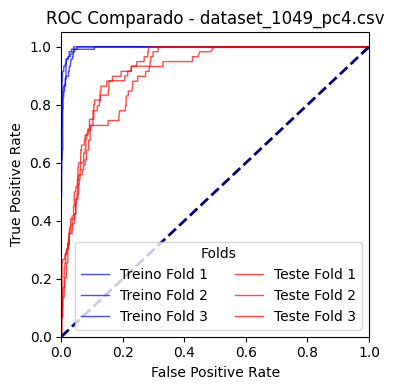


 -  Dataset: dataset_1023_soybean.csv
AUC médio (treino): 0.9996 ± 0.0001
AUC médio (teste):  0.9819 ± 0.0213


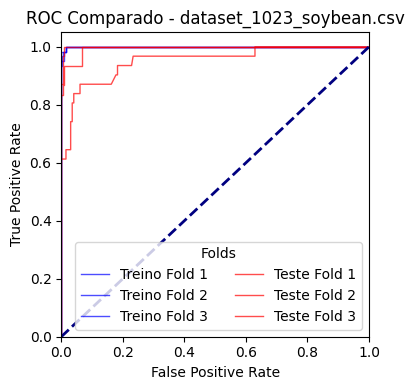


 -  Dataset: dataset_316_yeast_ml8.csv
AUC médio (treino): 0.8112 ± 0.0108
AUC médio (teste):  0.8057 ± 0.0146


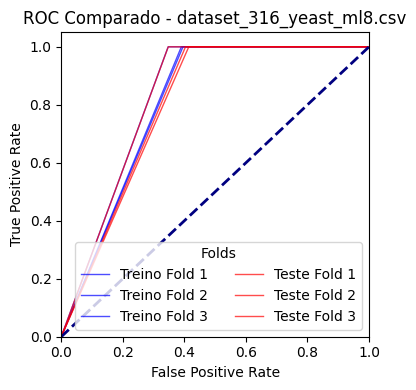


 -  Dataset: dataset_949_arsenic-female-bladder.csv
AUC médio (treino): 0.9448 ± 0.0225
AUC médio (teste):  0.8028 ± 0.0204


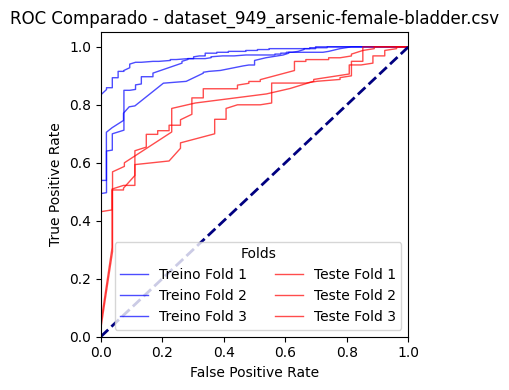


 -  Dataset: dataset_1022_mfeat-pixel.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9995 ± 0.0004


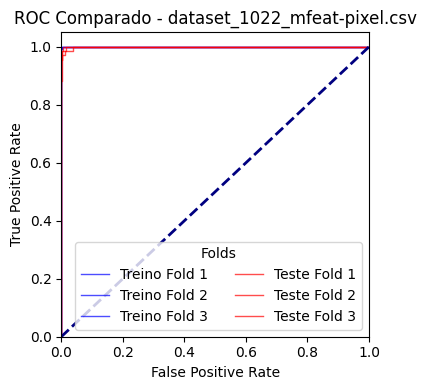


 -  Dataset: dataset_954_spectrometer.csv
AUC médio (treino): 0.9919 ± 0.0041
AUC médio (teste):  0.9271 ± 0.0150


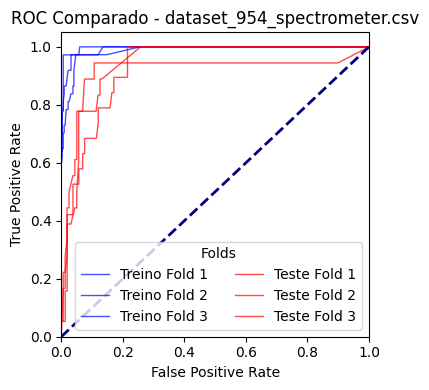


 -  Dataset: dataset_966_analcatdata_halloffame.csv
AUC médio (treino): 0.9986 ± 0.0013
AUC médio (teste):  0.9249 ± 0.0330


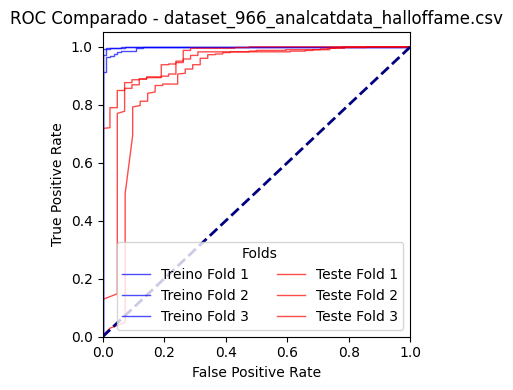


 -  Dataset: dataset_971_mfeat-fourier.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9998 ± 0.0002


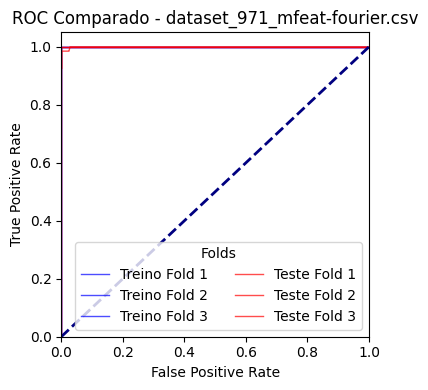


 -  Dataset: dataset_1065_kc3.csv
AUC médio (treino): 0.9731 ± 0.0154
AUC médio (teste):  0.7934 ± 0.0415


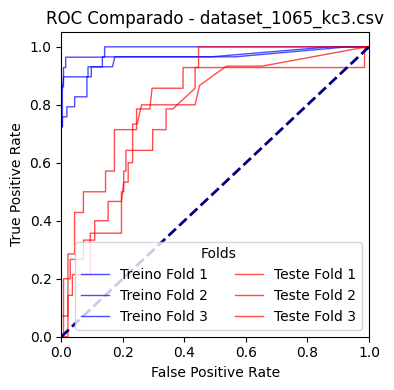


 -  Dataset: dataset_1021_page-blocks.csv
AUC médio (treino): 0.9984 ± 0.0006
AUC médio (teste):  0.9850 ± 0.0056


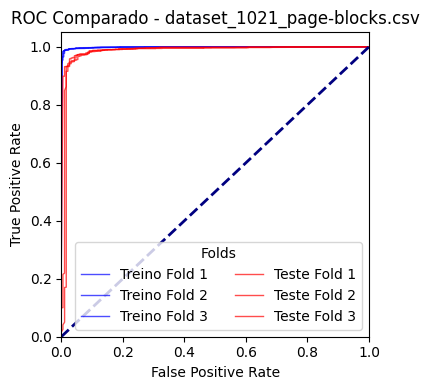


 -  Dataset: dataset_1020_mfeat-karhunen.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9928 ± 0.0009


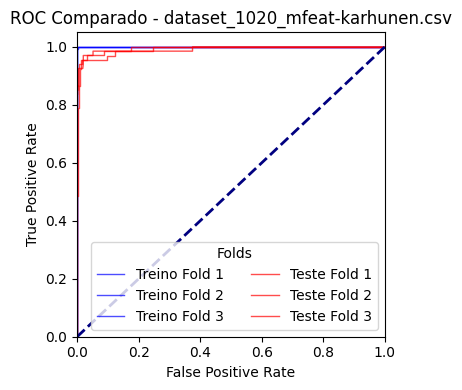


 -  Dataset: dataset_1059_ar1.csv
AUC médio (treino): 0.9955 ± 0.0036
AUC médio (teste):  0.7329 ± 0.0739


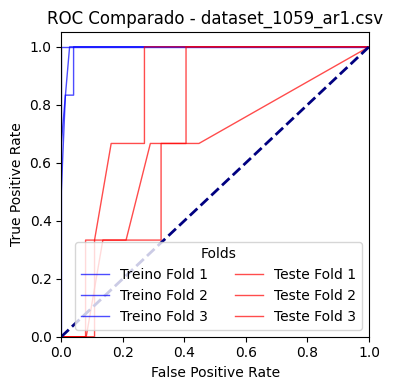


 -  Dataset: dataset_867_visualizing_livestock.csv
AUC médio (treino): 0.9476 ± 0.0117
AUC médio (teste):  0.7372 ± 0.0629


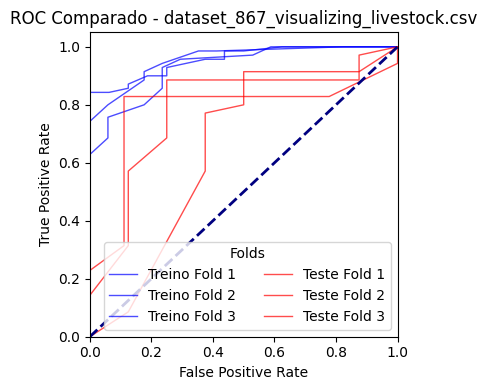


 -  Dataset: dataset_38_sick.csv
AUC médio (treino): 0.9735 ± 0.0085
AUC médio (teste):  0.9588 ± 0.0096


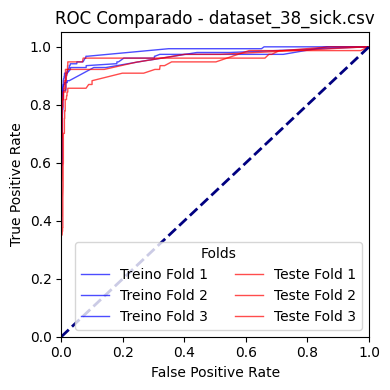


 -  Dataset: dataset_984_analcatdata_draft.csv
AUC médio (treino): 0.8542 ± 0.1521
AUC médio (teste):  0.5258 ± 0.0161


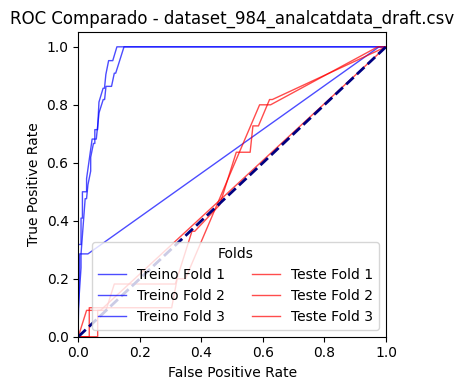


 -  Dataset: dataset_865_analcatdata_neavote.csv
AUC médio (treino): 0.6333 ± 0.1027
AUC médio (teste):  0.5896 ± 0.0979


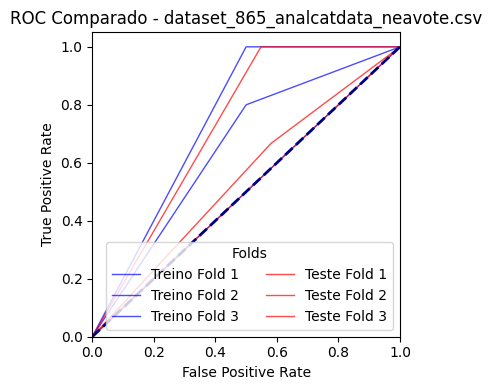


 -  Dataset: dataset_976_JapaneseVowels.csv
AUC médio (treino): 0.9998 ± 0.0001
AUC médio (teste):  0.9977 ± 0.0008


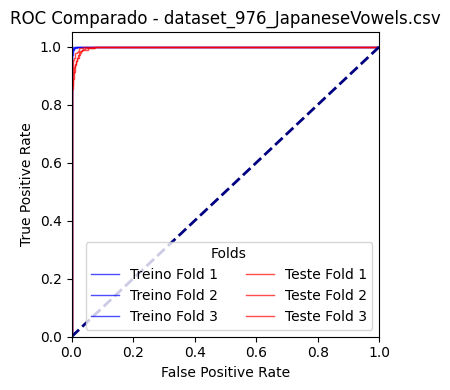

In [8]:

def calcular_auc(modelo, X_test, y_test):
    y_prob = modelo._predict(X_test)[:, 1]  # probabilidade da classe positiva (classe 1)
    fpr, tpr, _ = roc_curve(y_test, y_prob, pos_label=1)
    auc_score = auc(fpr, tpr)
    return auc_score, fpr, tpr

def plot_roc_comparado(fpr_treino_all, tpr_treino_all, fpr_teste_all, tpr_teste_all, filename):
    plt.figure(figsize=(4, 4))  # Gráfico pequeno
    for i in range(len(fpr_treino_all)):
        plt.plot(fpr_treino_all[i], tpr_treino_all[i], lw=1, alpha=0.7, label=f"Treino Fold {i+1}", color='blue')
    
    for i in range(len(fpr_teste_all)):
        plt.plot(fpr_teste_all[i], tpr_teste_all[i], lw=1, alpha=0.7, label=f"Teste Fold {i+1}", color='red')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Comparado - {filename}')
    plt.legend(loc="lower right", title="Folds", ncol=2)
    plt.tight_layout()
    plt.show()

def avaliar_auc_por_dataset_tratado(datasets_tratados):
    for filename, (X, y) in datasets_tratados.items():
        try:
            kf = StratifiedKFold(n_splits=3, shuffle=True)
            fpr_teste_all, tpr_teste_all, auc_scores_teste = [], [], []
            fpr_treino_all, tpr_treino_all, auc_scores_treino = [], [], []

            for train_idx, test_idx in kf.split(X, y):
                X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
                y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

                le = LabelEncoder()
                y_train = le.fit_transform(y_train)
                y_test = le.transform(y_test)

                X_train = X_train.to_numpy()
                X_test= X_test.to_numpy()

                modelo =  RandomForestClassifier(max_depth=None, min_samples_split=10)  
                modelo.fit(X_train, y_train)

                # AUC Teste
                auc_teste, fpr_teste, tpr_teste = calcular_auc(modelo, X_test, y_test)
                auc_scores_teste.append(auc_teste)
                fpr_teste_all.append(fpr_teste)
                tpr_teste_all.append(tpr_teste)

                # AUC Treino
                auc_treino, fpr_treino, tpr_treino = calcular_auc(modelo, X_train, y_train)
                auc_scores_treino.append(auc_treino)
                fpr_treino_all.append(fpr_treino)
                tpr_treino_all.append(tpr_treino)

            # Mostrar resultados
            print(f"\n -  Dataset: {filename}")
            print(f"AUC médio (treino): {np.mean(auc_scores_treino):.4f} ± {np.std(auc_scores_treino):.4f}")
            print(f"AUC médio (teste):  {np.mean(auc_scores_teste):.4f} ± {np.std(auc_scores_teste):.4f}")

            # Gráfico
            plot_roc_comparado(fpr_treino_all, tpr_treino_all, fpr_teste_all, tpr_teste_all, filename)

        except Exception as e:
            print(f"\n⚠️ Erro ao processar o dataset {filename}: {e}")


avaliar_auc_por_dataset_tratado(tratados)


=== Matriz de confusão e gráfico precision-recall para dataset_978_mfeat-factors.csv ===


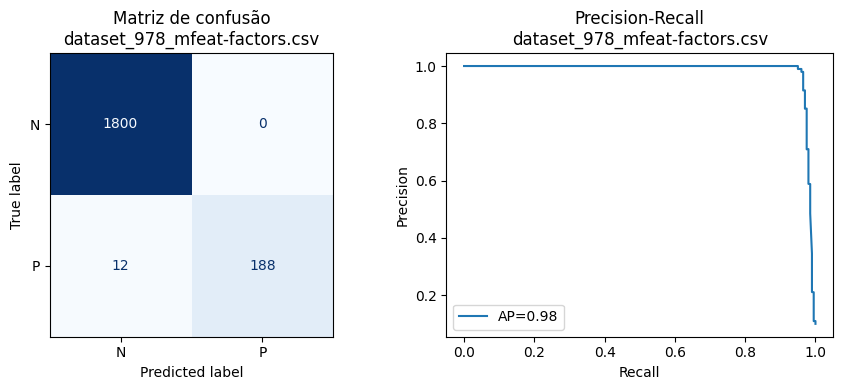


=== Matriz de confusão e gráfico precision-recall para dataset_947_arsenic-male-bladder.csv ===


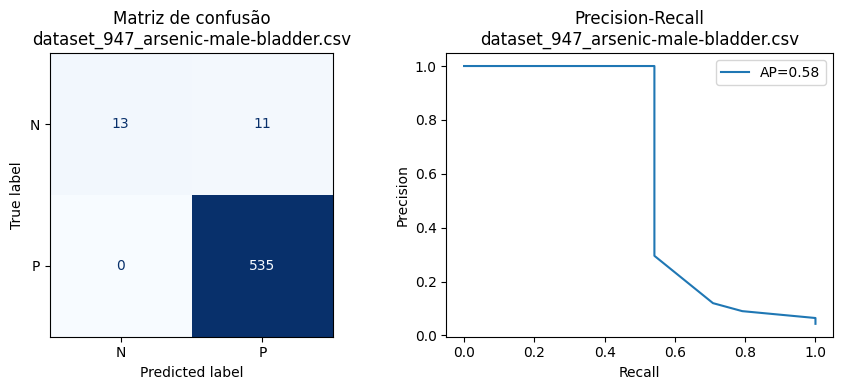


=== Matriz de confusão e gráfico precision-recall para dataset_1004_synthetic_control.csv ===


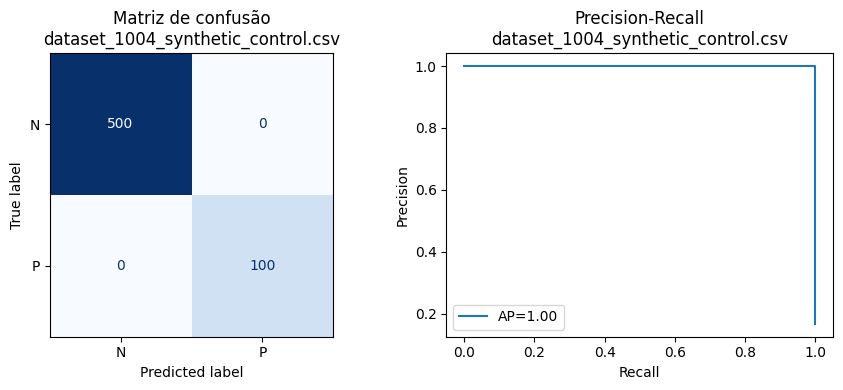


=== Matriz de confusão e gráfico precision-recall para dataset_1056_mc1.csv ===


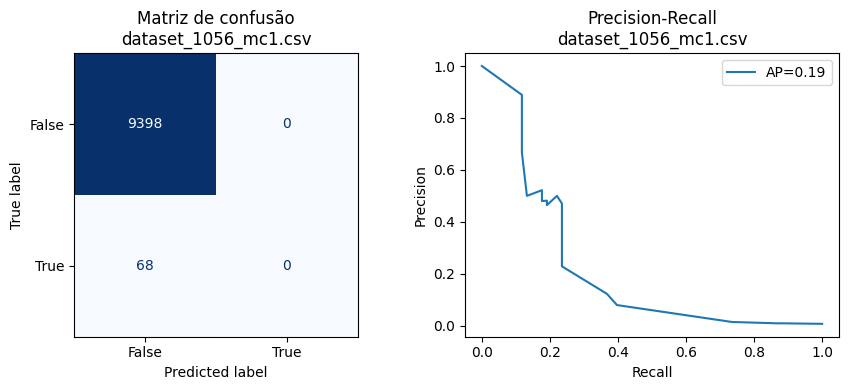


=== Matriz de confusão e gráfico precision-recall para dataset_940_water-treatment.csv ===


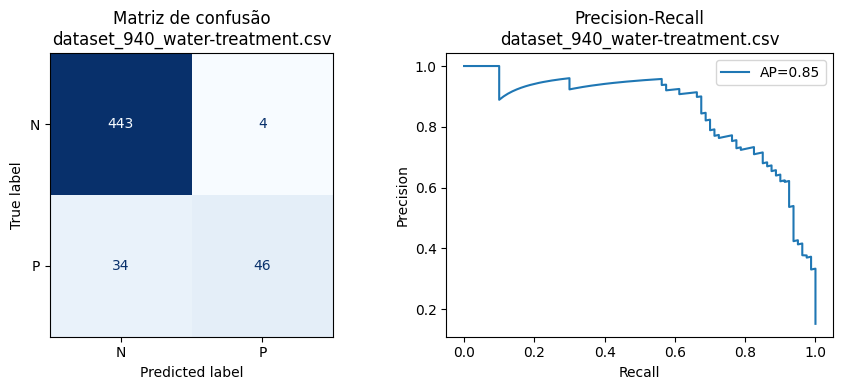


=== Matriz de confusão e gráfico precision-recall para dataset_950_arsenic-female-lung.csv ===


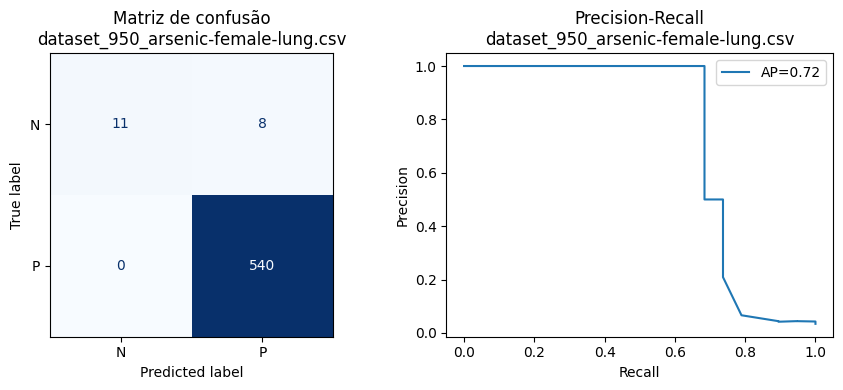


=== Matriz de confusão e gráfico precision-recall para dataset_1014_analcatdata_dmft.csv ===


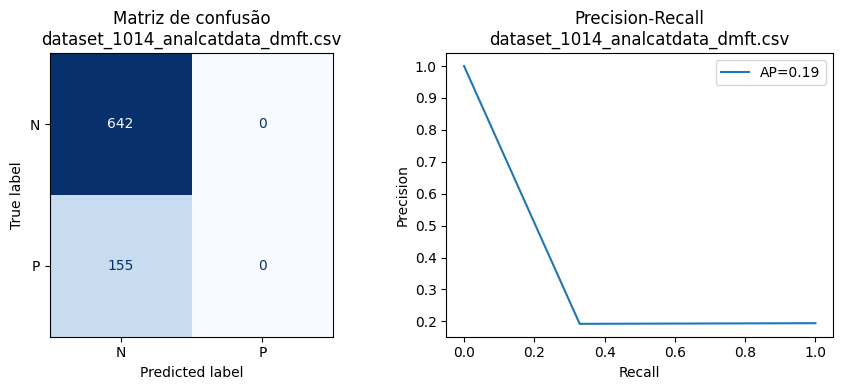


=== Matriz de confusão e gráfico precision-recall para dataset_1039_hiva_agnostic.csv ===


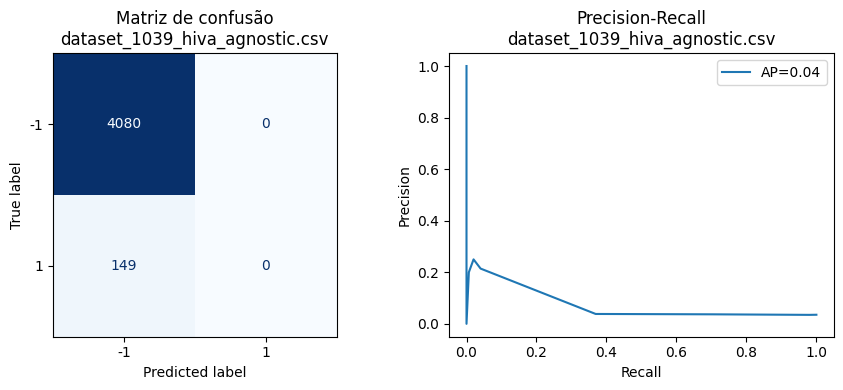


=== Matriz de confusão e gráfico precision-recall para dataset_1018_ipums_la_99-small.csv ===


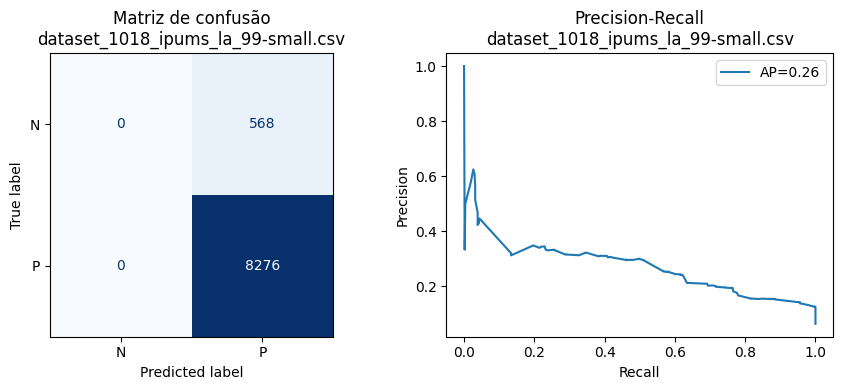


=== Matriz de confusão e gráfico precision-recall para dataset_1002_ipums_la_98-small.csv ===


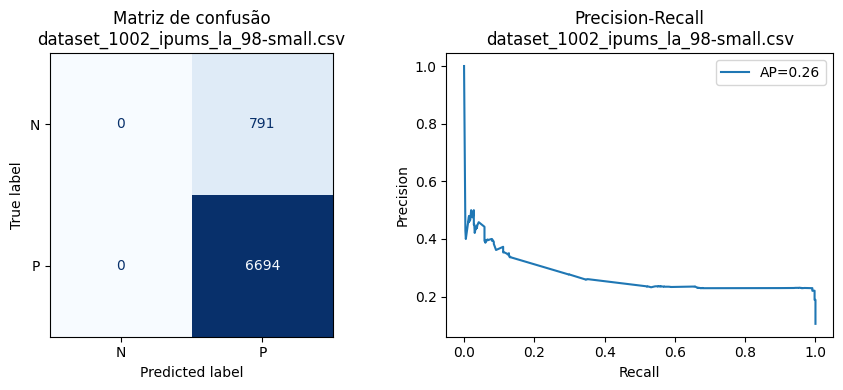


=== Matriz de confusão e gráfico precision-recall para dataset_765_analcatdata_apnea2.csv ===


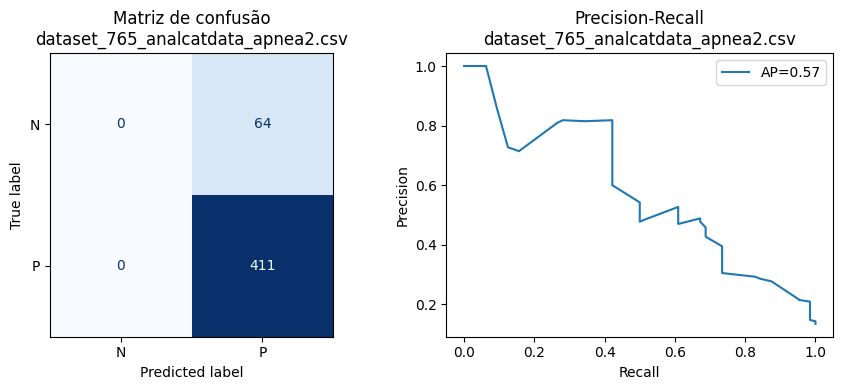


=== Matriz de confusão e gráfico precision-recall para dataset_1016_vowel.csv ===


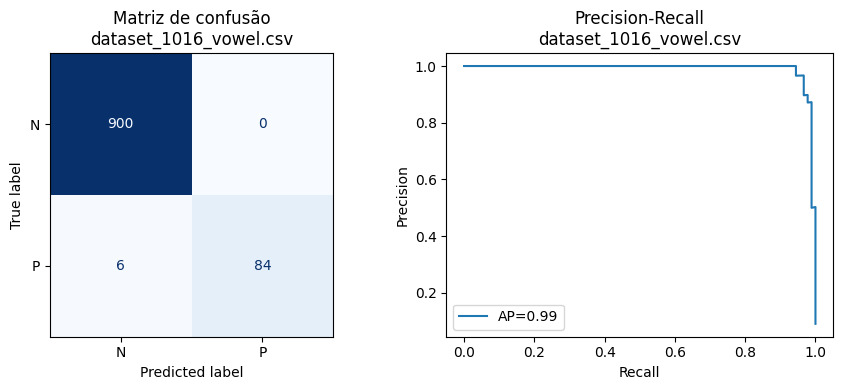


=== Matriz de confusão e gráfico precision-recall para dataset_1045_kc1-top5.csv ===


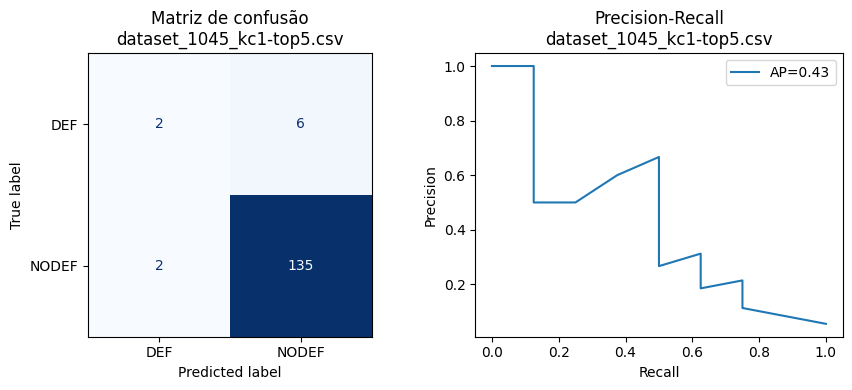


=== Matriz de confusão e gráfico precision-recall para dataset_1013_analcatdata_challenger.csv ===


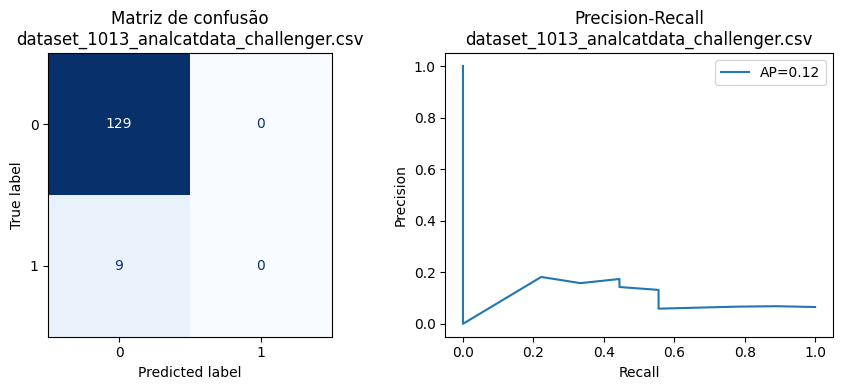


=== Matriz de confusão e gráfico precision-recall para dataset_450_analcatdata_lawsuit.csv ===


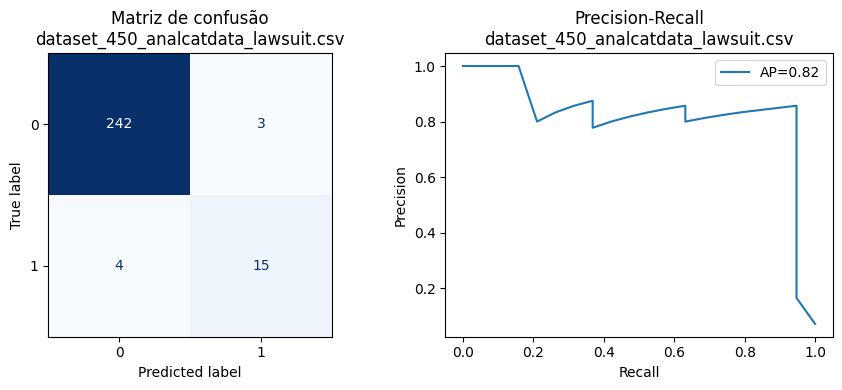


=== Matriz de confusão e gráfico precision-recall para dataset_312_scene.csv ===


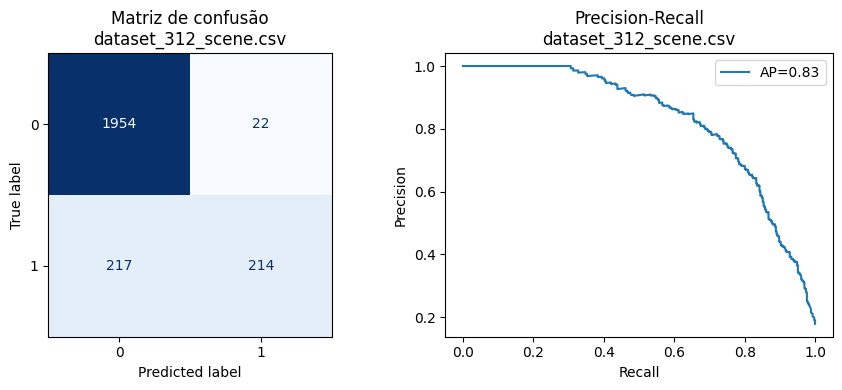


=== Matriz de confusão e gráfico precision-recall para dataset_995_mfeat-zernike.csv ===


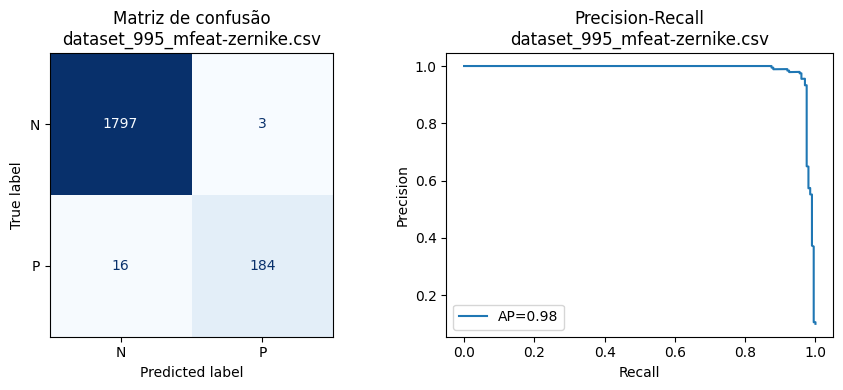


=== Matriz de confusão e gráfico precision-recall para dataset_764_analcatdata_apnea3.csv ===


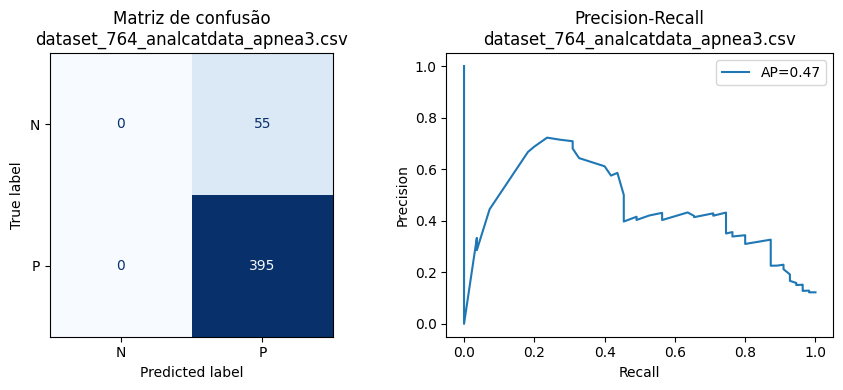


=== Matriz de confusão e gráfico precision-recall para dataset_311_oil_spill.csv ===


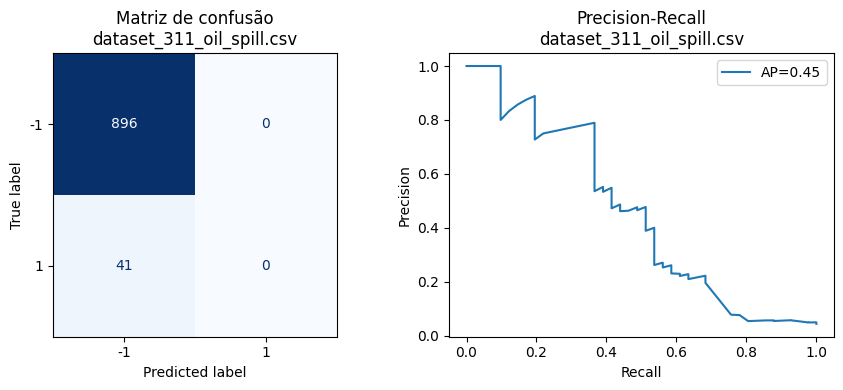


=== Matriz de confusão e gráfico precision-recall para dataset_980_optdigits.csv ===


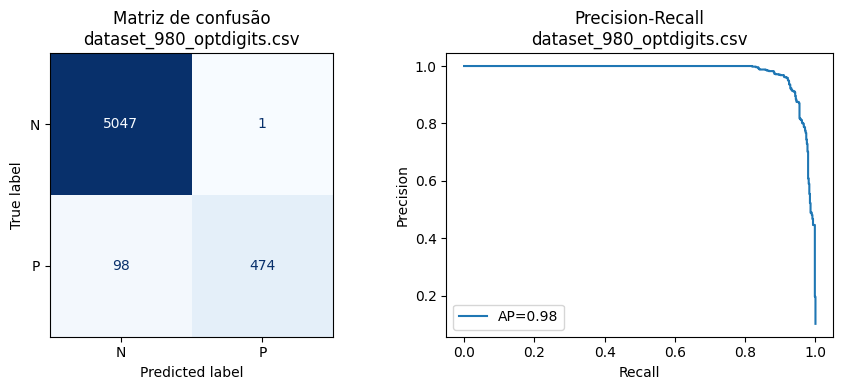


=== Matriz de confusão e gráfico precision-recall para dataset_968_analcatdata_birthday.csv ===


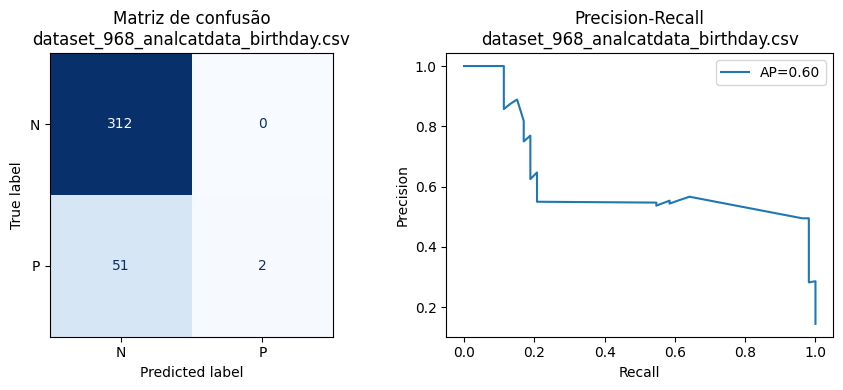


=== Matriz de confusão e gráfico precision-recall para dataset_987_collins.csv ===


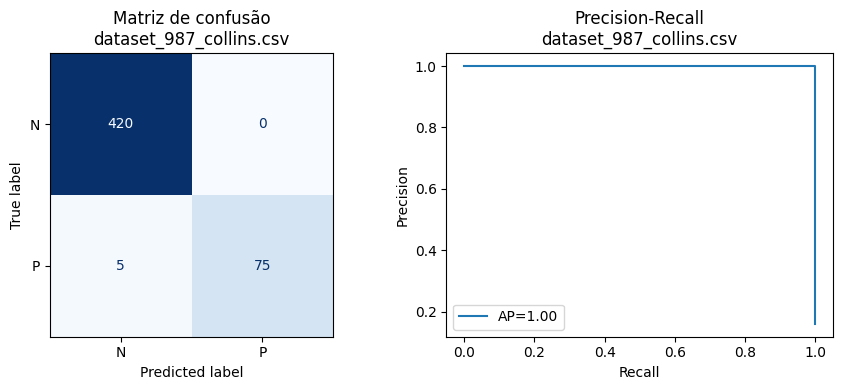


=== Matriz de confusão e gráfico precision-recall para dataset_767_analcatdata_apnea1.csv ===


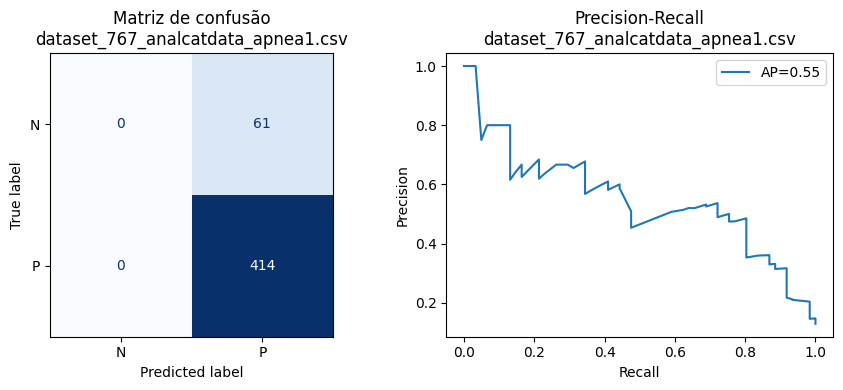


=== Matriz de confusão e gráfico precision-recall para dataset_875_analcatdata_chlamydia.csv ===


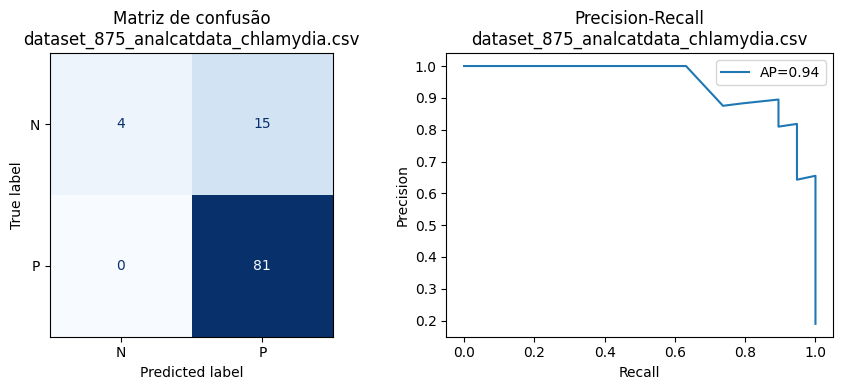


=== Matriz de confusão e gráfico precision-recall para dataset_1061_ar4.csv ===


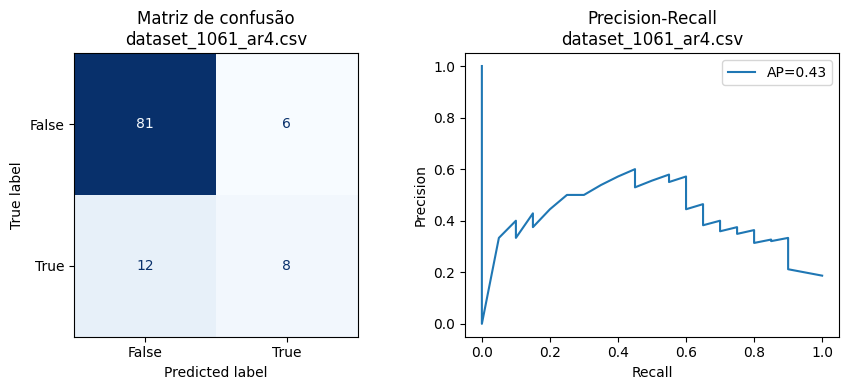


=== Matriz de confusão e gráfico precision-recall para dataset_962_mfeat-morphological.csv ===


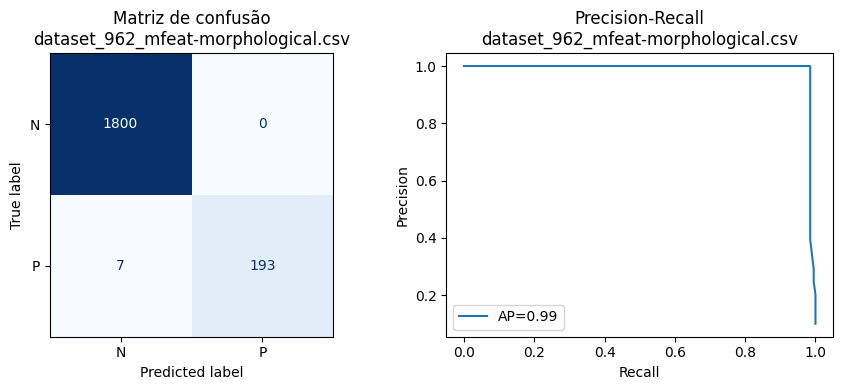


=== Matriz de confusão e gráfico precision-recall para dataset_757_meta.csv ===


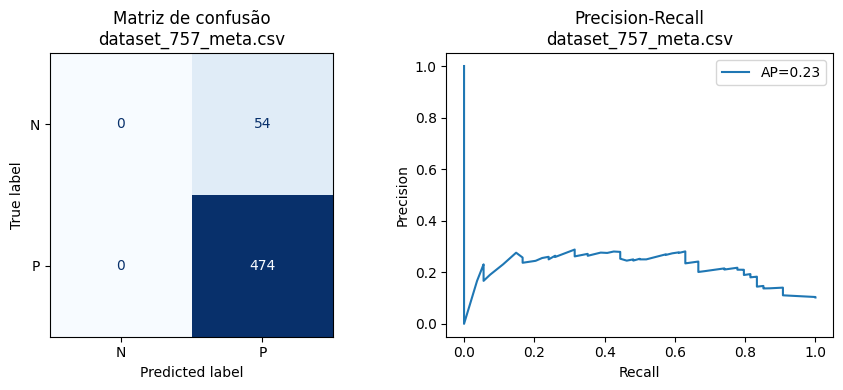


=== Matriz de confusão e gráfico precision-recall para dataset_951_arsenic-male-lung.csv ===


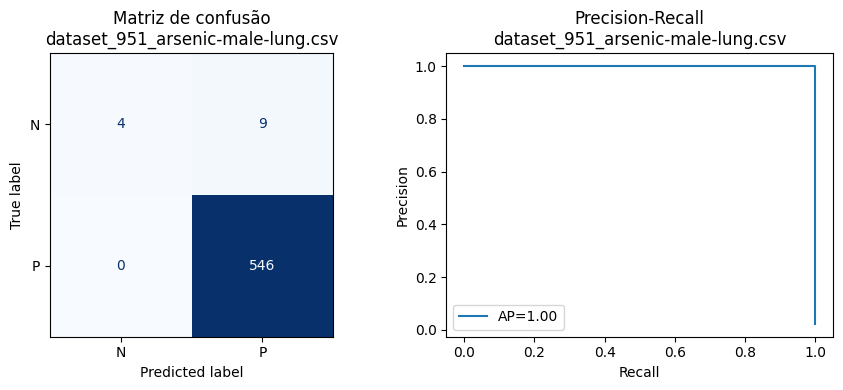


=== Matriz de confusão e gráfico precision-recall para dataset_958_segment.csv ===


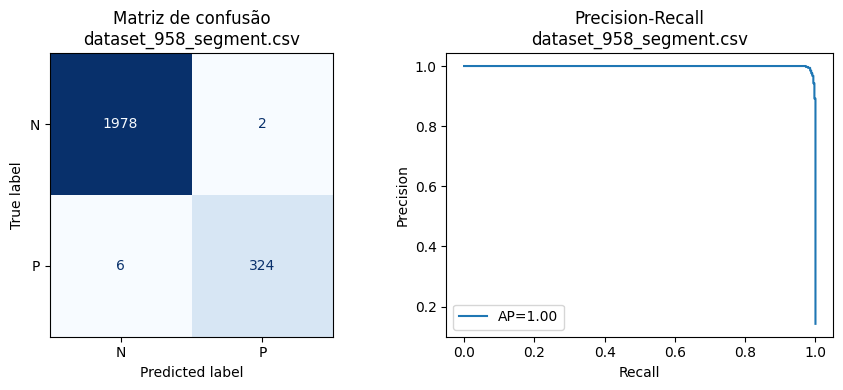


=== Matriz de confusão e gráfico precision-recall para dataset_1064_ar6.csv ===


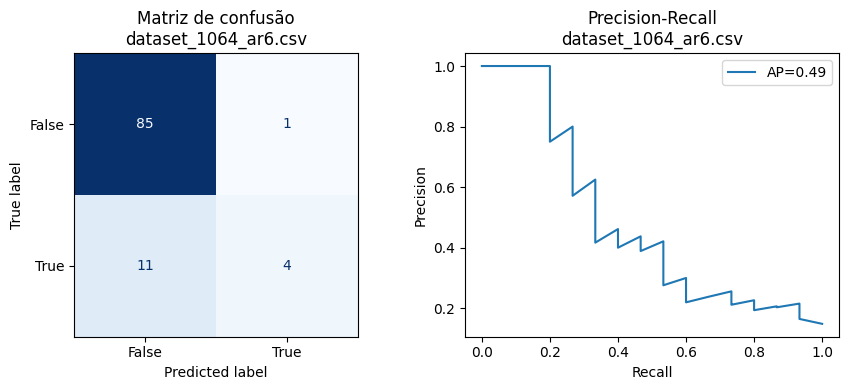


=== Matriz de confusão e gráfico precision-recall para dataset_1050_pc3.csv ===


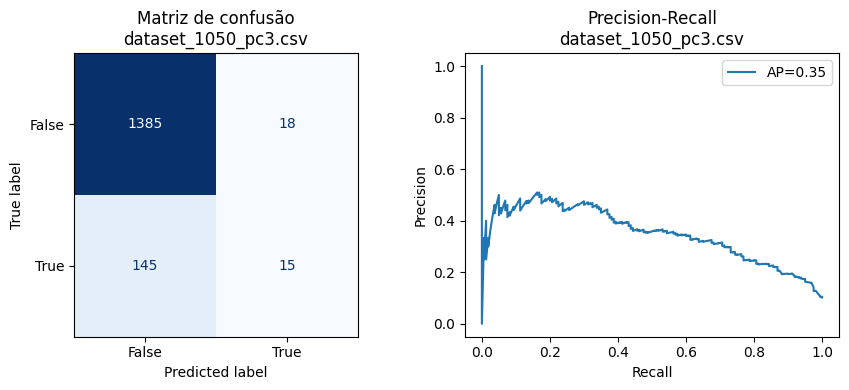


=== Matriz de confusão e gráfico precision-recall para dataset_463_backache.csv ===


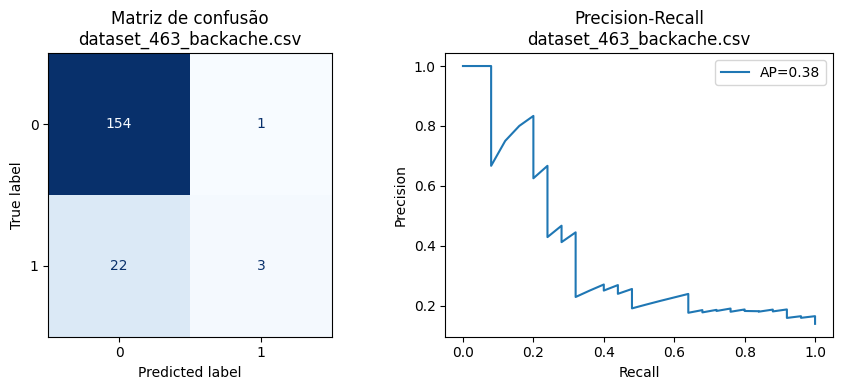


=== Matriz de confusão e gráfico precision-recall para dataset_1000_hypothyroid.csv ===


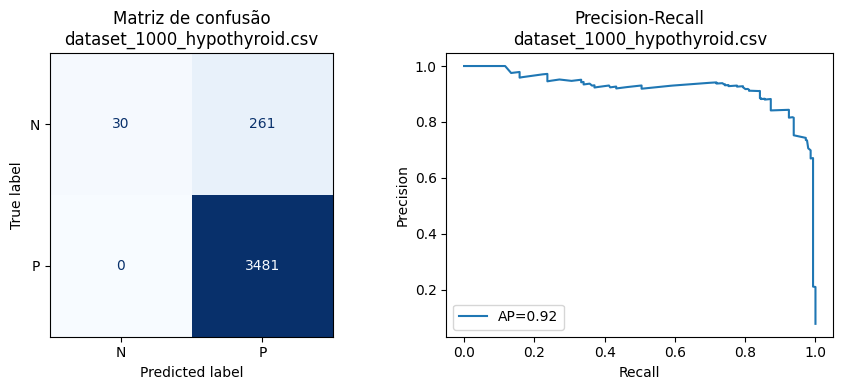


=== Matriz de confusão e gráfico precision-recall para dataset_1049_pc4.csv ===


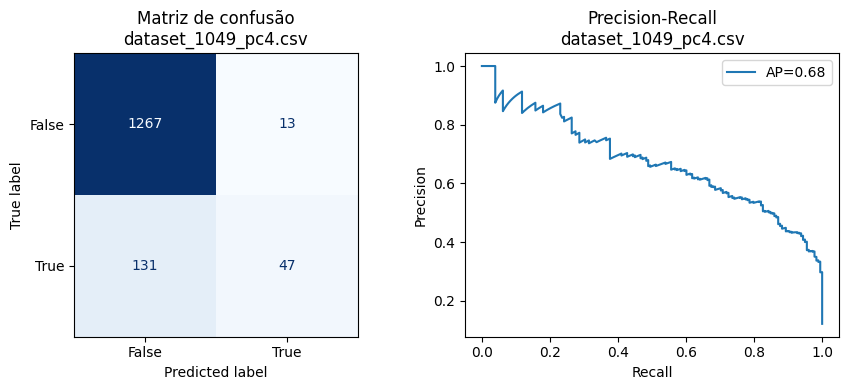


=== Matriz de confusão e gráfico precision-recall para dataset_1023_soybean.csv ===


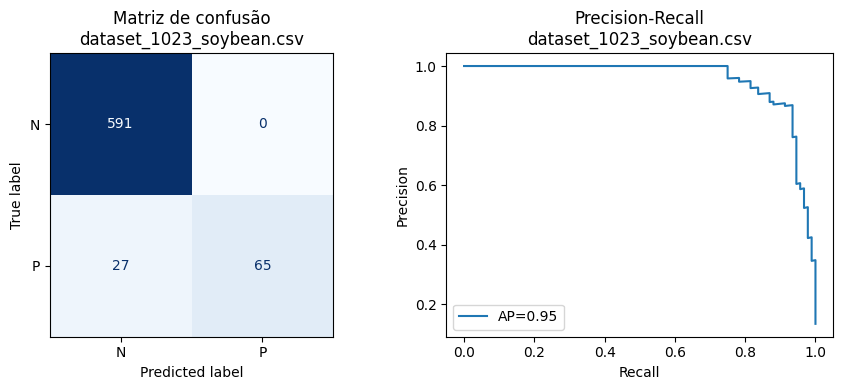


=== Matriz de confusão e gráfico precision-recall para dataset_316_yeast_ml8.csv ===


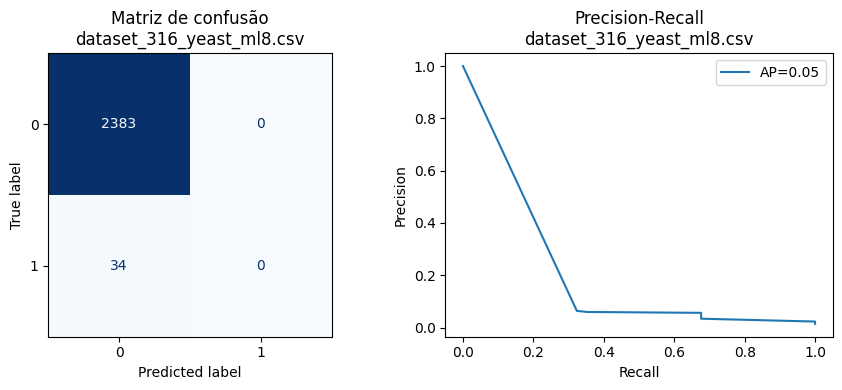


=== Matriz de confusão e gráfico precision-recall para dataset_949_arsenic-female-bladder.csv ===


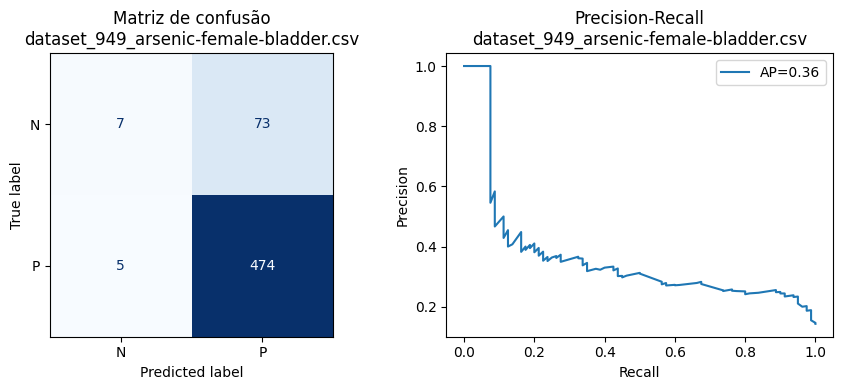


=== Matriz de confusão e gráfico precision-recall para dataset_1022_mfeat-pixel.csv ===


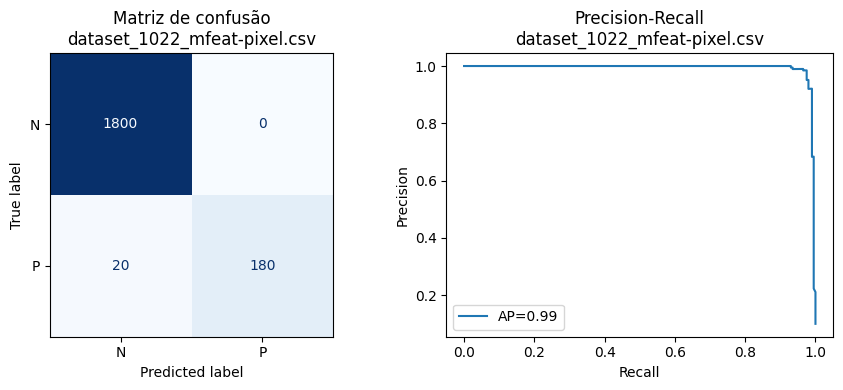


=== Matriz de confusão e gráfico precision-recall para dataset_954_spectrometer.csv ===


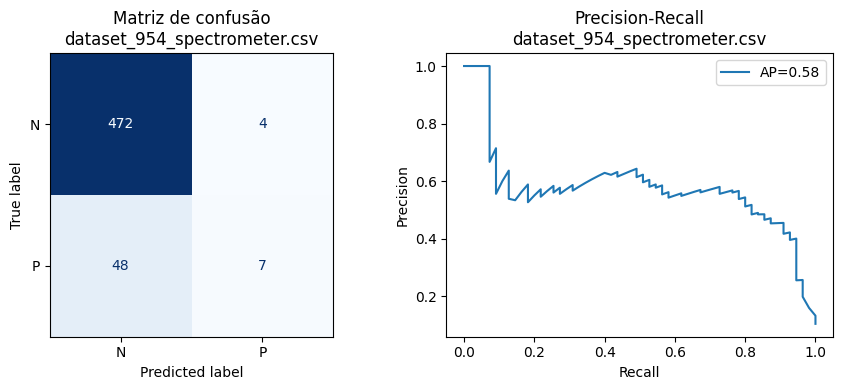


=== Matriz de confusão e gráfico precision-recall para dataset_966_analcatdata_halloffame.csv ===


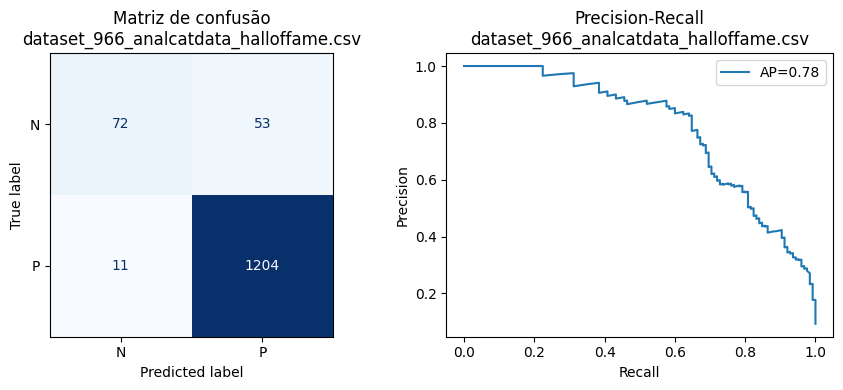


=== Matriz de confusão e gráfico precision-recall para dataset_971_mfeat-fourier.csv ===


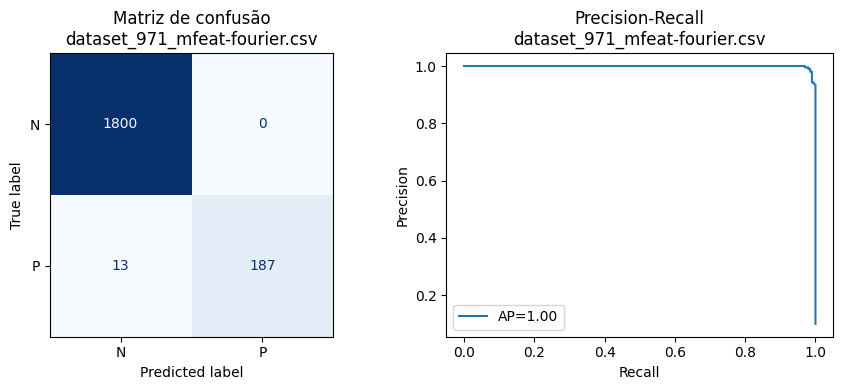


=== Matriz de confusão e gráfico precision-recall para dataset_1065_kc3.csv ===


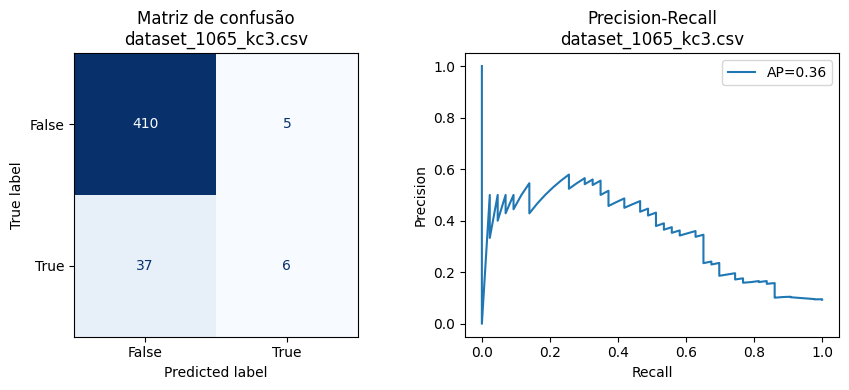


=== Matriz de confusão e gráfico precision-recall para dataset_1021_page-blocks.csv ===


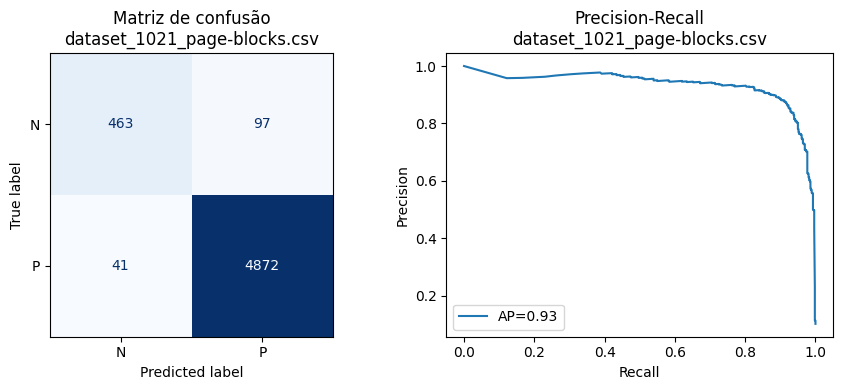


=== Matriz de confusão e gráfico precision-recall para dataset_1020_mfeat-karhunen.csv ===


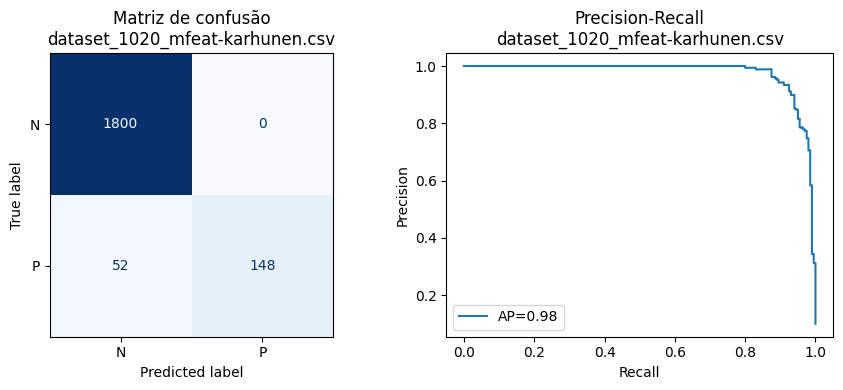


=== Matriz de confusão e gráfico precision-recall para dataset_1059_ar1.csv ===


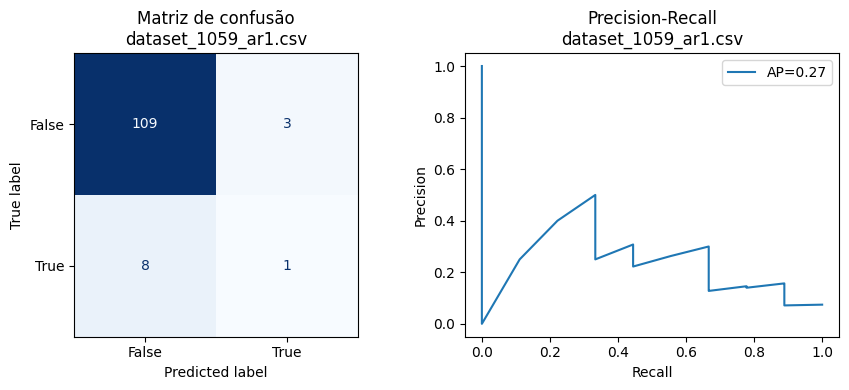


=== Matriz de confusão e gráfico precision-recall para dataset_867_visualizing_livestock.csv ===


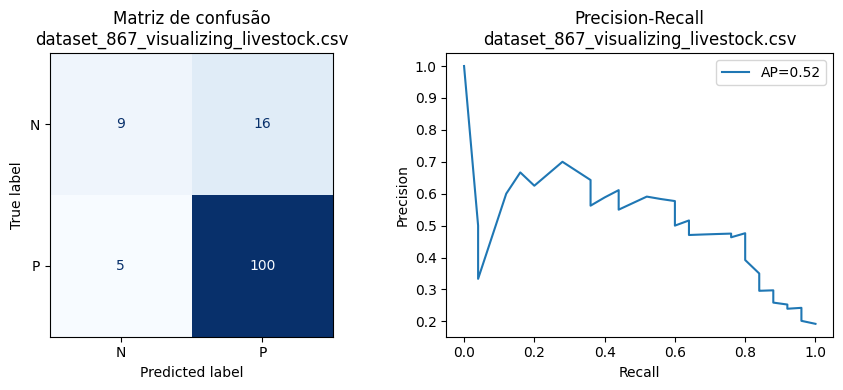


=== Matriz de confusão e gráfico precision-recall para dataset_38_sick.csv ===


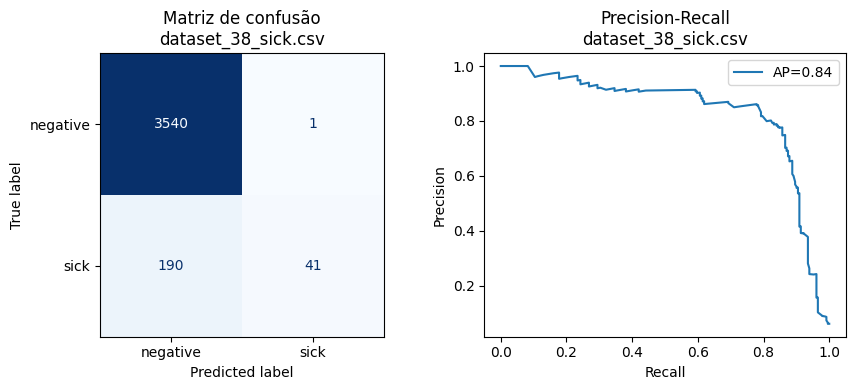


=== Matriz de confusão e gráfico precision-recall para dataset_984_analcatdata_draft.csv ===


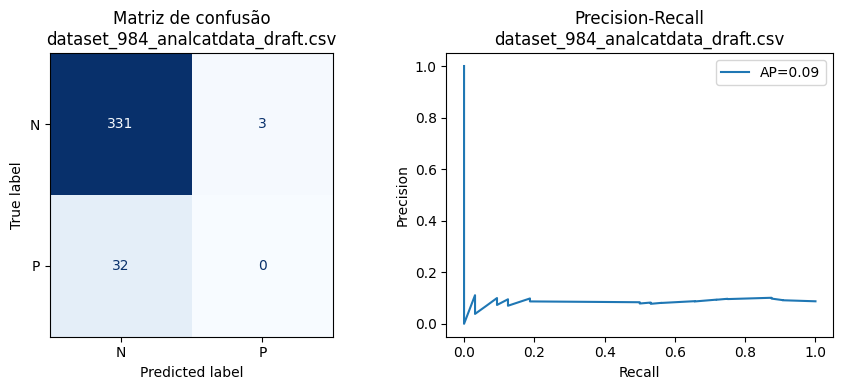


=== Matriz de confusão e gráfico precision-recall para dataset_865_analcatdata_neavote.csv ===


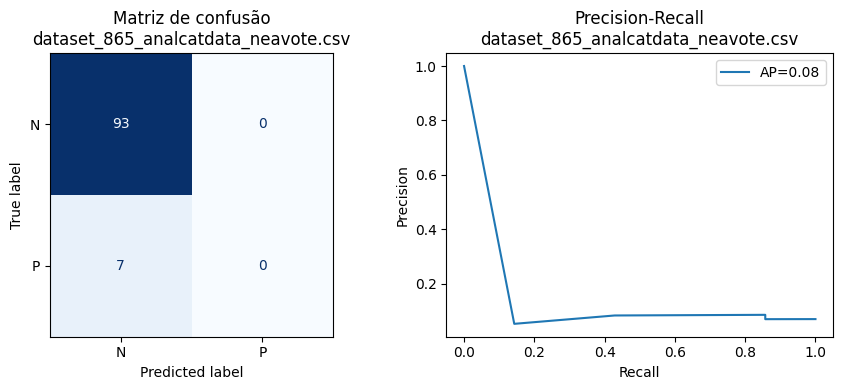


=== Matriz de confusão e gráfico precision-recall para dataset_976_JapaneseVowels.csv ===


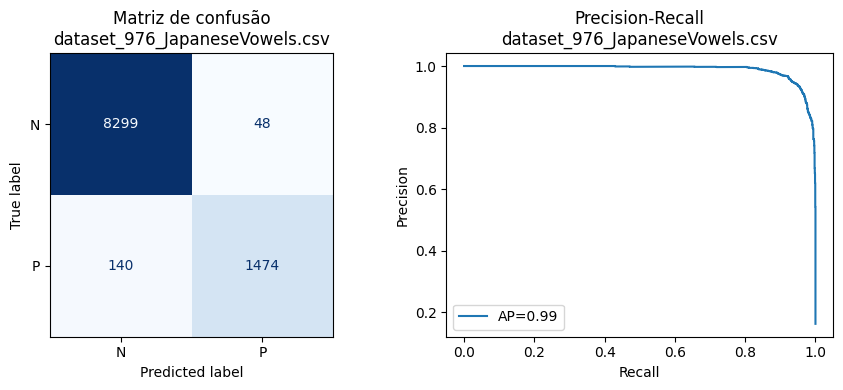

In [9]:
def plot_precision_recall(y_true, y_scores, nome_dataset="", pos_label=1):
    precision, recall, _ = precision_recall_curve(y_true, y_scores, pos_label=pos_label)
    ap = average_precision_score(y_true, y_scores, pos_label=pos_label)
    plt.figure()
    plt.plot(recall, precision, label=f'AP={ap:.2f}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve - {nome_dataset}')
    plt.legend()
    plt.show()

def matriz_confusao_geral(y_true, y_pred, nome_dataset="", labels=None, display_labels=None):
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    print(f"\nMatriz de confusão geral - {nome_dataset}:")
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)
    print(f"Precisão média: {prec:.4f} | Recall médio: {recall:.4f} | F1 médio: {f1:.4f}")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=display_labels)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(f"Matriz de confusão geral - {nome_dataset}")
    plt.show()

def mostrar_matriz_confusao_e_pr_lado_a_lado(datasets_tratados, n_splits=3):
    for nome_ficheiro, (X, y) in datasets_tratados.items():
        print(f"\n=== Matriz de confusão e gráfico precision-recall para {nome_ficheiro} ===")
        le = LabelEncoder()
        y_encoded = le.fit_transform(y)
        X = np.array(X)
        y_encoded = np.array(y_encoded)
        kf = StratifiedKFold(n_splits=n_splits, shuffle=True)
        y_true_total = []
        y_pred_total = []
        y_prob_total = []
        for train_index, test_index in kf.split(X, y_encoded):
            X_train, X_test = X[train_index], X[test_index]
            y_train, y_test = y_encoded[train_index], y_encoded[test_index]
            modelo =  RandomForestClassifier(max_depth=None, min_samples_split=10)  
            modelo.fit(X_train, y_train)
            y_pred_prob = modelo.predict(X_test)
            if y_pred_prob.ndim == 1 or (hasattr(y_pred_prob, "shape") and y_pred_prob.shape[1] == 1):
                y_pred = y_pred_prob
                y_prob = (y_pred_prob == np.argmin(np.bincount(y_encoded))).astype(float)
            else:
                y_pred = np.argmax(y_pred_prob, axis=1)
                minor_class = np.argmin(np.bincount(y_encoded))
                y_prob = y_pred_prob[:, minor_class]
            y_true_total.extend(y_test)
            y_pred_total.extend(y_pred)
            y_prob_total.extend(y_prob)
        y_true_total = np.array(y_true_total)
        y_pred_total = np.array(y_pred_total)
        y_prob_total = np.array(y_prob_total)
        minor_class = np.argmin(np.bincount(y_encoded))

        # --- Gráficos lado a lado ---
        fig, axs = plt.subplots(1, 2, figsize=(9, 4))

        # Matriz de confusão
        cm = confusion_matrix(y_true_total, y_pred_total, labels=np.arange(len(le.classes_)))
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
        disp.plot(ax=axs[0], cmap=plt.cm.Blues, colorbar=False)
        axs[0].set_title(f"Matriz de confusão\n{nome_ficheiro}")

        # Precision-Recall
        precision, recall, _ = precision_recall_curve(y_true_total, y_prob_total, pos_label=minor_class)
        ap = average_precision_score(y_true_total, y_prob_total, pos_label=minor_class)
        axs[1].plot(recall, precision, label=f'AP={ap:.2f}')
        axs[1].set_xlabel('Recall')
        axs[1].set_ylabel('Precision')
        axs[1].set_title(f'Precision-Recall\n{nome_ficheiro}')
        axs[1].legend()

        plt.tight_layout()
        plt.show()

# Chama assim:
mostrar_matriz_confusao_e_pr_lado_a_lado(tratados, n_splits=3)

# Algoritmo Modificado

O próximo passo foi alterar esta limitação do Random Forest relativamente ao Class Imbalance in Binary Classification. Acrescentamos métodos para o cálculo de determinados parâmetros. É importante mencionar que mantivemos as alterações feitas no Padrão, referentes à melhoria da eficiência, para que, posteriormente, comparássemos de forma correta os dois algoritmos.

Os métodos acrescentados são diferentes dependendo do dataset, de forma a que o algoritmo se adapte melhor a cada dataset:

**weighted_focal_entropy:**
- Calcula uma entropia ponderada e focada, usada para medir a impureza de um conjunto de rótulos (y), com mais penalização para erros em classes minoritárias. => combina class_weights com focal loss

**calcular_class_weights:**
- Calcula pesos automáticos para cada classe com base no nível de desbalanceamento.

**escolher_focal_gamma:**
- Escolhe um valor adequado para o parâmetro gamma do focal loss, com base no desbalanceamento. => quanto maior o desbalanceamento maior o gamma

**escolher_parametros:**
- Sugere hiperparâmetros da árvore (max_depth e min_samples_split) com base no desbalanceamento dos dados. => quanto maior o desbalaanceamento, as árvores são mais profundas e menos restritas 

**encontrar_melhor_thresfold:**
- Encontra o melhor limiar de decisão por classe (threshold) com base na curva de precisão-recall.

In [10]:
def weighted_focal_entropy(y, class_weights, focal_gamma, n_classes):
    counts = np.bincount(y, minlength=n_classes)
    total = counts.sum()
    entropy = 0.0
    for c in range(n_classes):
        p = counts[c] / total if total > 0 else 0
        focal_w = (1 - p + 1e-9) ** focal_gamma 
        if p > 0:
            entropy -= (class_weights.get(c, 1) ** 1.5) * focal_w * p * np.log2(p)
    return entropy

def calcular_class_weights(y):
    classes, counts = np.unique(y, return_counts=True)
    imbalance_ratio = counts.max() / counts.min()
    total = np.sum(counts)

    if imbalance_ratio <= 1.5:
        return {cls: 1.0 for cls in classes}
    elif imbalance_ratio <= 3:
        return {cls: (total / (len(classes) * count)) ** 1.0 for cls, count in zip(classes, counts)}
    elif imbalance_ratio <= 10:
        return {cls: (total / (len(classes) * count)) ** 1.2 for cls, count in zip(classes, counts)}
    else:
        return {cls: (total / (len(classes) * count)) ** 1.5 for cls, count in zip(classes, counts)}


def escolher_focal_gamma(y):
    _, counts = np.unique(y, return_counts=True)
    imbalance_ratio = counts.max() / counts.min()

    if imbalance_ratio <= 1.5:
        return 0.5
    elif imbalance_ratio <= 3:
        return 1.0
    elif imbalance_ratio <= 6:
        return 1.5
    elif imbalance_ratio <= 10:
        return 2.0
    elif imbalance_ratio <= 20:
        return 3.0
    else:
        return 4.0

def escolher_parametros(y):
    _, counts = np.unique(y, return_counts=True)
    imbalance_ratio = counts.max() / counts.min()

    if imbalance_ratio <= 1.5:
        return dict(max_depth=8, min_samples_split=6)
    elif imbalance_ratio <= 3:
        return dict(max_depth=14, min_samples_split=5)
    elif imbalance_ratio <= 10:
        return dict(max_depth=20, min_samples_split=4)
    else:
        return dict(max_depth=24, min_samples_split=8)

def encontrar_melhor_threshold(y_true, y_prob):
    thresholds = {}
    for cls in np.unique(y_true):
        precisions, recalls, thr = precision_recall_curve(y_true == cls, y_prob[:, cls], pos_label=True)
        f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-8)
        best_idx = f1_scores.argmax()
        thresholds[cls] = thr[best_idx] if best_idx < len(thr) else 0.5
    return thresholds

**Class Tree2**: é uma árvore de decisão adaptada para problemas com desbalanceamento de classes nos datasets para tarefas de classificação:
- Utiliza entropia focal ponderada
- Incentiva divisões (splits) que ajudam a classe minoritária (min_class)
- Calcula o melhor split com base no ganho de entropia ponderado
- Faz previsões enquanto percorre os nós das ávores (predict_row e predict)

In [11]:
random.seed(111)

class Tree2:
    def __init__(self, regression=False, criterion=None, n_classes=None, class_weights=None, focal_gamma=1, min_class=None):
        self.regression = regression
        self.criterion = criterion
        self.n_classes = n_classes
        self.class_weights = class_weights
        self.focal_gamma = focal_gamma
        self.left_child = None
        self.right_child = None
        self.column_index = None
        self.threshold = None
        self.outcome = None
        self.min_class = min_class


    @property
    def is_terminal(self):
        return not (self.left_child and self.right_child)
    

    def _get_weighted_majority_class(self, y):
        if len(y) == 0:
            return 0
        counts = np.bincount(y, minlength=self.n_classes)
        weighted_counts = {}
        for cls in np.unique(y):
            weighted_counts[cls] = counts[cls] * self.class_weights.get(cls, 1)
        return max(weighted_counts.items(), key=lambda x: x[1])[0]
    
    def train(self, X, y, max_features, min_samples_split, max_depth, minimum_gain=1e-7):
        self._train(X, y, max_features, min_samples_split, max_depth, minimum_gain)


    def _train(self, X, y, max_features, min_samples_split, max_depth, minimum_gain):
        min_class_count = np.sum(y == self.min_class)
        if max_depth == 0 or len(y) < min_samples_split or len(np.unique(y)) == 1 or min_class_count == 0:
            self.outcome = self._get_weighted_majority_class(y)
            return

        n_samples, n_features = X.shape
        n_classes = self.n_classes

        parent_impurity = weighted_focal_entropy(y, self.class_weights, self.focal_gamma, n_classes)

        best_gain = -np.inf
        best_col = None
        best_thresh = None

        features_to_check = np.random.choice(n_features, min(max_features, n_features), replace=False)

        for col in features_to_check:
            col_values = np.unique(X[:, col])
            if len(col_values) > 10:
                thresholds = np.linspace(col_values.min(), col_values.max(), 10)
            else:
                thresholds = col_values
            for thresh in thresholds:
                left_mask = X[:, col] < thresh
                right_mask = ~left_mask
                if left_mask.sum() == 0 or right_mask.sum() == 0:
                    continue
                y_left = y[left_mask]
                y_right = y[right_mask]
                left_impurity = weighted_focal_entropy(y_left, self.class_weights, self.focal_gamma, n_classes)
                right_impurity = weighted_focal_entropy(y_right, self.class_weights, self.focal_gamma, n_classes)
                gain = parent_impurity - (len(y_left)/n_samples)*left_impurity - (len(y_right)/n_samples)*right_impurity

                # Pequeno incentivo para splits que ajudam a minoria (leve, não agressivo)
                left_min = np.sum(y_left == self.min_class) / (len(y_left) + 1e-8)
                right_min = np.sum(y_right == self.min_class) / (len(y_right) + 1e-8)
                bonus = 0.1 * max(left_min, right_min)
                gain = gain * (1 + bonus)

                if gain > best_gain:
                    best_gain = gain
                    best_col = col
                    best_thresh = thresh

        if best_col is None or best_gain < minimum_gain:
            self.outcome = self._get_weighted_majority_class(y)
            return

        self.column_index = best_col
        self.threshold = best_thresh

        left_mask = X[:, best_col] < best_thresh
        right_mask = ~left_mask

        next_depth_left = max_depth - 1
        next_depth_right = max_depth - 1

        self.left_child = Tree2(regression=self.regression, criterion=self.criterion,
                                n_classes=self.n_classes,
                                class_weights=self.class_weights,
                                focal_gamma=self.focal_gamma,
                                min_class=self.min_class)
        self.left_child._train(X[left_mask], y[left_mask], max_features, min_samples_split, next_depth_left, minimum_gain)

        self.right_child = Tree2(regression=self.regression, criterion=self.criterion,
                                 n_classes=self.n_classes,
                                 class_weights=self.class_weights,
                                 focal_gamma=self.focal_gamma,
                                 min_class=self.min_class)
        self.right_child._train(X[right_mask], y[right_mask], max_features, min_samples_split, next_depth_right, minimum_gain)


    def predict_row(self, x):
        if self.is_terminal or self.column_index is None:
            return self.outcome
        if x[self.column_index] < self.threshold:
            return self.left_child.predict_row(x)
        else:
            return self.right_child.predict_row(x)

    def predict(self, X):
        return np.array([self.predict_row(row) for row in X])



**Class RandomForestClassifier:**
É uma floresta aleatória personalizada para classificação com classes desbalanceadas:

- Treina várias árvores (Tree2) em paralelo com amostragem bootstrap ***(fit)***
- Uso entropia focal e pesos de classe para favorecer a classe minoritária
- Cada árvore recebe um peso baseado no desempenho da minoria (f1-score e recall)
- A predição final é feita por votação ponderada das árvores

In [12]:
class RandomForestClassifier2:
    def __init__(self, n_estimators=50, max_features=None, min_samples_split=10,
                 max_depth=None, criterion=None, class_weights=None, focal_gamma=1, n_jobs=1):
        self.n_estimators = n_estimators
        self.max_features = max_features
        self.min_samples_split = min_samples_split
        self.max_depth = max_depth
        self.criterion = criterion
        self.class_weights = class_weights
        self.focal_gamma = focal_gamma
        self.trees = []
        self.tree_weights = []
        self.classes_ = None
        self.n_jobs = n_jobs

    def fit(self, X, y):
        self.n_classes = len(np.unique(y))
        if self.max_features is None:
            self.max_features = int(np.sqrt(X.shape[1]))

        n_samples = len(y)
        self.class_weights = calcular_class_weights(y)
        self.imbalance_ratio = max(np.bincount(y)) / min(np.bincount(y))
        self.minority_class = min(np.unique(y), key=lambda c: np.sum(y == c))
        
        def train_one_tree(seed):
            np.random.seed(seed)
            bootstrap_indices = np.random.choice(n_samples, size=n_samples, replace=True)
            X_train, y_train = X[bootstrap_indices], y[bootstrap_indices]
            max_features_tree = np.random.randint(1, X.shape[1]+1)
            tree = Tree2(
                criterion=self.criterion,
                n_classes=self.n_classes,
                class_weights=self.class_weights,
                focal_gamma=self.focal_gamma,
                min_class=self.minority_class
            )
            tree.train(X_train, y_train,
                       max_features=max_features_tree,
                       min_samples_split=self.min_samples_split,
                       max_depth=self.max_depth)
            y_pred = tree.predict(X_train)
            recall_min = recall_score(y_train, y_pred, pos_label=self.minority_class, zero_division=0)
            f1 = f1_score(y_train, y_pred, pos_label=self.minority_class, zero_division=0)
            tree_weight = (f1 * recall_min + 1e-6) * (1 + 4 * recall_min + 2 * f1)
            return tree, tree_weight

        # Usa todos os cores disponíveis (ou define n_jobs)
        results = Parallel(n_jobs=self.n_jobs if self.n_jobs != 1 else -1)(
            delayed(train_one_tree)(seed) for seed in range(self.n_estimators)
        )

        self.trees, self.tree_weights = zip(*results)
        self.trees = list(self.trees)
        self.tree_weights = list(self.tree_weights)




    def predict(self, X):
        n_samples = X.shape[0]
        votes = np.zeros((n_samples, self.n_classes))
        for weight, tree in zip(self.tree_weights, self.trees):
            preds = np.array([tree.predict_row(X[i, :]) for i in range(n_samples)])
            for i, pred in enumerate(preds):
                votes[i, pred] += weight
        return np.argmax(votes, axis=1)



    def predict_proba(self, X):
        n_samples = X.shape[0]
        votes = np.zeros((n_samples, self.n_classes))

        for weight, tree in zip(self.tree_weights, self.trees):
            preds = np.array([tree.predict_row(X[i, :]) for i in range(n_samples)])
            for i, pred in enumerate(preds):
                votes[i, pred] += weight

        row_sums = votes.sum(axis=1, keepdims=True)
        row_sums[row_sums == 0] = 1
        probs = votes / row_sums
        probs = np.nan_to_num(probs, nan=0.0, posinf=0.0, neginf=0.0)

        return probs


## **Desempenho do Algoritmo Modificado** 

Avaliamos da mesma forma este algoritmo como com o Algoritmo Padrão.

Nos métodos referentes à AUC, acrescentamos uma função capaz de indicar as conclusões relativas ao overfitting: **Bom Ajuste**, **Overfitting Moderado**, **Overfitting Grave**.

In [13]:
def avaliar_modificado(X_train, X_test, y_train, y_test, random_state=None):
    class_weights = calcular_class_weights(y_train)
    focal_gamma = escolher_focal_gamma(y_train)
    params = escolher_parametros(y_train)
    modelo = RandomForestClassifier2(
        n_estimators=50,
        max_depth=params['max_depth'],
        min_samples_split=params['min_samples_split'],
        class_weights=class_weights,
        focal_gamma=focal_gamma,
        n_jobs=-1
    )

    
    modelo.fit(X_train, y_train)  

    classes, counts = np.unique(y_test, return_counts=True)
    minor_class = classes[np.argmin(counts)]
    major_class = classes[np.argmax(counts)]
    y_prob_all = modelo.predict_proba(X_test)
    y_prob = y_prob_all[:, minor_class]
    imbalance_ratio = counts.max() / counts.min()
    if imbalance_ratio > 1.5:
        thresholds = encontrar_melhor_threshold(y_test, y_prob_all)
        best_thr = thresholds.get(minor_class, 0.5)
    else:
        best_thr = 0.5
    y_pred_bin = (y_prob >= best_thr).astype(int)

    y_pred = np.full_like(y_pred_bin, fill_value=major_class)
    y_pred[y_pred_bin == 1] = minor_class


    
    # Métricas gerais
    prec = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)

    # Recall da classe minoritária
    classes, counts = np.unique(y_test, return_counts=True)
    minor_class = classes[np.argmin(counts)]

    recall_minority = recall_score(y_test, y_pred, pos_label=minor_class, zero_division=0)
    precision_minority = precision_score(y_test, y_pred, pos_label=minor_class, zero_division=0)
    f1_minority = f1_score(y_test, y_pred, pos_label=minor_class, zero_division=0)

    return prec, recall, f1, recall_minority, precision_minority, f1_minority


# Função principal usando StratifiedKFold
def processar_datasets_tratados_com_StratifiedKFold_modificado(datasets_tratados, n_splits=3):
    for nome_ficheiro, (X, y) in datasets_tratados.items():
        try:
            print(f"\nProcessando dataset: {nome_ficheiro}")
            print(f"Tamanho do X: {X.shape}, Tamanho de y: {y.shape}")

            le = LabelEncoder()
            y_encoded = le.fit_transform(y)

            X = np.array(X)
            y_encoded = np.array(y_encoded)

            kf = StratifiedKFold(n_splits=n_splits, shuffle=True)

            precisao_media = []
            recall_media = []
            f1_media = []
            recall_minor_media = [] 
            precision_minor_media = []
            f1_minor_media = []

            for fold_num, (train_index, test_index) in enumerate(kf.split(X, y_encoded), 1):
                X_train, X_test = X[train_index], X[test_index]
                y_train, y_test = y_encoded[train_index], y_encoded[test_index]

                prec, recall, f1, recall_minority, precision_minority, f1_minority = avaliar_modificado(X_train, X_test, y_train, y_test)

                precisao_media.append(prec)
                recall_media.append(recall)
                f1_media.append(f1)
                recall_minor_media.append(recall_minority)
                precision_minor_media.append(precision_minority)
                f1_minor_media.append(f1_minority)

            print(f"\n - Resumo para o dataset: {nome_ficheiro}")
            print(f"Precisão média: {np.mean(precisao_media):.4f}")
            print(f"Recall médio: {np.mean(recall_media):.4f}")
            print(f"F1-Score médio: {np.mean(f1_media):.4f}")
            print(f"Recall da classe minoritária (média): {np.mean(recall_minor_media):.4f}") 
            print(f"Precisão da classe minoritária (média): {np.mean(precision_minor_media):.4f}")
            print(f"F1-Score da classe minoritária (média): {np.mean(f1_minor_media):.4f}")
 

        except Exception as e:
            print(f"\nErro ao processar o dataset {nome_ficheiro}: {e}")

# Agora podes chamar:
processar_datasets_tratados_com_StratifiedKFold_modificado(tratados)



Processando dataset: dataset_978_mfeat-factors.csv
Tamanho do X: (2000, 101), Tamanho de y: (2000,)

 - Resumo para o dataset: dataset_978_mfeat-factors.csv
Precisão média: 0.9975
Recall médio: 0.9975
F1-Score médio: 0.9975
Recall da classe minoritária (média): 0.9751
Precisão da classe minoritária (média): 1.0000
F1-Score da classe minoritária (média): 0.9872

Processando dataset: dataset_947_arsenic-male-bladder.csv
Tamanho do X: (559, 3), Tamanho de y: (559,)

 - Resumo para o dataset: dataset_947_arsenic-male-bladder.csv
Precisão média: 0.9807
Recall médio: 0.9803
F1-Score médio: 0.9774
Recall da classe minoritária (média): 0.5417
Precisão da classe minoritária (média): 1.0000
F1-Score da classe minoritária (média): 0.7009

Processando dataset: dataset_1004_synthetic_control.csv
Tamanho do X: (600, 31), Tamanho de y: (600,)

 - Resumo para o dataset: dataset_1004_synthetic_control.csv
Precisão média: 1.0000
Recall médio: 1.0000
F1-Score médio: 1.0000
Recall da classe minoritária (


 -  Dataset: dataset_978_mfeat-factors.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9995 ± 0.0004

Diagnóstico para dataset_978_mfeat-factors.csv:
 - auc: Bom ajuste (treino=1.00, teste=1.00)


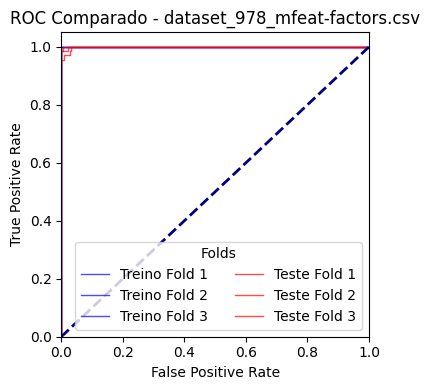


 -  Dataset: dataset_947_arsenic-male-bladder.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.7570 ± 0.1551

Diagnóstico para dataset_947_arsenic-male-bladder.csv:
 - auc: Overfitting grave (treino=1.00, teste=0.76, diferença=0.24)


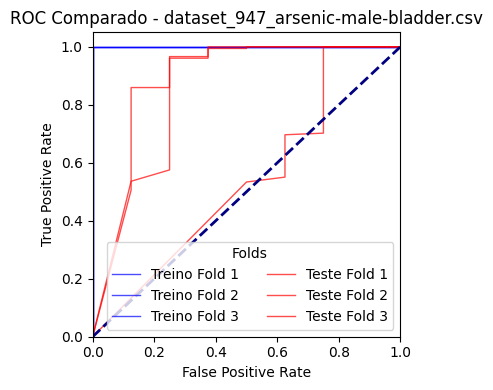


 -  Dataset: dataset_1004_synthetic_control.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  1.0000 ± 0.0000

Diagnóstico para dataset_1004_synthetic_control.csv:
 - auc: Bom ajuste (treino=1.00, teste=1.00)


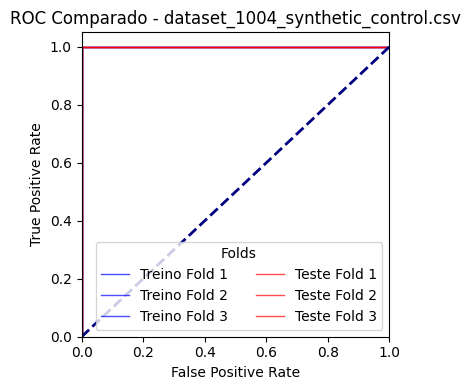


 -  Dataset: dataset_1056_mc1.csv
AUC médio (treino): 0.9979 ± 0.0001
AUC médio (teste):  0.9249 ± 0.0258

Diagnóstico para dataset_1056_mc1.csv:
 - auc: Overfitting moderado (treino=1.00, teste=0.92, diferença=0.07)


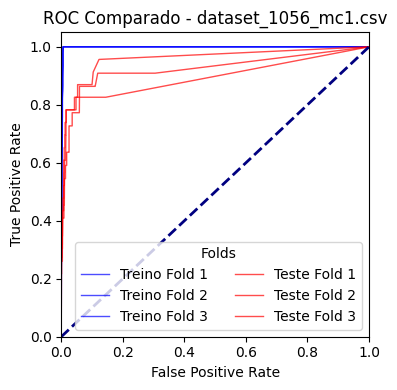


 -  Dataset: dataset_940_water-treatment.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9720 ± 0.0107

Diagnóstico para dataset_940_water-treatment.csv:
 - auc: Bom ajuste (treino=1.00, teste=0.97)


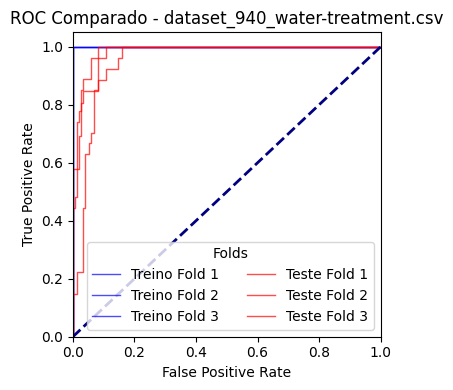


 -  Dataset: dataset_950_arsenic-female-lung.csv
AUC médio (treino): 0.9997 ± 0.0002
AUC médio (teste):  0.8564 ± 0.0528

Diagnóstico para dataset_950_arsenic-female-lung.csv:
 - auc: Overfitting moderado (treino=1.00, teste=0.86, diferença=0.14)


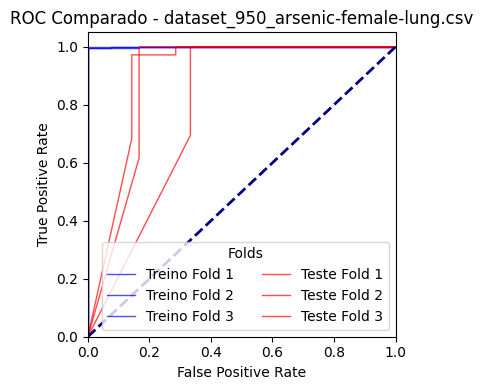


 -  Dataset: dataset_1014_analcatdata_dmft.csv
AUC médio (treino): 0.8310 ± 0.0102
AUC médio (teste):  0.5046 ± 0.0122

Diagnóstico para dataset_1014_analcatdata_dmft.csv:
 - auc: Overfitting grave (treino=0.83, teste=0.50, diferença=0.33)


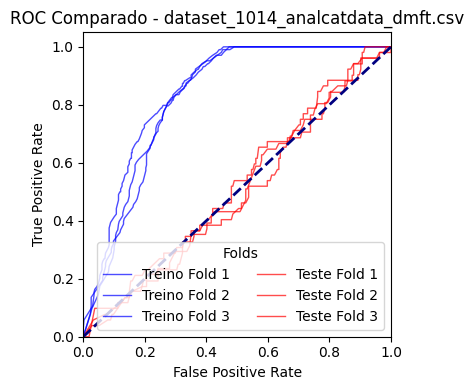


 -  Dataset: dataset_1039_hiva_agnostic.csv
AUC médio (treino): 0.9995 ± 0.0002
AUC médio (teste):  0.8001 ± 0.0188

Diagnóstico para dataset_1039_hiva_agnostic.csv:
 - auc: Overfitting grave (treino=1.00, teste=0.80, diferença=0.20)


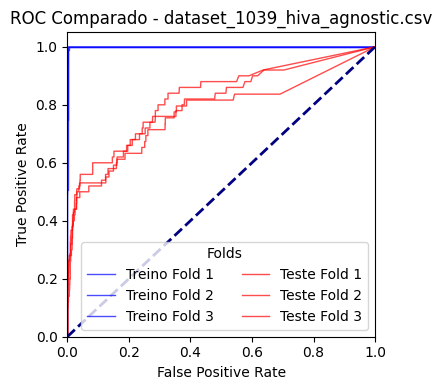


 -  Dataset: dataset_1018_ipums_la_99-small.csv
AUC médio (treino): 0.9828 ± 0.0015
AUC médio (teste):  0.8853 ± 0.0054

Diagnóstico para dataset_1018_ipums_la_99-small.csv:
 - auc: Overfitting moderado (treino=0.98, teste=0.89, diferença=0.10)


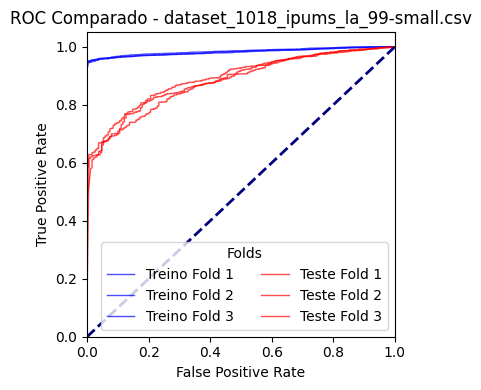


 -  Dataset: dataset_1002_ipums_la_98-small.csv
AUC médio (treino): 0.9843 ± 0.0039
AUC médio (teste):  0.8442 ± 0.0022

Diagnóstico para dataset_1002_ipums_la_98-small.csv:
 - auc: Overfitting moderado (treino=0.98, teste=0.84, diferença=0.14)


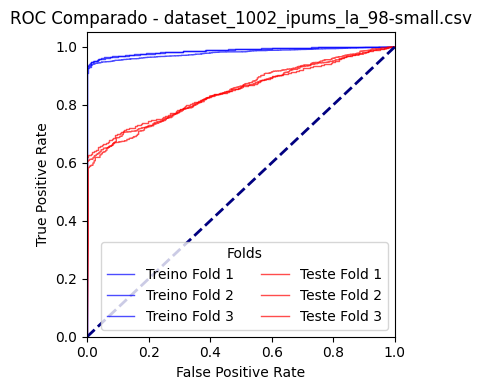


 -  Dataset: dataset_765_analcatdata_apnea2.csv
AUC médio (treino): 0.9938 ± 0.0027
AUC médio (teste):  0.9181 ± 0.0237

Diagnóstico para dataset_765_analcatdata_apnea2.csv:
 - auc: Overfitting moderado (treino=0.99, teste=0.92, diferença=0.08)


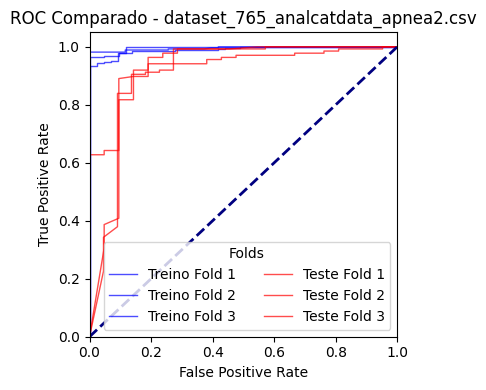


 -  Dataset: dataset_1016_vowel.csv
AUC médio (treino): 0.9999 ± 0.0001
AUC médio (teste):  0.9952 ± 0.0052

Diagnóstico para dataset_1016_vowel.csv:
 - auc: Bom ajuste (treino=1.00, teste=1.00)


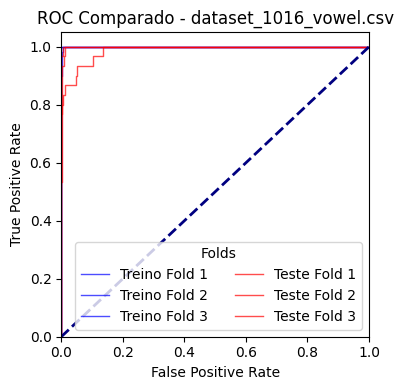


 -  Dataset: dataset_1045_kc1-top5.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.8432 ± 0.0387

Diagnóstico para dataset_1045_kc1-top5.csv:
 - auc: Overfitting grave (treino=1.00, teste=0.84, diferença=0.16)


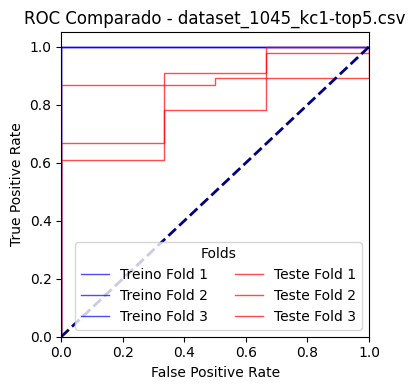


 -  Dataset: dataset_1013_analcatdata_challenger.csv
AUC médio (treino): 0.9005 ± 0.0304
AUC médio (teste):  0.6667 ± 0.1700

Diagnóstico para dataset_1013_analcatdata_challenger.csv:
 - auc: Overfitting grave (treino=0.90, teste=0.67, diferença=0.23)


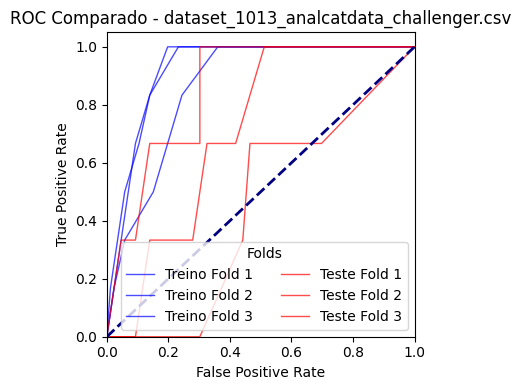


 -  Dataset: dataset_450_analcatdata_lawsuit.csv
AUC médio (treino): 0.9987 ± 0.0013
AUC médio (teste):  0.9941 ± 0.0027

Diagnóstico para dataset_450_analcatdata_lawsuit.csv:
 - auc: Bom ajuste (treino=1.00, teste=0.99)


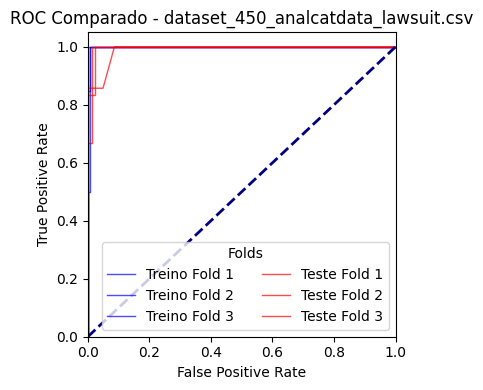


 -  Dataset: dataset_312_scene.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9899 ± 0.0054

Diagnóstico para dataset_312_scene.csv:
 - auc: Bom ajuste (treino=1.00, teste=0.99)


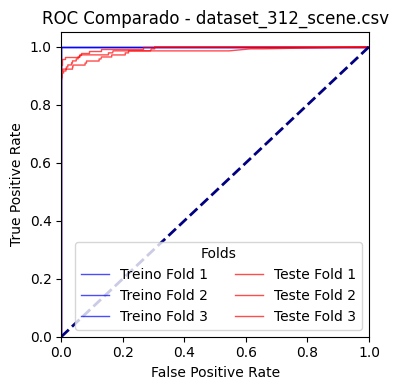


 -  Dataset: dataset_995_mfeat-zernike.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9975 ± 0.0018

Diagnóstico para dataset_995_mfeat-zernike.csv:
 - auc: Bom ajuste (treino=1.00, teste=1.00)


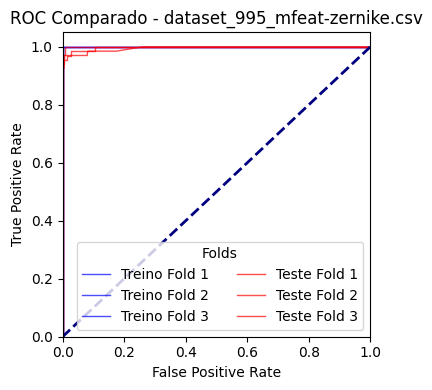


 -  Dataset: dataset_764_analcatdata_apnea3.csv
AUC médio (treino): 0.9925 ± 0.0011
AUC médio (teste):  0.9013 ± 0.0327

Diagnóstico para dataset_764_analcatdata_apnea3.csv:
 - auc: Overfitting moderado (treino=0.99, teste=0.90, diferença=0.09)


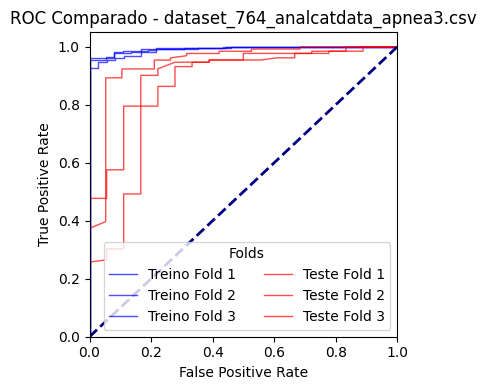


 -  Dataset: dataset_311_oil_spill.csv
AUC médio (treino): 0.9999 ± 0.0001
AUC médio (teste):  0.9186 ± 0.0325

Diagnóstico para dataset_311_oil_spill.csv:
 - auc: Overfitting moderado (treino=1.00, teste=0.92, diferença=0.08)


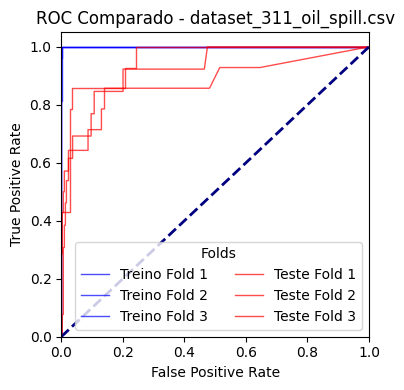


 -  Dataset: dataset_980_optdigits.csv
AUC médio (treino): 0.9998 ± 0.0000
AUC médio (teste):  0.9960 ± 0.0019

Diagnóstico para dataset_980_optdigits.csv:
 - auc: Bom ajuste (treino=1.00, teste=1.00)


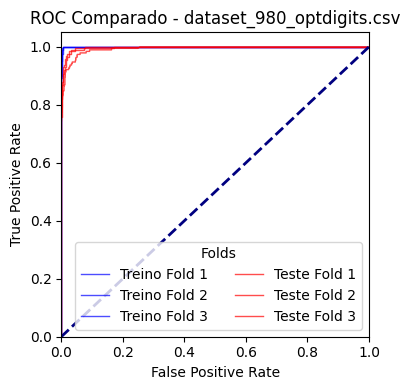


 -  Dataset: dataset_968_analcatdata_birthday.csv
AUC médio (treino): 0.9797 ± 0.0035
AUC médio (teste):  0.9050 ± 0.0288

Diagnóstico para dataset_968_analcatdata_birthday.csv:
 - auc: Overfitting moderado (treino=0.98, teste=0.91, diferença=0.07)


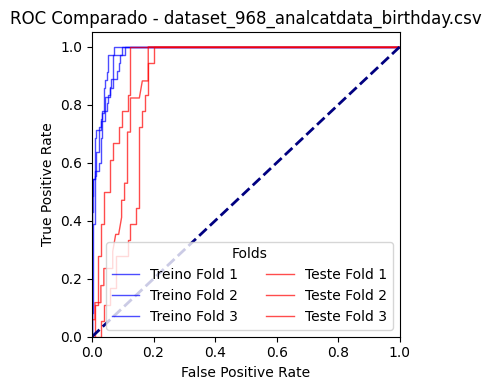


 -  Dataset: dataset_987_collins.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  1.0000 ± 0.0000

Diagnóstico para dataset_987_collins.csv:
 - auc: Bom ajuste (treino=1.00, teste=1.00)


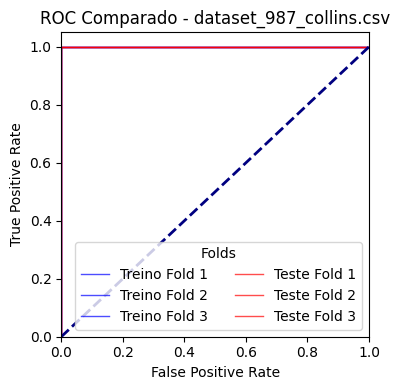


 -  Dataset: dataset_767_analcatdata_apnea1.csv
AUC médio (treino): 0.9938 ± 0.0014
AUC médio (teste):  0.9114 ± 0.0321

Diagnóstico para dataset_767_analcatdata_apnea1.csv:
 - auc: Overfitting moderado (treino=0.99, teste=0.91, diferença=0.08)


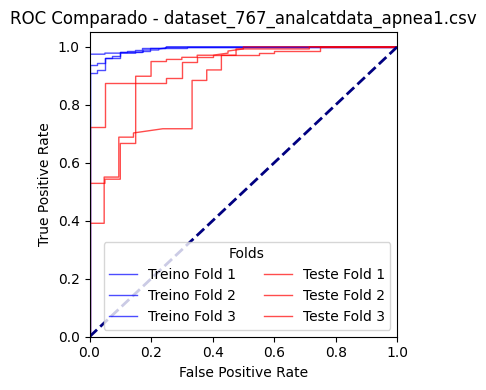


 -  Dataset: dataset_875_analcatdata_chlamydia.csv
AUC médio (treino): 0.9928 ± 0.0050
AUC médio (teste):  0.9553 ± 0.0353

Diagnóstico para dataset_875_analcatdata_chlamydia.csv:
 - auc: Bom ajuste (treino=0.99, teste=0.96)


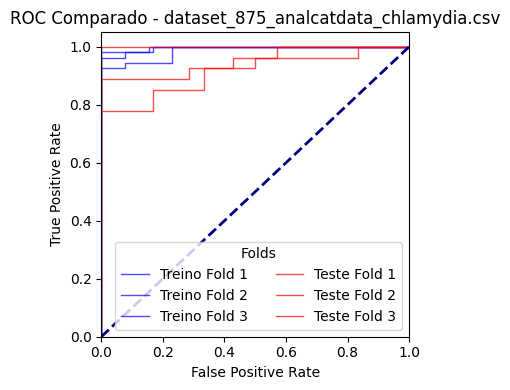


 -  Dataset: dataset_1061_ar4.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.8374 ± 0.0981

Diagnóstico para dataset_1061_ar4.csv:
 - auc: Overfitting grave (treino=1.00, teste=0.84, diferença=0.16)


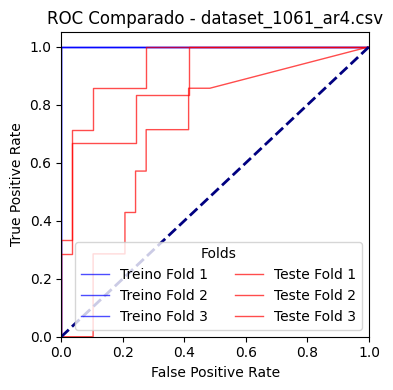


 -  Dataset: dataset_962_mfeat-morphological.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9997 ± 0.0003

Diagnóstico para dataset_962_mfeat-morphological.csv:
 - auc: Bom ajuste (treino=1.00, teste=1.00)


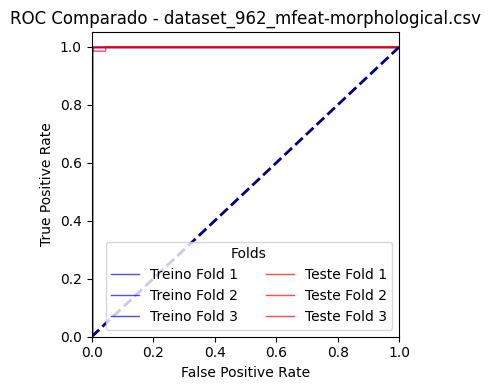


 -  Dataset: dataset_757_meta.csv
AUC médio (treino): 0.9671 ± 0.0011
AUC médio (teste):  0.8295 ± 0.0111

Diagnóstico para dataset_757_meta.csv:
 - auc: Overfitting moderado (treino=0.97, teste=0.83, diferença=0.14)


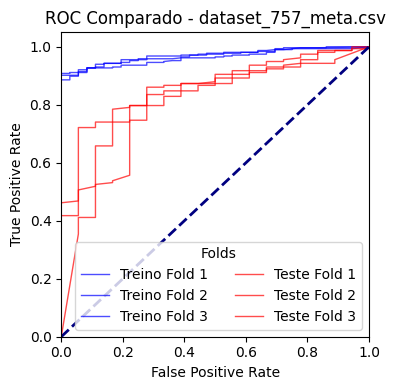


 -  Dataset: dataset_951_arsenic-male-lung.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  1.0000 ± 0.0000

Diagnóstico para dataset_951_arsenic-male-lung.csv:
 - auc: Bom ajuste (treino=1.00, teste=1.00)


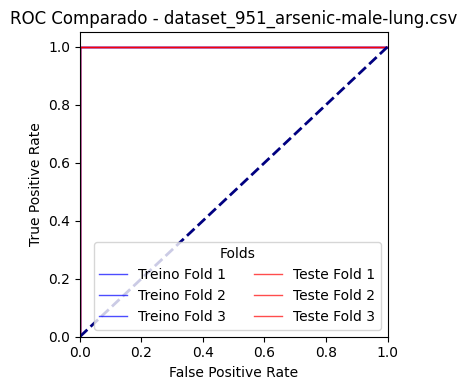


 -  Dataset: dataset_958_segment.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9999 ± 0.0001

Diagnóstico para dataset_958_segment.csv:
 - auc: Bom ajuste (treino=1.00, teste=1.00)


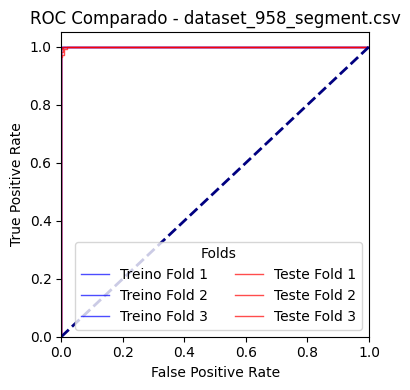


 -  Dataset: dataset_1064_ar6.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.6385 ± 0.0789

Diagnóstico para dataset_1064_ar6.csv:
 - auc: Overfitting grave (treino=1.00, teste=0.64, diferença=0.36)


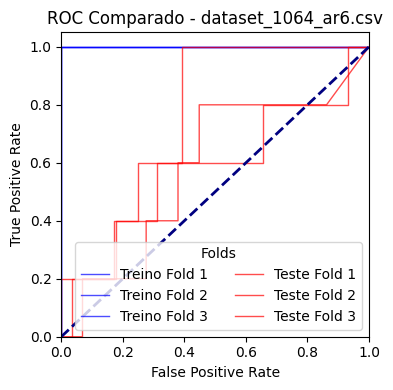


 -  Dataset: dataset_1050_pc3.csv
AUC médio (treino): 0.9889 ± 0.0008
AUC médio (teste):  0.8219 ± 0.0134

Diagnóstico para dataset_1050_pc3.csv:
 - auc: Overfitting grave (treino=0.99, teste=0.82, diferença=0.17)


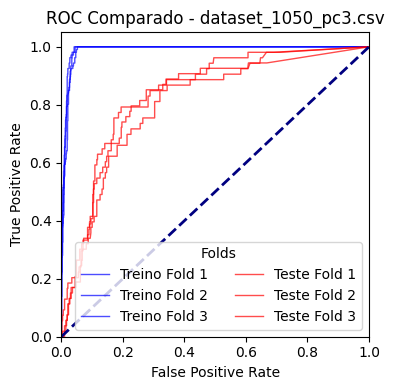


 -  Dataset: dataset_463_backache.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.7255 ± 0.0903

Diagnóstico para dataset_463_backache.csv:
 - auc: Overfitting grave (treino=1.00, teste=0.73, diferença=0.27)


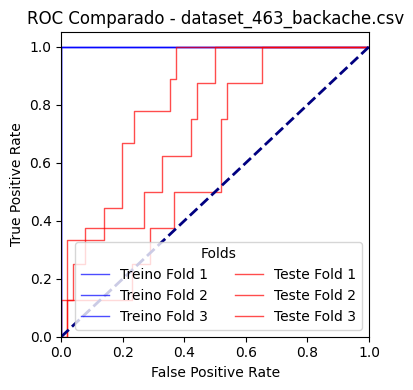


 -  Dataset: dataset_1000_hypothyroid.csv
AUC médio (treino): 0.9984 ± 0.0007
AUC médio (teste):  0.9929 ± 0.0016

Diagnóstico para dataset_1000_hypothyroid.csv:
 - auc: Bom ajuste (treino=1.00, teste=0.99)


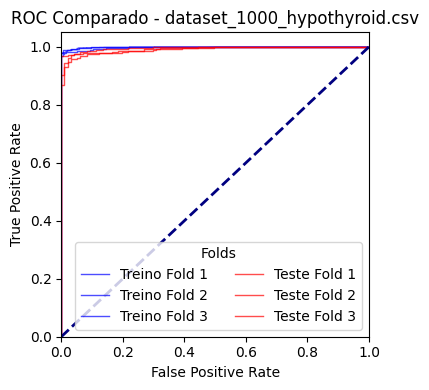


 -  Dataset: dataset_1049_pc4.csv
AUC médio (treino): 0.9859 ± 0.0046
AUC médio (teste):  0.9079 ± 0.0189

Diagnóstico para dataset_1049_pc4.csv:
 - auc: Overfitting moderado (treino=0.99, teste=0.91, diferença=0.08)


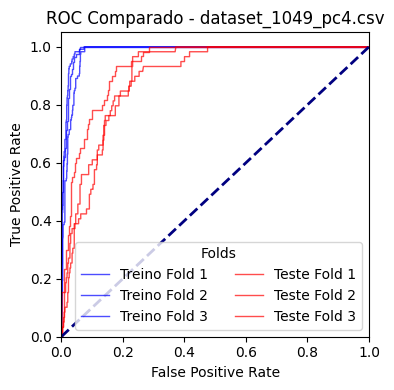


 -  Dataset: dataset_1023_soybean.csv
AUC médio (treino): 0.9969 ± 0.0015
AUC médio (teste):  0.9804 ± 0.0016

Diagnóstico para dataset_1023_soybean.csv:
 - auc: Bom ajuste (treino=1.00, teste=0.98)


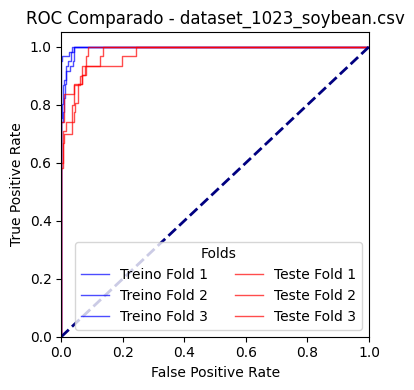


 -  Dataset: dataset_316_yeast_ml8.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.8566 ± 0.0272

Diagnóstico para dataset_316_yeast_ml8.csv:
 - auc: Overfitting moderado (treino=1.00, teste=0.86, diferença=0.14)


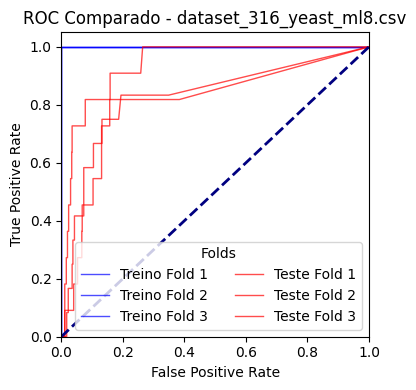


 -  Dataset: dataset_949_arsenic-female-bladder.csv
AUC médio (treino): 0.9835 ± 0.0054
AUC médio (teste):  0.7678 ± 0.0089

Diagnóstico para dataset_949_arsenic-female-bladder.csv:
 - auc: Overfitting grave (treino=0.98, teste=0.77, diferença=0.22)


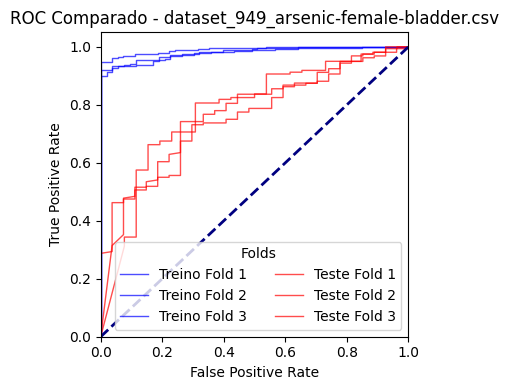


 -  Dataset: dataset_1022_mfeat-pixel.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9933 ± 0.0087

Diagnóstico para dataset_1022_mfeat-pixel.csv:
 - auc: Bom ajuste (treino=1.00, teste=0.99)


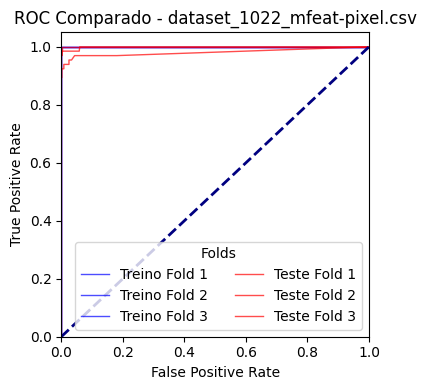


 -  Dataset: dataset_954_spectrometer.csv
AUC médio (treino): 0.9921 ± 0.0029
AUC médio (teste):  0.9472 ± 0.0159

Diagnóstico para dataset_954_spectrometer.csv:
 - auc: Bom ajuste (treino=0.99, teste=0.95)


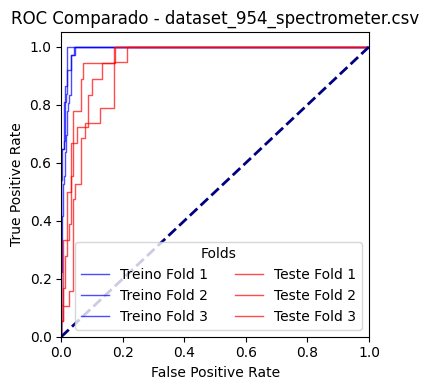


 -  Dataset: dataset_966_analcatdata_halloffame.csv
AUC médio (treino): 0.9951 ± 0.0008
AUC médio (teste):  0.9463 ± 0.0142

Diagnóstico para dataset_966_analcatdata_halloffame.csv:
 - auc: Bom ajuste (treino=1.00, teste=0.95)


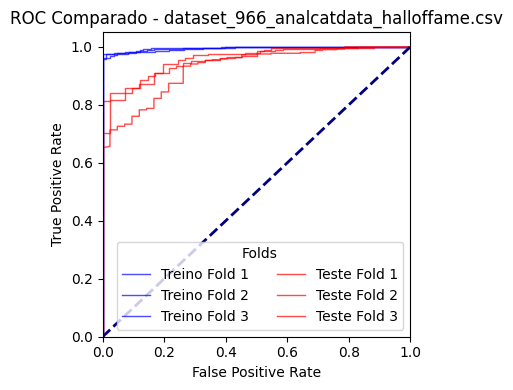


 -  Dataset: dataset_971_mfeat-fourier.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  1.0000 ± 0.0000

Diagnóstico para dataset_971_mfeat-fourier.csv:
 - auc: Bom ajuste (treino=1.00, teste=1.00)


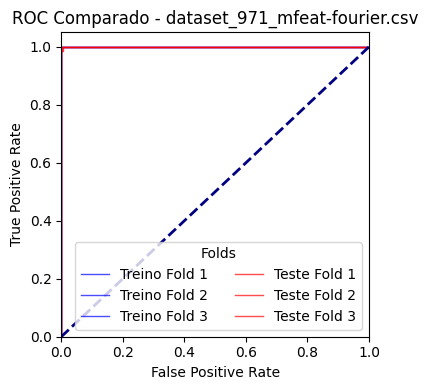


 -  Dataset: dataset_1065_kc3.csv
AUC médio (treino): 0.9924 ± 0.0046
AUC médio (teste):  0.7979 ± 0.0266

Diagnóstico para dataset_1065_kc3.csv:
 - auc: Overfitting grave (treino=0.99, teste=0.80, diferença=0.19)


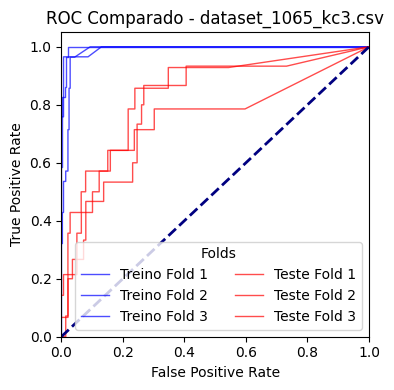


 -  Dataset: dataset_1021_page-blocks.csv
AUC médio (treino): 0.9960 ± 0.0004
AUC médio (teste):  0.9804 ± 0.0021

Diagnóstico para dataset_1021_page-blocks.csv:
 - auc: Bom ajuste (treino=1.00, teste=0.98)


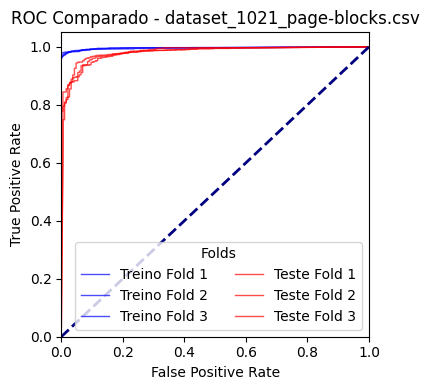


 -  Dataset: dataset_1020_mfeat-karhunen.csv
AUC médio (treino): 1.0000 ± 0.0000
AUC médio (teste):  0.9952 ± 0.0044

Diagnóstico para dataset_1020_mfeat-karhunen.csv:
 - auc: Bom ajuste (treino=1.00, teste=1.00)


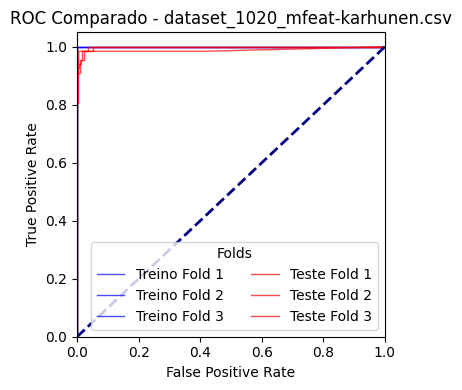


 -  Dataset: dataset_1059_ar1.csv
AUC médio (treino): 0.9978 ± 0.0024
AUC médio (teste):  0.5367 ± 0.1008

Diagnóstico para dataset_1059_ar1.csv:
 - auc: Overfitting grave (treino=1.00, teste=0.54, diferença=0.46)


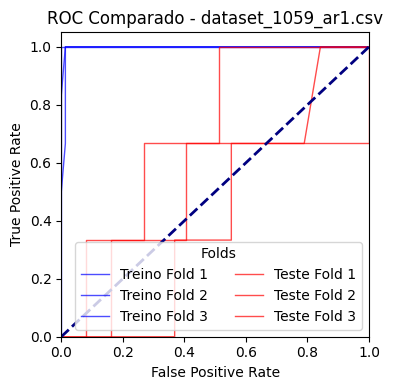


 -  Dataset: dataset_867_visualizing_livestock.csv
AUC médio (treino): 0.9783 ± 0.0005
AUC médio (teste):  0.7806 ± 0.0856

Diagnóstico para dataset_867_visualizing_livestock.csv:
 - auc: Overfitting grave (treino=0.98, teste=0.78, diferença=0.20)


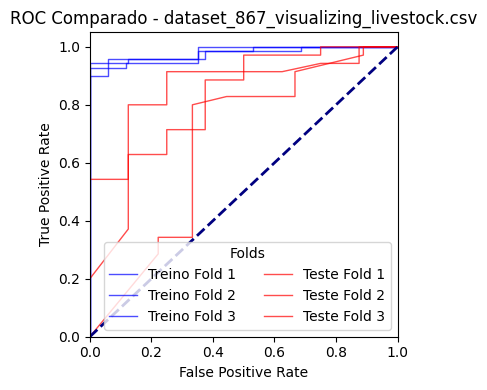


 -  Dataset: dataset_38_sick.csv
AUC médio (treino): 0.9990 ± 0.0003
AUC médio (teste):  0.9961 ± 0.0007

Diagnóstico para dataset_38_sick.csv:
 - auc: Bom ajuste (treino=1.00, teste=1.00)


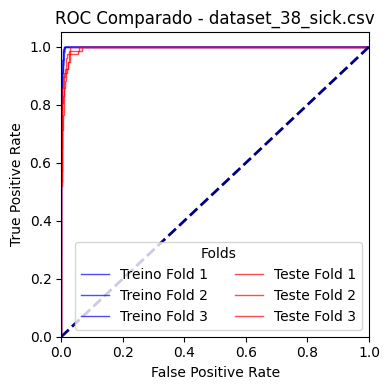


 -  Dataset: dataset_984_analcatdata_draft.csv
AUC médio (treino): 0.9996 ± 0.0003
AUC médio (teste):  0.5202 ± 0.0554

Diagnóstico para dataset_984_analcatdata_draft.csv:
 - auc: Overfitting grave (treino=1.00, teste=0.52, diferença=0.48)


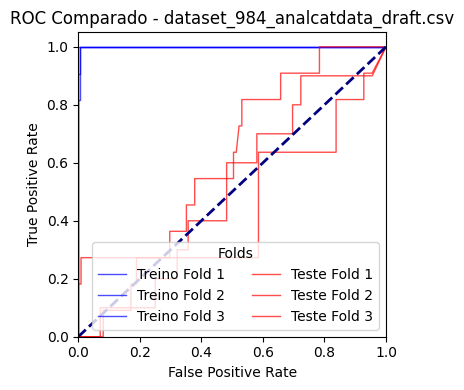


 -  Dataset: dataset_865_analcatdata_neavote.csv
AUC médio (treino): 0.6676 ± 0.0662
AUC médio (teste):  0.6586 ± 0.1502

Diagnóstico para dataset_865_analcatdata_neavote.csv:
 - auc: Bom ajuste (treino=0.67, teste=0.66)


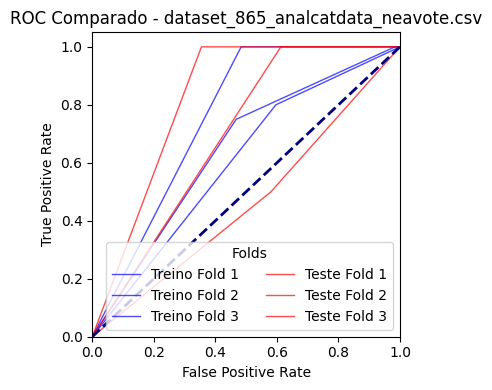


 -  Dataset: dataset_976_JapaneseVowels.csv
AUC médio (treino): 0.9971 ± 0.0001
AUC médio (teste):  0.9928 ± 0.0003

Diagnóstico para dataset_976_JapaneseVowels.csv:
 - auc: Bom ajuste (treino=1.00, teste=0.99)


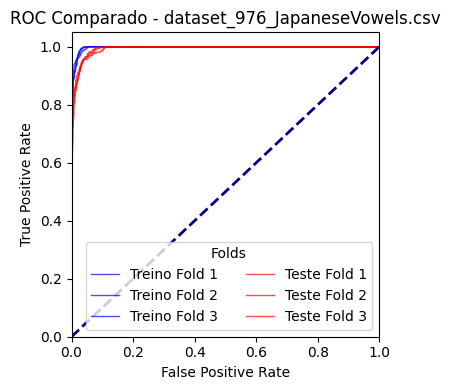

In [14]:

def calcular_auc_modificado(modelo, X_test, y_test):
    y_prob = np.array([probas[1] for probas in modelo.predict_proba(X_test)])
    fpr, tpr, _ = roc_curve(y_test, y_prob, pos_label=1)
    auc_score = auc(fpr, tpr)
    return auc_score, fpr, tpr


def plot_roc_comparado_modificado(fpr_treino_all, tpr_treino_all, fpr_teste_all, tpr_teste_all, filename):
    plt.figure(figsize=(4, 4))  # Gráfico pequeno
    for i in range(len(fpr_treino_all)):
        plt.plot(fpr_treino_all[i], tpr_treino_all[i], lw=1, alpha=0.7, label=f"Treino Fold {i+1}", color='blue')
    
    for i in range(len(fpr_teste_all)):
        plt.plot(fpr_teste_all[i], tpr_teste_all[i], lw=1, alpha=0.7, label=f"Teste Fold {i+1}", color='red')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Comparado - {filename}')
    plt.legend(loc="lower right", title="Folds", ncol=2)
    plt.tight_layout()
    plt.show()

def diagnostico_overfit_underfit(metricas_treino, metricas_teste, nome_dataset="", tolerancia=0.05):
    """
    Compara métricas de treino e teste e indica se há overfitting, underfitting ou bom ajuste.
    metricas_treino: dict, ex: {'f1': 0.95, 'auc': 0.98}
    metricas_teste: dict, ex: {'f1': 0.70, 'auc': 0.75}
    tolerancia: diferença aceitável entre treino e teste (ex: 0.05 = 5%)
    """
    
    print(f"\nDiagnóstico para {nome_dataset}:")
    for metrica in metricas_treino:
        treino = metricas_treino[metrica]
        teste = metricas_teste[metrica]
        diff = treino - teste
        if treino < 0.6 and teste < 0.6:
            print(f" - {metrica}: Underfitting (treino={treino:.2f}, teste={teste:.2f})")
        elif diff > tolerancia:
            grau = "grave" if diff > 0.15 else "moderado"
            print(f" - {metrica}: Overfitting {grau} (treino={treino:.2f}, teste={teste:.2f}, diferença={diff:.2f})")
        elif diff < -tolerancia:
            print(f" - {metrica}: Possível erro de generalização inversa (teste > treino)")
        else:
            print(f" - {metrica}: Bom ajuste (treino={treino:.2f}, teste={teste:.2f})")
            

def avaliar_auc_por_dataset_tratado_modificado(datasets_tratados):
    for filename, (X, y) in datasets_tratados.items():
        try:
            kf = StratifiedKFold(n_splits=3, shuffle=True)
            fpr_teste_all, tpr_teste_all, auc_scores_teste = [], [], []
            fpr_treino_all, tpr_treino_all, auc_scores_treino = [], [], []

            for train_idx, test_idx in kf.split(X, y):
                X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
                y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

                le = LabelEncoder()
                y_train = le.fit_transform(y_train)
                y_test = le.transform(y_test)

                X_train = X_train.to_numpy()
                X_test= X_test.to_numpy()

                class_weights = calcular_class_weights(y_train)
                focal_gamma = escolher_focal_gamma(y_train)
                params = escolher_parametros(y_train)
                
                modelo = RandomForestClassifier2(
                    n_estimators=50,
                    max_depth=params['max_depth'],
                    min_samples_split=params['min_samples_split'],
                    class_weights=class_weights,
                    focal_gamma=focal_gamma,
                    n_jobs=-1
                )

                modelo.fit(X_train, y_train)

                # AUC Teste
                auc_teste, fpr_teste, tpr_teste = calcular_auc_modificado(modelo, X_test, y_test)
                auc_scores_teste.append(auc_teste)
                fpr_teste_all.append(fpr_teste)
                tpr_teste_all.append(tpr_teste)

                # AUC Treino
                auc_treino, fpr_treino, tpr_treino = calcular_auc_modificado(modelo, X_train, y_train)
                auc_scores_treino.append(auc_treino)
                fpr_treino_all.append(fpr_treino)
                tpr_treino_all.append(tpr_treino)


            # Mostrar resultados
            print(f"\n -  Dataset: {filename}")
            print(f"AUC médio (treino): {np.mean(auc_scores_treino):.4f} ± {np.std(auc_scores_treino):.4f}")
            print(f"AUC médio (teste):  {np.mean(auc_scores_teste):.4f} ± {np.std(auc_scores_teste):.4f}")

            # Chamar diagnóstico de overfitting/underfitting
            metricas_treino = {'auc': np.mean(auc_scores_treino)}
            metricas_teste = {'auc': np.mean(auc_scores_teste)}
            diagnostico_overfit_underfit(metricas_treino, metricas_teste, nome_dataset=filename)

            # Gráfico
            plot_roc_comparado_modificado(fpr_treino_all, tpr_treino_all, fpr_teste_all, tpr_teste_all, filename)

        except Exception as e:
            print(f"\n⚠️ Erro ao processar o dataset {filename}: {e}")


avaliar_auc_por_dataset_tratado_modificado(tratados)


=== Matriz de confusão e gráfico precision-recall para dataset_978_mfeat-factors.csv ===


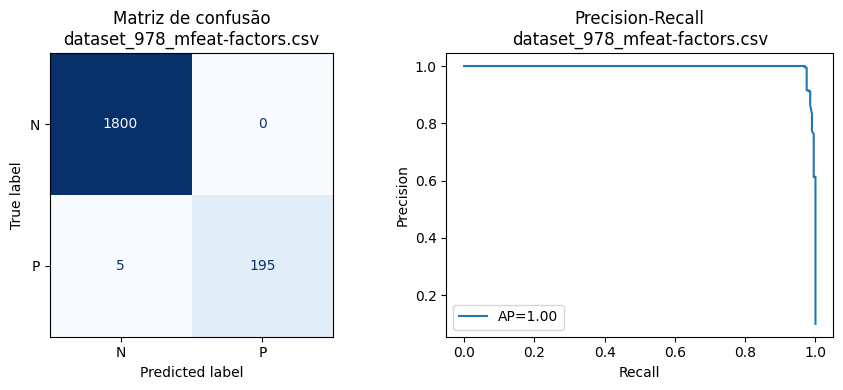


=== Matriz de confusão e gráfico precision-recall para dataset_947_arsenic-male-bladder.csv ===


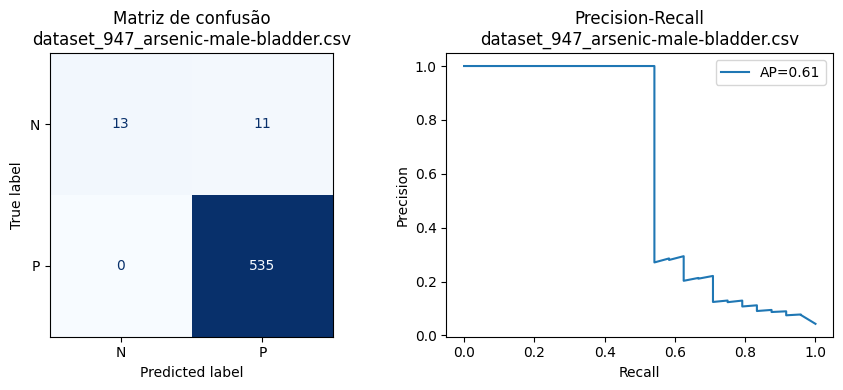


=== Matriz de confusão e gráfico precision-recall para dataset_1004_synthetic_control.csv ===


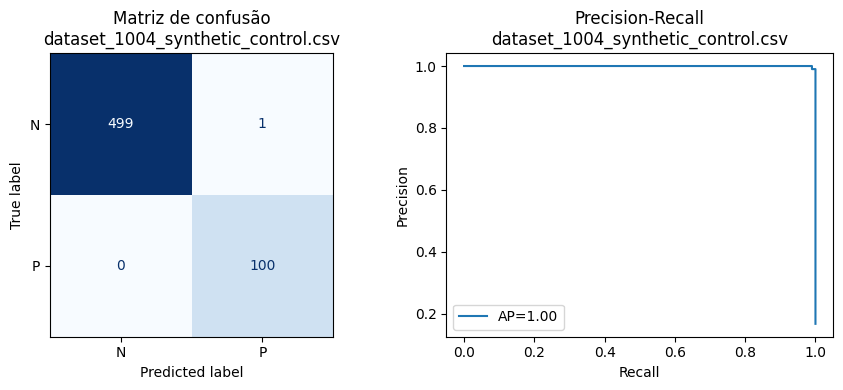


=== Matriz de confusão e gráfico precision-recall para dataset_1056_mc1.csv ===


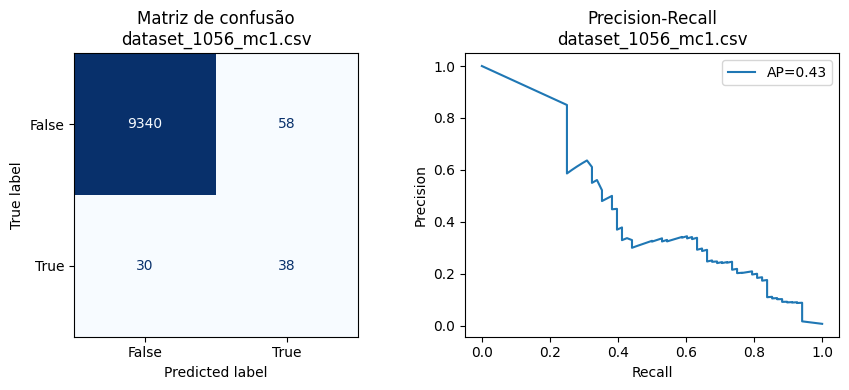


=== Matriz de confusão e gráfico precision-recall para dataset_940_water-treatment.csv ===


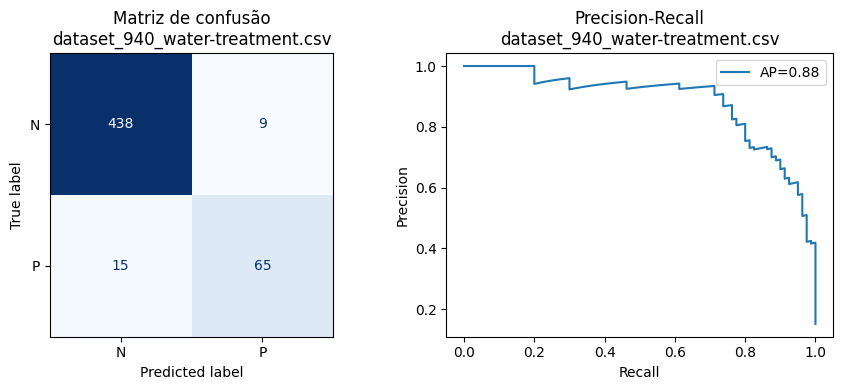


=== Matriz de confusão e gráfico precision-recall para dataset_950_arsenic-female-lung.csv ===


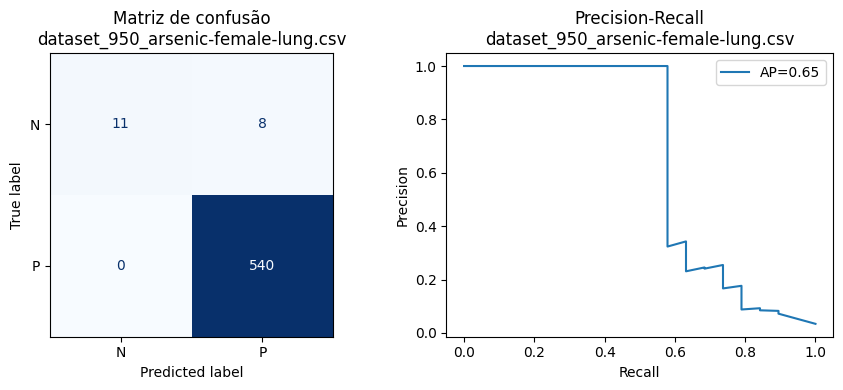


=== Matriz de confusão e gráfico precision-recall para dataset_1014_analcatdata_dmft.csv ===


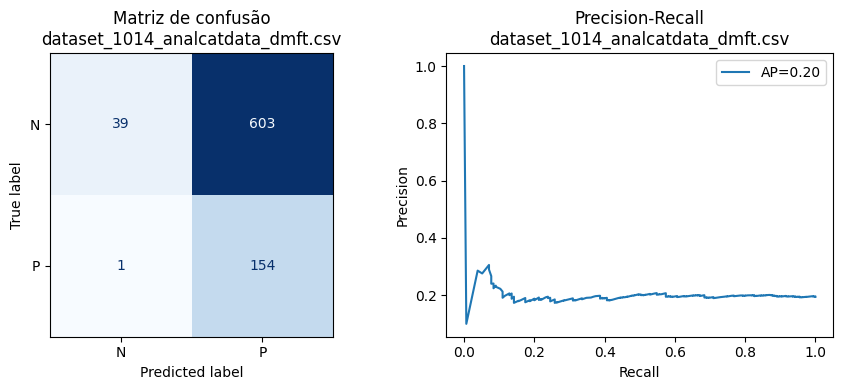


=== Matriz de confusão e gráfico precision-recall para dataset_1039_hiva_agnostic.csv ===


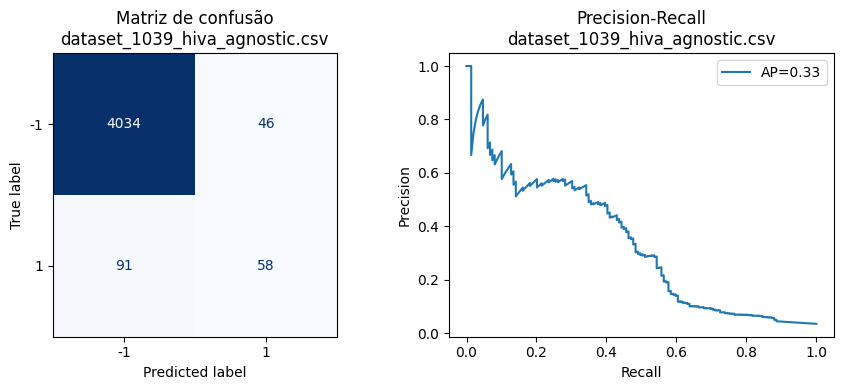


=== Matriz de confusão e gráfico precision-recall para dataset_1018_ipums_la_99-small.csv ===


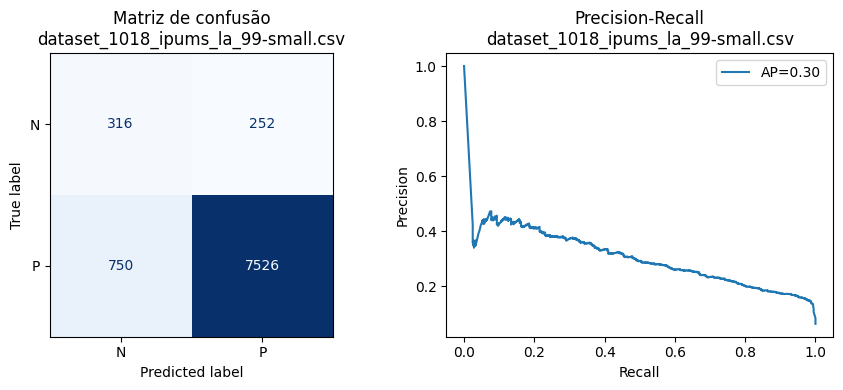


=== Matriz de confusão e gráfico precision-recall para dataset_1002_ipums_la_98-small.csv ===


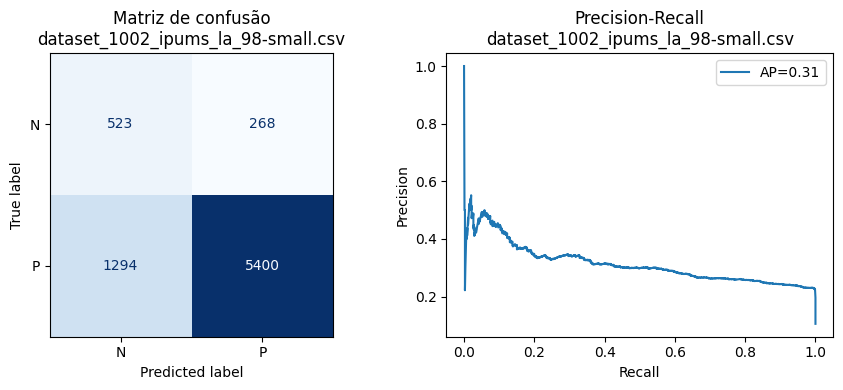


=== Matriz de confusão e gráfico precision-recall para dataset_765_analcatdata_apnea2.csv ===


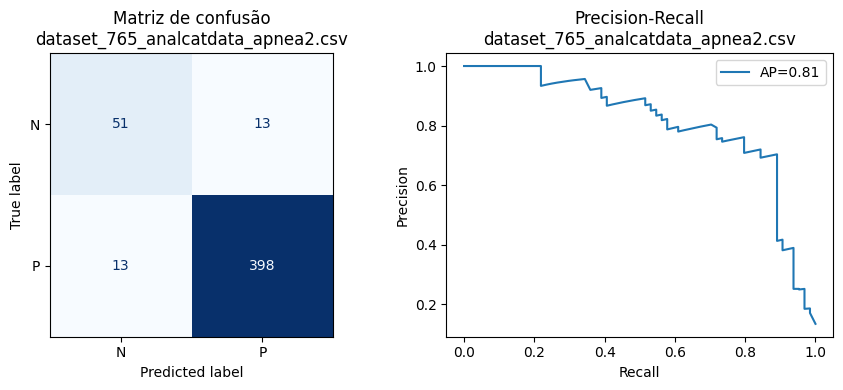


=== Matriz de confusão e gráfico precision-recall para dataset_1016_vowel.csv ===


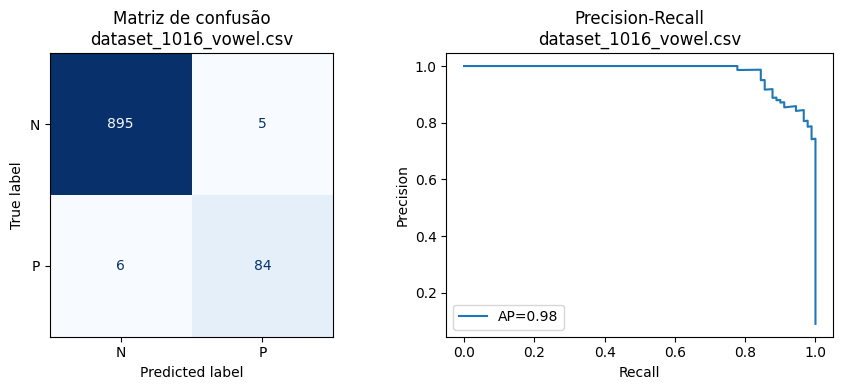


=== Matriz de confusão e gráfico precision-recall para dataset_1045_kc1-top5.csv ===


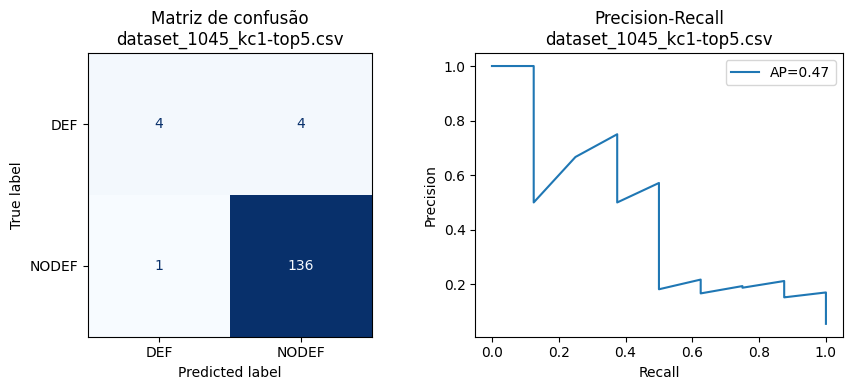


=== Matriz de confusão e gráfico precision-recall para dataset_1013_analcatdata_challenger.csv ===


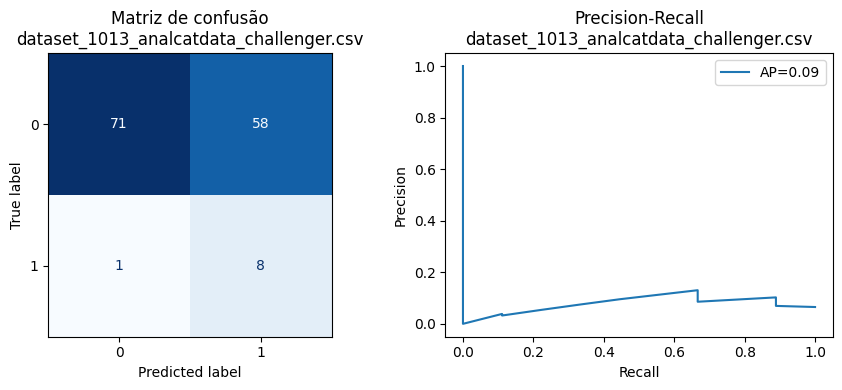


=== Matriz de confusão e gráfico precision-recall para dataset_450_analcatdata_lawsuit.csv ===


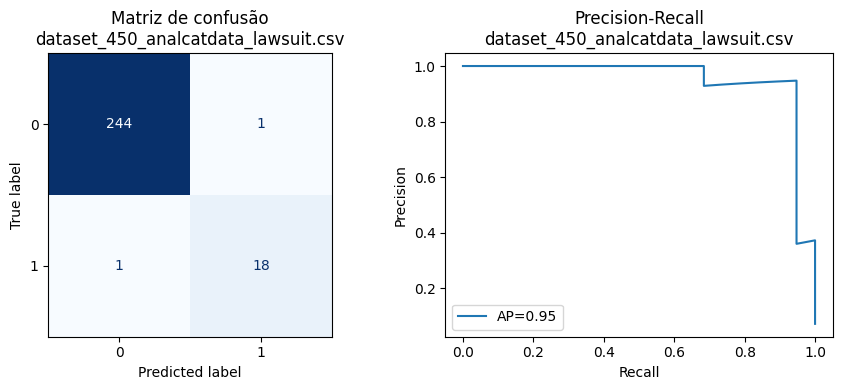


=== Matriz de confusão e gráfico precision-recall para dataset_312_scene.csv ===


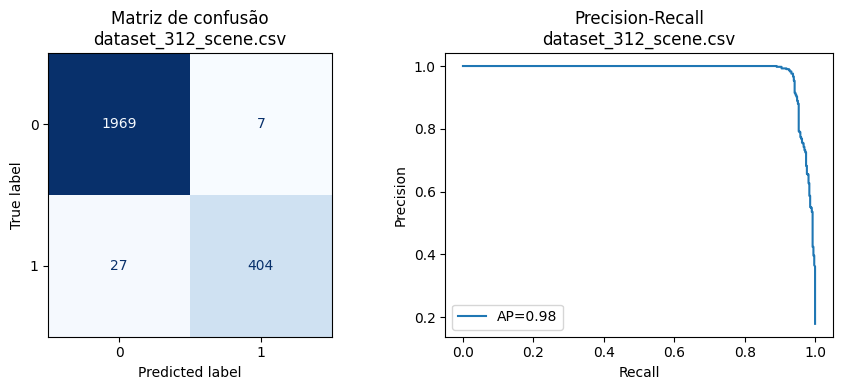


=== Matriz de confusão e gráfico precision-recall para dataset_995_mfeat-zernike.csv ===


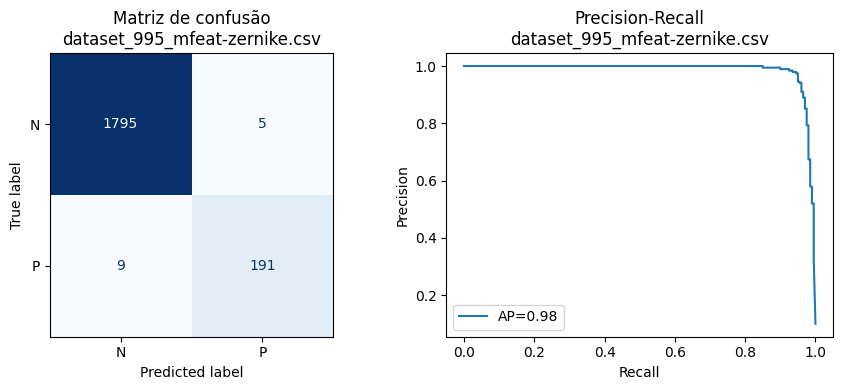


=== Matriz de confusão e gráfico precision-recall para dataset_764_analcatdata_apnea3.csv ===


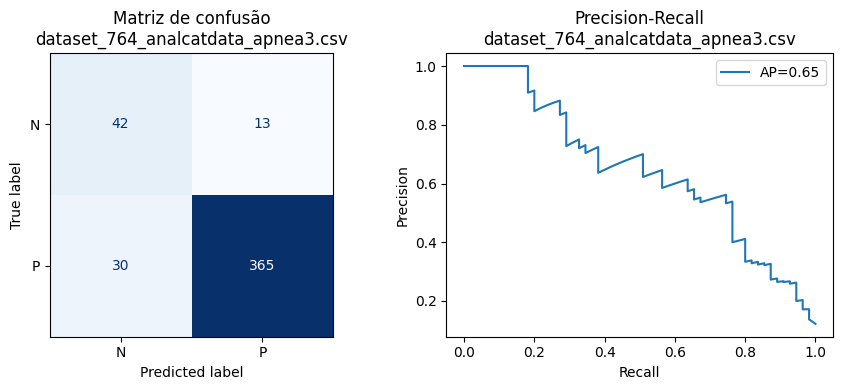


=== Matriz de confusão e gráfico precision-recall para dataset_311_oil_spill.csv ===


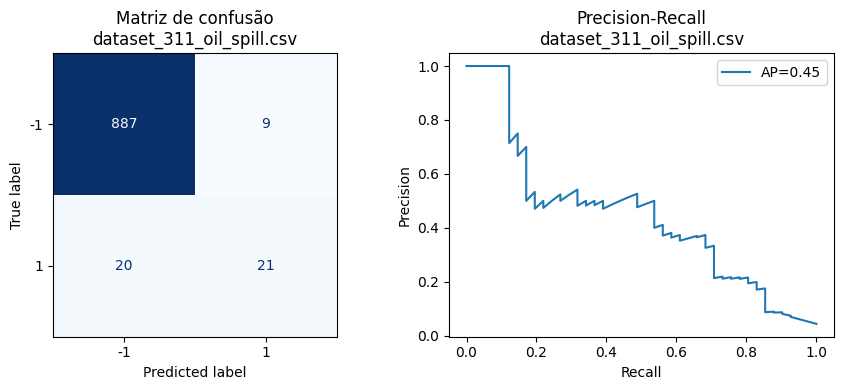


=== Matriz de confusão e gráfico precision-recall para dataset_980_optdigits.csv ===


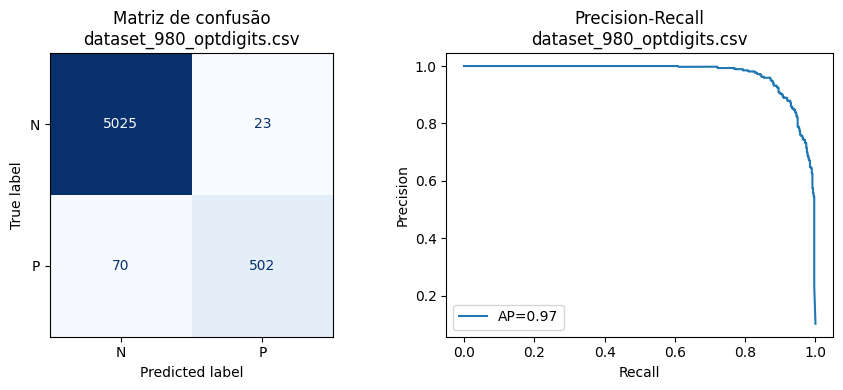


=== Matriz de confusão e gráfico precision-recall para dataset_968_analcatdata_birthday.csv ===


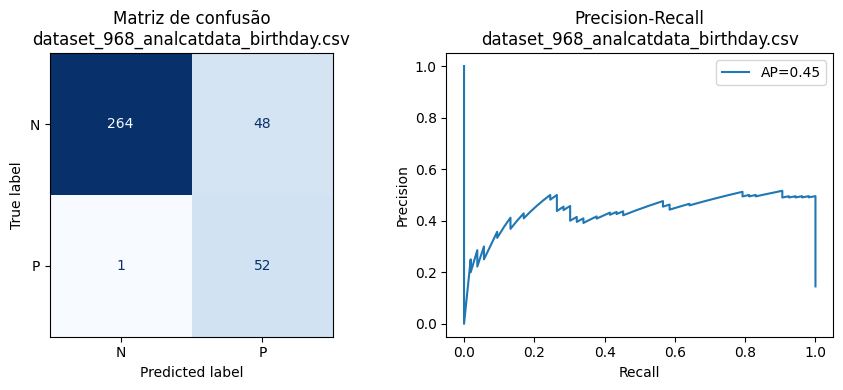


=== Matriz de confusão e gráfico precision-recall para dataset_987_collins.csv ===


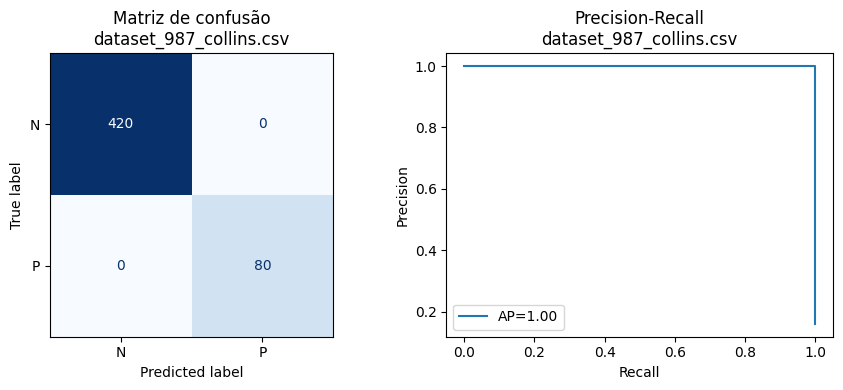


=== Matriz de confusão e gráfico precision-recall para dataset_767_analcatdata_apnea1.csv ===


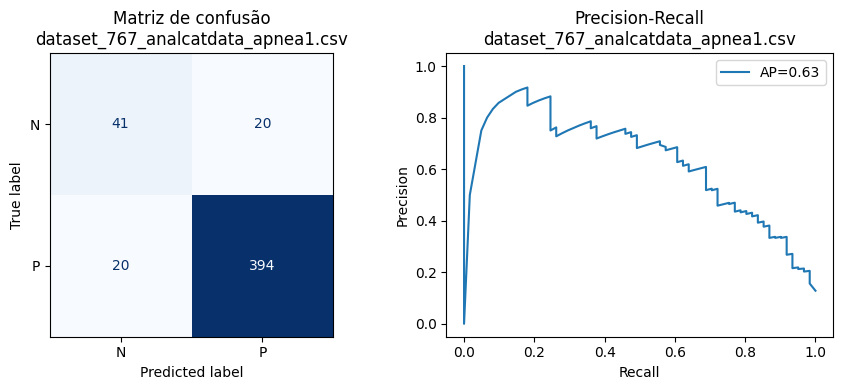


=== Matriz de confusão e gráfico precision-recall para dataset_875_analcatdata_chlamydia.csv ===


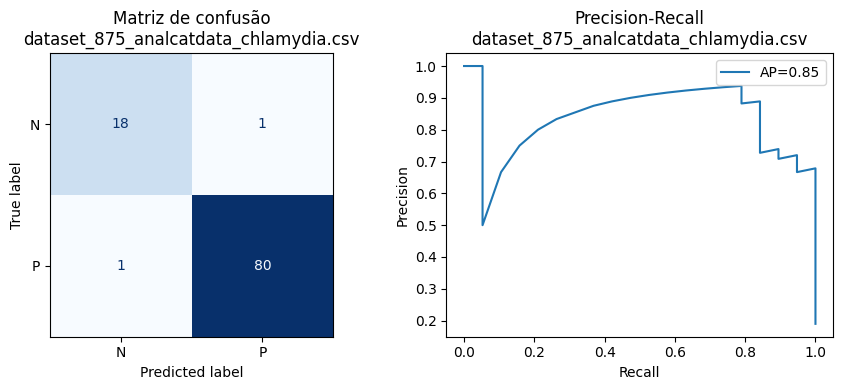


=== Matriz de confusão e gráfico precision-recall para dataset_1061_ar4.csv ===


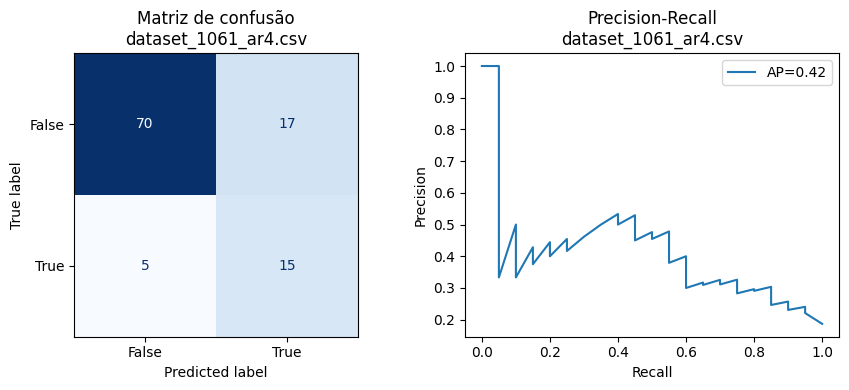


=== Matriz de confusão e gráfico precision-recall para dataset_962_mfeat-morphological.csv ===


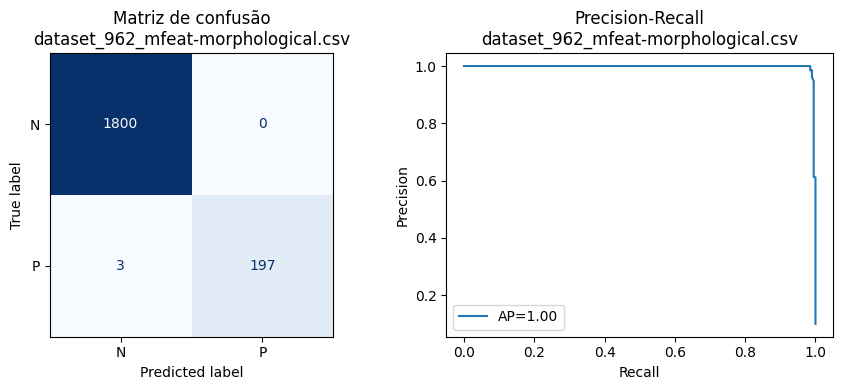


=== Matriz de confusão e gráfico precision-recall para dataset_757_meta.csv ===


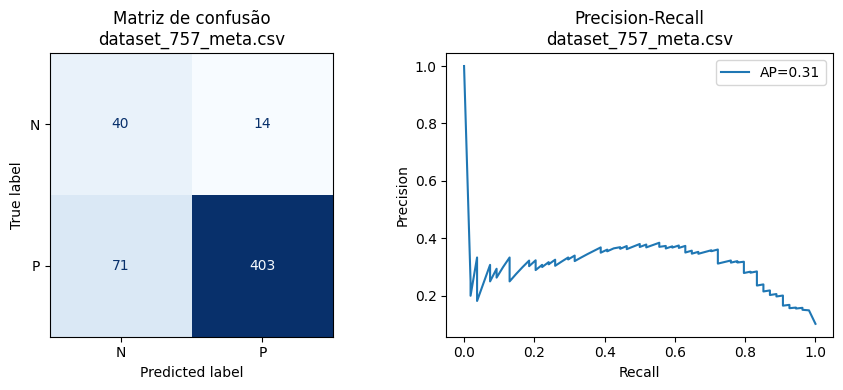


=== Matriz de confusão e gráfico precision-recall para dataset_951_arsenic-male-lung.csv ===


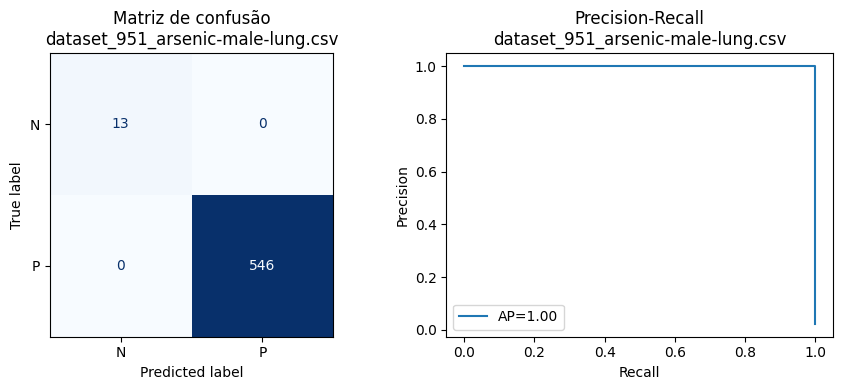


=== Matriz de confusão e gráfico precision-recall para dataset_958_segment.csv ===


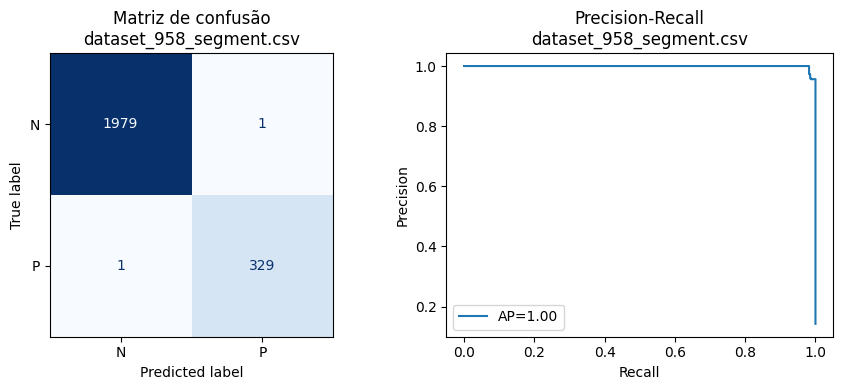


=== Matriz de confusão e gráfico precision-recall para dataset_1064_ar6.csv ===


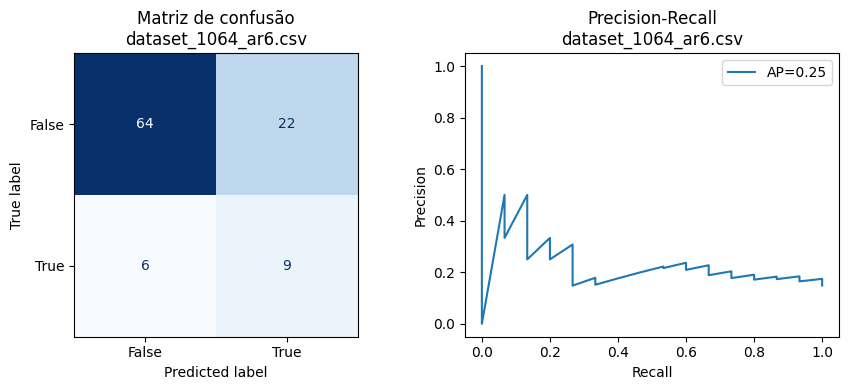


=== Matriz de confusão e gráfico precision-recall para dataset_1050_pc3.csv ===


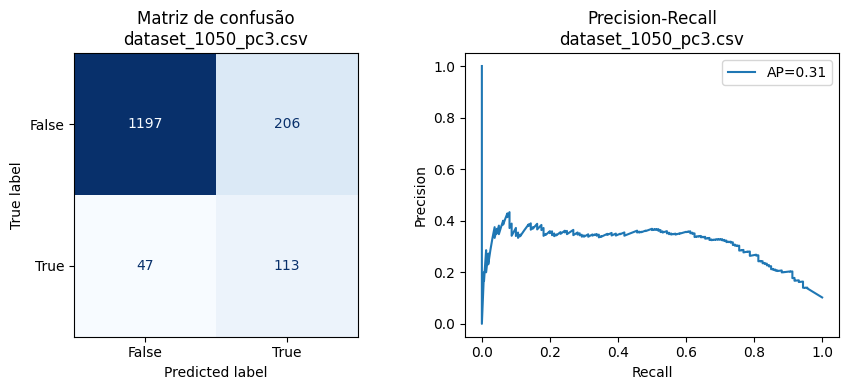


=== Matriz de confusão e gráfico precision-recall para dataset_463_backache.csv ===


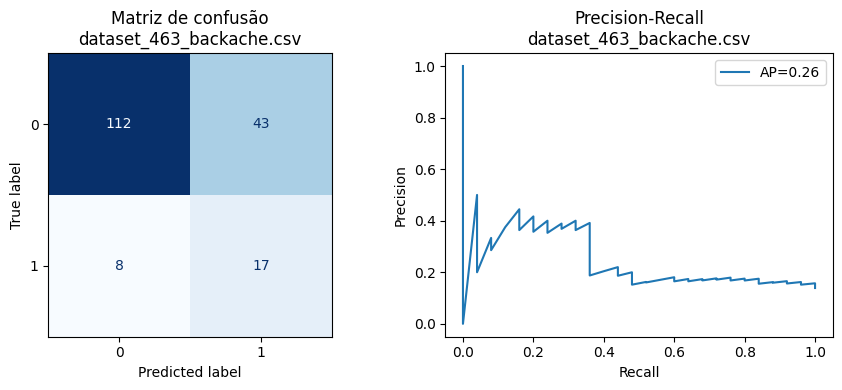


=== Matriz de confusão e gráfico precision-recall para dataset_1000_hypothyroid.csv ===


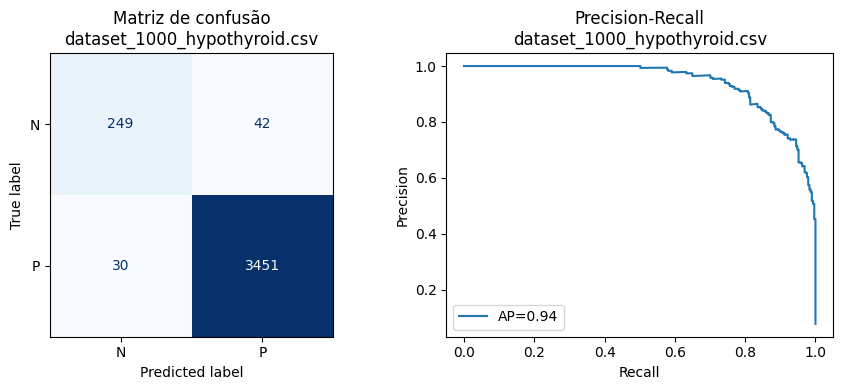


=== Matriz de confusão e gráfico precision-recall para dataset_1049_pc4.csv ===


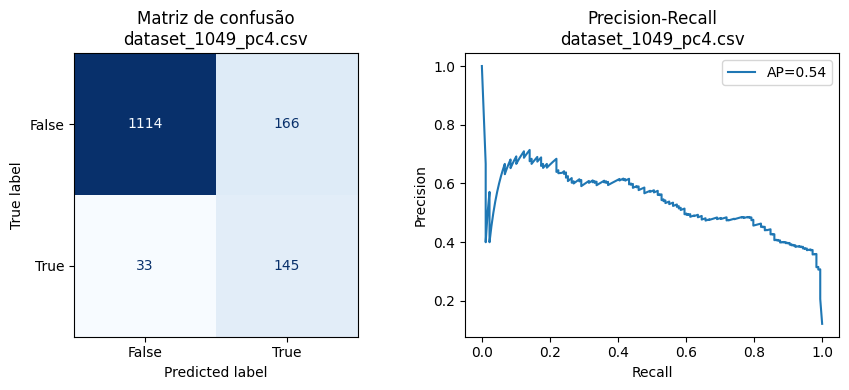


=== Matriz de confusão e gráfico precision-recall para dataset_1023_soybean.csv ===


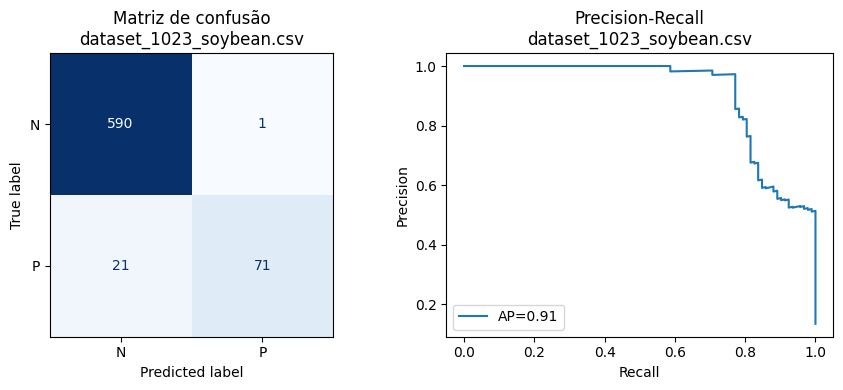


=== Matriz de confusão e gráfico precision-recall para dataset_316_yeast_ml8.csv ===


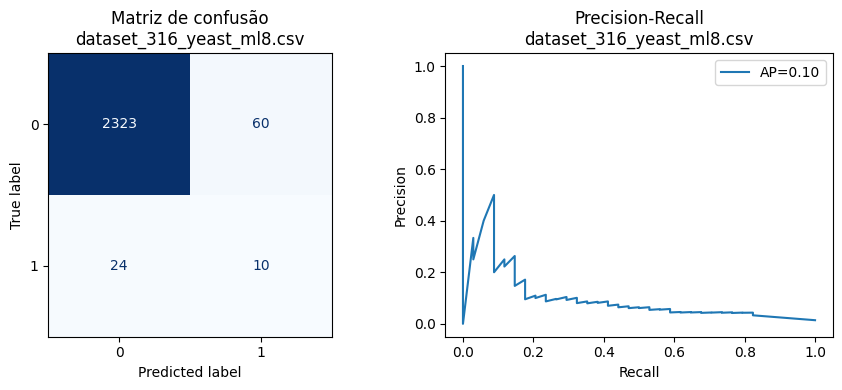


=== Matriz de confusão e gráfico precision-recall para dataset_949_arsenic-female-bladder.csv ===


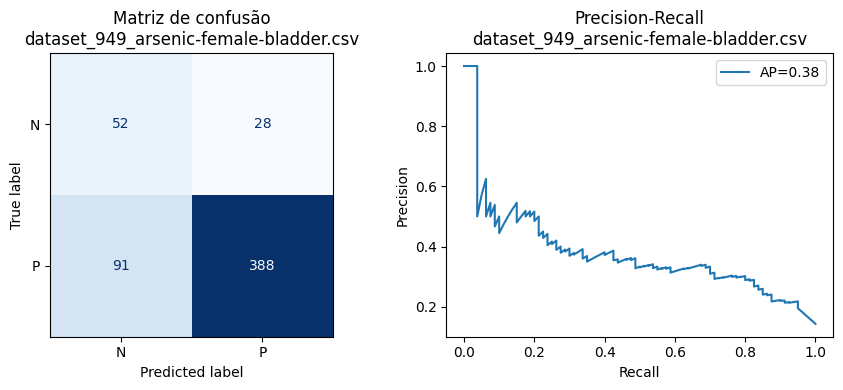


=== Matriz de confusão e gráfico precision-recall para dataset_1022_mfeat-pixel.csv ===


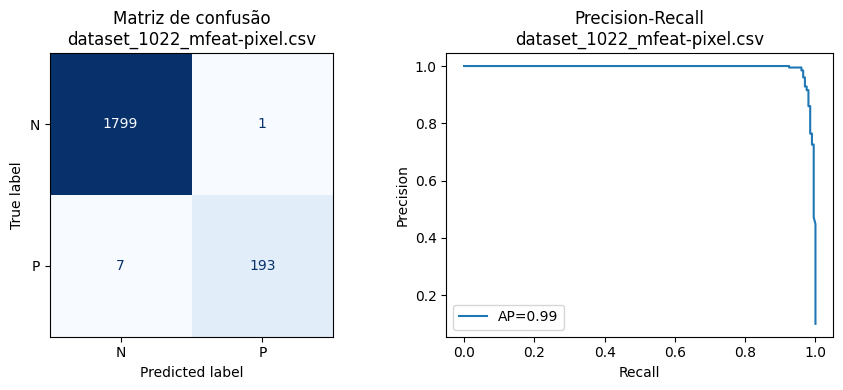


=== Matriz de confusão e gráfico precision-recall para dataset_954_spectrometer.csv ===


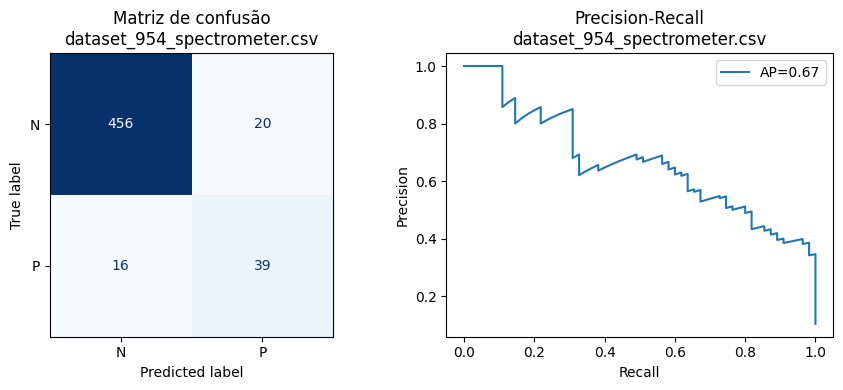


=== Matriz de confusão e gráfico precision-recall para dataset_966_analcatdata_halloffame.csv ===


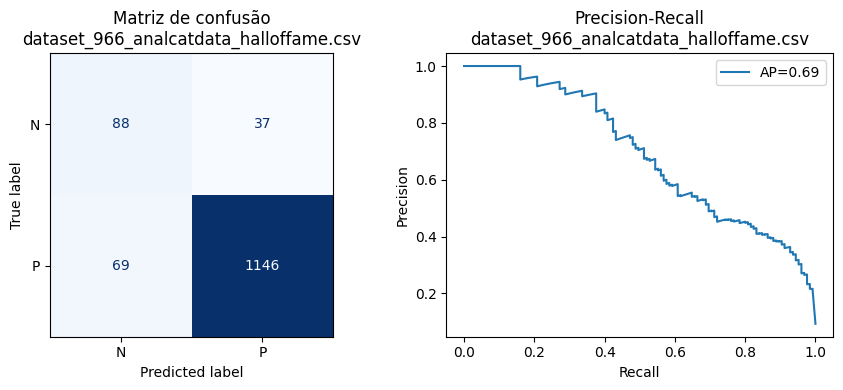


=== Matriz de confusão e gráfico precision-recall para dataset_971_mfeat-fourier.csv ===


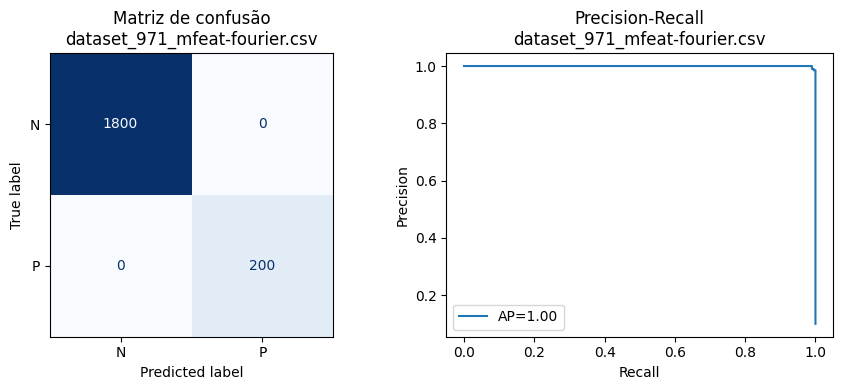


=== Matriz de confusão e gráfico precision-recall para dataset_1065_kc3.csv ===


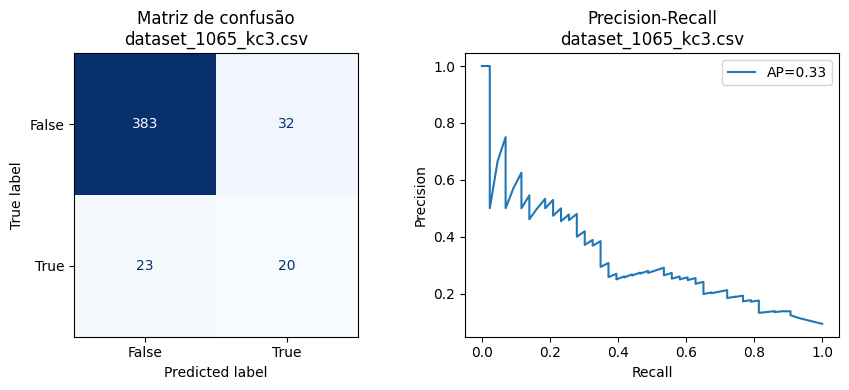


=== Matriz de confusão e gráfico precision-recall para dataset_1021_page-blocks.csv ===


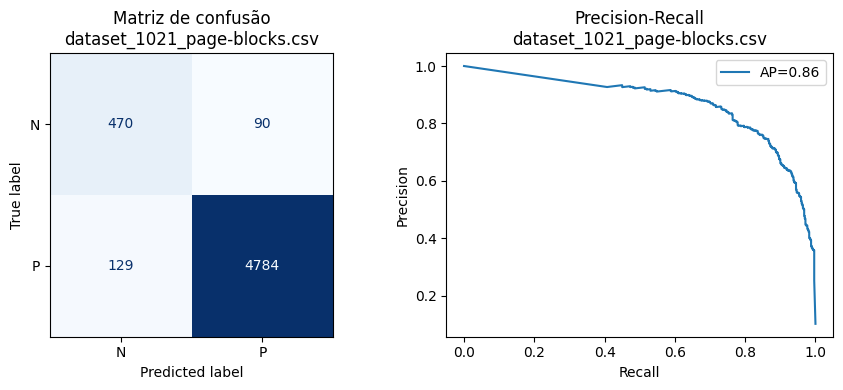


=== Matriz de confusão e gráfico precision-recall para dataset_1020_mfeat-karhunen.csv ===


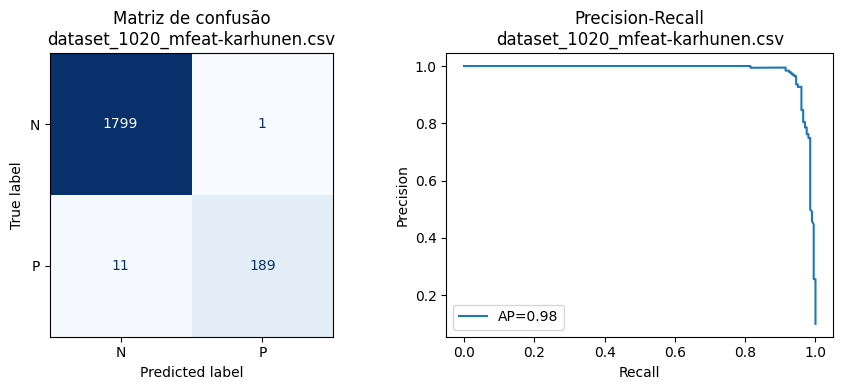


=== Matriz de confusão e gráfico precision-recall para dataset_1059_ar1.csv ===


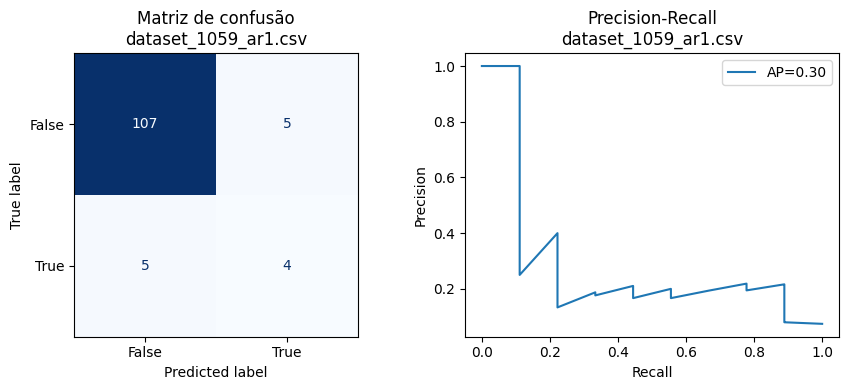


=== Matriz de confusão e gráfico precision-recall para dataset_867_visualizing_livestock.csv ===


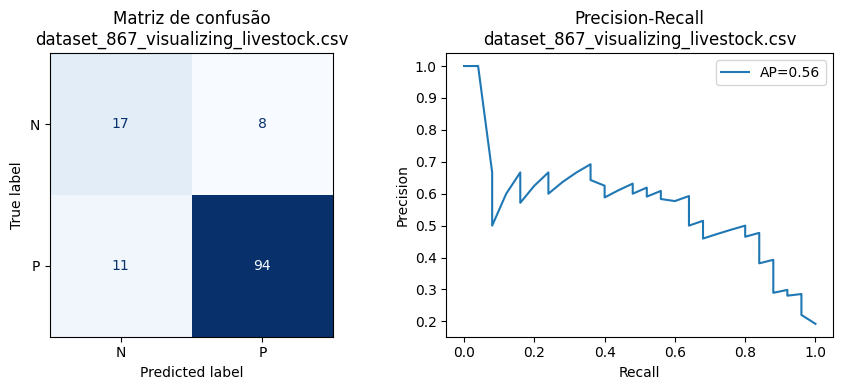


=== Matriz de confusão e gráfico precision-recall para dataset_38_sick.csv ===


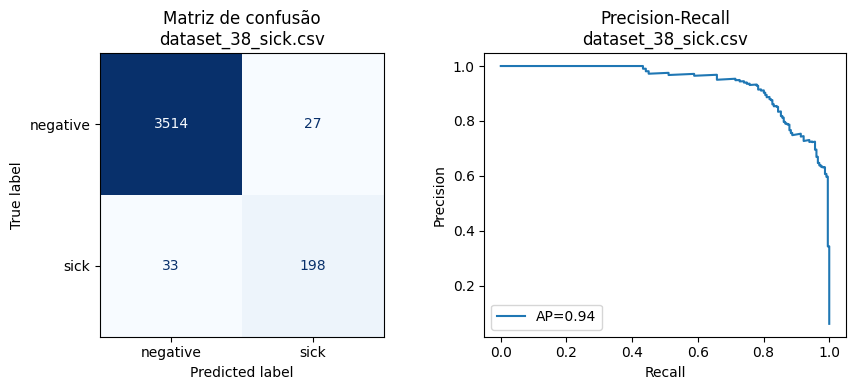


=== Matriz de confusão e gráfico precision-recall para dataset_984_analcatdata_draft.csv ===


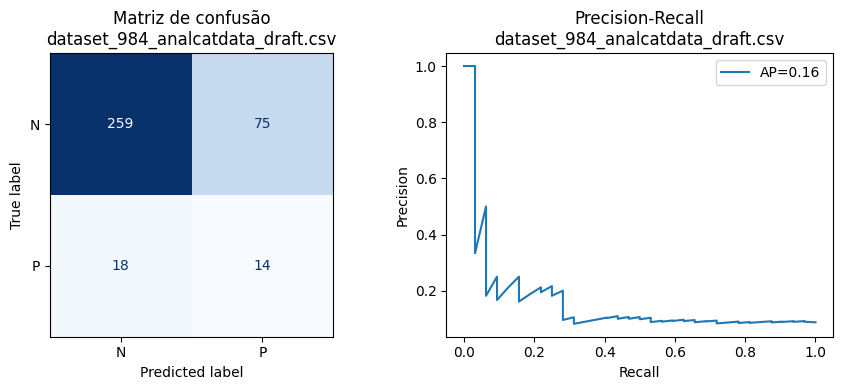


=== Matriz de confusão e gráfico precision-recall para dataset_865_analcatdata_neavote.csv ===


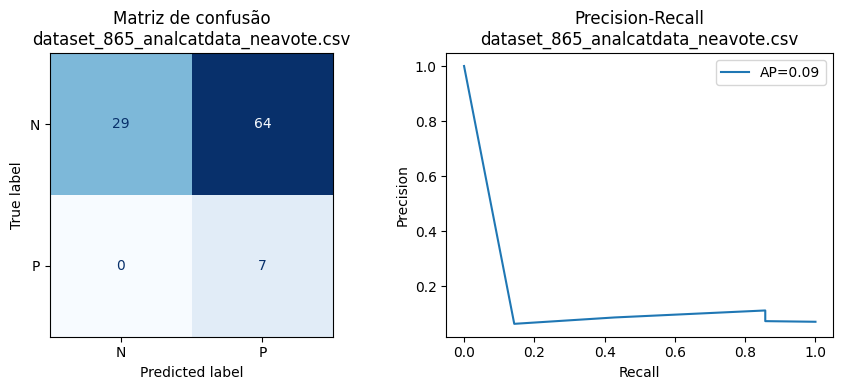


=== Matriz de confusão e gráfico precision-recall para dataset_976_JapaneseVowels.csv ===


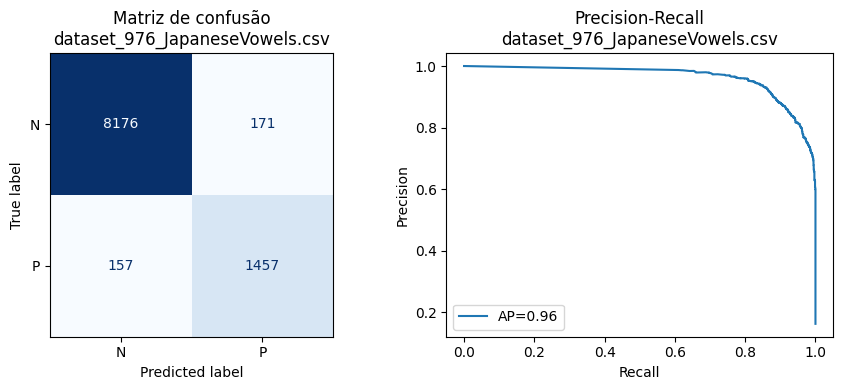

In [15]:
def plot_precision_recall_modificado(y_true, y_scores, nome_dataset="", pos_label=1):
    precision, recall, _ = precision_recall_curve(y_true, y_scores, pos_label=pos_label)
    ap = average_precision_score(y_true, y_scores, pos_label=pos_label)
    plt.figure()
    plt.plot(recall, precision, label=f'AP={ap:.2f}') # AP = Average Precision
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve - {nome_dataset}')
    plt.legend()
    plt.show()


def matriz_confusao_geral_modificado(y_true, y_pred, nome_dataset="", labels=None, display_labels=None):
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    print(f"\nMatriz de confusão geral - {nome_dataset}:")
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)
    print(f"Precisão média: {prec:.4f} | Recall médio: {recall:.4f} | F1 médio: {f1:.4f}")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=display_labels)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(f"Matriz de confusão geral - {nome_dataset}")
    plt.show()


def mostrar_matriz_confusao_global_e_pr_por_dataset_modificado(datasets_tratados, n_splits=3):
    for nome_ficheiro, (X, y) in datasets_tratados.items():
        print(f"\n=== Matriz de confusão e gráfico precision-recall para {nome_ficheiro} ===")
        le = LabelEncoder()
        y_encoded = le.fit_transform(y)
        X = np.array(X)
        y_encoded = np.array(y_encoded)
        kf = StratifiedKFold(n_splits=n_splits, shuffle=True)
        y_true_total = []
        y_pred_total = []
        y_prob_total = []

        for train_index, test_index in kf.split(X, y_encoded):
            X_train, X_test = X[train_index], X[test_index]
            y_train, y_test = y_encoded[train_index], y_encoded[test_index]
            # Ignora folds inválidos
            if len(np.unique(y_train)) < 2 or len(np.unique(y_test)) < 2:
                print(" Fold ignorado: menos de 2 classes no treino ou teste.")
                continue
            class_weights = calcular_class_weights(y_train)
            focal_gamma = escolher_focal_gamma(y_train)
            params = escolher_parametros(y_train)

            modelo = RandomForestClassifier2(
                n_estimators=50,
                max_depth=params['max_depth'],
                min_samples_split=params['min_samples_split'],
                class_weights=class_weights,
                focal_gamma=focal_gamma,
                n_jobs=-1
            )
            modelo.fit(X_train, y_train)
            classes, counts = np.unique(y_test, return_counts=True)
            minor_class = classes[np.argmin(counts)]
            major_class = classes[np.argmax(counts)]
            y_prob_all = modelo.predict_proba(X_test)
            y_prob = y_prob_all[:, minor_class]

            imbalance_ratio = counts.max() / counts.min()
            if imbalance_ratio > 1.5:
                thresholds = encontrar_melhor_threshold(y_test, y_prob_all)
                best_thr = thresholds.get(minor_class, 0.5)
            else:
                best_thr = 0.5
            y_pred_bin = (y_prob >= best_thr).astype(int)
            # Mapeamento robusto:
            y_pred = np.full_like(y_pred_bin, fill_value=major_class)
            y_pred[y_pred_bin == 1] = minor_class

            y_true_total.extend(y_test)
            y_pred_total.extend(y_pred)
            y_prob_total.extend(y_prob)

        # --- Gráficos lado a lado ---
        fig, axs = plt.subplots(1, 2, figsize=(9, 4))

        # Matriz de confusão
        cm = confusion_matrix(y_true_total, y_pred_total, labels=np.arange(len(le.classes_)))
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
        disp.plot(ax=axs[0], cmap=plt.cm.Blues, colorbar=False)
        axs[0].set_title(f"Matriz de confusão\n{nome_ficheiro}")

        # Precision-Recall
        precision, recall, _ = precision_recall_curve(y_true_total, y_prob_total, pos_label=minor_class)
        ap = average_precision_score(y_true_total, y_prob_total, pos_label=minor_class)
        axs[1].plot(recall, precision, label=f'AP={ap:.2f}')
        axs[1].set_xlabel('Recall')
        axs[1].set_ylabel('Precision')
        axs[1].set_title(f'Precision-Recall\n{nome_ficheiro}')
        axs[1].legend()

        plt.tight_layout()
        plt.show()



# Chama assim:
mostrar_matriz_confusao_global_e_pr_por_dataset_modificado(tratados, n_splits=3)

# Comparação entre os 2 Algoritmos

## Comparação de Métricas ##

Para cada dataset com extensão '.csv' na pasta 'datasets_tratados', o código avalia e compara o desempenho do Random Forest Padrão e do Random Forest modificado em 6 métricas, exibindo os resultados em forma de gráfico de barras.


--- Avaliando: dataset_978_mfeat-factors ---
Padrão: {'Precision': np.float64(0.993), 'Recall': np.float64(0.993), 'F1-score': np.float64(0.9929), 'Recall Minoritário': np.float64(0.935), 'Precision Minoritária': np.float64(0.9947), 'F1-score Minoritário': np.float64(0.9635)}
Modificado: {'Precision': np.float64(0.9945), 'Recall': np.float64(0.9945), 'F1-score': np.float64(0.9944), 'Recall Minoritário': np.float64(0.95), 'Precision Minoritária': np.float64(0.9949), 'F1-score Minoritário': np.float64(0.9714)}


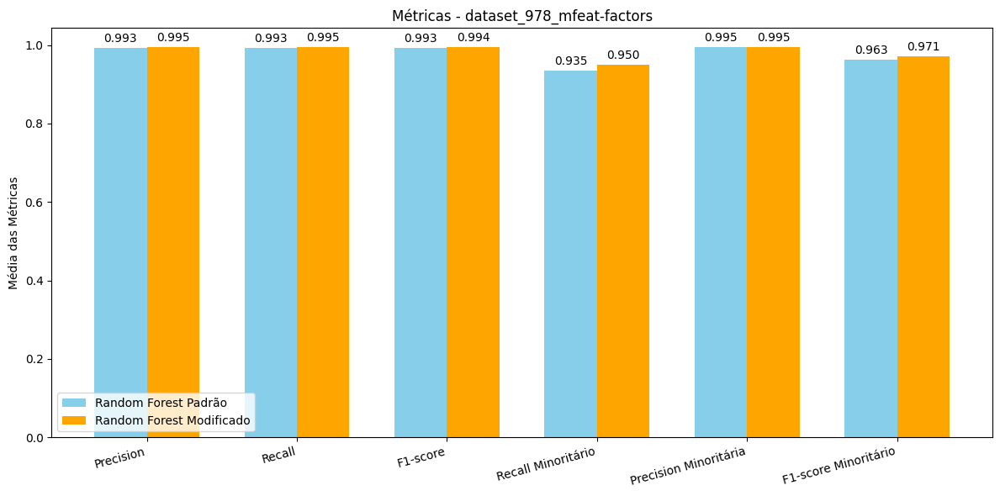


--- Avaliando: dataset_947_arsenic-male-bladder ---
Padrão: {'Precision': np.float64(0.9774), 'Recall': np.float64(0.9768), 'F1-score': np.float64(0.9717), 'Recall Minoritário': np.float64(0.47), 'Precision Minoritária': np.float64(1.0), 'F1-score Minoritário': np.float64(0.6167)}
Modificado: {'Precision': np.float64(0.9756), 'Recall': np.float64(0.975), 'F1-score': np.float64(0.9691), 'Recall Minoritário': np.float64(0.47), 'Precision Minoritária': np.float64(0.95), 'F1-score Minoritário': np.float64(0.5754)}


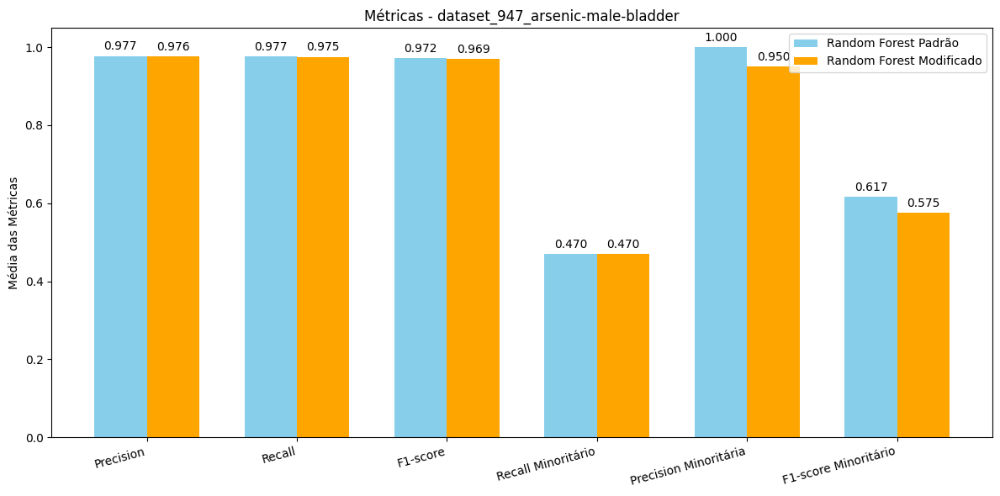


--- Avaliando: dataset_1004_synthetic_control ---
Padrão: {'Precision': np.float64(0.9983), 'Recall': np.float64(0.9983), 'F1-score': np.float64(0.9983), 'Recall Minoritário': np.float64(0.99), 'Precision Minoritária': np.float64(1.0), 'F1-score Minoritário': np.float64(0.9949)}
Modificado: {'Precision': np.float64(0.9983), 'Recall': np.float64(0.9983), 'F1-score': np.float64(0.9983), 'Recall Minoritário': np.float64(0.99), 'Precision Minoritária': np.float64(1.0), 'F1-score Minoritário': np.float64(0.9949)}


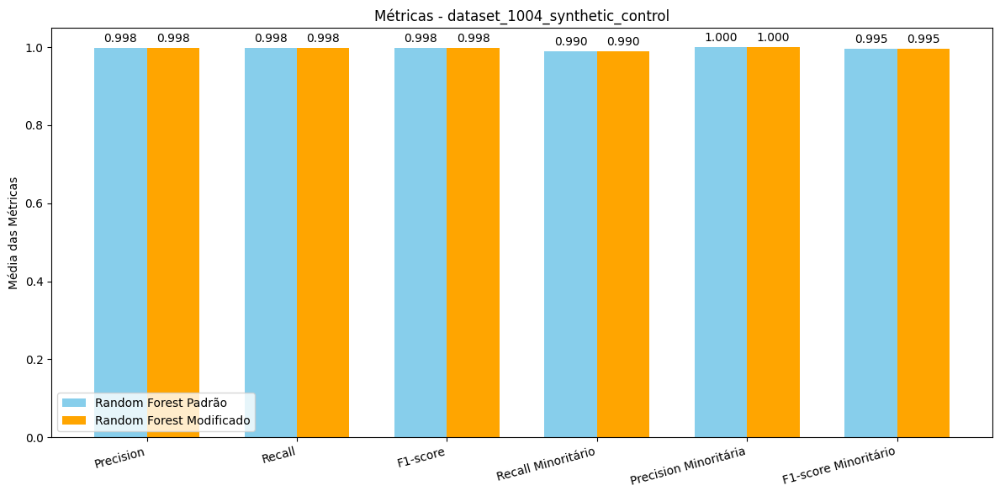


--- Avaliando: dataset_1056_mc1 ---
Padrão: {'Precision': np.float64(0.9857), 'Recall': np.float64(0.9928), 'F1-score': np.float64(0.9892), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.9911), 'Recall': np.float64(0.9888), 'F1-score': np.float64(0.9899), 'Recall Minoritário': np.float64(0.4571), 'Precision Minoritária': np.float64(0.3113), 'F1-score Minoritário': np.float64(0.3691)}


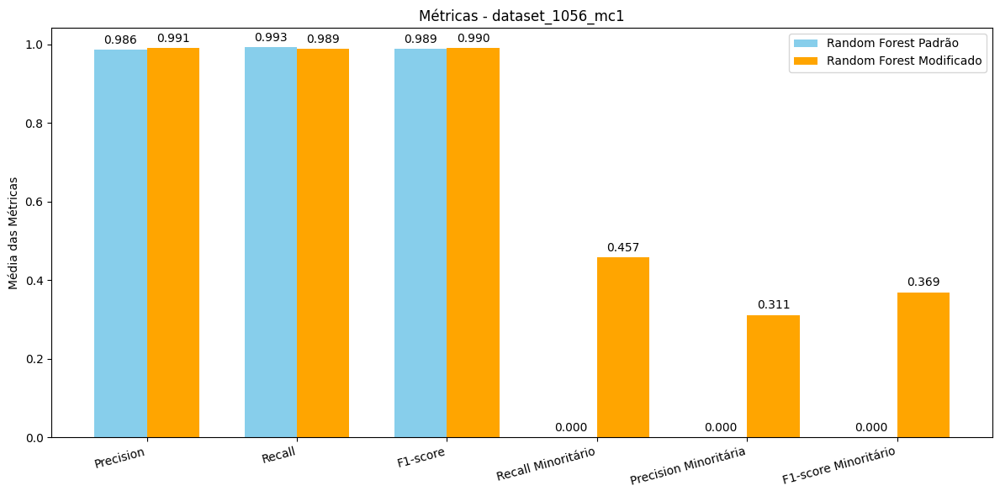


--- Avaliando: dataset_940_water-treatment ---
Padrão: {'Precision': np.float64(0.895), 'Recall': np.float64(0.9012), 'F1-score': np.float64(0.8813), 'Recall Minoritário': np.float64(0.4125), 'Precision Minoritária': np.float64(0.84), 'F1-score Minoritário': np.float64(0.5277)}
Modificado: {'Precision': np.float64(0.9207), 'Recall': np.float64(0.9222), 'F1-score': np.float64(0.9127), 'Recall Minoritário': np.float64(0.5375), 'Precision Minoritária': np.float64(0.907), 'F1-score Minoritário': np.float64(0.6716)}


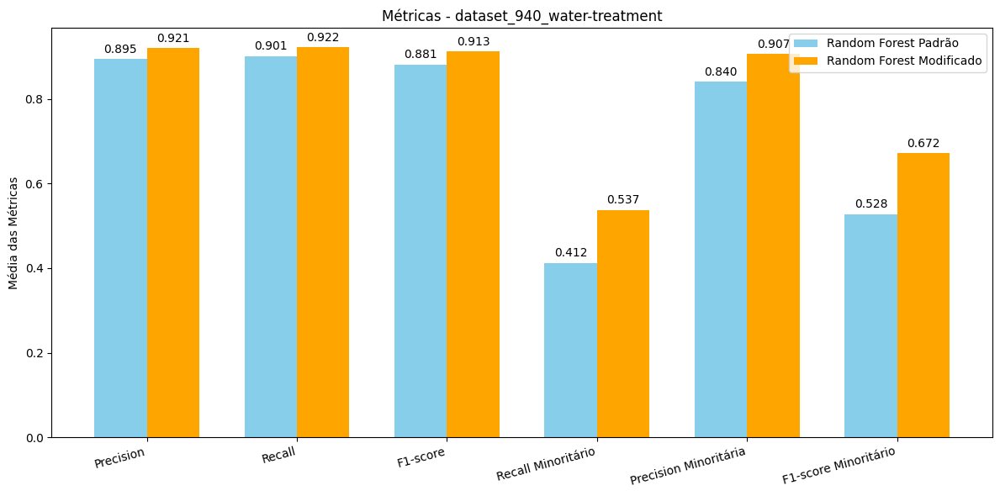


--- Avaliando: dataset_950_arsenic-female-lung ---
Padrão: {'Precision': np.float64(0.956), 'Recall': np.float64(0.975), 'F1-score': np.float64(0.9646), 'Recall Minoritário': np.float64(0.25), 'Precision Minoritária': np.float64(0.4), 'F1-score Minoritário': np.float64(0.3048)}
Modificado: {'Precision': np.float64(0.9823), 'Recall': np.float64(0.9821), 'F1-score': np.float64(0.9808), 'Recall Minoritário': np.float64(0.7), 'Precision Minoritária': np.float64(0.78), 'F1-score Minoritário': np.float64(0.6992)}


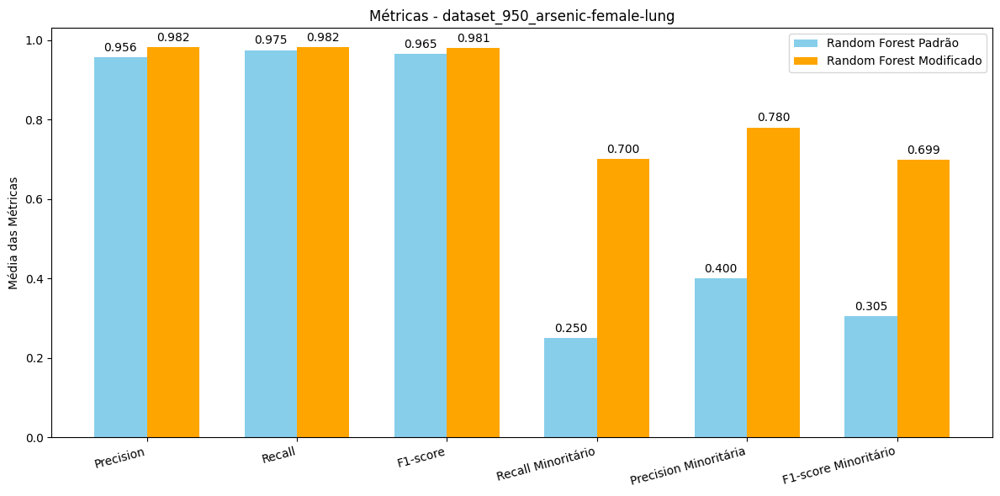


--- Avaliando: dataset_1014_analcatdata_dmft ---
Padrão: {'Precision': np.float64(0.6489), 'Recall': np.float64(0.8055), 'F1-score': np.float64(0.7188), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.6773), 'Recall': np.float64(0.4755), 'F1-score': np.float64(0.5271), 'Recall Minoritário': np.float64(0.5032), 'Precision Minoritária': np.float64(0.1861), 'F1-score Minoritário': np.float64(0.2714)}


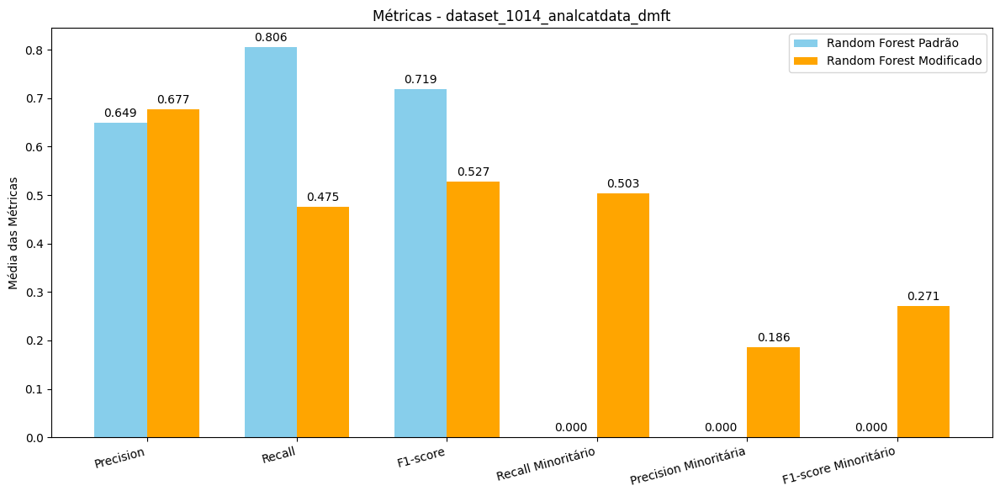


--- Avaliando: dataset_1039_hiva_agnostic ---
Padrão: {'Precision': np.float64(0.9308), 'Recall': np.float64(0.9648), 'F1-score': np.float64(0.9475), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.9603), 'Recall': np.float64(0.9674), 'F1-score': np.float64(0.9617), 'Recall Minoritário': np.float64(0.2818), 'Precision Minoritária': np.float64(0.577), 'F1-score Minoritário': np.float64(0.371)}


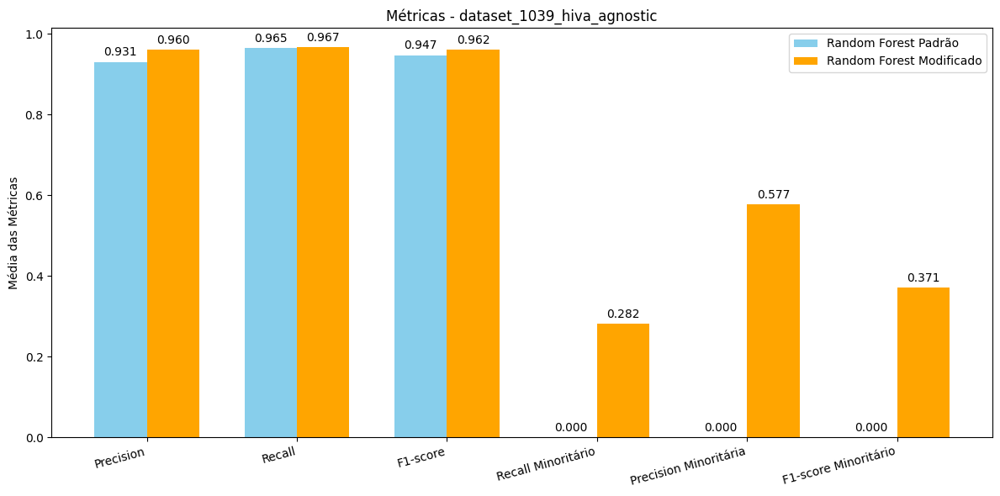


--- Avaliando: dataset_1018_ipums_la_99-small ---
Padrão: {'Precision': np.float64(0.8757), 'Recall': np.float64(0.9358), 'F1-score': np.float64(0.9047), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.922), 'Recall': np.float64(0.896), 'F1-score': np.float64(0.9071), 'Recall Minoritário': np.float64(0.4981), 'Precision Minoritária': np.float64(0.3091), 'F1-score Minoritário': np.float64(0.3813)}


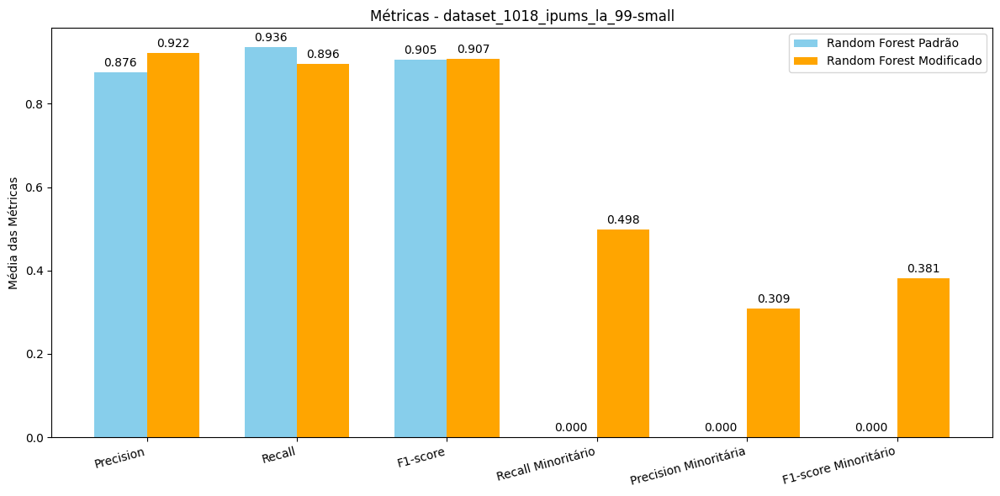


--- Avaliando: dataset_1002_ipums_la_98-small ---
Padrão: {'Precision': np.float64(0.7998), 'Recall': np.float64(0.8943), 'F1-score': np.float64(0.8444), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.8712), 'Recall': np.float64(0.8191), 'F1-score': np.float64(0.8399), 'Recall Minoritário': np.float64(0.5284), 'Precision Minoritária': np.float64(0.2994), 'F1-score Minoritário': np.float64(0.3819)}


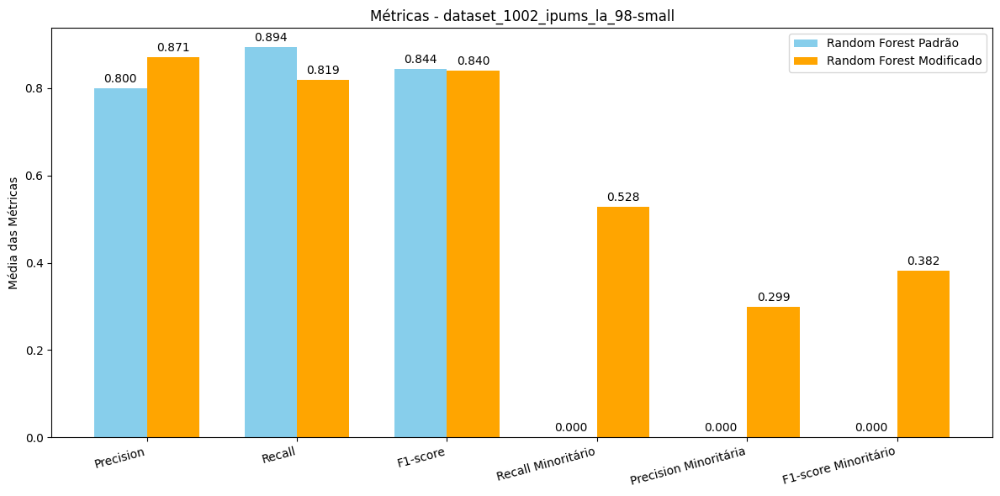


--- Avaliando: dataset_765_analcatdata_apnea2 ---
Padrão: {'Precision': np.float64(0.7487), 'Recall': np.float64(0.8653), 'F1-score': np.float64(0.8028), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.9262), 'Recall': np.float64(0.9032), 'F1-score': np.float64(0.9099), 'Recall Minoritário': np.float64(0.8449), 'Precision Minoritária': np.float64(0.6166), 'F1-score Minoritário': np.float64(0.705)}


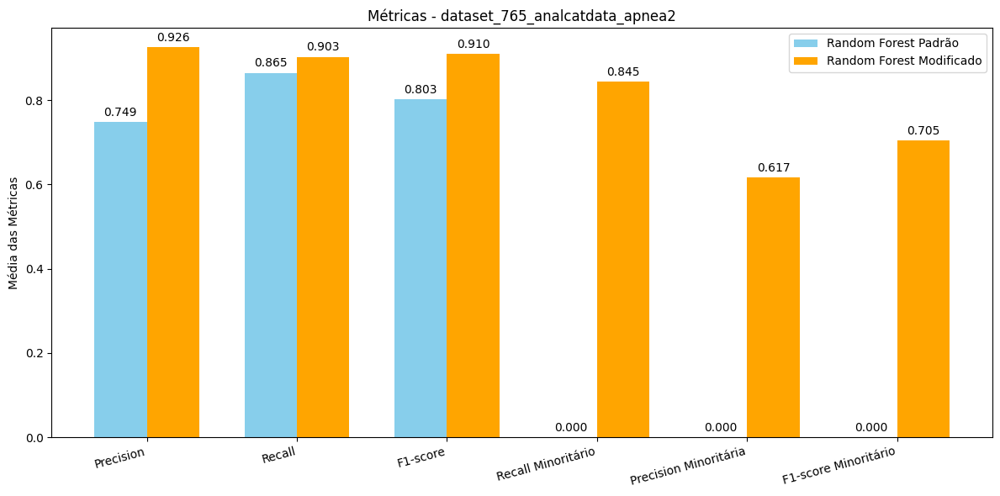


--- Avaliando: dataset_1016_vowel ---
Padrão: {'Precision': np.float64(0.988), 'Recall': np.float64(0.9879), 'F1-score': np.float64(0.9874), 'Recall Minoritário': np.float64(0.8889), 'Precision Minoritária': np.float64(0.9771), 'F1-score Minoritário': np.float64(0.9277)}
Modificado: {'Precision': np.float64(0.9842), 'Recall': np.float64(0.9808), 'F1-score': np.float64(0.9817), 'Recall Minoritário': np.float64(0.9889), 'Precision Minoritária': np.float64(0.8382), 'F1-score Minoritário': np.float64(0.9059)}


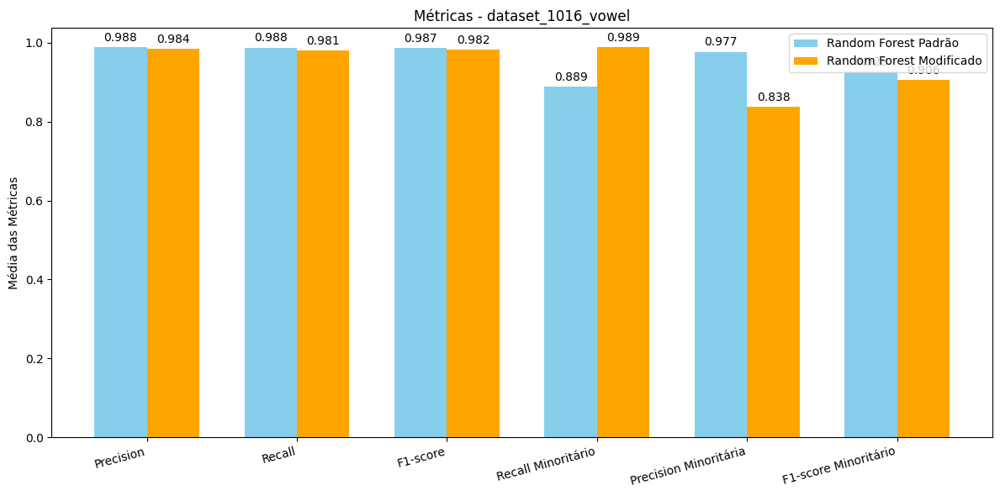


--- Avaliando: dataset_1045_kc1-top5 ---
Padrão: {'Precision': np.float64(0.913), 'Recall': np.float64(0.9517), 'F1-score': np.float64(0.9306), 'Recall Minoritário': np.float64(0.1), 'Precision Minoritária': np.float64(0.2), 'F1-score Minoritário': np.float64(0.1333)}
Modificado: {'Precision': np.float64(0.9256), 'Recall': np.float64(0.9448), 'F1-score': np.float64(0.9337), 'Recall Minoritário': np.float64(0.2), 'Precision Minoritária': np.float64(0.3), 'F1-score Minoritário': np.float64(0.2333)}


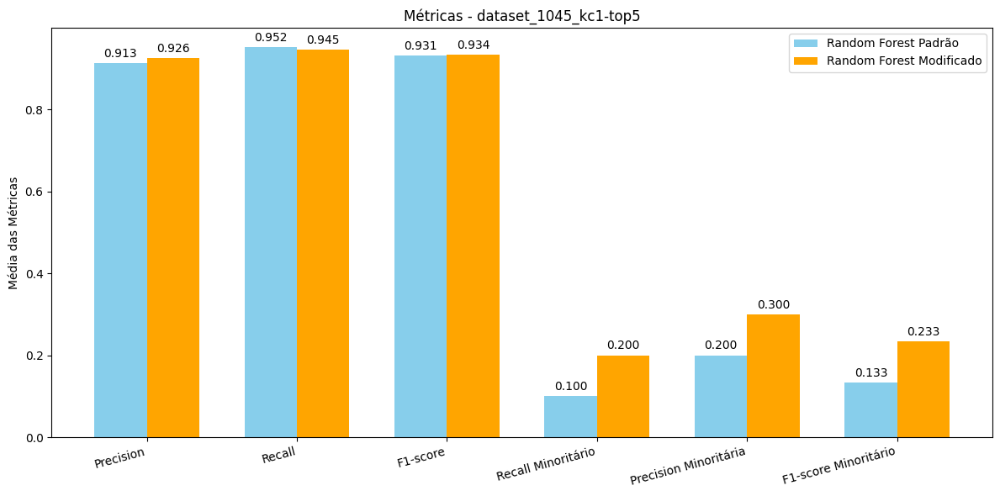


--- Avaliando: dataset_1013_analcatdata_challenger ---
Padrão: {'Precision': np.float64(0.8743), 'Recall': np.float64(0.9349), 'F1-score': np.float64(0.9035), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.884), 'Recall': np.float64(0.6881), 'F1-score': np.float64(0.7595), 'Recall Minoritário': np.float64(0.4), 'Precision Minoritária': np.float64(0.0593), 'F1-score Minoritário': np.float64(0.1033)}


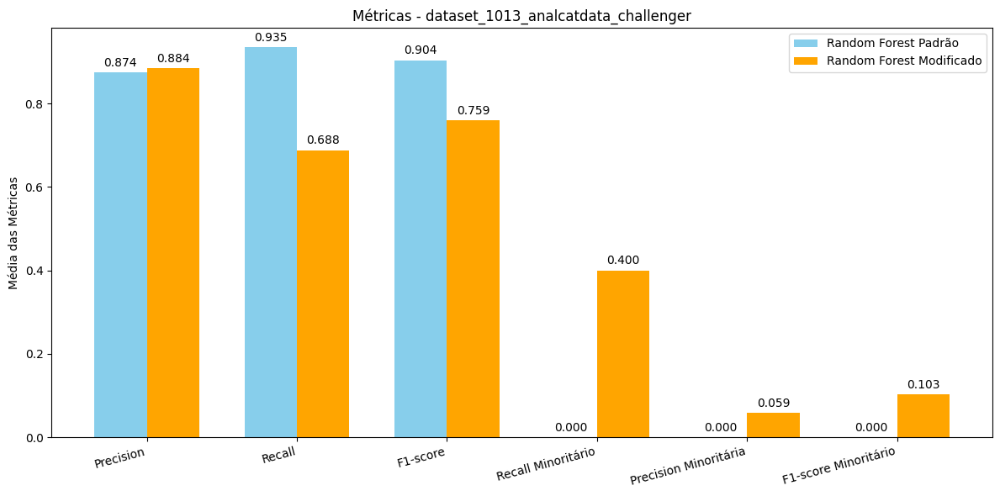


--- Avaliando: dataset_450_analcatdata_lawsuit ---
Padrão: {'Precision': np.float64(0.9791), 'Recall': np.float64(0.9774), 'F1-score': np.float64(0.9731), 'Recall Minoritário': np.float64(0.75), 'Precision Minoritária': np.float64(0.96), 'F1-score Minoritário': np.float64(0.7911)}
Modificado: {'Precision': np.float64(0.9809), 'Recall': np.float64(0.9734), 'F1-score': np.float64(0.9743), 'Recall Minoritário': np.float64(0.9), 'Precision Minoritária': np.float64(0.82), 'F1-score Minoritário': np.float64(0.8222)}


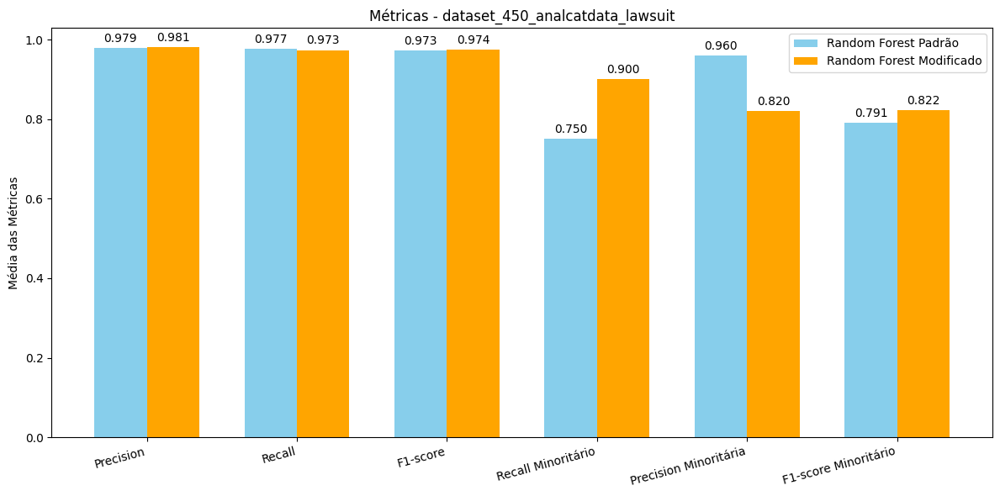


--- Avaliando: dataset_312_scene ---
Padrão: {'Precision': np.float64(0.9082), 'Recall': np.float64(0.9049), 'F1-score': np.float64(0.8926), 'Recall Minoritário': np.float64(0.5012), 'Precision Minoritária': np.float64(0.9397), 'F1-score Minoritário': np.float64(0.6531)}
Modificado: {'Precision': np.float64(0.9816), 'Recall': np.float64(0.9813), 'F1-score': np.float64(0.9809), 'Recall Minoritário': np.float64(0.9001), 'Precision Minoritária': np.float64(0.9949), 'F1-score Minoritário': np.float64(0.9449)}


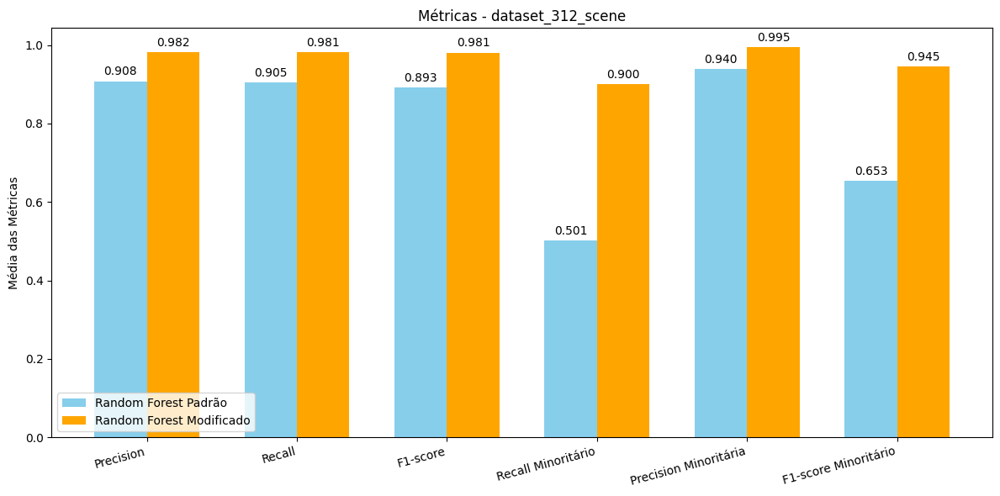


--- Avaliando: dataset_995_mfeat-zernike ---
Padrão: {'Precision': np.float64(0.9885), 'Recall': np.float64(0.9885), 'F1-score': np.float64(0.9882), 'Recall Minoritário': np.float64(0.895), 'Precision Minoritária': np.float64(0.9889), 'F1-score Minoritário': np.float64(0.9392)}
Modificado: {'Precision': np.float64(0.9909), 'Recall': np.float64(0.991), 'F1-score': np.float64(0.9909), 'Recall Minoritário': np.float64(0.93), 'Precision Minoritária': np.float64(0.9788), 'F1-score Minoritário': np.float64(0.9537)}


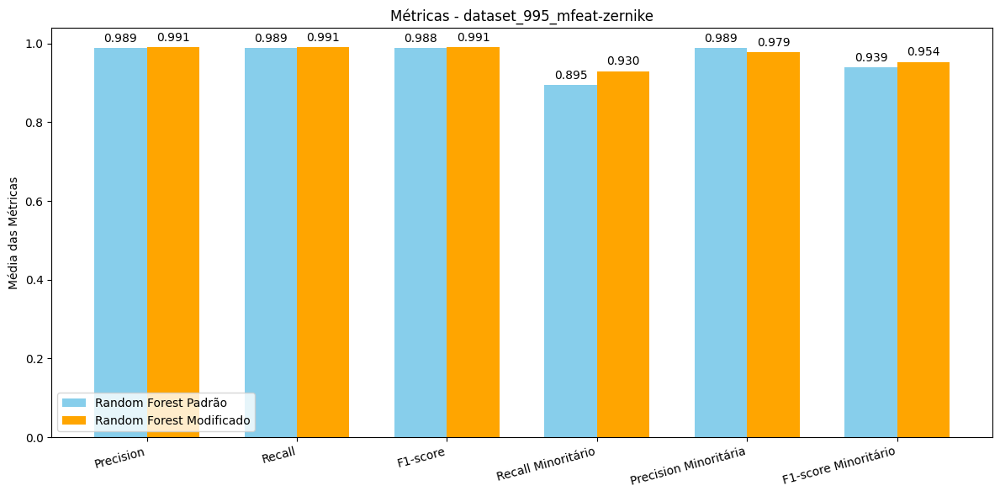


--- Avaliando: dataset_764_analcatdata_apnea3 ---
Padrão: {'Precision': np.float64(0.7705), 'Recall': np.float64(0.8778), 'F1-score': np.float64(0.8206), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.9258), 'Recall': np.float64(0.9022), 'F1-score': np.float64(0.9098), 'Recall Minoritário': np.float64(0.8182), 'Precision Minoritária': np.float64(0.5846), 'F1-score Minoritário': np.float64(0.6768)}


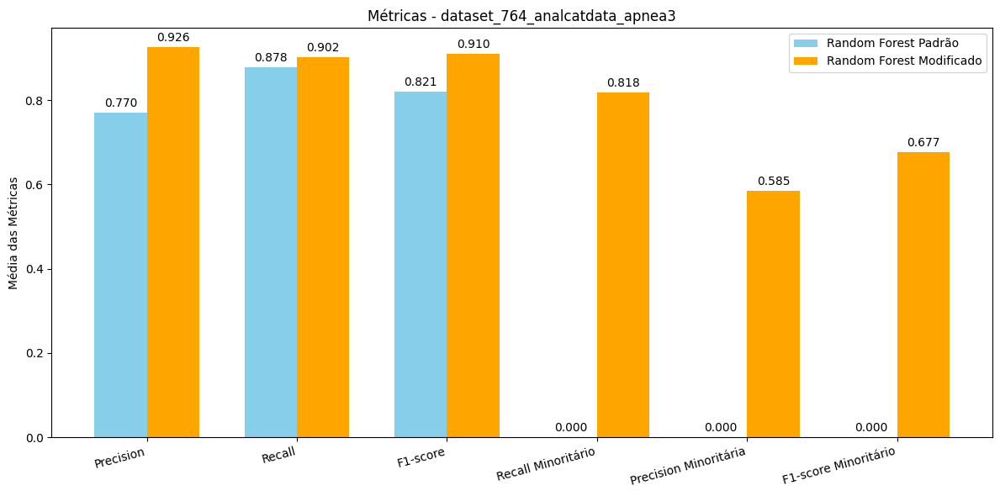


--- Avaliando: dataset_311_oil_spill ---
Padrão: {'Precision': np.float64(0.9335), 'Recall': np.float64(0.9573), 'F1-score': np.float64(0.9392), 'Recall Minoritário': np.float64(0.05), 'Precision Minoritária': np.float64(0.4), 'F1-score Minoritário': np.float64(0.0889)}
Modificado: {'Precision': np.float64(0.9621), 'Recall': np.float64(0.9658), 'F1-score': np.float64(0.9579), 'Recall Minoritário': np.float64(0.3167), 'Precision Minoritária': np.float64(0.7933), 'F1-score Minoritário': np.float64(0.4218)}


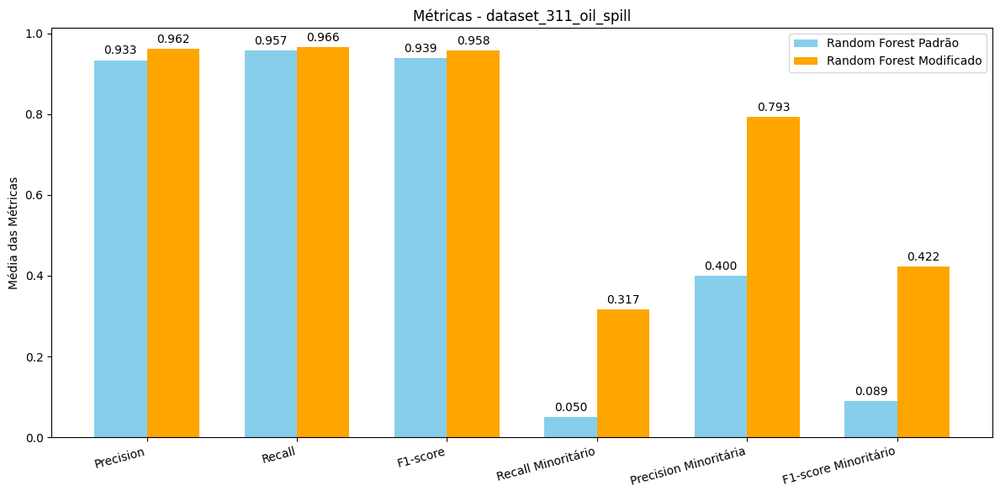


--- Avaliando: dataset_980_optdigits ---
Padrão: {'Precision': np.float64(0.9827), 'Recall': np.float64(0.9824), 'F1-score': np.float64(0.9816), 'Recall Minoritário': np.float64(0.8268), 'Precision Minoritária': np.float64(1.0), 'F1-score Minoritário': np.float64(0.9048)}
Modificado: {'Precision': np.float64(0.9818), 'Recall': np.float64(0.9813), 'F1-score': np.float64(0.9815), 'Recall Minoritário': np.float64(0.9231), 'Precision Minoritária': np.float64(0.8979), 'F1-score Minoritário': np.float64(0.9099)}


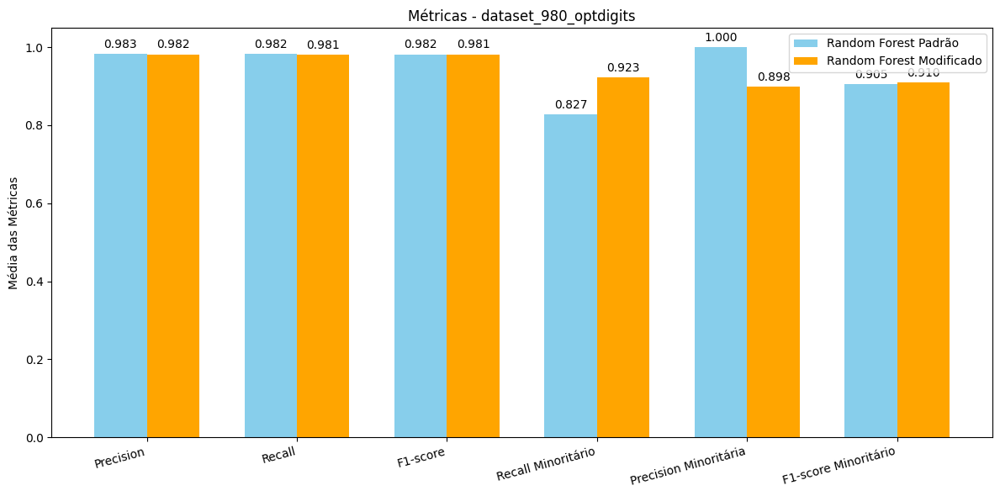


--- Avaliando: dataset_968_analcatdata_birthday ---
Padrão: {'Precision': np.float64(0.7304), 'Recall': np.float64(0.8521), 'F1-score': np.float64(0.7865), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.9133), 'Recall': np.float64(0.8438), 'F1-score': np.float64(0.8611), 'Recall Minoritário': np.float64(0.8891), 'Precision Minoritária': np.float64(0.5172), 'F1-score Minoritário': np.float64(0.635)}


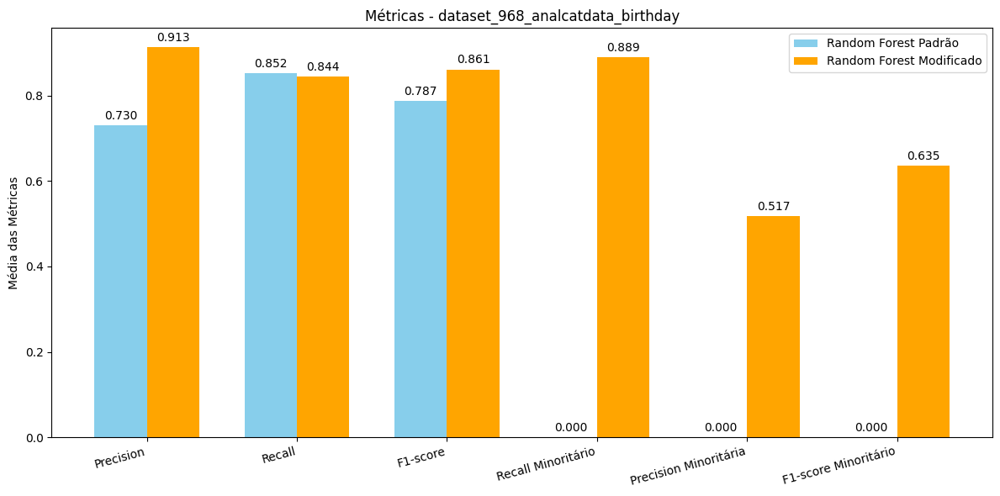


--- Avaliando: dataset_987_collins ---
Padrão: {'Precision': np.float64(0.9788), 'Recall': np.float64(0.978), 'F1-score': np.float64(0.9772), 'Recall Minoritário': np.float64(0.875), 'Precision Minoritária': np.float64(0.9882), 'F1-score Minoritário': np.float64(0.9254)}
Modificado: {'Precision': np.float64(1.0), 'Recall': np.float64(1.0), 'F1-score': np.float64(1.0), 'Recall Minoritário': np.float64(1.0), 'Precision Minoritária': np.float64(1.0), 'F1-score Minoritário': np.float64(1.0)}


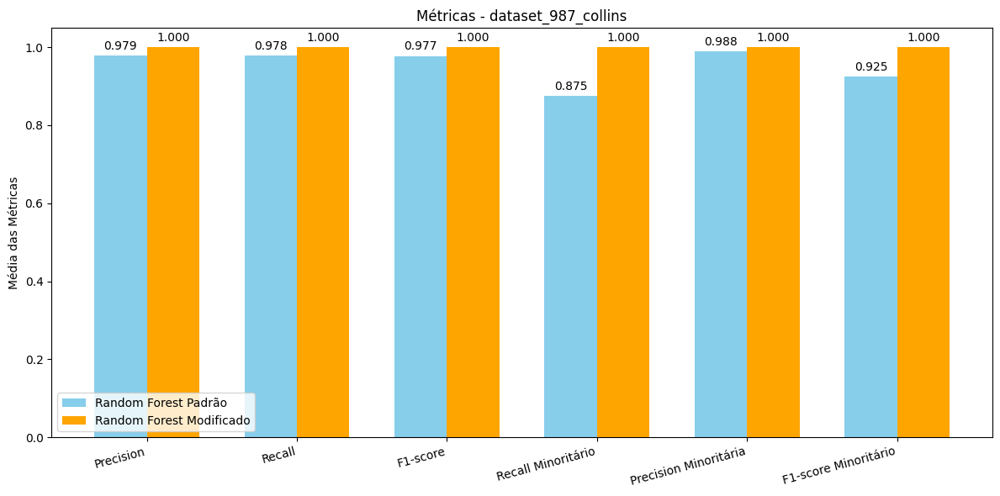


--- Avaliando: dataset_767_analcatdata_apnea1 ---
Padrão: {'Precision': np.float64(0.7597), 'Recall': np.float64(0.8716), 'F1-score': np.float64(0.8118), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.92), 'Recall': np.float64(0.8884), 'F1-score': np.float64(0.8984), 'Recall Minoritário': np.float64(0.8372), 'Precision Minoritária': np.float64(0.5557), 'F1-score Minoritário': np.float64(0.6642)}


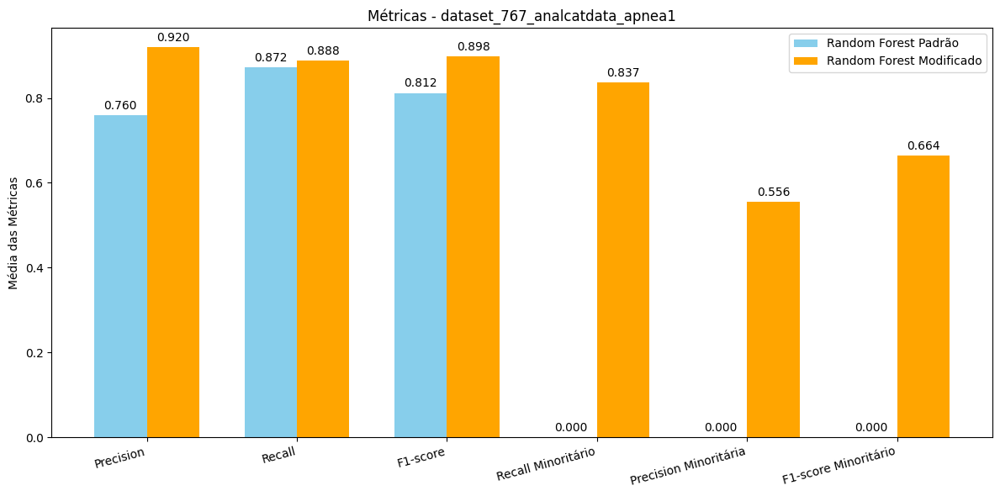


--- Avaliando: dataset_875_analcatdata_chlamydia ---
Padrão: {'Precision': np.float64(0.883), 'Recall': np.float64(0.91), 'F1-score': np.float64(0.8859), 'Recall Minoritário': np.float64(0.5333), 'Precision Minoritária': np.float64(0.8), 'F1-score Minoritário': np.float64(0.6267)}
Modificado: {'Precision': np.float64(0.9219), 'Recall': np.float64(0.88), 'F1-score': np.float64(0.8891), 'Recall Minoritário': np.float64(0.95), 'Precision Minoritária': np.float64(0.6667), 'F1-score Minoritário': np.float64(0.7733)}


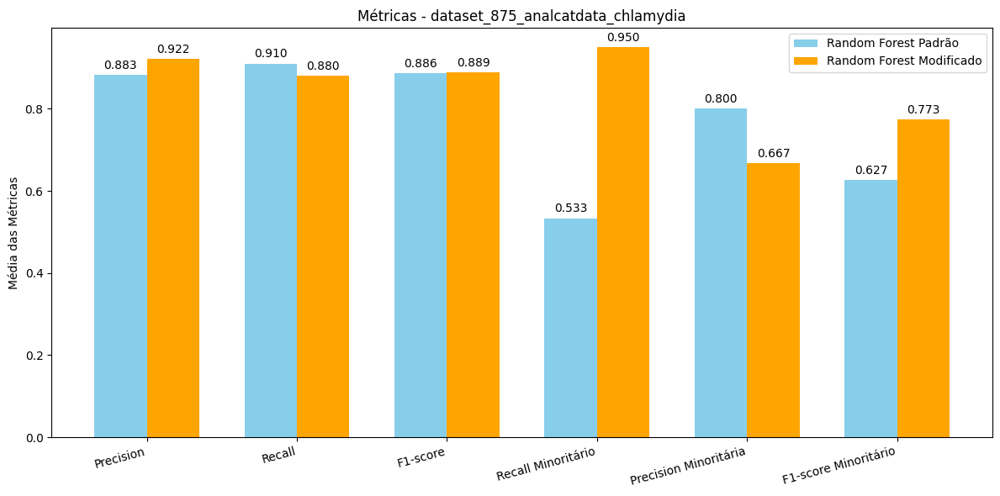


--- Avaliando: dataset_1061_ar4 ---
Padrão: {'Precision': np.float64(0.8484), 'Recall': np.float64(0.8307), 'F1-score': np.float64(0.822), 'Recall Minoritário': np.float64(0.4), 'Precision Minoritária': np.float64(0.7667), 'F1-score Minoritário': np.float64(0.501)}
Modificado: {'Precision': np.float64(0.828), 'Recall': np.float64(0.8013), 'F1-score': np.float64(0.8084), 'Recall Minoritário': np.float64(0.5), 'Precision Minoritária': np.float64(0.6186), 'F1-score Minoritário': np.float64(0.5356)}


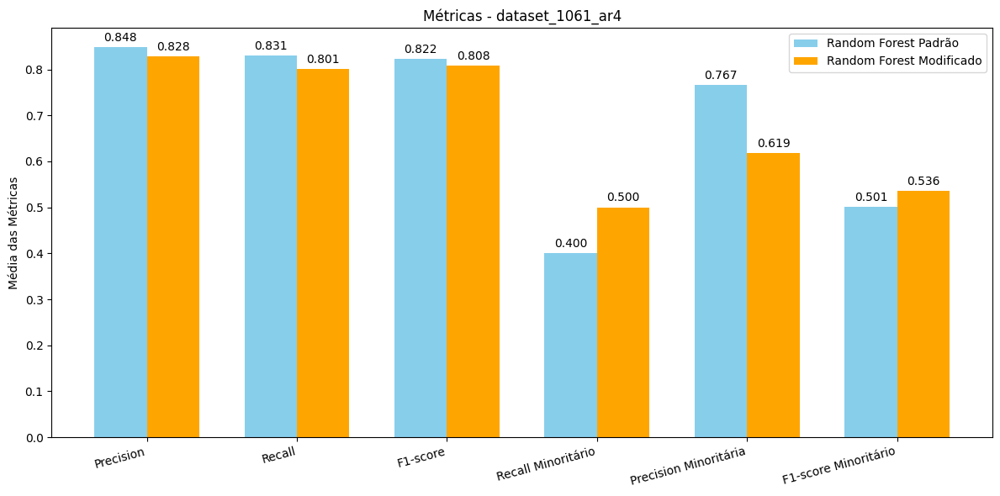


--- Avaliando: dataset_962_mfeat-morphological ---
Padrão: {'Precision': np.float64(0.9936), 'Recall': np.float64(0.9935), 'F1-score': np.float64(0.9934), 'Recall Minoritário': np.float64(0.935), 'Precision Minoritária': np.float64(1.0), 'F1-score Minoritário': np.float64(0.9659)}
Modificado: {'Precision': np.float64(0.9966), 'Recall': np.float64(0.9965), 'F1-score': np.float64(0.9965), 'Recall Minoritário': np.float64(0.985), 'Precision Minoritária': np.float64(0.9812), 'F1-score Minoritário': np.float64(0.9826)}


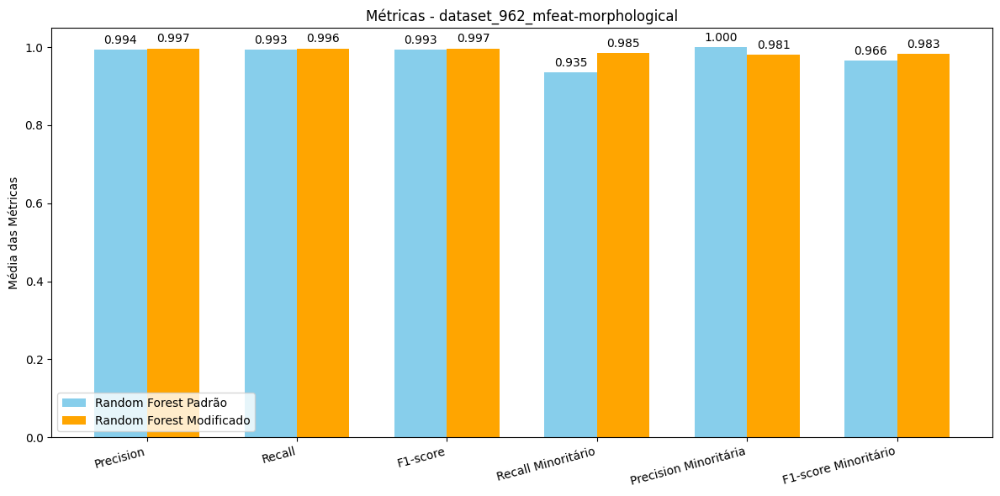


--- Avaliando: dataset_757_meta ---
Padrão: {'Precision': np.float64(0.8056), 'Recall': np.float64(0.8939), 'F1-score': np.float64(0.8474), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.8976), 'Recall': np.float64(0.8333), 'F1-score': np.float64(0.8549), 'Recall Minoritário': np.float64(0.68), 'Precision Minoritária': np.float64(0.3428), 'F1-score Minoritário': np.float64(0.449)}


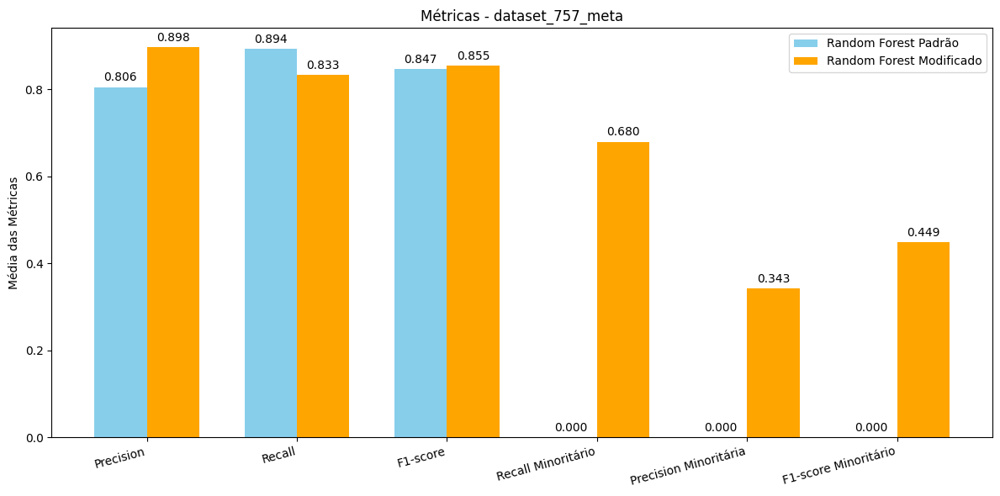


--- Avaliando: dataset_951_arsenic-male-lung ---
Padrão: {'Precision': np.float64(0.9965), 'Recall': np.float64(0.9964), 'F1-score': np.float64(0.9956), 'Recall Minoritário': np.float64(0.8667), 'Precision Minoritária': np.float64(1.0), 'F1-score Minoritário': np.float64(0.9)}
Modificado: {'Precision': np.float64(1.0), 'Recall': np.float64(1.0), 'F1-score': np.float64(1.0), 'Recall Minoritário': np.float64(1.0), 'Precision Minoritária': np.float64(1.0), 'F1-score Minoritário': np.float64(1.0)}


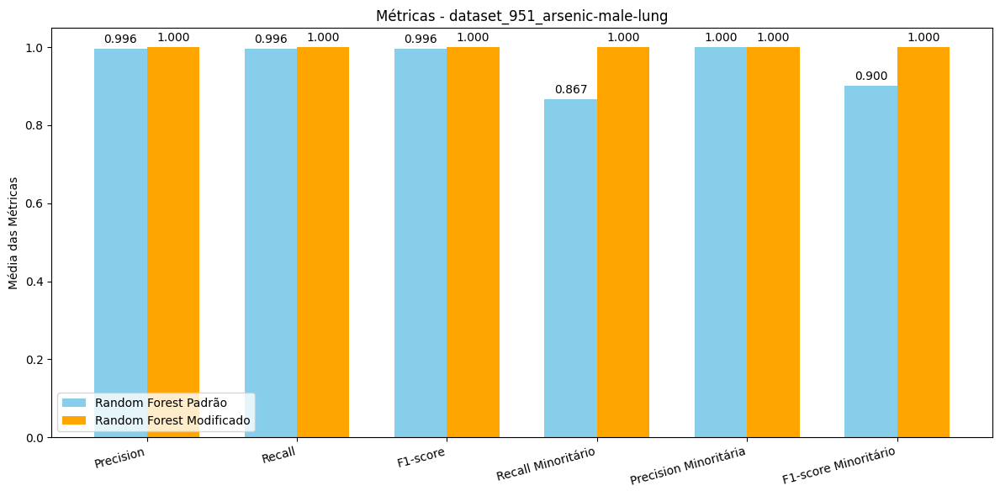


--- Avaliando: dataset_958_segment ---
Padrão: {'Precision': np.float64(0.9953), 'Recall': np.float64(0.9952), 'F1-score': np.float64(0.9952), 'Recall Minoritário': np.float64(0.9788), 'Precision Minoritária': np.float64(0.9881), 'F1-score Minoritário': np.float64(0.9832)}
Modificado: {'Precision': np.float64(0.997), 'Recall': np.float64(0.997), 'F1-score': np.float64(0.997), 'Recall Minoritário': np.float64(0.9909), 'Precision Minoritária': np.float64(0.9882), 'F1-score Minoritário': np.float64(0.9894)}


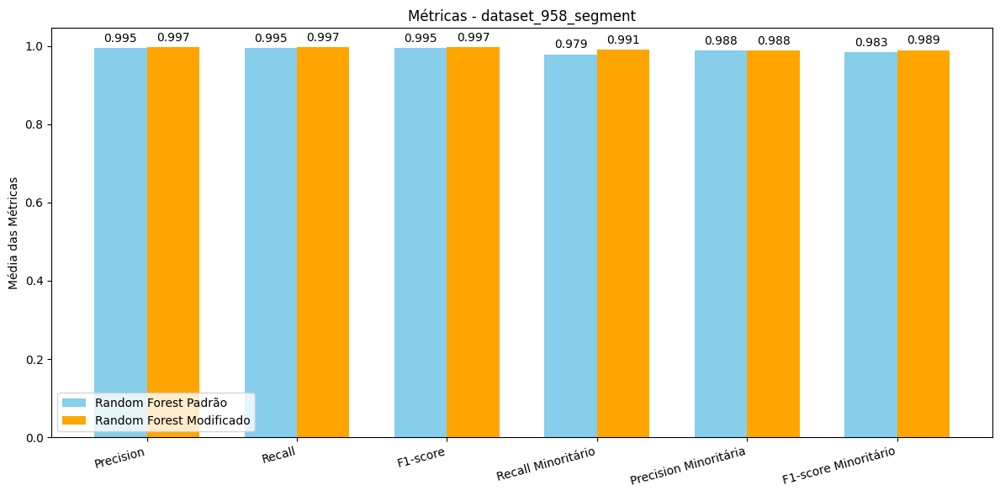


--- Avaliando: dataset_1064_ar6 ---
Padrão: {'Precision': np.float64(0.8052), 'Recall': np.float64(0.8705), 'F1-score': np.float64(0.8288), 'Recall Minoritário': np.float64(0.2), 'Precision Minoritária': np.float64(0.4), 'F1-score Minoritário': np.float64(0.26)}
Modificado: {'Precision': np.float64(0.7861), 'Recall': np.float64(0.8405), 'F1-score': np.float64(0.8095), 'Recall Minoritário': np.float64(0.2), 'Precision Minoritária': np.float64(0.3), 'F1-score Minoritário': np.float64(0.24)}


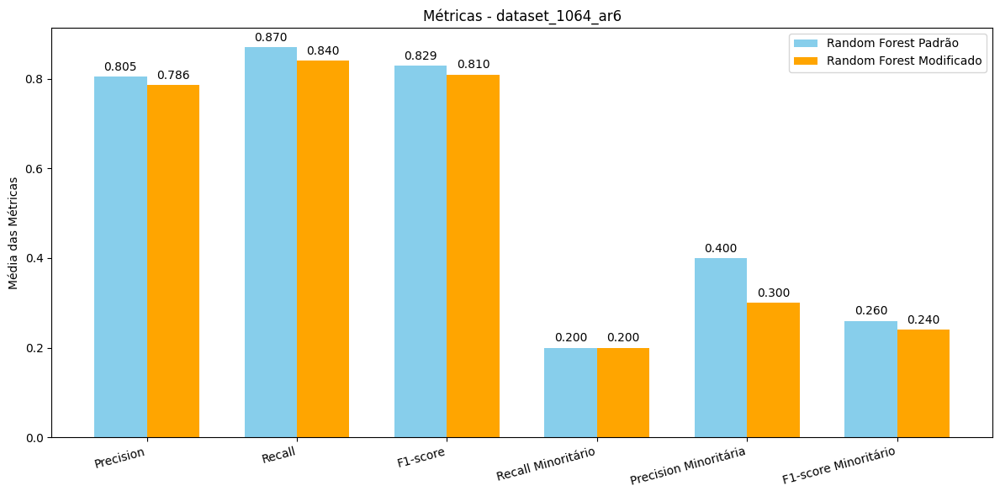


--- Avaliando: dataset_1050_pc3 ---
Padrão: {'Precision': np.float64(0.8565), 'Recall': np.float64(0.8951), 'F1-score': np.float64(0.8576), 'Recall Minoritário': np.float64(0.0562), 'Precision Minoritária': np.float64(0.4571), 'F1-score Minoritário': np.float64(0.0978)}
Modificado: {'Precision': np.float64(0.8703), 'Recall': np.float64(0.8503), 'F1-score': np.float64(0.8591), 'Recall Minoritário': np.float64(0.425), 'Precision Minoritária': np.float64(0.3287), 'F1-score Minoritário': np.float64(0.3686)}


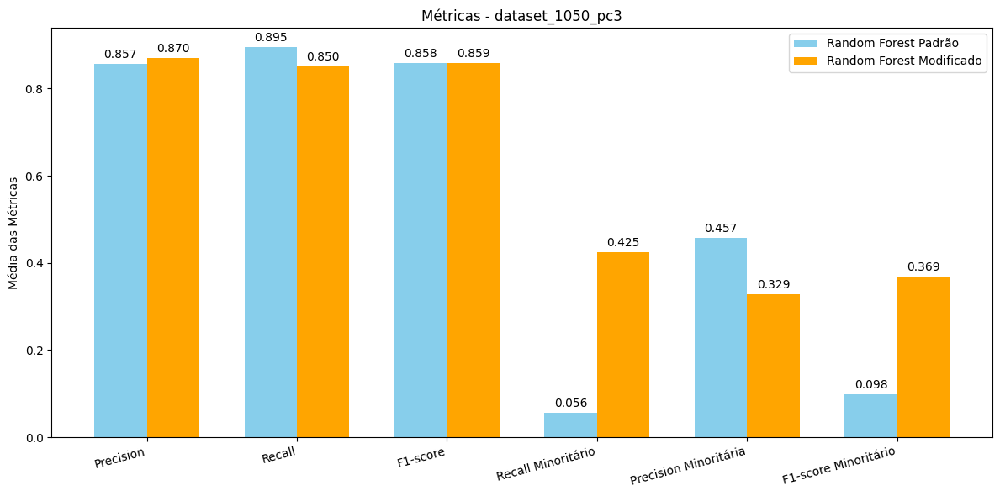


--- Avaliando: dataset_463_backache ---
Padrão: {'Precision': np.float64(0.7401), 'Recall': np.float64(0.85), 'F1-score': np.float64(0.7912), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.7893), 'Recall': np.float64(0.8444), 'F1-score': np.float64(0.8136), 'Recall Minoritário': np.float64(0.16), 'Precision Minoritária': np.float64(0.25), 'F1-score Minoritário': np.float64(0.1944)}


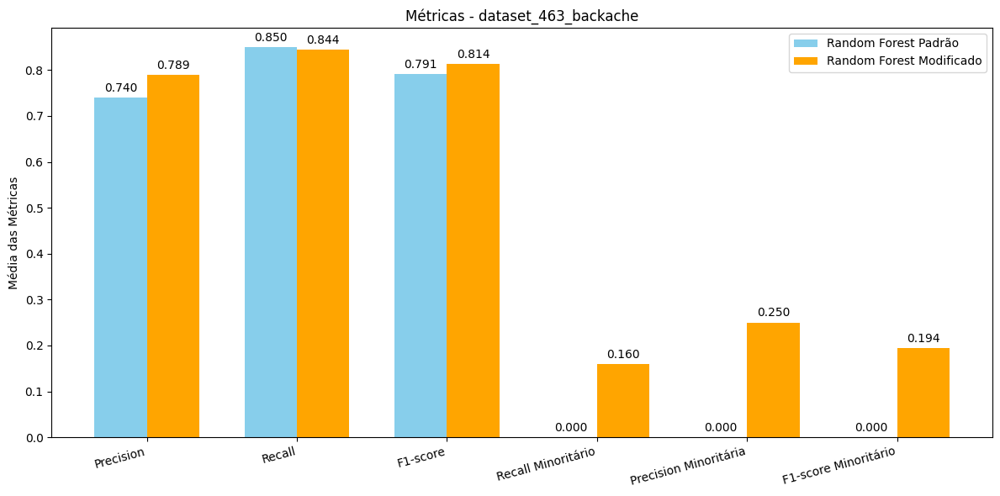


--- Avaliando: dataset_1000_hypothyroid ---
Padrão: {'Precision': np.float64(0.8868), 'Recall': np.float64(0.9276), 'F1-score': np.float64(0.896), 'Recall Minoritário': np.float64(0.0613), 'Precision Minoritária': np.float64(0.4), 'F1-score Minoritário': np.float64(0.1025)}
Modificado: {'Precision': np.float64(0.9711), 'Recall': np.float64(0.9578), 'F1-score': np.float64(0.9616), 'Recall Minoritário': np.float64(0.9724), 'Precision Minoritária': np.float64(0.6545), 'F1-score Minoritário': np.float64(0.7816)}


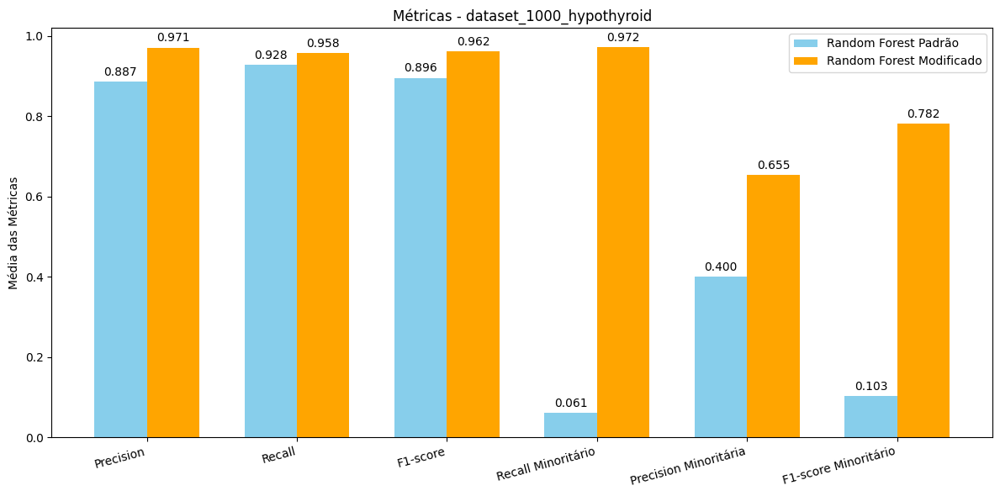


--- Avaliando: dataset_1049_pc4 ---
Padrão: {'Precision': np.float64(0.8852), 'Recall': np.float64(0.8971), 'F1-score': np.float64(0.8751), 'Recall Minoritário': np.float64(0.2802), 'Precision Minoritária': np.float64(0.7209), 'F1-score Minoritário': np.float64(0.381)}
Modificado: {'Precision': np.float64(0.9019), 'Recall': np.float64(0.8718), 'F1-score': np.float64(0.8822), 'Recall Minoritário': np.float64(0.7189), 'Precision Minoritária': np.float64(0.4959), 'F1-score Minoritário': np.float64(0.5811)}


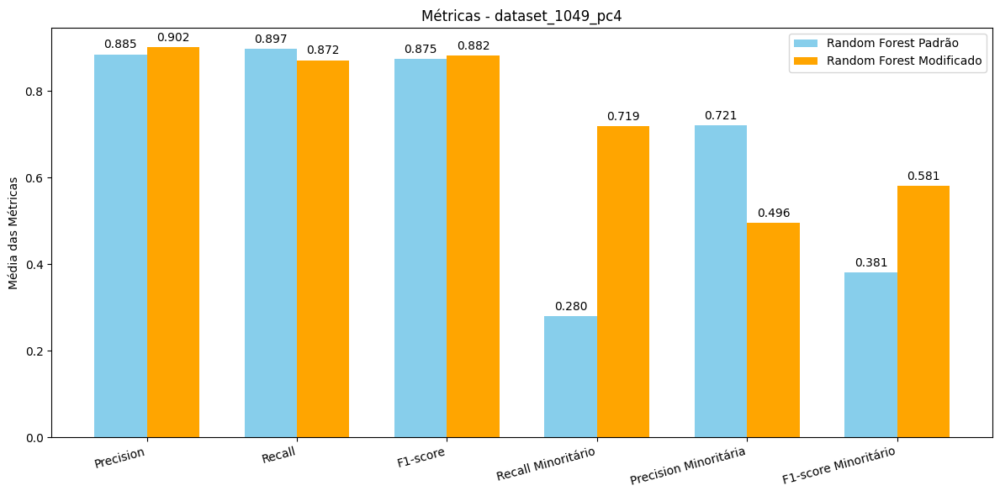


--- Avaliando: dataset_1023_soybean ---
Padrão: {'Precision': np.float64(0.9611), 'Recall': np.float64(0.959), 'F1-score': np.float64(0.9554), 'Recall Minoritário': np.float64(0.6959), 'Precision Minoritária': np.float64(1.0), 'F1-score Minoritário': np.float64(0.817)}
Modificado: {'Precision': np.float64(0.9392), 'Recall': np.float64(0.918), 'F1-score': np.float64(0.9237), 'Recall Minoritário': np.float64(0.9129), 'Precision Minoritária': np.float64(0.6389), 'F1-score Minoritário': np.float64(0.7485)}


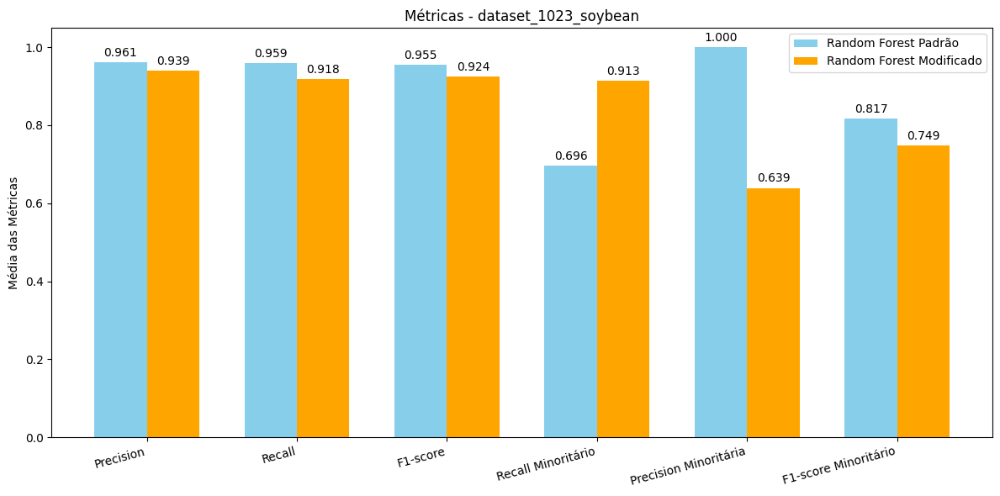


--- Avaliando: dataset_316_yeast_ml8 ---
Padrão: {'Precision': np.float64(0.9721), 'Recall': np.float64(0.9859), 'F1-score': np.float64(0.9789), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.9721), 'Recall': np.float64(0.9859), 'F1-score': np.float64(0.9789), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}


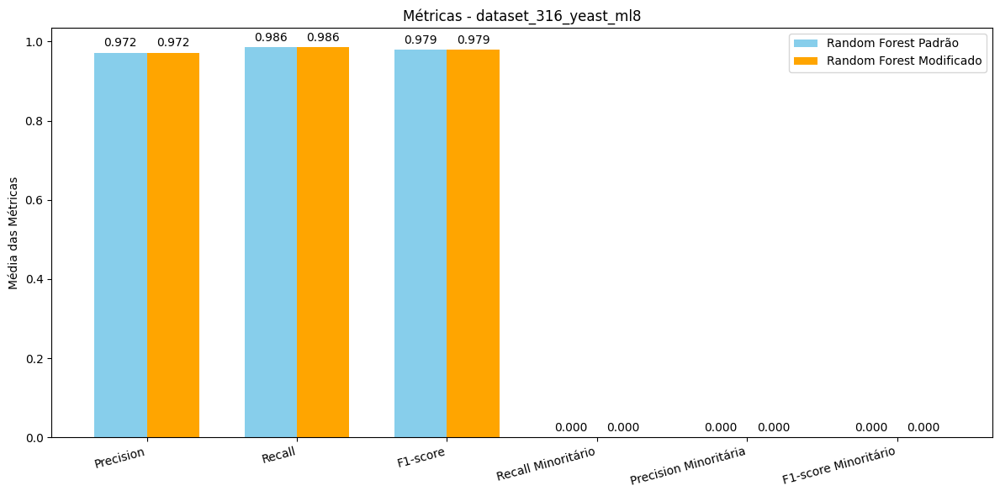


--- Avaliando: dataset_949_arsenic-female-bladder ---
Padrão: {'Precision': np.float64(0.8862), 'Recall': np.float64(0.8766), 'F1-score': np.float64(0.8354), 'Recall Minoritário': np.float64(0.15), 'Precision Minoritária': np.float64(0.95), 'F1-score Minoritário': np.float64(0.2524)}
Modificado: {'Precision': np.float64(0.836), 'Recall': np.float64(0.8033), 'F1-score': np.float64(0.8165), 'Recall Minoritário': np.float64(0.5125), 'Precision Minoritária': np.float64(0.3766), 'F1-score Minoritário': np.float64(0.4309)}


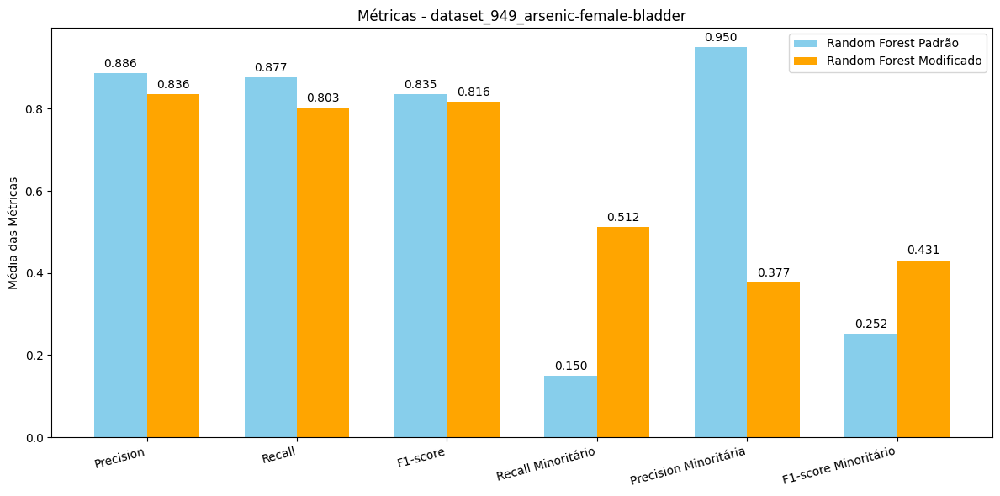


--- Avaliando: dataset_1022_mfeat-pixel ---
Padrão: {'Precision': np.float64(0.9925), 'Recall': np.float64(0.9925), 'F1-score': np.float64(0.9924), 'Recall Minoritário': np.float64(0.93), 'Precision Minoritária': np.float64(0.9947), 'F1-score Minoritário': np.float64(0.961)}
Modificado: {'Precision': np.float64(0.9935), 'Recall': np.float64(0.9935), 'F1-score': np.float64(0.9934), 'Recall Minoritário': np.float64(0.94), 'Precision Minoritária': np.float64(0.9947), 'F1-score Minoritário': np.float64(0.9664)}


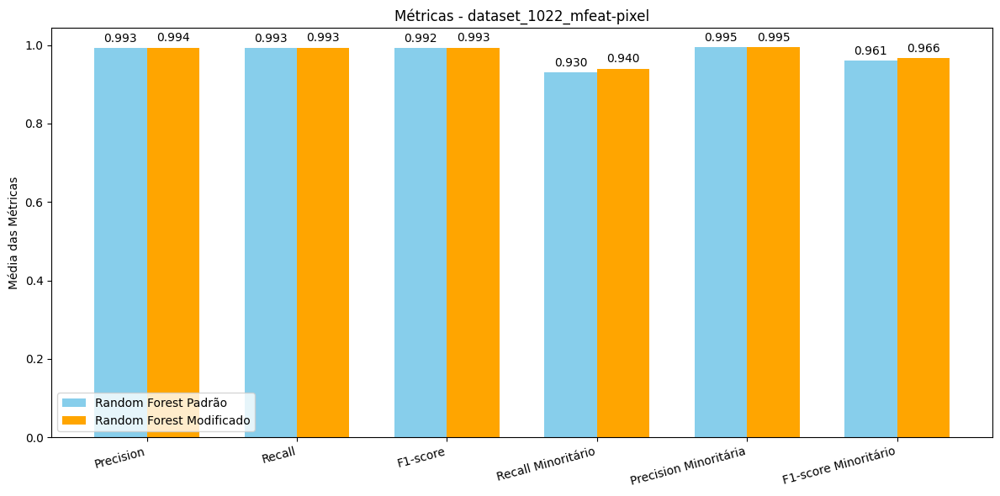


--- Avaliando: dataset_954_spectrometer ---
Padrão: {'Precision': np.float64(0.8036), 'Recall': np.float64(0.8964), 'F1-score': np.float64(0.8475), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.9102), 'Recall': np.float64(0.8907), 'F1-score': np.float64(0.8971), 'Recall Minoritário': np.float64(0.6364), 'Precision Minoritária': np.float64(0.507), 'F1-score Minoritário': np.float64(0.5469)}


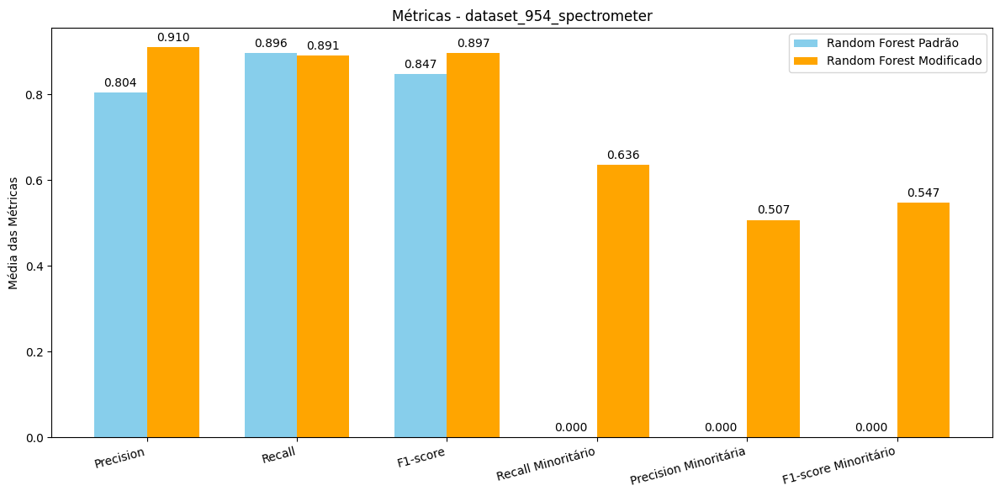


--- Avaliando: dataset_966_analcatdata_halloffame ---
Padrão: {'Precision': np.float64(0.9455), 'Recall': np.float64(0.9478), 'F1-score': np.float64(0.9437), 'Recall Minoritário': np.float64(0.568), 'Precision Minoritária': np.float64(0.8349), 'F1-score Minoritário': np.float64(0.6727)}
Modificado: {'Precision': np.float64(0.93), 'Recall': np.float64(0.9179), 'F1-score': np.float64(0.9226), 'Recall Minoritário': np.float64(0.704), 'Precision Minoritária': np.float64(0.5543), 'F1-score Minoritário': np.float64(0.6174)}


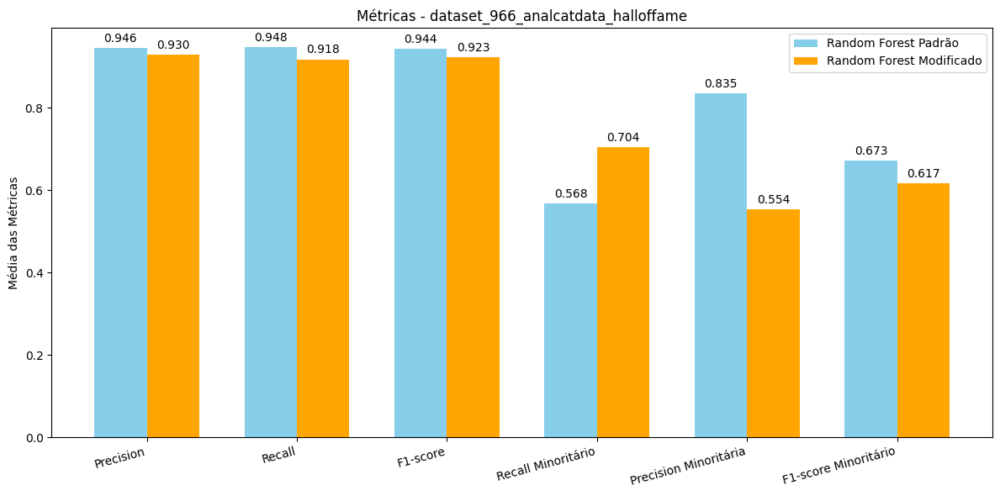


--- Avaliando: dataset_971_mfeat-fourier ---
Padrão: {'Precision': np.float64(0.9951), 'Recall': np.float64(0.995), 'F1-score': np.float64(0.9949), 'Recall Minoritário': np.float64(0.95), 'Precision Minoritária': np.float64(1.0), 'F1-score Minoritário': np.float64(0.9736)}
Modificado: {'Precision': np.float64(0.998), 'Recall': np.float64(0.998), 'F1-score': np.float64(0.998), 'Recall Minoritário': np.float64(0.98), 'Precision Minoritária': np.float64(1.0), 'F1-score Minoritário': np.float64(0.9898)}


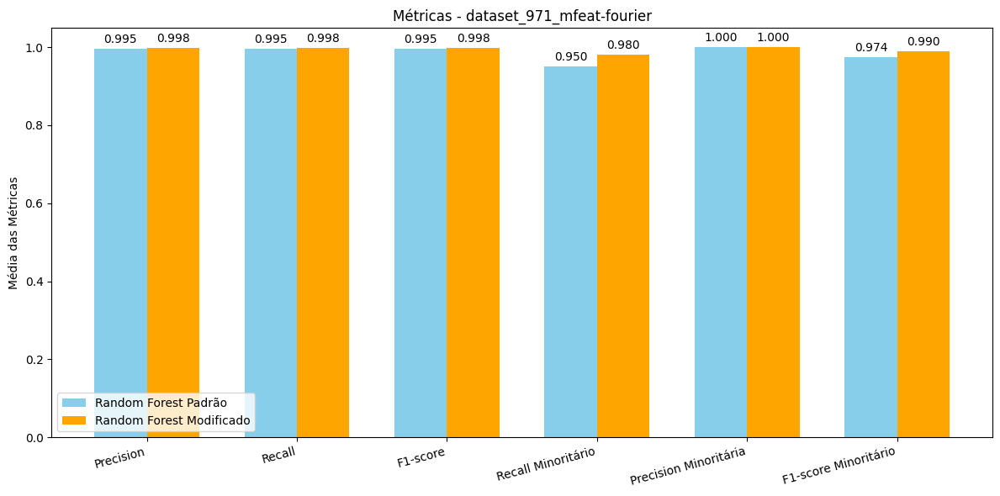


--- Avaliando: dataset_1065_kc3 ---
Padrão: {'Precision': np.float64(0.8538), 'Recall': np.float64(0.8974), 'F1-score': np.float64(0.8712), 'Recall Minoritário': np.float64(0.1167), 'Precision Minoritária': np.float64(0.2667), 'F1-score Minoritário': np.float64(0.1564)}
Modificado: {'Precision': np.float64(0.8654), 'Recall': np.float64(0.8626), 'F1-score': np.float64(0.8603), 'Recall Minoritário': np.float64(0.2583), 'Precision Minoritária': np.float64(0.31), 'F1-score Minoritário': np.float64(0.2508)}


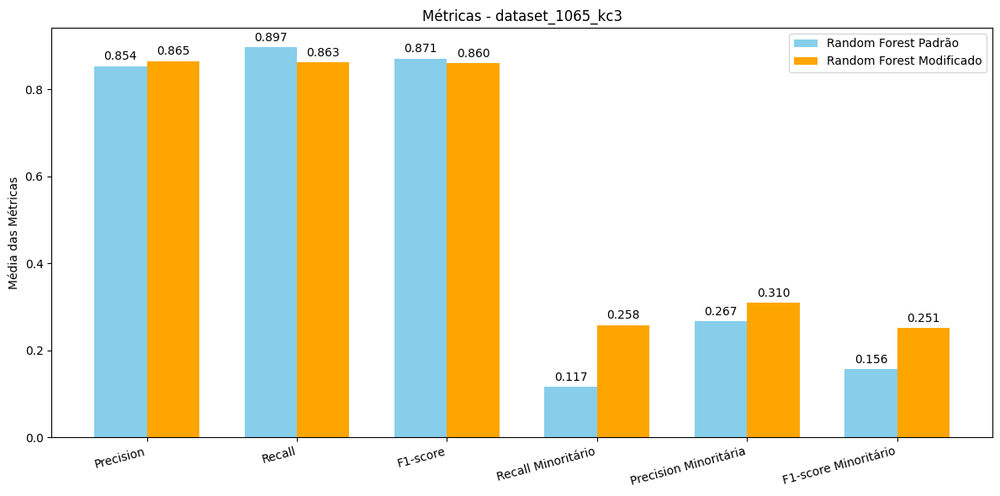


--- Avaliando: dataset_1021_page-blocks ---
Padrão: {'Precision': np.float64(0.9745), 'Recall': np.float64(0.975), 'F1-score': np.float64(0.9745), 'Recall Minoritário': np.float64(0.8411), 'Precision Minoritária': np.float64(0.9078), 'F1-score Minoritário': np.float64(0.8727)}
Modificado: {'Precision': np.float64(0.9573), 'Recall': np.float64(0.9424), 'F1-score': np.float64(0.9468), 'Recall Minoritário': np.float64(0.9321), 'Precision Minoritária': np.float64(0.6536), 'F1-score Minoritário': np.float64(0.7683)}


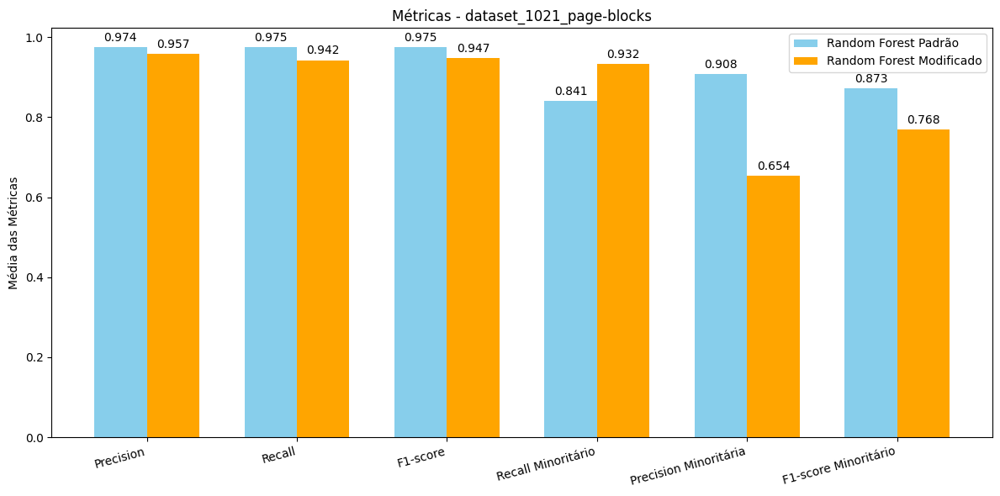


--- Avaliando: dataset_1020_mfeat-karhunen ---
Padrão: {'Precision': np.float64(0.9795), 'Recall': np.float64(0.979), 'F1-score': np.float64(0.9778), 'Recall Minoritário': np.float64(0.79), 'Precision Minoritária': np.float64(1.0), 'F1-score Minoritário': np.float64(0.8817)}
Modificado: {'Precision': np.float64(0.9881), 'Recall': np.float64(0.988), 'F1-score': np.float64(0.9876), 'Recall Minoritário': np.float64(0.885), 'Precision Minoritária': np.float64(0.9941), 'F1-score Minoritário': np.float64(0.9361)}


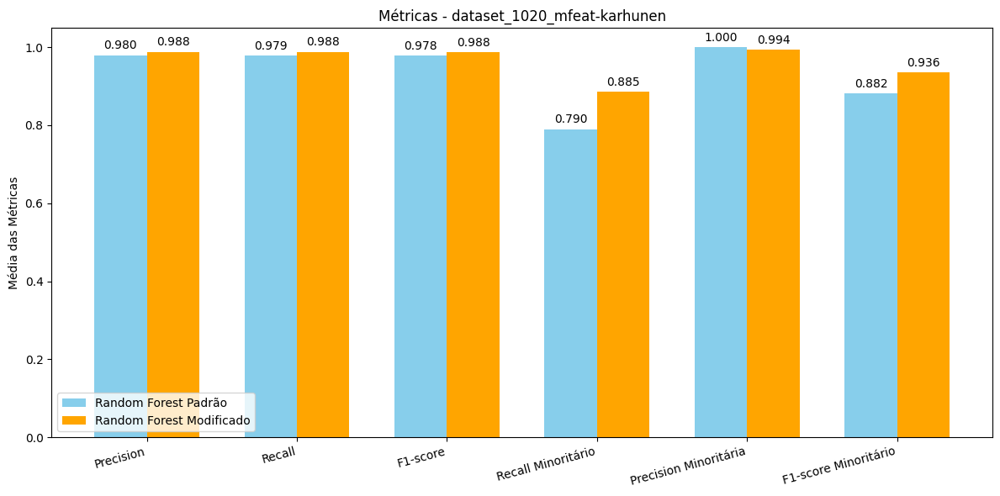


--- Avaliando: dataset_1059_ar1 ---
Padrão: {'Precision': np.float64(0.8565), 'Recall': np.float64(0.9173), 'F1-score': np.float64(0.8858), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.8831), 'Recall': np.float64(0.8923), 'F1-score': np.float64(0.8869), 'Recall Minoritário': np.float64(0.2), 'Precision Minoritária': np.float64(0.1667), 'F1-score Minoritário': np.float64(0.18)}


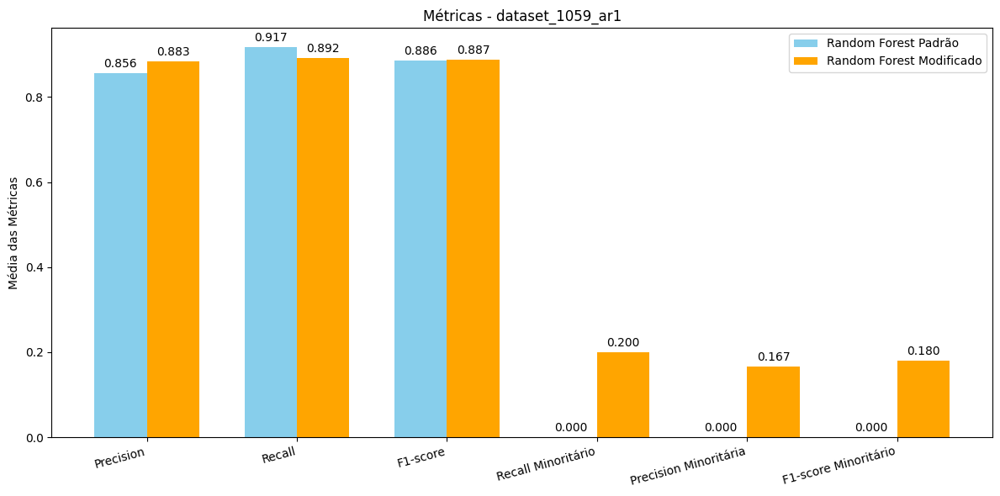


--- Avaliando: dataset_867_visualizing_livestock ---
Padrão: {'Precision': np.float64(0.7647), 'Recall': np.float64(0.8154), 'F1-score': np.float64(0.7732), 'Recall Minoritário': np.float64(0.2), 'Precision Minoritária': np.float64(0.4667), 'F1-score Minoritário': np.float64(0.2667)}
Modificado: {'Precision': np.float64(0.8326), 'Recall': np.float64(0.7923), 'F1-score': np.float64(0.805), 'Recall Minoritário': np.float64(0.68), 'Precision Minoritária': np.float64(0.4856), 'F1-score Minoritário': np.float64(0.5607)}


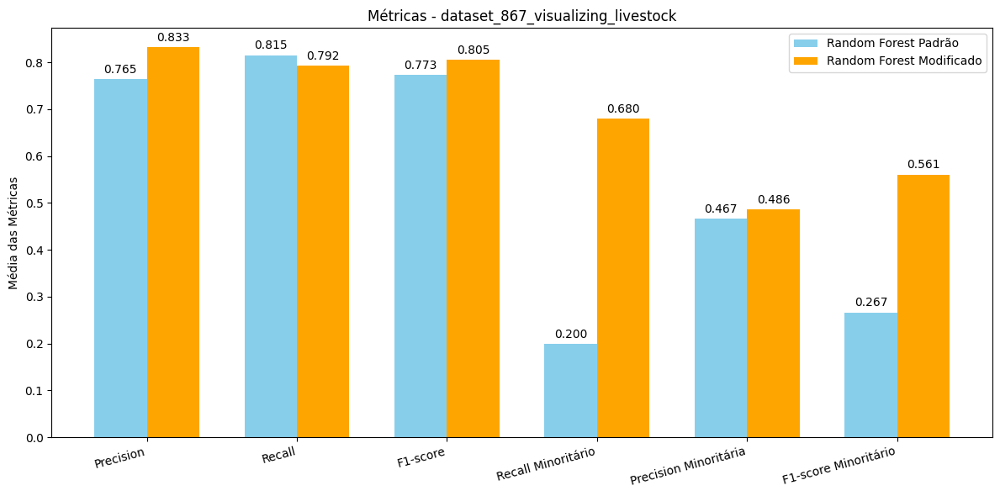


--- Avaliando: dataset_38_sick ---
Padrão: {'Precision': np.float64(0.8813), 'Recall': np.float64(0.9388), 'F1-score': np.float64(0.9091), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.9842), 'Recall': np.float64(0.9822), 'F1-score': np.float64(0.9829), 'Recall Minoritário': np.float64(0.9306), 'Precision Minoritária': np.float64(0.8124), 'F1-score Minoritário': np.float64(0.8663)}


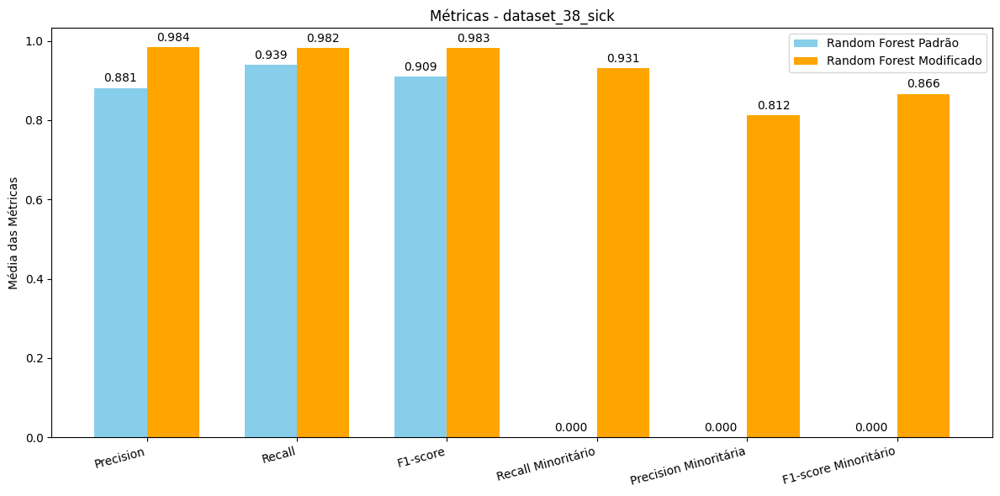


--- Avaliando: dataset_984_analcatdata_draft ---
Padrão: {'Precision': np.float64(0.8329), 'Recall': np.float64(0.9126), 'F1-score': np.float64(0.8709), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.8474), 'Recall': np.float64(0.8798), 'F1-score': np.float64(0.8614), 'Recall Minoritário': np.float64(0.0619), 'Precision Minoritária': np.float64(0.15), 'F1-score Minoritário': np.float64(0.0864)}


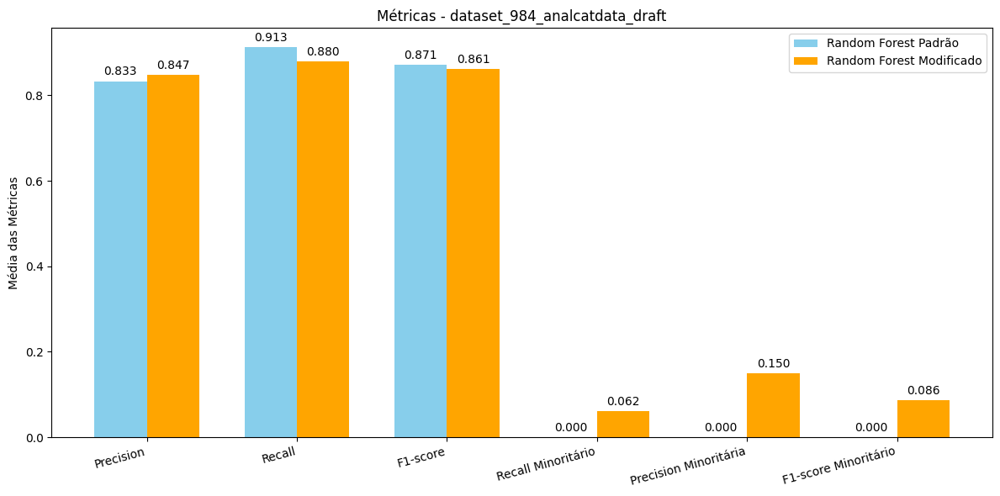


--- Avaliando: dataset_865_analcatdata_neavote ---
Padrão: {'Precision': np.float64(0.8655), 'Recall': np.float64(0.93), 'F1-score': np.float64(0.8964), 'Recall Minoritário': np.float64(0.0), 'Precision Minoritária': np.float64(0.0), 'F1-score Minoritário': np.float64(0.0)}
Modificado: {'Precision': np.float64(0.3618), 'Recall': np.float64(0.23), 'F1-score': np.float64(0.2396), 'Recall Minoritário': np.float64(0.8), 'Precision Minoritária': np.float64(0.07), 'F1-score Minoritário': np.float64(0.1281)}


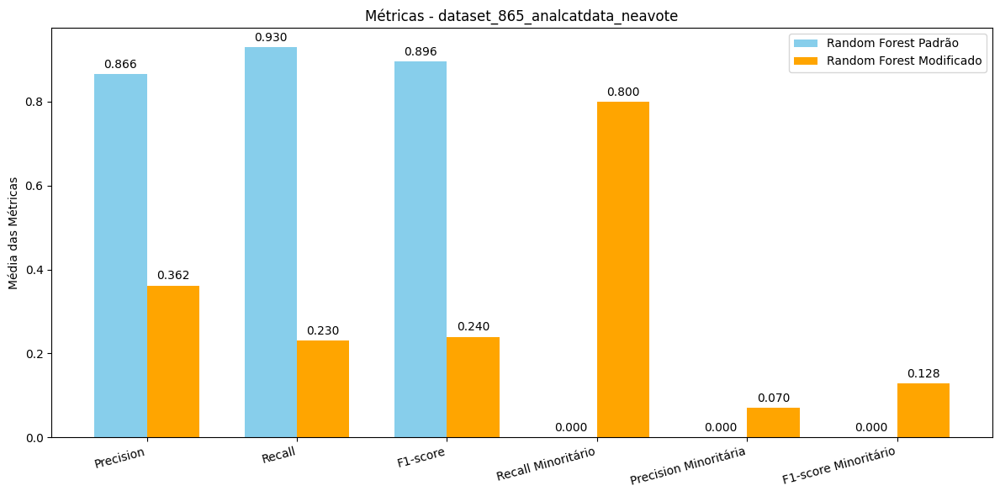


--- Avaliando: dataset_976_JapaneseVowels ---
Padrão: {'Precision': np.float64(0.98), 'Recall': np.float64(0.98), 'F1-score': np.float64(0.9797), 'Recall Minoritário': np.float64(0.8984), 'Precision Minoritária': np.float64(0.9764), 'F1-score Minoritário': np.float64(0.9357)}
Modificado: {'Precision': np.float64(0.9579), 'Recall': np.float64(0.9461), 'F1-score': np.float64(0.9488), 'Recall Minoritário': np.float64(0.9845), 'Precision Minoritária': np.float64(0.7565), 'F1-score Minoritário': np.float64(0.8555)}


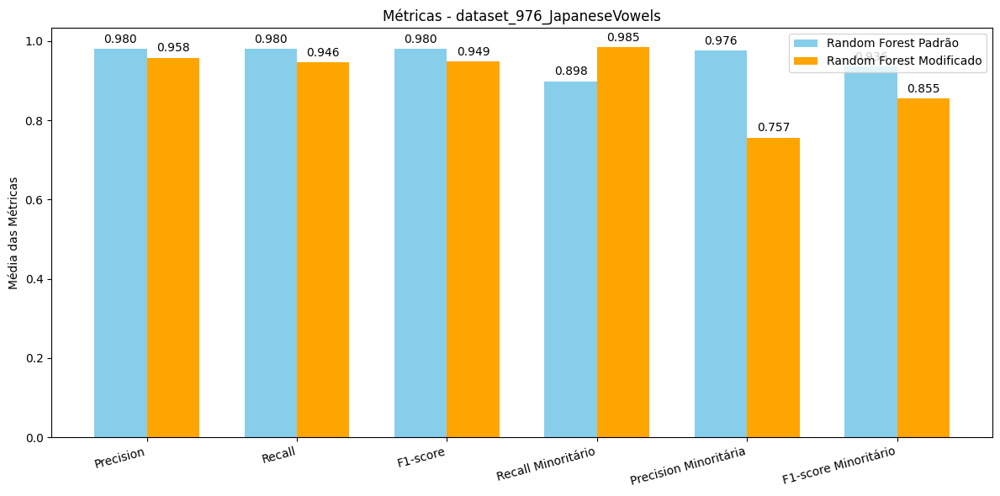

In [17]:
folder_path = "datasets_tratados/"
dataset_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]
dataset_names = [f.replace('.csv', '') for f in dataset_files]
n_splits = 5

labels = ['Precision', 'Recall', 'F1-score', 'Recall Minoritário', 'Precision Minoritária', 'F1-score Minoritário']
resultados_gerais = { 'dataset': [], 'tipo': [] }
for label in labels:
    resultados_gerais[label] = []

for file_name, dataset_name in zip(dataset_files, dataset_names):
    print(f"\n--- Avaliando: {dataset_name} ---")
    df = pd.read_csv(os.path.join(folder_path, file_name))
    X = df.iloc[:, :-1].values
    y = df.iloc[:, -1].values
    le = LabelEncoder()
    y = le.fit_transform(y)

    rf_antigo = RandomForestClassifier()
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=49)

    precision_antigo, recall_antigo, f1_antigo = [], [], []
    recall_minor_antigo, precision_minor_antigo, f1_minor_antigo = [], [], []

    precision_mod, recall_mod, f1_mod = [], [], []
    recall_minor_mod, precision_minor_mod, f1_minor_mod = [], [], []

    for train_idx, test_idx in skf.split(X, y):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # RF padrão
        rf_antigo.fit(X_train, y_train)
        pred_proba = rf_antigo.predict(X_test)
        pred_antigo = np.argmax(pred_proba, axis=1)

        precision_antigo.append(precision_score(y_test, pred_antigo, average='weighted', zero_division=0))
        recall_antigo.append(recall_score(y_test, pred_antigo, average='weighted', zero_division=0))
        f1_antigo.append(f1_score(y_test, pred_antigo, average='weighted', zero_division=0))

        unique_classes, counts = np.unique(y_test, return_counts=True)
        minor_class = unique_classes[np.argmin(counts)]

        recall_minor_antigo.append(recall_score(y_test, pred_antigo, labels=[minor_class], average='macro', zero_division=0))
        precision_minor_antigo.append(precision_score(y_test, pred_antigo, pos_label=minor_class, zero_division=0))
        f1_minor_antigo.append(f1_score(y_test, pred_antigo, pos_label=minor_class, zero_division=0))

        # RF modificado
        class_weights = calcular_class_weights(y_train)
        focal_gamma = escolher_focal_gamma(y_train)
        params = escolher_parametros(y_train)

        rf_modificado = RandomForestClassifier2(
            n_estimators=50,
            max_depth=params['max_depth'],
            min_samples_split=params['min_samples_split'],
            class_weights=class_weights,
            focal_gamma=focal_gamma,
            n_jobs=-1
        )
        rf_modificado.fit(X_train, y_train)
        pred_mod = rf_modificado.predict(X_test)

        precision_mod.append(precision_score(y_test, pred_mod, average='weighted', zero_division=0))
        recall_mod.append(recall_score(y_test, pred_mod, average='weighted', zero_division=0))
        f1_mod.append(f1_score(y_test, pred_mod, average='weighted', zero_division=0))

        recall_minor_mod.append(recall_score(y_test, pred_mod, labels=[minor_class], average='macro', zero_division=0))
        precision_minor_mod.append(precision_score(y_test, pred_mod, pos_label=minor_class, zero_division=0))
        f1_minor_mod.append(f1_score(y_test, pred_mod, pos_label=minor_class, zero_division=0))

    # Calcular médias
    antigo_means = [
        np.mean(precision_antigo),
        np.mean(recall_antigo),
        np.mean(f1_antigo),
        np.mean(recall_minor_antigo),
        np.mean(precision_minor_antigo),
        np.mean(f1_minor_antigo)
    ]

    mod_means = [
        np.mean(precision_mod),
        np.mean(recall_mod),
        np.mean(f1_mod),
        np.mean(recall_minor_mod),
        np.mean(precision_minor_mod),
        np.mean(f1_minor_mod)
    ]

    print(f"Padrão: {dict(zip(labels, map(lambda x: round(x, 4), antigo_means)))}")
    print(f"Modificado: {dict(zip(labels, map(lambda x: round(x, 4), mod_means)))}")

    for tipo, medias in zip(['Padrão', 'Modificado'], [antigo_means, mod_means]):
        resultados_gerais['dataset'].append(dataset_name)
        resultados_gerais['tipo'].append(tipo)
        for label, valor in zip(labels, medias):
            resultados_gerais[label].append(valor)

    # Gráfico comparativo
    x = np.arange(len(labels))
    width = 0.35
    fig, ax = plt.subplots(figsize=(12, 6))
    bars1 = ax.bar(x - width/2, antigo_means, width, label='Random Forest Padrão', color='skyblue')
    bars2 = ax.bar(x + width/2, mod_means, width, label='Random Forest Modificado', color='orange')

    ax.set_ylabel('Média das Métricas')
    ax.set_title(f'Métricas - {dataset_name}')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=15, ha='right')
    ax.legend()

    def autolabel(bars):
        for bar in bars:
            height = bar.get_height()
            ax.annotate(f'{height:.3f}',
                        xy=(bar.get_x() + bar.get_width()/2, height),
                        xytext=(0, 3),
                        textcoords="offset points",
                        ha='center', va='bottom')

    autolabel(bars1)
    autolabel(bars2)
    plt.tight_layout()
    plt.show()

## Teste de Wilcoxon 


Para comparar o desempenho do Random Forest Padrão com o Random Forest Modificado, utilizamos o Teste de Wilcoxon, um teste estatístico não-paramétrico adequado para comparar duas amostras relacionadas (neste caso, as métricas obtidas em diferentes folds de validação cruzada para os dois modelos).

### Porque usar o Teste de Wilcoxon?
- Comparação de amostras emparelhadas: Cada métrica do modelo modificado é comparada diretamente com a métrica correspondente do modelo padrão, controlando a variabilidade dentro do conjunto de dados.

- Não exige distribuição normal: O Wilcoxon não pressupõe que as diferenças entre as amostras sigam uma distribuição normal, o que é importante quando temos métricas que podem não ser normalmente distribuídas.


#### Comparação das métricas dos dois algoritmos

In [18]:
# resultados por dataset
df_resultados = pd.DataFrame(resultados_gerais)

# Teste de Wilcoxon
print("\n Teste de Wilcoxon (Padrão vs Modificado):")
df_padrao = df_resultados[df_resultados['tipo'] == 'Padrão'].sort_values('dataset')
df_mod = df_resultados[df_resultados['tipo'] == 'Modificado'].sort_values('dataset')

wilcoxon_resultados = {
    'Métrica': [],
    'Estatística': [],
    'p-valor': [],
    'Confiança (%)': [],
    'Significativo (<0.05)': []
}

for metric in labels:
    try:
        stat, p = wilcoxon(df_padrao[metric], df_mod[metric])
        sig = "✔️" if p < 0.05 else "✖️"
        confianca = (1 - p) * 100
        print(f"{metric:<25} | Estatística: {stat:.3f}, p-valor: {p} | Confiança: {confianca:.2f}% {sig}")
        wilcoxon_resultados['Métrica'].append(metric)
        wilcoxon_resultados['Estatística'].append(stat)
        wilcoxon_resultados['p-valor'].append(p)
        wilcoxon_resultados['Confiança (%)'].append(confianca)
        wilcoxon_resultados['Significativo (<0.05)'].append(sig)
    except ValueError as e:
        print(f"{metric:<25} | Erro: {e}")


 Teste de Wilcoxon (Padrão vs Modificado):
Precision                 | Estatística: 238.000, p-valor: 0.00033094346101456083 | Confiança: 99.97% ✔️
Recall                    | Estatística: 349.000, p-valor: 0.014232924124898775 | Confiança: 98.58% ✔️
F1-score                  | Estatística: 445.000, p-valor: 0.1424615059455322 | Confiança: 85.75% ✖️
Recall Minoritário        | Estatística: 0.000, p-valor: 3.5210680544173636e-09 | Confiança: 100.00% ✔️
Precision Minoritária     | Estatística: 333.000, p-valor: 0.03729196101200498 | Confiança: 96.27% ✔️
F1-score Minoritário      | Estatística: 98.000, p-valor: 5.014945488742964e-07 | Confiança: 100.00% ✔️


#### Comparação global dos dois algoritmos

In [19]:
# Ordena para garantir alinhamento
df_padrao = df_resultados[df_resultados['tipo'] == 'Padrão'].sort_values('dataset')
df_mod = df_resultados[df_resultados['tipo'] == 'Modificado'].sort_values('dataset')

# Combina todas as métricas em vetores únicos
global_padrao = []
global_mod = []

for metric in labels:
    global_padrao.extend(df_padrao[metric].tolist())
    global_mod.extend(df_mod[metric].tolist())


# Teste Wilcoxon Global
print("\n Teste de Wilcoxon Global (todas métricas combinadas):")
try:
    stat, p = wilcoxon(global_padrao, global_mod)
    confianca = (1 - p) * 100
    sig = "✔️" if p < 0.05 else "✖️"
    print(f"  Estatística: {stat:.3f}, p-valor: {p} | Confiança: {confianca:.2f}% {sig}")
except ValueError as e:
    print(f"Erro no teste Wilcoxon global: {e}")


 Teste de Wilcoxon Global (todas métricas combinadas):
  Estatística: 9823.000, p-valor: 9.122502981349914e-14 | Confiança: 100.00% ✔️


### Melhoria Percentual do RF Modificado sobre o Padrão

In [20]:
print("\nMelhoria percentual média por métrica:")

melhorias = []
for metric in labels:
    media_padrao = df_padrao[metric].mean()
    media_mod = df_mod[metric].mean()
    
    # Cálculo da melhoria percentual relativa
    melhoria_percentual = ((media_mod - media_padrao) / media_padrao) * 100
    
    # Definição do símbolo para mostrar melhora ou piora
    simbolo = "🔼" if melhoria_percentual > 0 else "🔽"
    
    print(f"  {metric:<25} | Média Padrão: {media_padrao:.4f} | Média Modificado: {media_mod:.4f} | Melhoria: {melhoria_percentual:+.2f}% {simbolo}")
    
    melhorias.append(melhoria_percentual)

# Melhoria percentual global média
melhoria_global = sum(melhorias) / len(melhorias)
simbolo_global = "🔼" if melhoria_global > 0 else "🔽"
print(f"\nMelhoria percentual global média do Random Forest Modificado sobre o Padrão: {melhoria_global:+.2f}% {simbolo_global}")


Melhoria percentual média por métrica:
  Precision                 | Média Padrão: 0.8971 | Média Modificado: 0.9177 | Melhoria: +2.30% 🔼
  Recall                    | Média Padrão: 0.9325 | Média Modificado: 0.8992 | Melhoria: -3.57% 🔽
  F1-score                  | Média Padrão: 0.9097 | Média Modificado: 0.9028 | Melhoria: -0.75% 🔽
  Recall Minoritário        | Média Padrão: 0.3679 | Média Modificado: 0.6773 | Melhoria: +84.09% 🔼
  Precision Minoritária     | Média Padrão: 0.5124 | Média Modificado: 0.6074 | Melhoria: +18.54% 🔼
  F1-score Minoritário      | Média Padrão: 0.4076 | Média Modificado: 0.6098 | Melhoria: +49.62% 🔼

Melhoria percentual global média do Random Forest Modificado sobre o Padrão: +25.04% 🔼


# Análise de Resultados: Random Forest em Conjuntos com Desequilíbrio de Classes

Os testes estatísticos e comparações de desempenho indicam que o modelo Random Forest Modificado apresenta melhorias consistentes em relação à versão padrão, mesmo que as diferenças absolutas pareçam pequenas à primeira vista. 

## Teste de Wilcoxon
Todas as métricas, com exceção do Recall e F1-score gerais, apresentaram p-valores extremamente baixos (p < 0.05), indicando diferenças estatisticamente significativas a favor do modelo modificado. A confiança estatística muito elevada em quase todas as métricas também reforça essa conclusão. 

O teste global de Wilcoxon, que avalia a performance geral de todas as métricas, reforça esse resultado, com um p-valor extremamente pequeno, confirmando a superioridade estatística geral do modelo modificado. 


## Melhoria Percentual por Métrica
Apesar dos valores médios estarem muito próximos, é importante considerar que os modelos já se encontram numa faixa de alta performance (valores próximos de 1). Nesse contexto, pequenas variações representam melhorias relevantes: 

🔼 F1-score Minoritário 

🔼 Recall Minoritário 

🔼 Precision Minoritária 

🔼 Precision Geral 

🔽 Recall & F1-score Geral 

As únicas quedas ocorrem no Recall e no F1-score geral, que teve um leve declínio. Isso sugere um possível trade-off natural entre o foco na classe minoritária e o desempenho global. Ao otimizar o desempenho para a classe minoritária, o modelo pode ter reduzido ligeiramente a sua capacidade de manter o equilíbrio nas métricas globais. 

A melhoria percentual global média foi de aproximadamente +25%, impulsionada principalmente pelas métricas da classe minoritária. Embora essa média possa parecer modesta em termos absolutos, ela é altamente significativa em modelos com alta performance como o Random Forest, especialmente em tarefas críticas do mundo real — como em aplicações médicas, financeiras ou de segurança. 

# Complicações durante o desenvolvimento do Projeto

Durante o desenvolvimento e avaliação do modelo Random Forest Modificado, identificamos algumas complicações relevantes: 

- **Desbalanceamento extremo de classes**: Apesar das melhorias observadas em métricas relacionadas com a classe minoritária, a alta disparidade entre classes dificultou a obtenção de ganhos consistentes sem afetar negativamente outras métricas. 

- **Trade-offs entre métricas**: O modelo modificado apresentou melhor recall para a classe minoritária, mas à custa de uma leve queda na precisão dessa mesma classe. Isso reflete um comportamento comum em cenários de desequilíbrio, onde otimizar uma métrica pode prejudicar outra. 

- **Diferenças marginais de desempenho**: Como o modelo padrão já apresentava resultados elevados, as melhorias absolutas pareceram pequenas, mesmo sendo estatisticamente significativas. 

- **Limitações computacionais**: O uso de abordagens modificadas, especialmente quando envolvem reamostragem, ponderação ou ajustes internos, pode aumentar o tempo de processamento e exigir mais recursos computacionais, principalmente em conjuntos de dados maiores. 

# Trabalho Futuro
Para trabalho futuro, além das melhorias mais tradicionais (como a afinação de hiperparâmetros ou exploração de métodos de ensemble), o modelo poderá evoluir no sentido de incorporar comportamentos inteligentes que reduzem o overfitting ainda observado em alguns datasets, onde as decisões internas do classificador se ajustam de forma dinâmica ao longo do processo de treino ou classificação. 

- **Ciclos Iterativos com Interpretabilidade**


Técnicas explicativas como SHAP ou LIME podem ser usadas não apenas para interpretar decisões do modelo, mas também como ferramentas para detectar sinais de overfitting, por exemplo, quando certas variáveis dominam excessivamente as decisões nas árvores. A partir disso, seria possível construir um ciclo de feedback onde o modelo é ajustado iterativamente, com foco em generalizar melhor sem comprometer a identificação da classe minoritária.


- **Robustez Adversarial Focada na Classe Minoritária**

Uma proposta inovadora seria aplicar testes adversariais direcionados à classe minoritária, de forma a avaliar o impacto que pequenas perturbações nos exemplos dessa classe causam na estabilidade do modelo. Esse tipo de teste revelaria o quanto o modelo realmente aprendeu os padrões da classe minoritária, e não apenas memorizações — ajudando a combater o overfitting de forma mais inteligente e focada.

# Conclusão

O Random Forest Modificado demonstrou melhorias estatisticamente significativas e consistentes em quase todas as métricas avaliadas, especialmente no que diz respeito à classe minoritária — um aspecto crucial em problemas de desequilíbrio de classes. Embora haja uma pequena redução no recall e f1-score gerais, destacamos a sua capacidade de lidar melhor com a classe minoritária, resultando assim numa performance mais equilibrada. 
Esses resultados apoiam a utilização do modelo modificado em cenários de desbalanceamento onde a classe minoritária pode ser uma prioridade. 

Concluindo, através da elaboração deste projeto, fomos capazes de desenvolver competências úteis para futuras análises de dados, otimizações de algoritmos já conhecidos e aprimorar a nossa capacidade de reconhecimento de complicações de datasets e possíveis soluções. 